<a href="https://colab.research.google.com/github/shanilmohd/Tacotron2-Text-to-Speech-model/blob/main/Tacotron_2_TTS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('drive', force_remount=True)

Mounted at drive


In [2]:

%matplotlib inline
import os
import io
%cd /content/
if not os.path.isdir("/content/TTS-TT2/"):
  print("Cloning justinjohn0306/TTS-TT2")
  !git clone https://github.com/justinjohn0306/ARPAtaco2.git TTS-TT2
  %cd /content/TTS-TT2/
  !git submodule init
  !git submodule update
%cd /content/TTS-TT2/
#NVIDIA's requirements
#I believe Colab gives us PyTorch and TF by default so we don't need anything else
#Versions specified in requirements.txt have conflicts so that's why we simply get current versions
print("Downloading tacotron2 requirements")
!pip install matplotlib numpy inflect scipy Unidecode pillow
#Our requirements
#We'll need gdown to download some really cool things
!pip install git+https://github.com/wkentaro/gdown.git
import gdown
!git submodule init
!git submodule update
!pip install ffmpeg-normalize
!pip install -q unidecode tensorboardX
!apt-get -qq install sox
!apt-get install pv
!apt-get install jq
!wget https://raw.githubusercontent.com/tonikelope/megadown/master/megadown -O megadown.sh
!chmod 755 megadown.sh
#Download NVIDIA's LJSpeech model
tt2_pretrained = "https://drive.google.com/uc?id=1c5ZTuT7J08wLUoVZ2KkUs_VdZuJ86ZqA"
if not os.path.isfile("/content/TTS-TT2/pretrained_model"):
  print("Downloading tt2 pretrained")
  gdown.download(tt2_pretrained, "/content/TTS-TT2/pretrained_model", quiet=False)

latest_downloaded = None

import time
import logging

logging.getLogger('matplotlib').setLevel(logging.WARNING)
logging.getLogger('numba').setLevel(logging.WARNING)
logging.getLogger('librosa').setLevel(logging.WARNING)


import argparse
import math
from numpy import finfo

import torch
from distributed import apply_gradient_allreduce
import torch.distributed as dist
from torch.utils.data.distributed import DistributedSampler
from torch.utils.data import DataLoader

from model import Tacotron2
from data_utils import TextMelLoader, TextMelCollate
from loss_function import Tacotron2Loss
from logger import Tacotron2Logger
from hparams import create_hparams

import random
import numpy as np

import layers
from utils import load_wav_to_torch, load_filepaths_and_text
from text import text_to_sequence
from math import e
#from tqdm import tqdm # Terminal
#from tqdm import tqdm_notebook as tqdm # Legacy Notebook TQDM
from tqdm.notebook import tqdm # Modern Notebook TQDM
from distutils.dir_util import copy_tree
import matplotlib.pylab as plt

def download_from_google_drive(file_id, file_name):
  # download a file from the Google Drive link
  !rm -f ./cookie
  !curl -c ./cookie -s -L "https://drive.google.com/uc?export=download&id={file_id}" > /dev/null
  confirm_text = !awk '/download/ {print $NF}' ./cookie
  confirm_text = confirm_text[0]
  !curl -Lb ./cookie "https://drive.google.com/uc?export=download&confirm={confirm_text}&id={file_id}" -o {file_name}

def create_mels():
    print("Generating Mels")
    stft = layers.TacotronSTFT(
                hparams.filter_length, hparams.hop_length, hparams.win_length,
                hparams.n_mel_channels, hparams.sampling_rate, hparams.mel_fmin,
                hparams.mel_fmax)
    def save_mel(filename):
        audio, sampling_rate = load_wav_to_torch(filename)
        if sampling_rate != stft.sampling_rate:
            raise ValueError("{} {} SR doesn't match target {} SR".format(filename,
                sampling_rate, stft.sampling_rate))
        audio_norm = audio / hparams.max_wav_value
        audio_norm = audio_norm.unsqueeze(0)
        audio_norm = torch.autograd.Variable(audio_norm, requires_grad=False)
        melspec = stft.mel_spectrogram(audio_norm)
        melspec = torch.squeeze(melspec, 0).cpu().numpy()
        np.save(filename.replace('.wav', ''), melspec)

    import glob
    wavs = glob.glob('wavs/*.wav')
    for i in tqdm(wavs):
        save_mel(i)


def reduce_tensor(tensor, n_gpus):
    rt = tensor.clone()
    dist.all_reduce(rt, op=dist.reduce_op.SUM)
    rt /= n_gpus
    return rt


def init_distributed(hparams, n_gpus, rank, group_name):
    assert torch.cuda.is_available(), "Distributed mode requires CUDA."
    print("Initializing Distributed")

    # Set cuda device so everything is done on the right GPU.
    torch.cuda.set_device(rank % torch.cuda.device_count())

    # Initialize distributed communication
    dist.init_process_group(
        backend=hparams.dist_backend, init_method=hparams.dist_url,
        world_size=n_gpus, rank=rank, group_name=group_name)

    print("Done initializing distributed")


def prepare_dataloaders(hparams):
    # Get data, data loaders and collate function ready
    trainset = TextMelLoader(hparams.training_files, hparams)
    valset = TextMelLoader(hparams.validation_files, hparams)
    collate_fn = TextMelCollate(hparams.n_frames_per_step)

    if hparams.distributed_run:
        train_sampler = DistributedSampler(trainset)
        shuffle = False
    else:
        train_sampler = None
        shuffle = True

    train_loader = DataLoader(trainset, num_workers=1, shuffle=shuffle,
                              sampler=train_sampler,
                              batch_size=hparams.batch_size, pin_memory=False,
                              drop_last=True, collate_fn=collate_fn)
    return train_loader, valset, collate_fn


def prepare_directories_and_logger(output_directory, log_directory, rank):
    if rank == 0:
        if not os.path.isdir(output_directory):
            os.makedirs(output_directory)
            os.chmod(output_directory, 0o775)
        logger = Tacotron2Logger(os.path.join(output_directory, log_directory))
    else:
        logger = None
    return logger


def load_model(hparams):
    model = Tacotron2(hparams).cuda()
    if hparams.fp16_run:
        model.decoder.attention_layer.score_mask_value = finfo('float16').min

    if hparams.distributed_run:
        model = apply_gradient_allreduce(model)

    return model


def warm_start_model(checkpoint_path, model, ignore_layers):
    assert os.path.isfile(checkpoint_path)
    print("Warm starting model from checkpoint '{}'".format(checkpoint_path))
    checkpoint_dict = torch.load(checkpoint_path, map_location='cpu')
    model_dict = checkpoint_dict['state_dict']
    if len(ignore_layers) > 0:
        model_dict = {k: v for k, v in model_dict.items()
                      if k not in ignore_layers}
        dummy_dict = model.state_dict()
        dummy_dict.update(model_dict)
        model_dict = dummy_dict
    model.load_state_dict(model_dict)
    return model


def load_checkpoint(checkpoint_path, model, optimizer):
    assert os.path.isfile(checkpoint_path)
    print("Loading checkpoint '{}'".format(checkpoint_path))
    checkpoint_dict = torch.load(checkpoint_path, map_location='cpu')
    model.load_state_dict(checkpoint_dict['state_dict'])
    optimizer.load_state_dict(checkpoint_dict['optimizer'])
    learning_rate = checkpoint_dict['learning_rate']
    iteration = checkpoint_dict['iteration']
    print("Loaded checkpoint '{}' from iteration {}" .format(
        checkpoint_path, iteration))
    return model, optimizer, learning_rate, iteration


def save_checkpoint(model, optimizer, learning_rate, iteration, filepath):
    import random
    if True:
        print("Saving model and optimizer state at iteration {} to {}".format(
            iteration, filepath))
        try:
            torch.save({'iteration': iteration,
                    'state_dict': model.state_dict(),
                    'optimizer': optimizer.state_dict(),
                    'learning_rate': learning_rate}, filepath)
        except KeyboardInterrupt:
            print("interrupt received while saving, waiting for save to complete.")
            torch.save({'iteration': iteration,'state_dict': model.state_dict(),'optimizer': optimizer.state_dict(),'learning_rate': learning_rate}, filepath)
        print("Model Saved")

def plot_alignment(alignment, info=None):
    %matplotlib inline
    fig, ax = plt.subplots(figsize=(int(alignment_graph_width/100), int(alignment_graph_height/100)))
    im = ax.imshow(alignment, cmap='inferno', aspect='auto', origin='lower',
                   interpolation='none')
    ax.autoscale(enable=True, axis="y", tight=True)
    fig.colorbar(im, ax=ax)
    xlabel = 'Decoder timestep'
    if info is not None:
        xlabel += '\n\n' + info
    plt.xlabel(xlabel)
    plt.ylabel('Encoder timestep')
    plt.tight_layout()
    fig.canvas.draw()
    plt.show()

def validate(model, criterion, valset, iteration, batch_size, n_gpus,
             collate_fn, logger, distributed_run, rank, epoch, start_eposh, learning_rate):
    """Handles all the validation scoring and printing"""
    model.eval()
    with torch.no_grad():
        val_sampler = DistributedSampler(valset) if distributed_run else None
        val_loader = DataLoader(valset, sampler=val_sampler, num_workers=1,
                                shuffle=False, batch_size=batch_size,
                                pin_memory=False, collate_fn=collate_fn)

        val_loss = 0.0
        for i, batch in enumerate(val_loader):
            x, y = model.parse_batch(batch)
            y_pred = model(x)
            loss = criterion(y_pred, y)
            if distributed_run:
                reduced_val_loss = reduce_tensor(loss.data, n_gpus).item()
            else:
                reduced_val_loss = loss.item()
            val_loss += reduced_val_loss
        val_loss = val_loss / (i + 1)

    model.train()
    if rank == 0:
        print("Epoch: {} Validation loss {}: {:9f}  Time: {:.1f}m LR: {:.6f}".format(epoch, iteration, val_loss,(time.perf_counter()-start_eposh)/60, learning_rate))
        logger.log_validation(val_loss, model, y, y_pred, iteration)
        if hparams.show_alignments:
            %matplotlib inline
            _, mel_outputs, gate_outputs, alignments = y_pred
            idx = random.randint(0, alignments.size(0) - 1)
            plot_alignment(alignments[idx].data.cpu().numpy().T)

def train(output_directory, log_directory, checkpoint_path, warm_start, n_gpus,
          rank, group_name, hparams, log_directory2, save_interval, backup_interval):
    """Training and validation logging results to tensorboard and stdout

    Params
    ------
    output_directory (string): directory to save checkpoints
    log_directory (string) directory to save tensorboard logs
    checkpoint_path(string): checkpoint path
    n_gpus (int): number of gpus
    rank (int): rank of current gpu
    hparams (object): comma separated list of "name=value" pairs.
    """
    if hparams.distributed_run:
        init_distributed(hparams, n_gpus, rank, group_name)

    torch.manual_seed(hparams.seed)
    torch.cuda.manual_seed(hparams.seed)

    model = load_model(hparams)
    learning_rate = hparams.learning_rate
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate,
                                 weight_decay=hparams.weight_decay)

    if hparams.fp16_run:
        from apex import amp
        model, optimizer = amp.initialize(
            model, optimizer, opt_level='O2')

    if hparams.distributed_run:
        model = apply_gradient_allreduce(model)

    criterion = Tacotron2Loss()

    logger = prepare_directories_and_logger(
        output_directory, log_directory, rank)

    train_loader, valset, collate_fn = prepare_dataloaders(hparams)

    # Load checkpoint if one exists
    iteration = 0
    epoch_offset = 0
    if checkpoint_path is not None and os.path.isfile(checkpoint_path):
        if warm_start:
            model = warm_start_model(
                checkpoint_path, model, hparams.ignore_layers)
        else:
            model, optimizer, _learning_rate, iteration = load_checkpoint(
                checkpoint_path, model, optimizer)
            if hparams.use_saved_learning_rate:
                learning_rate = _learning_rate
            iteration += 1  # next iteration is iteration + 1
            epoch_offset = max(0, int(iteration / len(train_loader)))
    else:
      os.path.isfile("/content/TTS-TT2/pretrained_model")
      %cd /dev/null
      !/content/TTS-TT2/megadown.sh https://mega.nz/#!WXY3RILA!KyoGHtfB_sdhmLFoykG2lKWhh0GFdwMkk7OwAjpQHRo --o pretrained_model
      %cd /content/TTS-TT2
      model = warm_start_model("/content/TTS-TT2/pretrained_model", model, hparams.ignore_layers)
      # download LJSpeech pretrained model if no checkpoint already exists

    start_eposh = time.perf_counter()
    learning_rate = 0.0
    model.train()
    is_overflow = False
    # ================ MAIN TRAINNIG LOOP! ===================
    for epoch in tqdm(range(epoch_offset, hparams.epochs)):
        print("\nStarting Epoch: {} Iteration: {}".format(epoch, iteration))
        start_eposh = time.perf_counter()
        for i, batch in tqdm(enumerate(train_loader), total=len(train_loader)):
            start = time.perf_counter()
            if iteration < hparams.decay_start: learning_rate = hparams.A_
            else: iteration_adjusted = iteration - hparams.decay_start; learning_rate = (hparams.A_*(e**(-iteration_adjusted/hparams.B_))) + hparams.C_
            learning_rate = max(hparams.min_learning_rate, learning_rate) # output the largest number
            for param_group in optimizer.param_groups:
                param_group['lr'] = learning_rate

            model.zero_grad()
            x, y = model.parse_batch(batch)
            y_pred = model(x)

            loss = criterion(y_pred, y)
            if hparams.distributed_run:
                reduced_loss = reduce_tensor(loss.data, n_gpus).item()
            else:
                reduced_loss = loss.item()
            if hparams.fp16_run:
                with amp.scale_loss(loss, optimizer) as scaled_loss:
                    scaled_loss.backward()
            else:
                loss.backward()

            if hparams.fp16_run:
                grad_norm = torch.nn.utils.clip_grad_norm_(
                    amp.master_params(optimizer), hparams.grad_clip_thresh)
                is_overflow = math.isnan(grad_norm)
            else:
                grad_norm = torch.nn.utils.clip_grad_norm_(
                    model.parameters(), hparams.grad_clip_thresh)

            optimizer.step()

            if not is_overflow and rank == 0:
                duration = time.perf_counter() - start
                logger.log_training(
                    reduced_loss, grad_norm, learning_rate, duration, iteration)
                #print("Batch {} loss {:.6f} Grad Norm {:.6f} Time {:.6f}".format(iteration, reduced_loss, grad_norm, duration), end='\r', flush=True)

            iteration += 1
        validate(model, criterion, valset, iteration,
                 hparams.batch_size, n_gpus, collate_fn, logger,
                 hparams.distributed_run, rank, epoch, start_eposh, learning_rate)
        if (epoch+1) % save_interval == 0 or (epoch+1) == hparams.epochs: # not sure if the latter is necessary
            save_checkpoint(model, optimizer, learning_rate, iteration, checkpoint_path)
        if backup_interval > 0 and (epoch+1) % backup_interval == 0:
            save_checkpoint(model, optimizer, learning_rate, iteration, checkpoint_path + "_epoch_%s" % (epoch+1))
        if log_directory2 != None:
            copy_tree(log_directory, log_directory2)
def check_dataset(hparams):
    from utils import load_wav_to_torch, load_filepaths_and_text
    import os
    import numpy as np
    def check_arr(filelist_arr):
        for i, file in enumerate(filelist_arr):
            if len(file) > 2:
                print("|".join(file), "\nhas multiple '|', this may not be an error.")
            if hparams.load_mel_from_disk and '.wav' in file[0]:
                print("[WARNING]", file[0], " in filelist while expecting .npy .")
            else:
                if not hparams.load_mel_from_disk and '.npy' in file[0]:
                    print("[WARNING]", file[0], " in filelist while expecting .wav .")
            if (not os.path.exists(file[0])):
                print("|".join(file), "\n[WARNING] does not exist.")
            if len(file[1]) < 3:
                print("|".join(file), "\n[info] has no/very little text.")
            if not ((file[1].strip())[-1] in r"!?,.;:"):
                print("|".join(file), "\n[info] has no ending punctuation.")
            mel_length = 1
            if hparams.load_mel_from_disk and '.npy' in file[0]:
                melspec = torch.from_numpy(np.load(file[0], allow_pickle=True))
                mel_length = melspec.shape[1]
            if mel_length == 0:
                print("|".join(file), "\n[WARNING] has 0 duration.")
    print("Checking Training Files")
    audiopaths_and_text = load_filepaths_and_text(hparams.training_files) # get split lines from training_files text file.
    check_arr(audiopaths_and_text)
    print("Checking Validation Files")
    audiopaths_and_text = load_filepaths_and_text(hparams.validation_files) # get split lines from validation_files text file.
    check_arr(audiopaths_and_text)
    print("Finished Checking")

warm_start=False#sorry bout that
n_gpus=1
rank=0
group_name=None

# ---- DEFAULT PARAMETERS DEFINED HERE ----
hparams = create_hparams()
model_filename = 'current_model'
hparams.training_files = "filelists/clipper_train_filelist.txt"
hparams.validation_files = "filelists/clipper_val_filelist.txt"
hparams.p_attention_dropout=0.1
hparams.p_decoder_dropout=0.1
hparams.decay_start = 15000
hparams.A_ = 5e-4
hparams.B_ = 8000
hparams.C_ = 0
hparams.min_learning_rate = 1e-5
generate_mels = True
hparams.show_alignments = True
alignment_graph_height = 600
alignment_graph_width = 1000
hparams.batch_size = 32
hparams.load_mel_from_disk = True
hparams.ignore_layers = []
hparams.epochs = 10000
torch.backends.cudnn.enabled = hparams.cudnn_enabled
torch.backends.cudnn.benchmark = hparams.cudnn_benchmark
output_directory = '/content/drive/My Drive/colab/outdir' # Location to save Checkpoints
log_directory = '/content/TTS-TT2/logs' # Location to save Log files locally
log_directory2 = '/content/drive/My Drive/colab/logs' # Location to copy log files (done at the end of each epoch to cut down on I/O)
checkpoint_path = output_directory+(r'/')+model_filename

# ---- Replace .wav with .npy in filelists ----
!sed -i -- 's,.wav|,.npy|,g' filelists/*.txt
!sed -i -- 's,.wav|,.npy|,g' {hparams.training_files}
!sed -i -- 's,.wav|,.npy|,g' {hparams.validation_files}
# ---- Replace .wav with .npy in filelists ----

%cd /content/TTS-TT2

data_path = 'wavs'
!mkdir {data_path}

/content
Cloning justinjohn0306/TTS-TT2
Cloning into 'TTS-TT2'...
remote: Enumerating objects: 89, done.
remote: Counting objects: 100% (9/9), done.
remote: Compressing objects: 100% (9/9), done.
remote: Total 89 (delta 2), reused 0 (delta 0), pack-reused 80
Unpacking objects: 100% (89/89), 7.11 MiB | 2.99 MiB/s, done.
/content/TTS-TT2
/content/TTS-TT2
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.9/235.9 kB 6.3 MB/s eta 0:00:00
  Cloning https://github.com/wkentaro/gdown.git to /tmp/pip-req-build-0atbjx5b
  Running command git clone --filter=blob:none --quiet https://github.com/wkentaro/gdown.git /tmp/pip-req-build-0atbjx5b
  Resolved https://github.com/wkentaro/gdown.git to commit 5c7507f02718048899b85d4010a6ed93316cbf27
  Running command git submodule update --init --recursive -q
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for gdown: filename=gdown-4.7.1-py3-none-any.whl siz

Downloading...
From (original): https://drive.google.com/uc?id=1c5ZTuT7J08wLUoVZ2KkUs_VdZuJ86ZqA
From (redirected): https://drive.google.com/uc?id=1c5ZTuT7J08wLUoVZ2KkUs_VdZuJ86ZqA&confirm=t&uuid=25a7b855-279a-486f-81bc-a8171ac81641
To: /content/TTS-TT2/pretrained_model
100%|██████████| 113M/113M [00:00<00:00, 116MB/s] 
/content/TTS-TT2/text/__init__.py:84: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  return s in _symbol_to_id and s is not '_' and s is not '~'
/content/TTS-TT2/text/__init__.py:84: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  return s in _symbol_to_id and s is not '_' and s is not '~'


sed: can't read filelists/clipper_train_filelist.txt: No such file or directory
sed: can't read filelists/clipper_val_filelist.txt: No such file or directory
/content/TTS-TT2


In [3]:

drive_path = "/content/drive/MyDrive/wavs.zip"

from google.colab import files
import zipfile
import os
import wave
import shutil
import datetime

if os.listdir('/content/TTS-TT2/wavs/'):
  !rm /content/TTS-TT2/wavs/*

with open('/content/audios.sh', 'w') as rsh:
    rsh.write('''\
for file in /content/TTS-TT2/wavs/*.wav
do
    ffmpeg -y -i "$file" -ar 22050 /content/tempwav/srtmp.wav -loglevel error
    ffmpeg -y -i /content/tempwav/srtmp.wav -c copy -fflags +bitexact -flags:v +bitexact -flags:a +bitexact -ar 22050 /content/tempwav/poop.wav -loglevel error
    rm "$file"
    mv /content/tempwav/poop.wav "$file"
    rm /content/tempwav/*
done
''')

%cd /content/TTS-TT2/wavs

drive_path = drive_path.strip()

if drive_path:
  if os.path.exists(drive_path):
    print(f"\n\033[34m\033[1mAudio imported from Drive.\n\033[90m")
    if zipfile.is_zipfile(drive_path):
      !unzip -q -j "$drive_path" -d /content/TTS-TT2/wavs

    else:
      fp = drive_path + "/."
      !cp -a "$fp" "/content/TTS-TT2/wavs"
  else:
    print(f"\n\033[33m\033[1m[NOTICE] The path {drive_path} is not found, check for errors and try again.")
    print(f"\n\033[34m\033[1mUpload your dataset(audios)...")
    uploaded = files.upload()
else:
  print(f"\n\033[34m\033[1mUpload your dataset(audios)...")
  uploaded = files.upload()

  for fn in uploaded.keys():
    if zipfile.is_zipfile(fn):
      !unzip -q -j "$fn" -d /content/TTS-TT2/wavs
      !rm "$fn"

if os.path.exists("/content/TTS-TT2/wavs/wavs"):
    for file in os.listdir("/content/TTS-TT2/wavs/wavs"):
      !mv /content/TTS-TT2/wavs/wavs/"$file"  /content/TTS-TT2/wavs/"$file"
!rm /content/TTS-TT2/wavs/list.txt
audio_processing = True
if audio_processing:
  print(f"\n\033[37mMetadata removal and audio verification...")
  !mkdir /content/tempwav
  !bash /content/audios.sh

totalduration = 0
for file_name in [x for x in os.listdir() if os.path.isfile(x)]:
    with wave.open(file_name, "rb") as wave_file:
        frames = wave_file.getnframes()
        rate = wave_file.getframerate()
        duration = frames / float(rate)
        totalduration += duration

        if duration >= 12:
          print(f"\n\033[33m\033[1m[NOTICE] {file_name} is longer than 12 seconds. Lack of RAM can"
                " occur in a large batch size!")

wav_count = len(os.listdir("/content/TTS-TT2/wavs"))
print(f"\n{wav_count} processed audios. total duration: {str(datetime.timedelta(seconds=round(totalduration, 0)))}\n")



print("\n\033[32m\033[1mAll set, please proceed.")

/content/TTS-TT2/wavs

Audio imported from Drive.

rm: cannot remove '/content/TTS-TT2/wavs/list.txt': No such file or directory

Metadata removal and audio verification...

100 processed audios. total duration: 0:10:39


All set, please proceed.


In [4]:
#upload transcript

from google.colab import files
import os

%cd /content/TTS-TT2/filelists/
!rm /content/TTS-TT2/filelists/list.txt

print("\n\033[34m\033[1mUpload your transcript(list)...")
listfn, length = files.upload().popitem()

if listfn != "list.txt":
  !mv "$listfn" list.txt


with open('list.txt', 'r') as f:
    lines = f.readlines()


new_lines = []
for line in lines:
    audio_file_path = '/content/TTS-TT2/' + line.split('|')[0]

    if os.path.exists(audio_file_path):
        new_lines.append(line)


with open('list.txt', 'w') as f:
    f.writelines(new_lines)

%cd /content/TTS-TT2/
print("\n\033[32m\033[1mAll set, please proceed.")

/content/TTS-TT2/filelists
rm: cannot remove '/content/TTS-TT2/filelists/list.txt': No such file or directory

Upload your transcript(list)...


Saving list.txt to list.txt
/content/TTS-TT2

All set, please proceed.


In [5]:


model_filename = 'TTS tacotron'


Training_file = "/content/TTS-TT2/filelists/list.txt"
hparams.training_files = Training_file
hparams.validation_files = Training_file




hparams.p_attention_dropout=0.1
hparams.p_decoder_dropout=0.1


hparams.decay_start = 15000

hparams.A_ = 3e-4
hparams.B_ = 8000                   # Decay Rate
hparams.C_ = 0                      # Shift learning rate equation by this value
hparams.min_learning_rate = 1e-5    # Min Learning Rate

# Quality of Life
generate_mels = True
hparams.show_alignments = True
alignment_graph_height = 600
alignment_graph_width = 1000



hparams.batch_size =  30
hparams.load_mel_from_disk = True
hparams.ignore_layers = []
use_cmudict = True

hparams.epochs =  250
torch.backends.cudnn.enabled = hparams.cudnn_enabled
torch.backends.cudnn.benchmark = hparams.cudnn_benchmark


output_directory = '/content/drive/MyDrive/colab/outdir'
log_directory = '/content/TTS-TT2/logs'
log_directory2 = '/content/drive/My Drive/colab/logs'
checkpoint_path = output_directory+(r'/')+model_filename





hparams.text_cleaners=["english_cleaners"] + (["cmudict_cleaners"] if use_cmudict is True else [])




In [6]:


if generate_mels:
    create_mels()

print("Checking for missing files")
#Replace .wav with .npy in filelists
!sed -i -- 's,.wav|,.npy|,g' {hparams.training_files}; sed -i -- 's,.wav|,.npy|,g' {hparams.validation_files}

check_dataset(hparams)

Generating Mels


  0%|          | 0/100 [00:00<?, ?it/s]

Checking for missing files
Checking Training Files
Checking Validation Files
Finished Checking


In [7]:

%cd /content/TTS-TT2/
import text
print(text.sequence_to_text(text.text_to_sequence("We must capture an Earth creature, K 9, and return it back with us to Mars.", ["cmudict_cleaners", "english_cleaners"])))

/content/TTS-TT2
{W IY1} {M AH1 S T} {K AE1 P CH ER0} {AE1 N} {ER1 TH} {K R IY1 CH ER0} , {K EY1} nine , {AH0 N D} {R IH0 T ER1 N} {IH1 T} {B AE1 K} {W IH1 DH} {AH1 S} {T UW1} {M AA1 R Z} .


FP16 Run: False
Dynamic Loss Scaling: True
Distributed Run: False
cuDNN Enabled: True
cuDNN Benchmark: False
[Errno 20] Not a directory: '/dev/null'
/content/TTS-TT2

Reading link metadata...


/content/TTS-TT2
Warm starting model from checkpoint '/content/TTS-TT2/pretrained_model'


  0%|          | 0/250 [00:00<?, ?it/s]


Starting Epoch: 0 Iteration: 0


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 0 Validation loss 3:  0.525065  Time: 0.3m LR: 0.000300


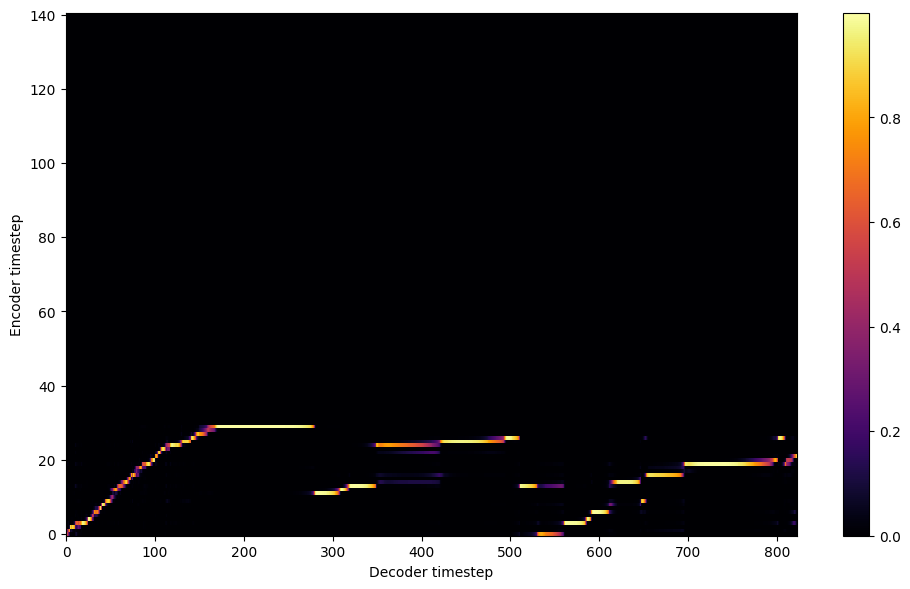


Starting Epoch: 1 Iteration: 3


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 1 Validation loss 6:  0.353833  Time: 0.3m LR: 0.000300


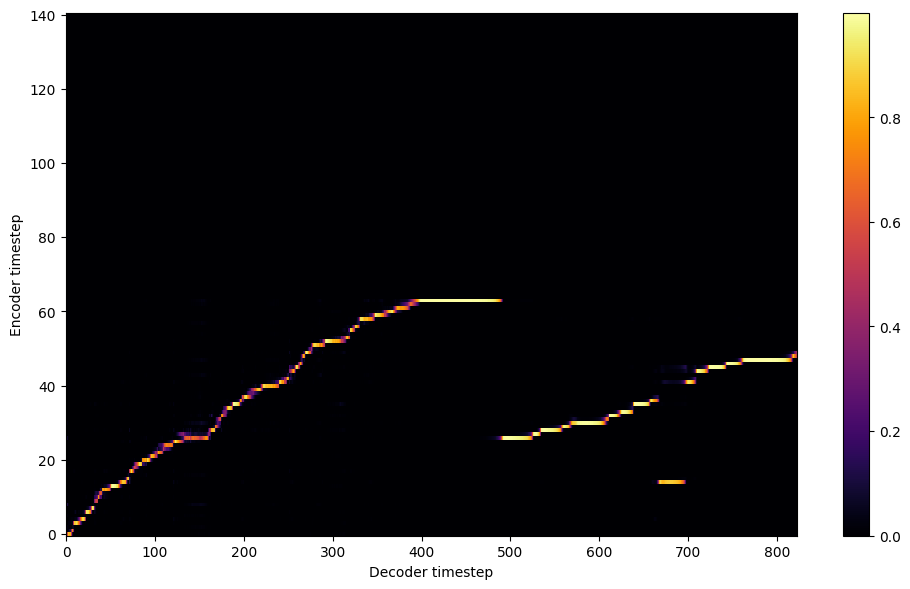


Starting Epoch: 2 Iteration: 6


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 2 Validation loss 9:  0.314764  Time: 0.2m LR: 0.000300


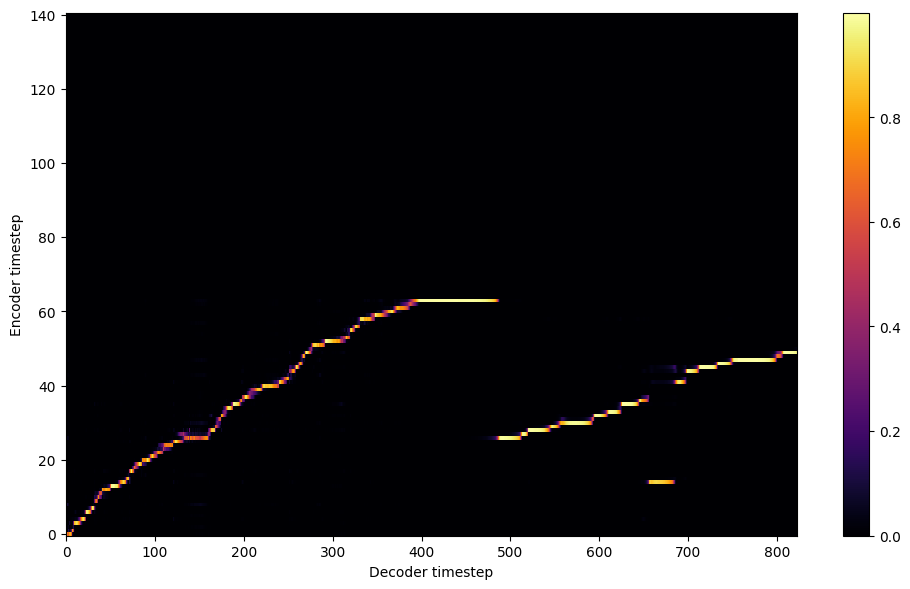


Starting Epoch: 3 Iteration: 9


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 3 Validation loss 12:  0.291862  Time: 0.2m LR: 0.000300


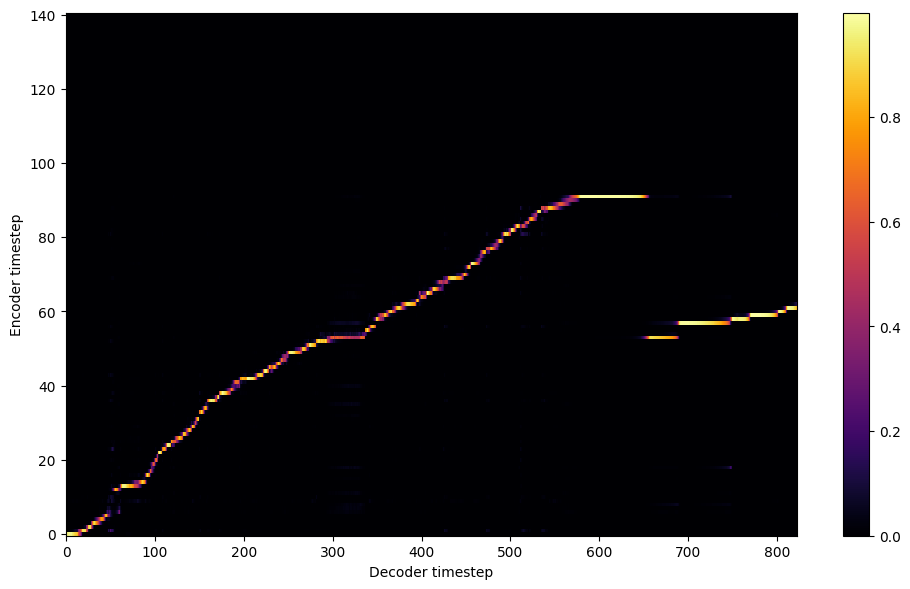


Starting Epoch: 4 Iteration: 12


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 4 Validation loss 15:  0.272228  Time: 0.3m LR: 0.000300


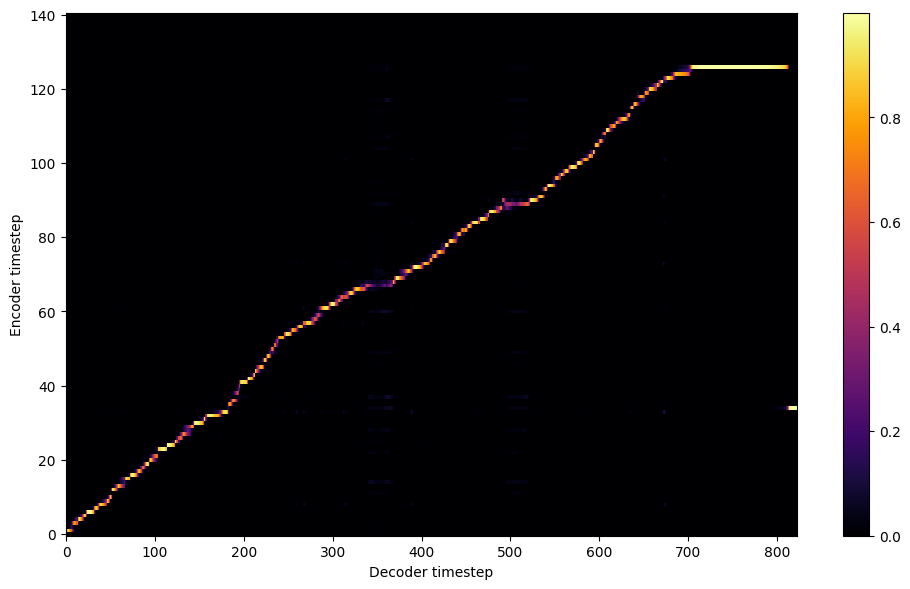


Starting Epoch: 5 Iteration: 15


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 5 Validation loss 18:  0.261359  Time: 0.2m LR: 0.000300


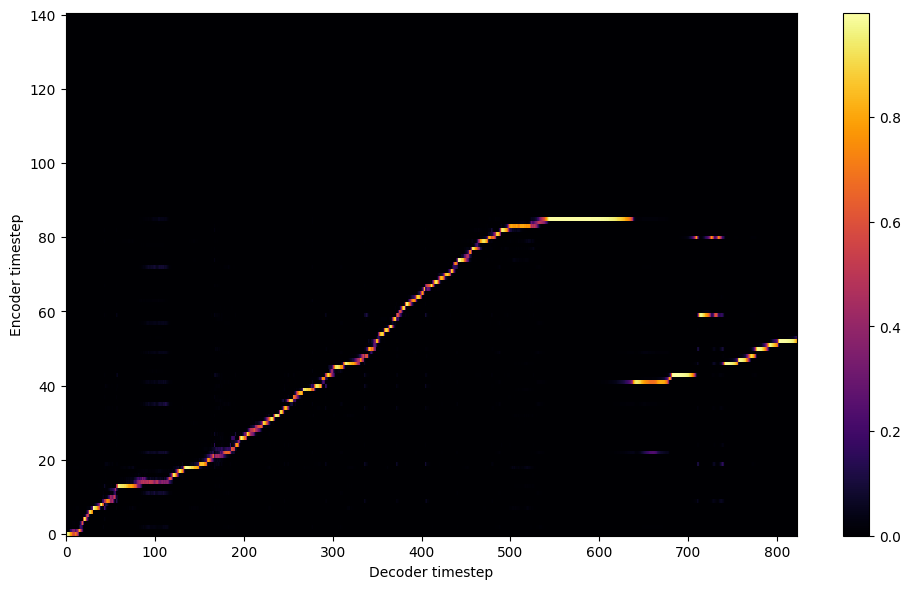


Starting Epoch: 6 Iteration: 18


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 6 Validation loss 21:  0.257347  Time: 0.3m LR: 0.000300


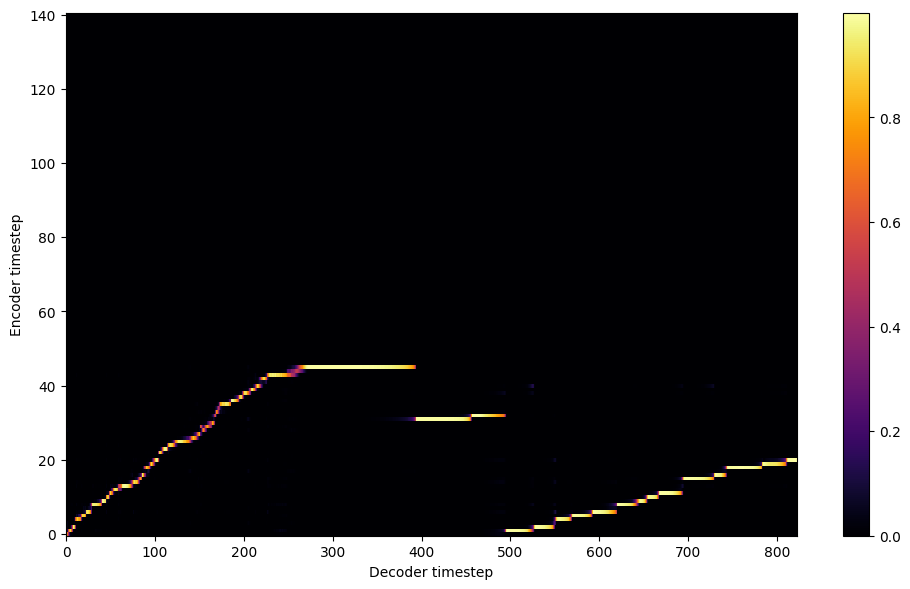


Starting Epoch: 7 Iteration: 21


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 7 Validation loss 24:  0.252311  Time: 0.3m LR: 0.000300


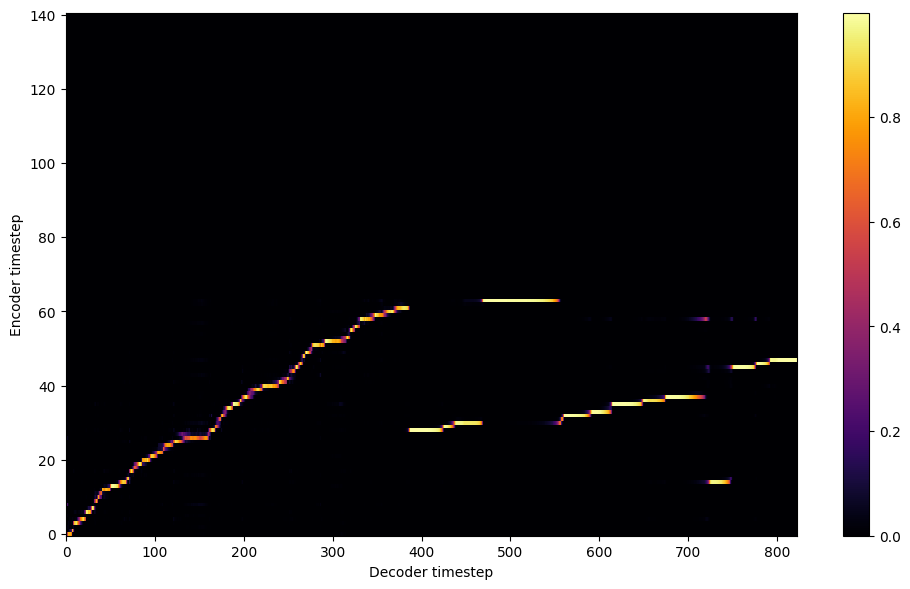


Starting Epoch: 8 Iteration: 24


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 8 Validation loss 27:  0.256345  Time: 0.3m LR: 0.000300


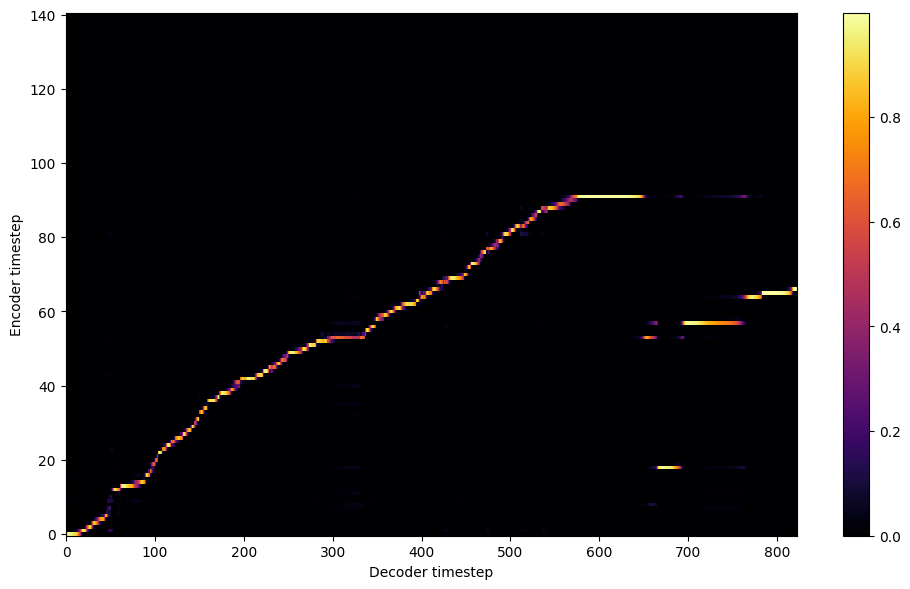


Starting Epoch: 9 Iteration: 27


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 9 Validation loss 30:  0.244530  Time: 0.3m LR: 0.000300


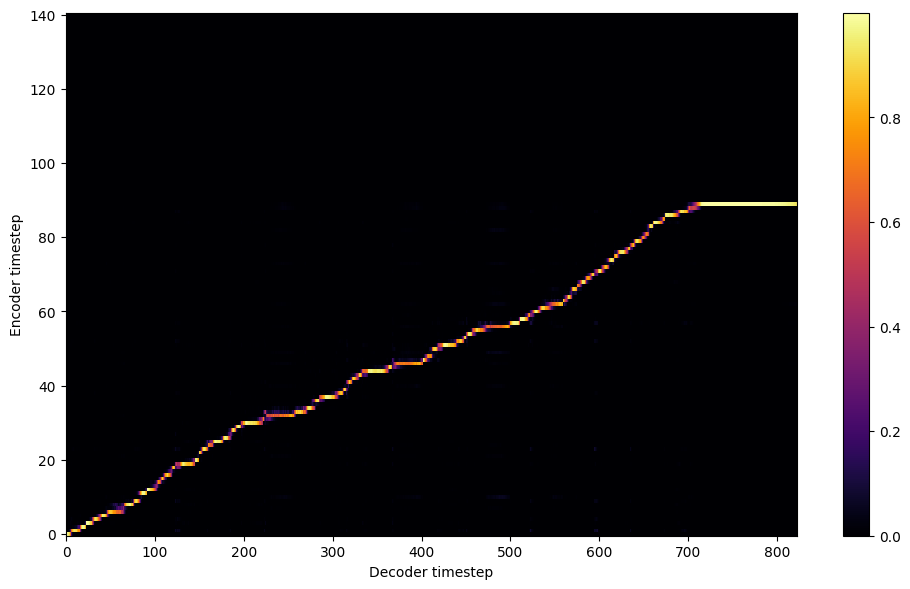

Saving model and optimizer state at iteration 30 to /content/drive/MyDrive/colab/outdir/TTS tacotron
Model Saved

Starting Epoch: 10 Iteration: 30


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 10 Validation loss 33:  0.239919  Time: 0.3m LR: 0.000300


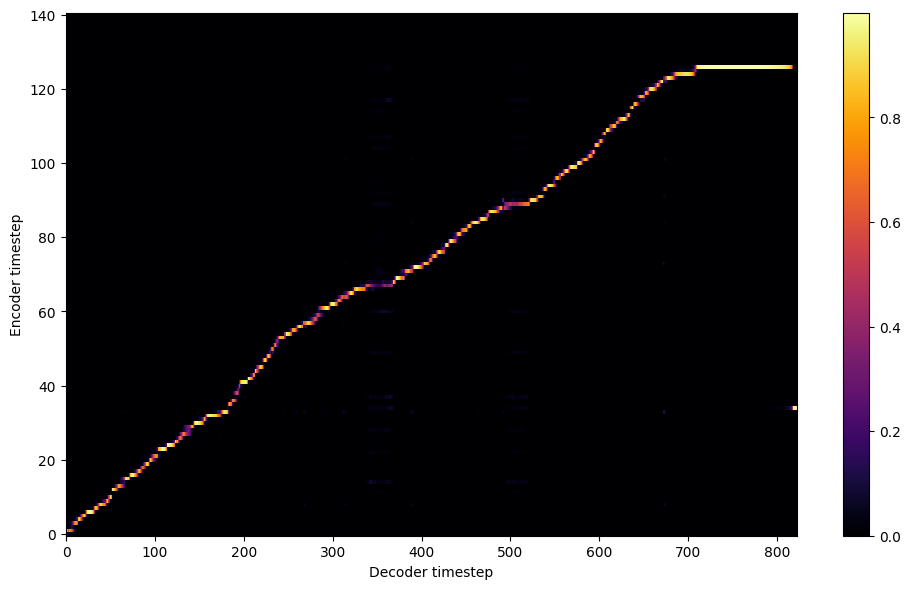


Starting Epoch: 11 Iteration: 33


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 11 Validation loss 36:  0.238932  Time: 0.3m LR: 0.000300


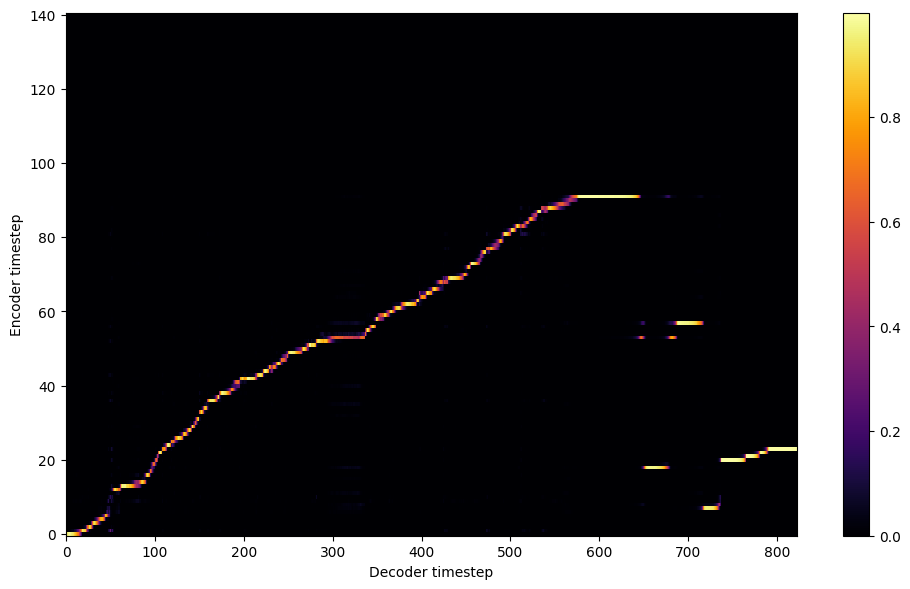


Starting Epoch: 12 Iteration: 36


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 12 Validation loss 39:  0.231975  Time: 0.3m LR: 0.000300


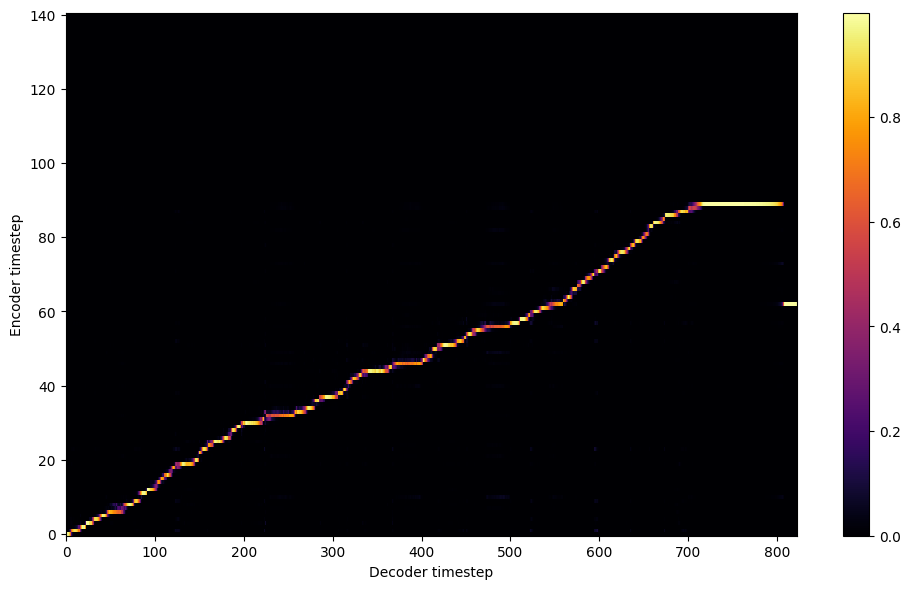


Starting Epoch: 13 Iteration: 39


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 13 Validation loss 42:  0.231875  Time: 0.2m LR: 0.000300


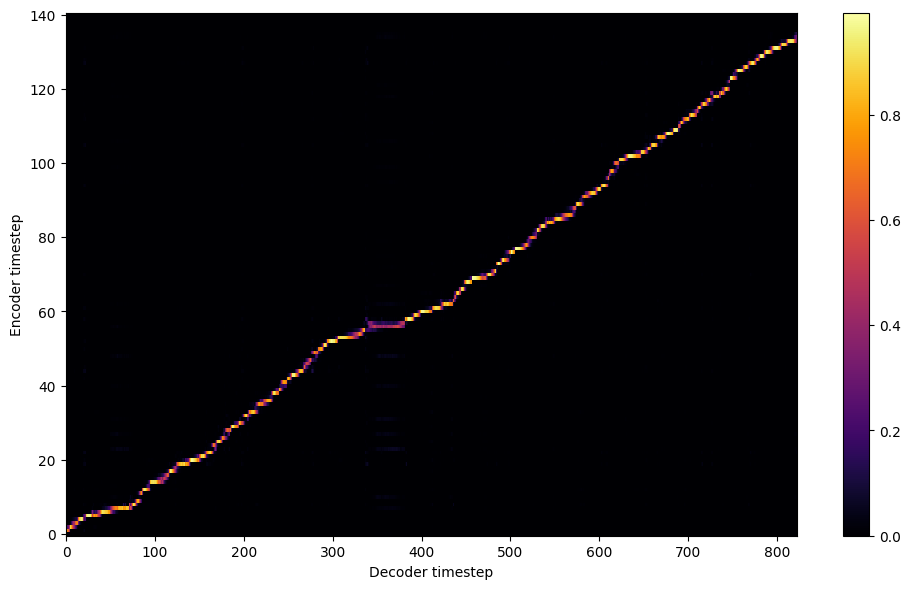


Starting Epoch: 14 Iteration: 42


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 14 Validation loss 45:  0.226877  Time: 0.3m LR: 0.000300


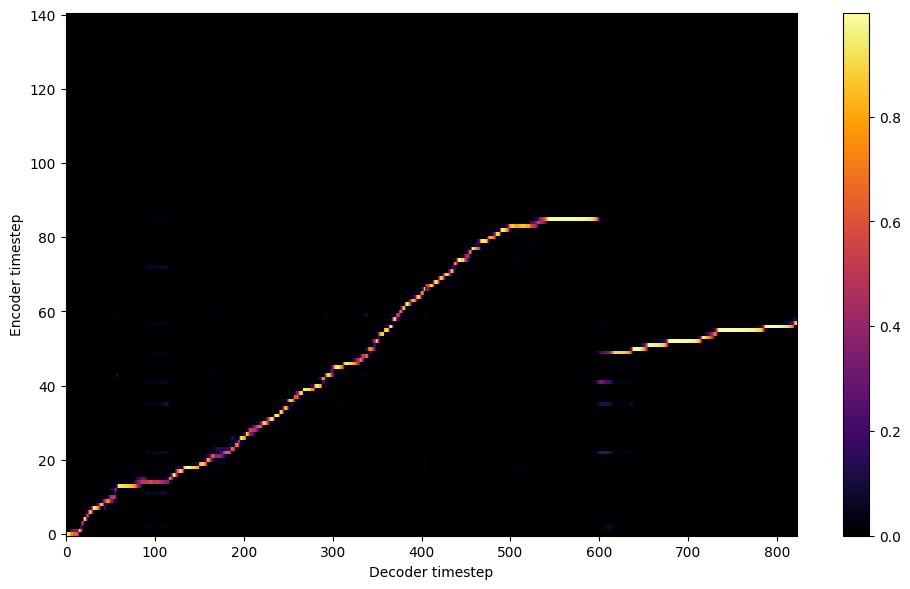


Starting Epoch: 15 Iteration: 45


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 15 Validation loss 48:  0.228028  Time: 0.2m LR: 0.000300


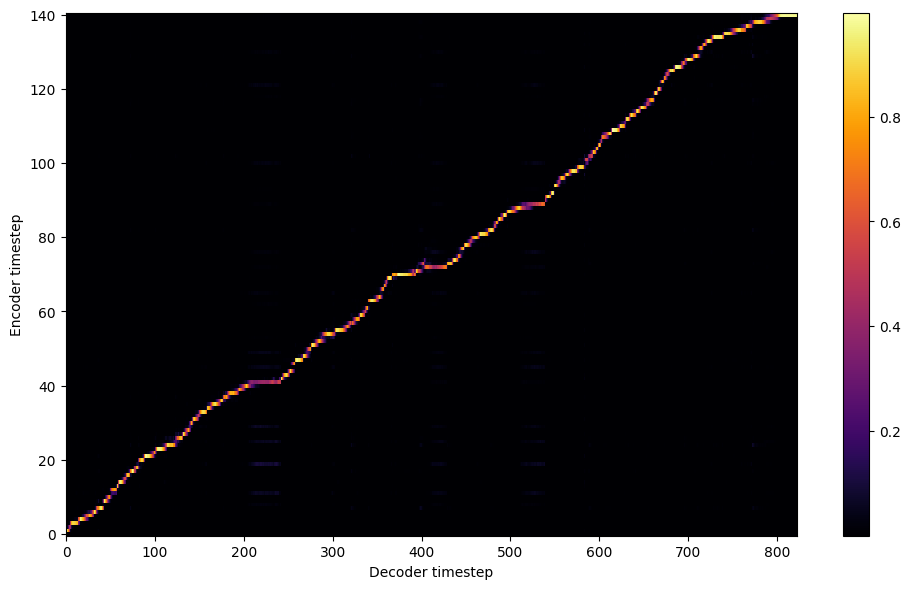


Starting Epoch: 16 Iteration: 48


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 16 Validation loss 51:  0.230009  Time: 0.3m LR: 0.000300


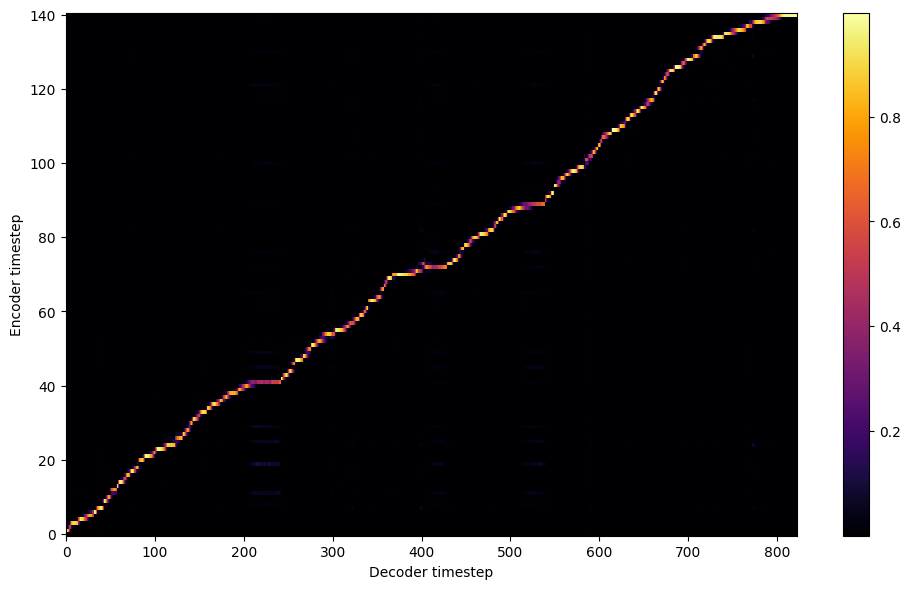


Starting Epoch: 17 Iteration: 51


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 17 Validation loss 54:  0.225241  Time: 0.3m LR: 0.000300


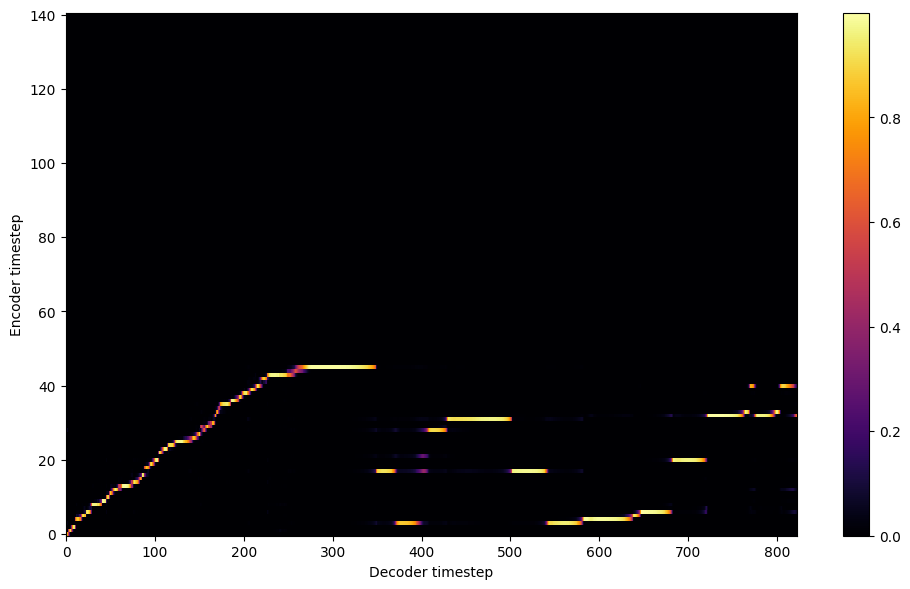


Starting Epoch: 18 Iteration: 54


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 18 Validation loss 57:  0.223580  Time: 0.2m LR: 0.000300


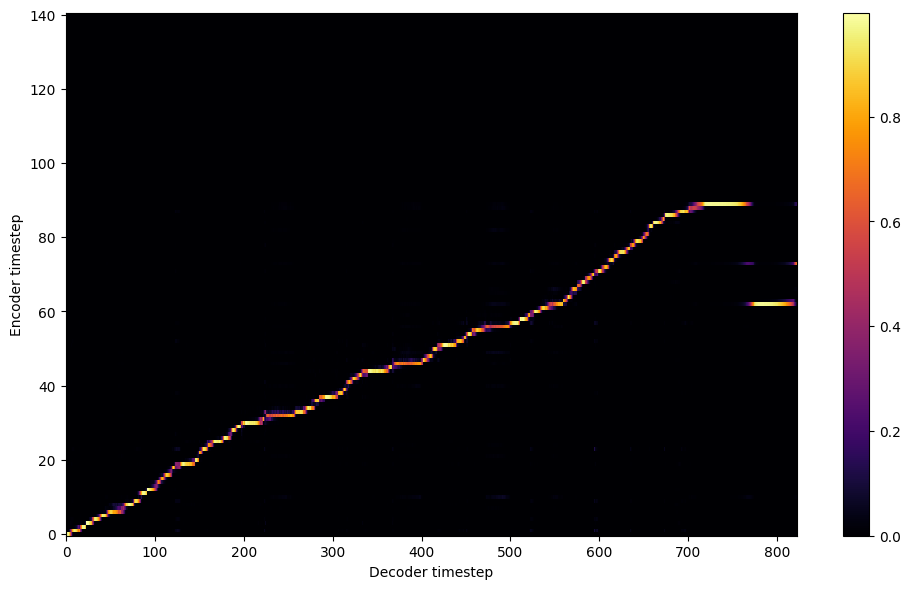


Starting Epoch: 19 Iteration: 57


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 19 Validation loss 60:  0.225719  Time: 0.3m LR: 0.000300


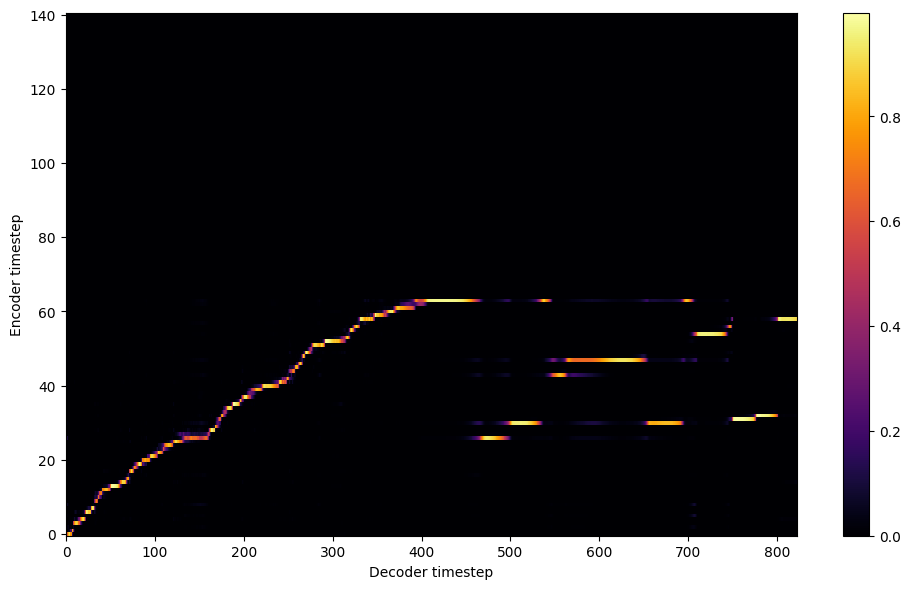

Saving model and optimizer state at iteration 60 to /content/drive/MyDrive/colab/outdir/TTS tacotron
Model Saved

Starting Epoch: 20 Iteration: 60


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 20 Validation loss 63:  0.229005  Time: 0.3m LR: 0.000300


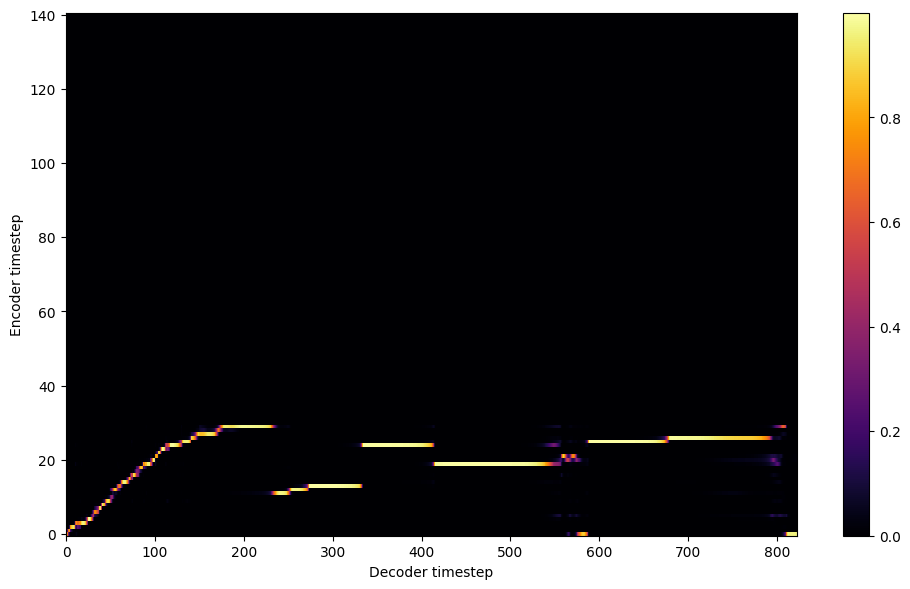


Starting Epoch: 21 Iteration: 63


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 21 Validation loss 66:  0.222386  Time: 0.3m LR: 0.000300


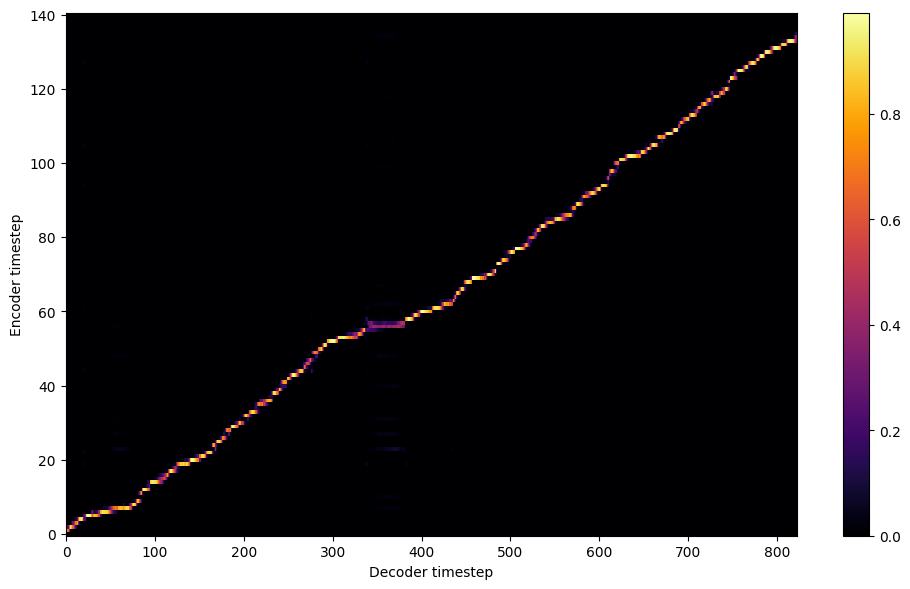


Starting Epoch: 22 Iteration: 66


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 22 Validation loss 69:  0.224679  Time: 0.3m LR: 0.000300


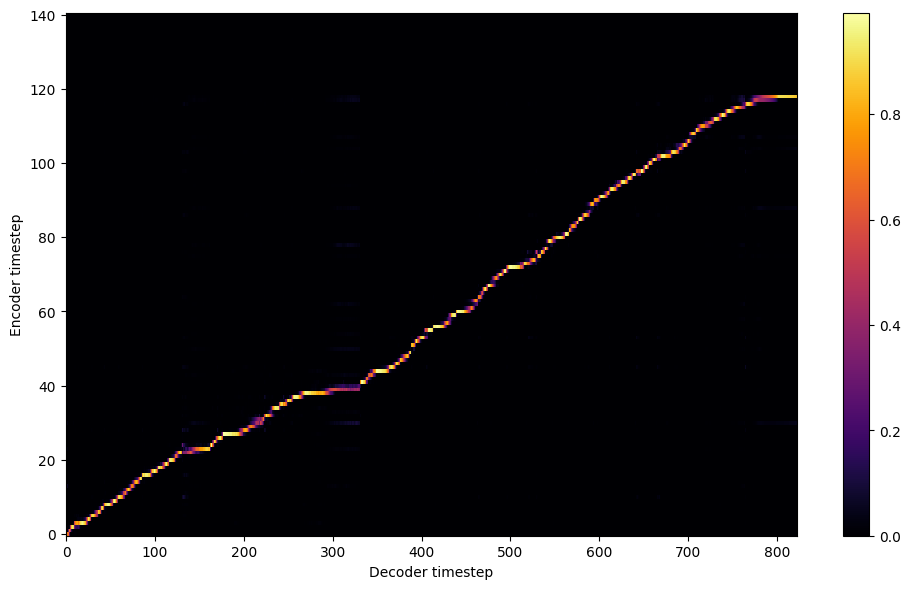


Starting Epoch: 23 Iteration: 69


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 23 Validation loss 72:  0.223024  Time: 0.3m LR: 0.000300


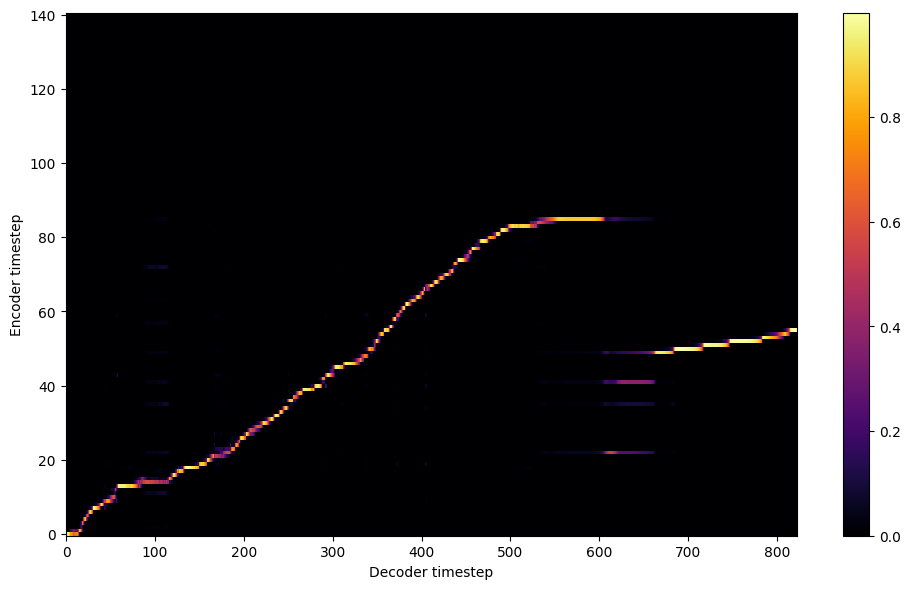


Starting Epoch: 24 Iteration: 72


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 24 Validation loss 75:  0.217163  Time: 0.3m LR: 0.000300


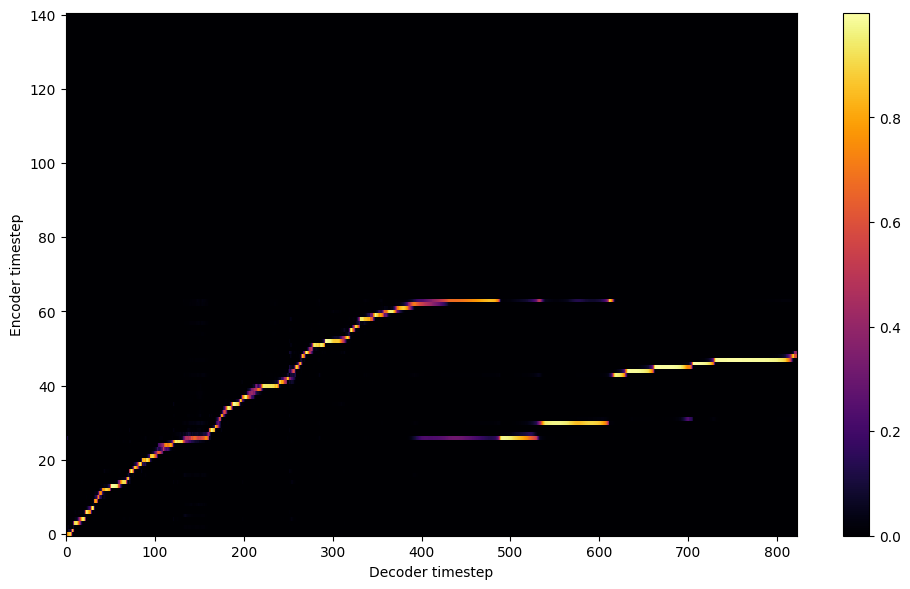


Starting Epoch: 25 Iteration: 75


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 25 Validation loss 78:  0.214705  Time: 0.3m LR: 0.000300


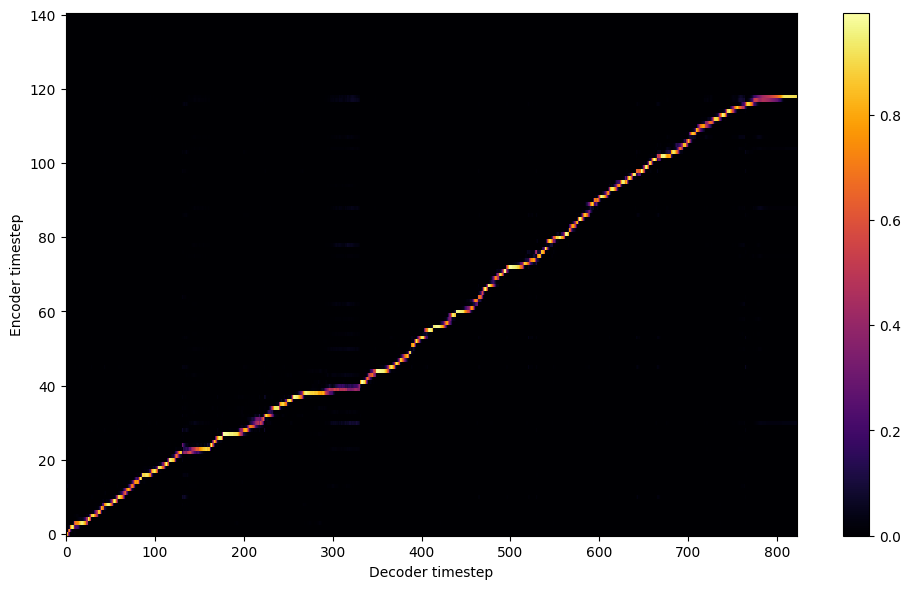


Starting Epoch: 26 Iteration: 78


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 26 Validation loss 81:  0.211982  Time: 0.2m LR: 0.000300


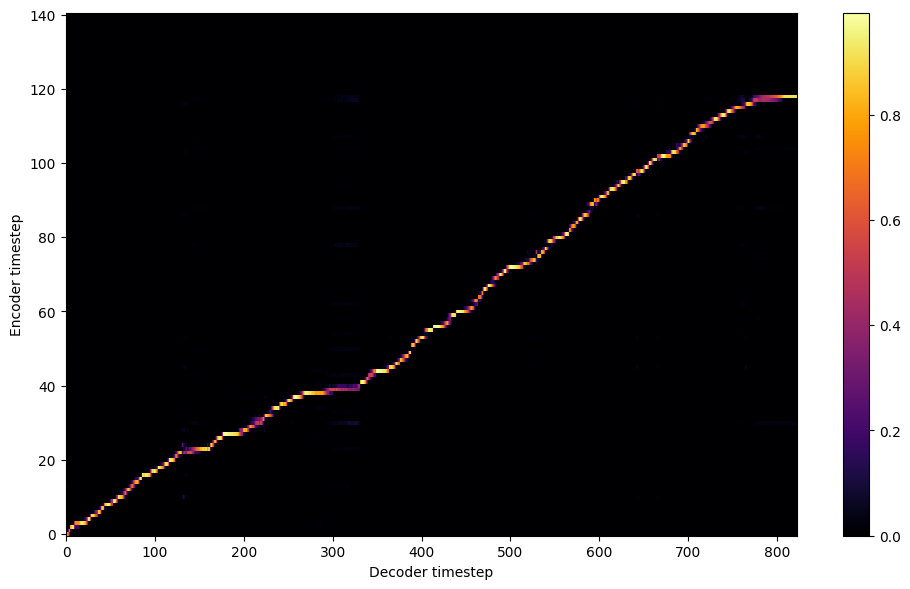


Starting Epoch: 27 Iteration: 81


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 27 Validation loss 84:  0.214578  Time: 0.3m LR: 0.000300


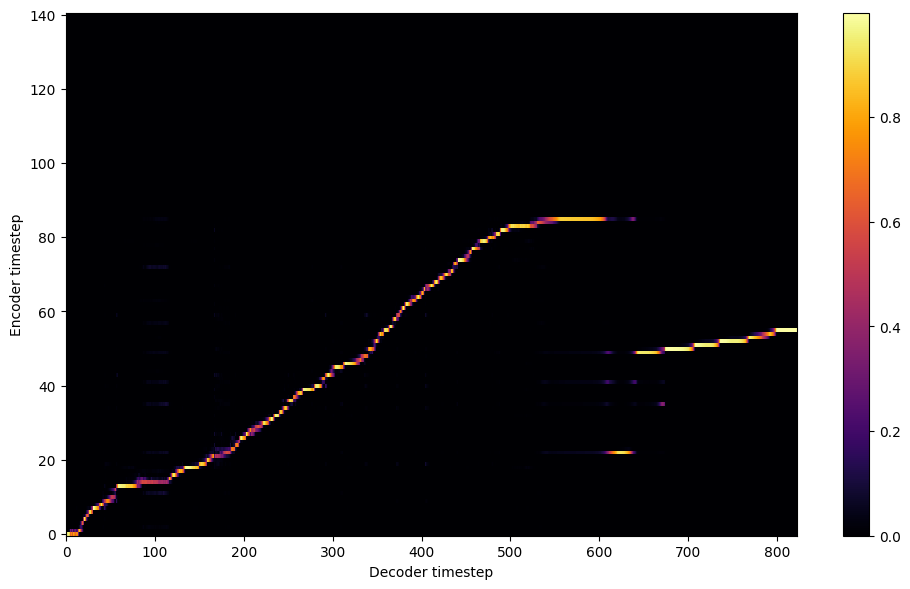


Starting Epoch: 28 Iteration: 84


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 28 Validation loss 87:  0.208043  Time: 0.2m LR: 0.000300


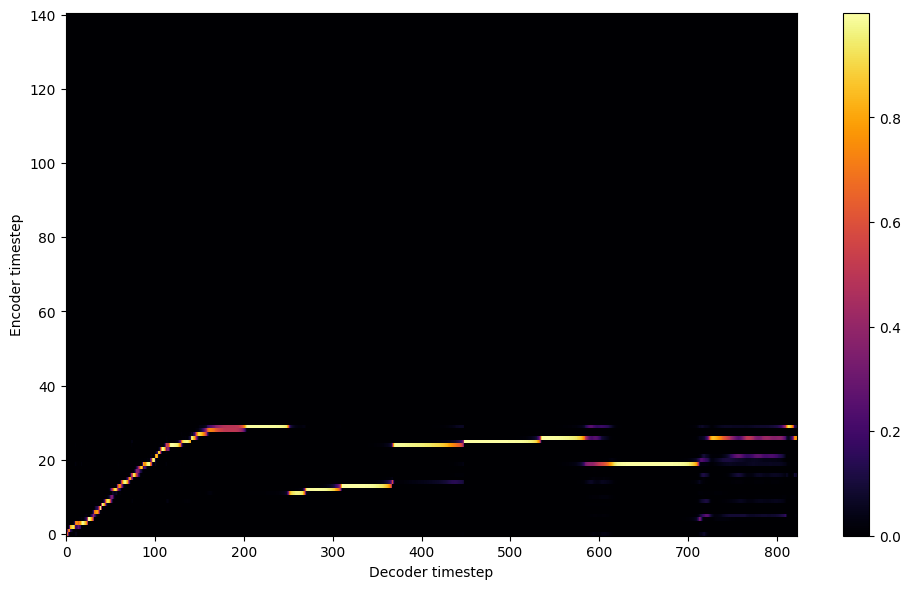


Starting Epoch: 29 Iteration: 87


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 29 Validation loss 90:  0.213086  Time: 0.2m LR: 0.000300


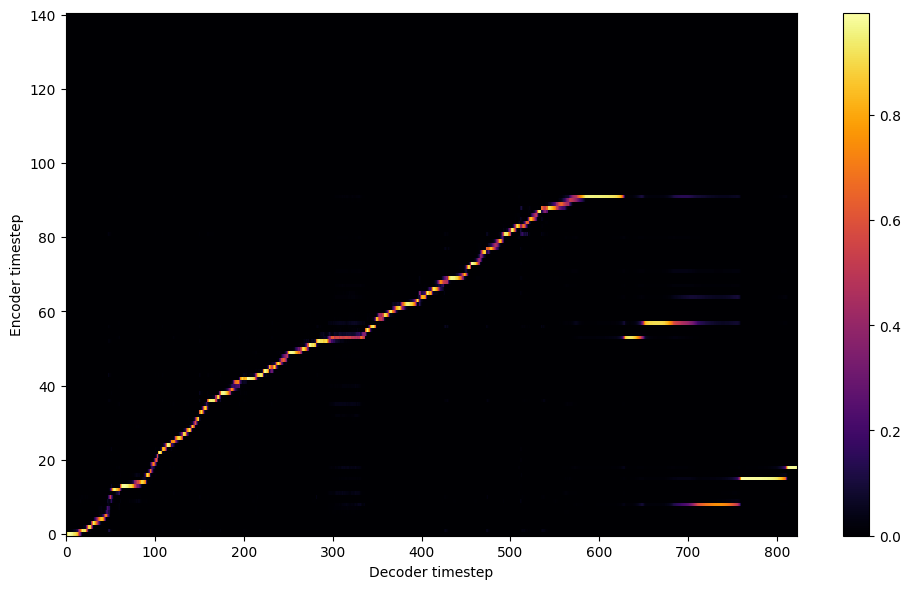

Saving model and optimizer state at iteration 90 to /content/drive/MyDrive/colab/outdir/TTS tacotron
Model Saved

Starting Epoch: 30 Iteration: 90


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 30 Validation loss 93:  0.209931  Time: 0.3m LR: 0.000300


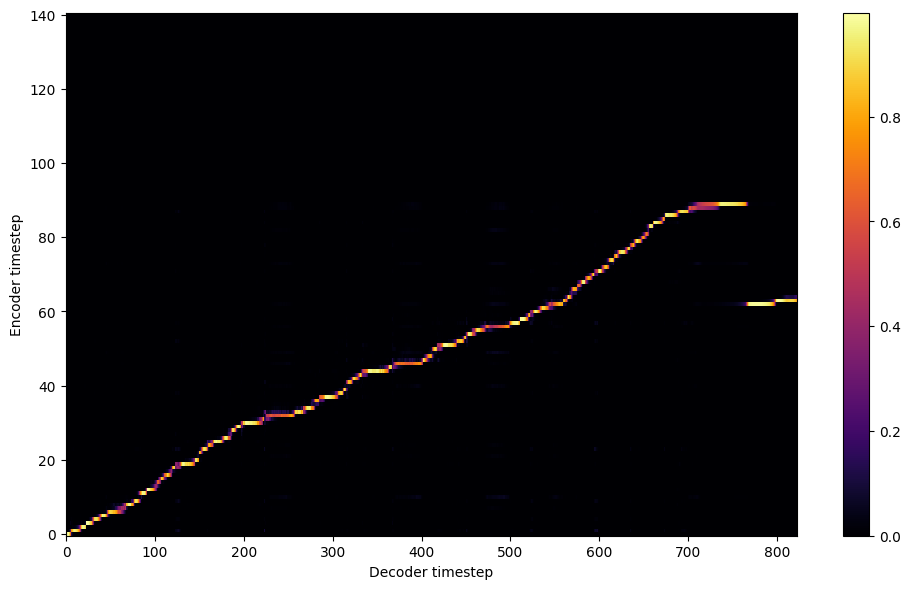


Starting Epoch: 31 Iteration: 93


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 31 Validation loss 96:  0.204193  Time: 0.2m LR: 0.000300


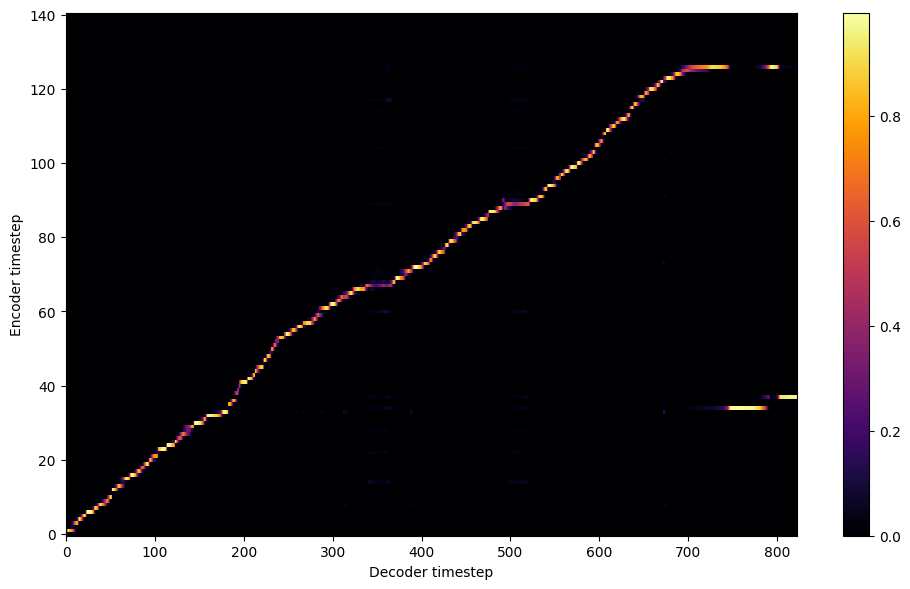


Starting Epoch: 32 Iteration: 96


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 32 Validation loss 99:  0.203540  Time: 0.3m LR: 0.000300


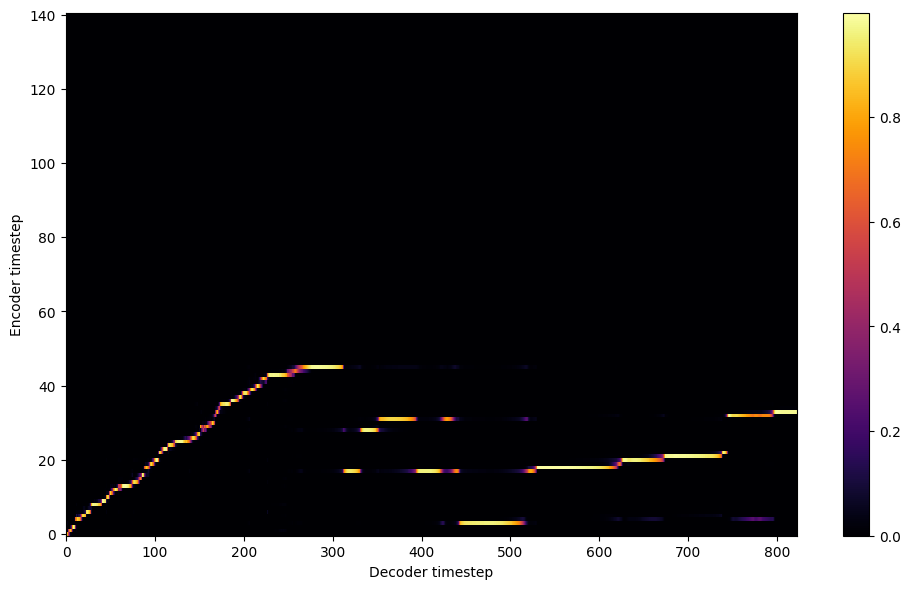


Starting Epoch: 33 Iteration: 99


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 33 Validation loss 102:  0.202096  Time: 0.3m LR: 0.000300


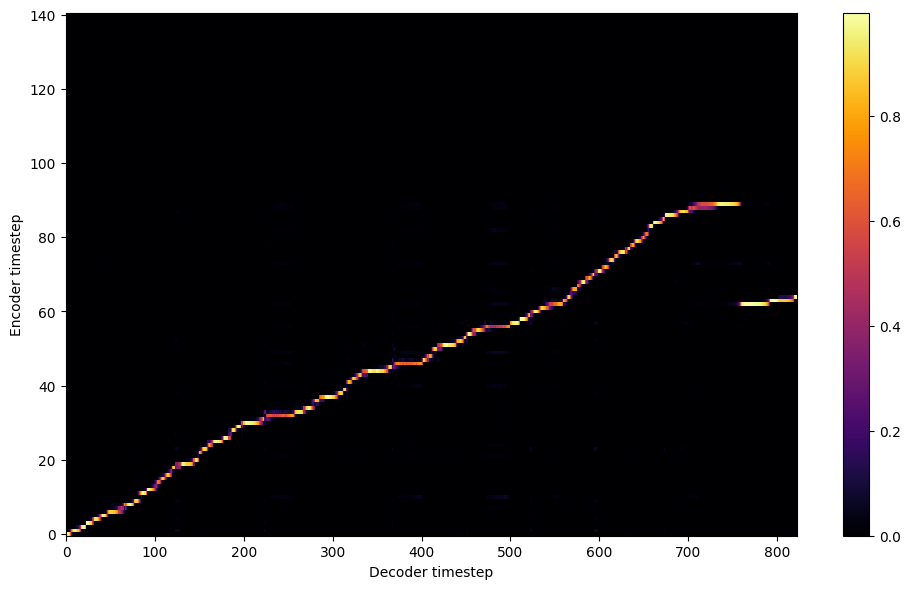


Starting Epoch: 34 Iteration: 102


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 34 Validation loss 105:  0.201882  Time: 0.3m LR: 0.000300


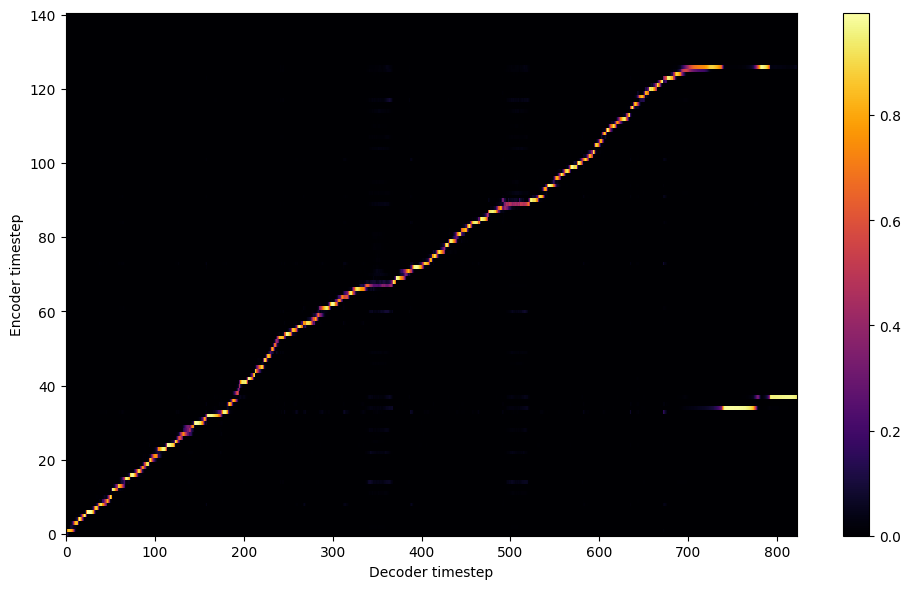


Starting Epoch: 35 Iteration: 105


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 35 Validation loss 108:  0.197815  Time: 0.2m LR: 0.000300


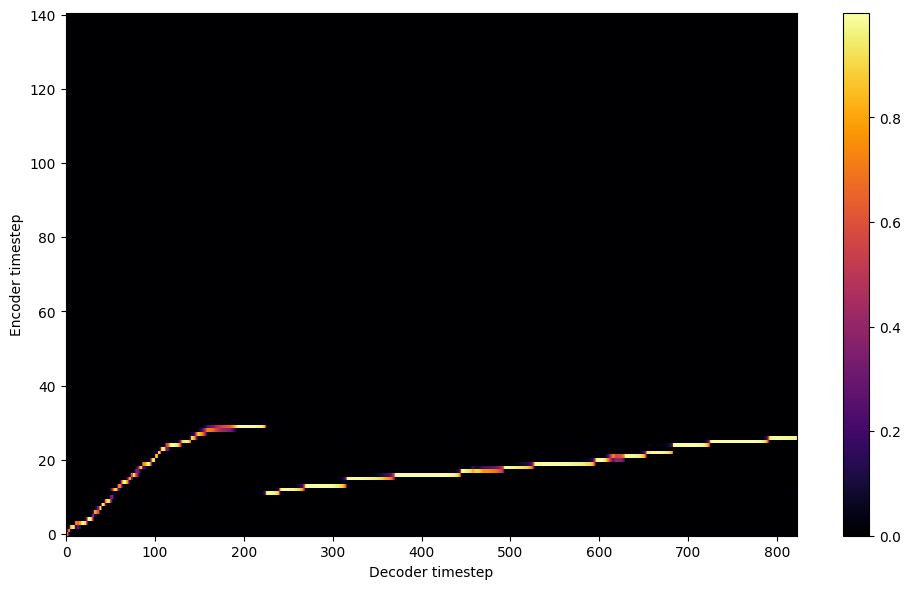


Starting Epoch: 36 Iteration: 108


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 36 Validation loss 111:  0.201378  Time: 0.3m LR: 0.000300


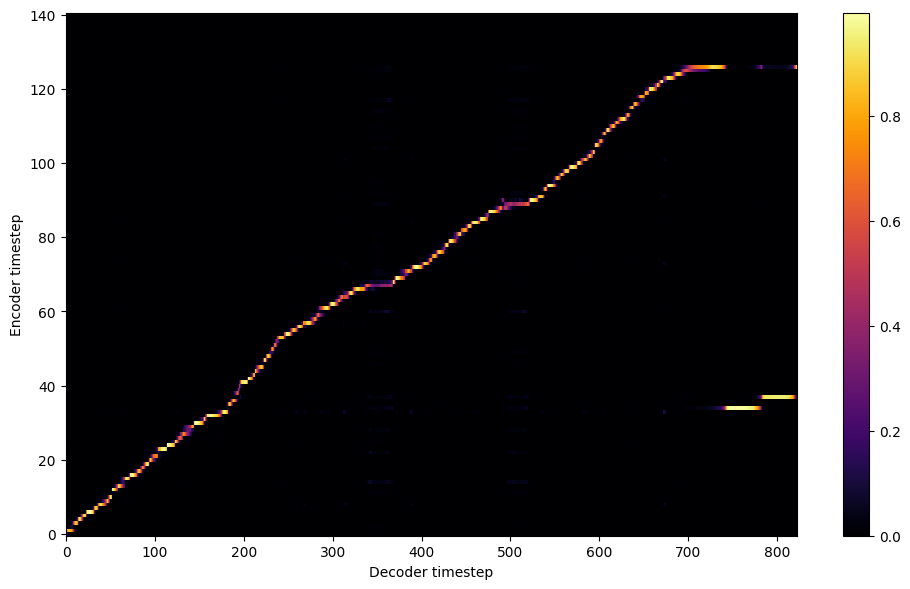


Starting Epoch: 37 Iteration: 111


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 37 Validation loss 114:  0.196857  Time: 0.3m LR: 0.000300


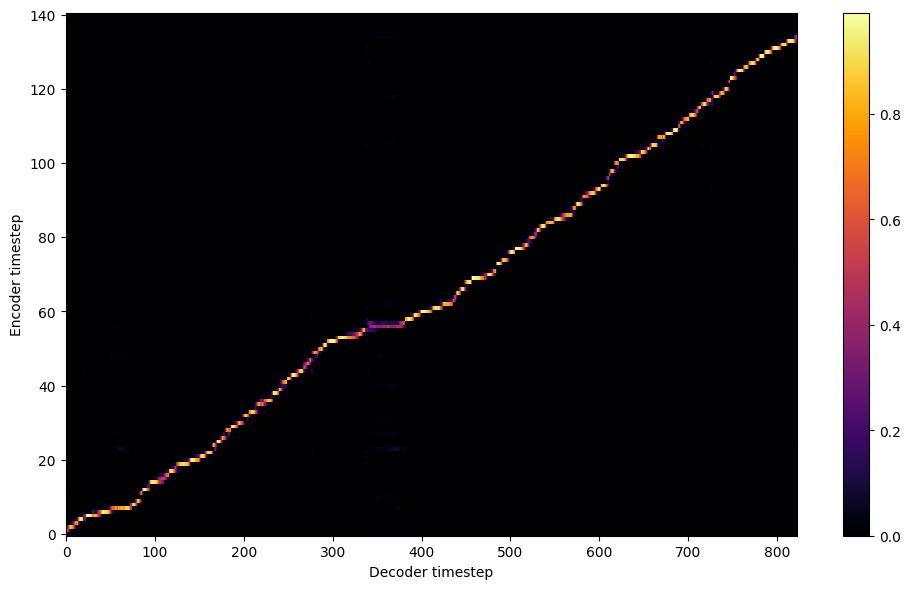


Starting Epoch: 38 Iteration: 114


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 38 Validation loss 117:  0.199160  Time: 0.2m LR: 0.000300


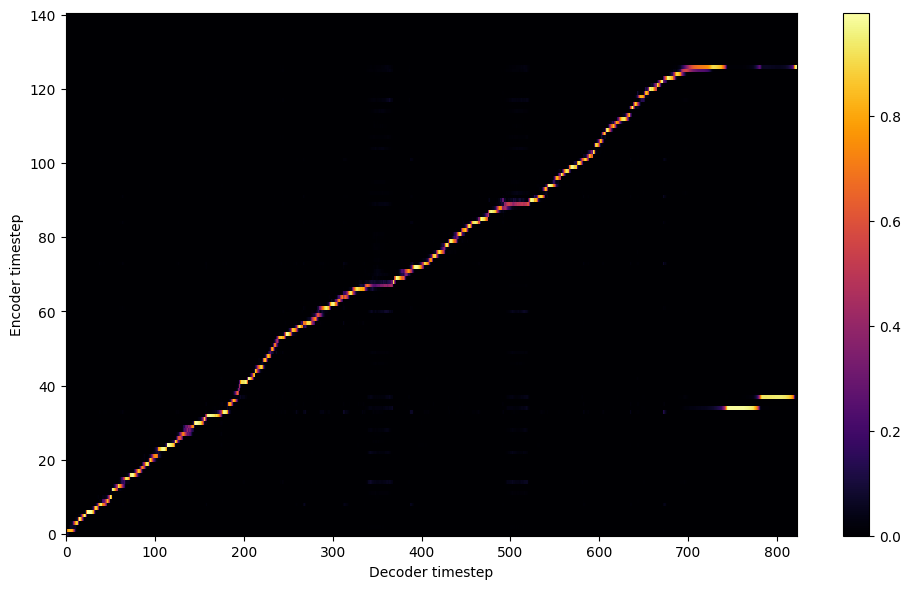


Starting Epoch: 39 Iteration: 117


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 39 Validation loss 120:  0.193327  Time: 0.3m LR: 0.000300


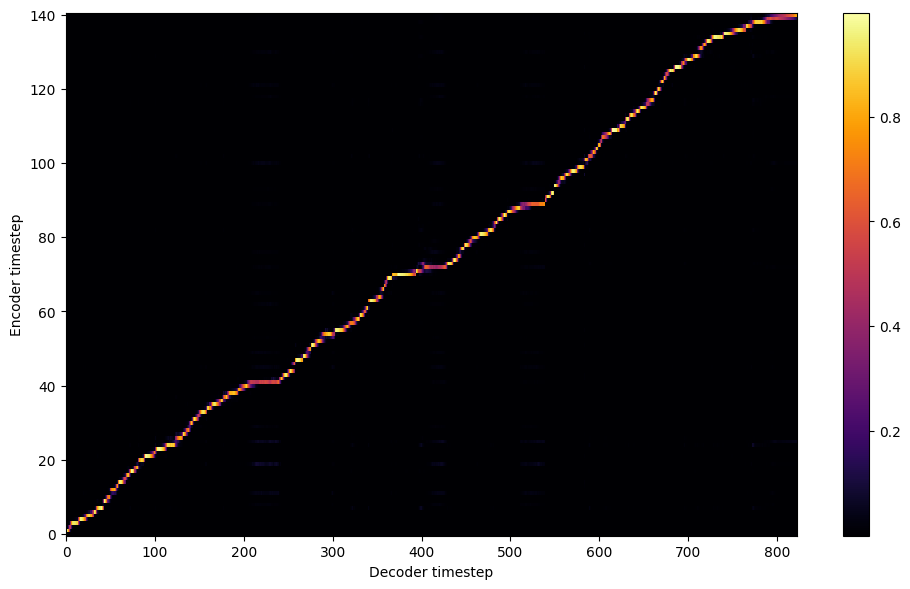

Saving model and optimizer state at iteration 120 to /content/drive/MyDrive/colab/outdir/TTS tacotron
Model Saved

Starting Epoch: 40 Iteration: 120


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 40 Validation loss 123:  0.194796  Time: 0.3m LR: 0.000300


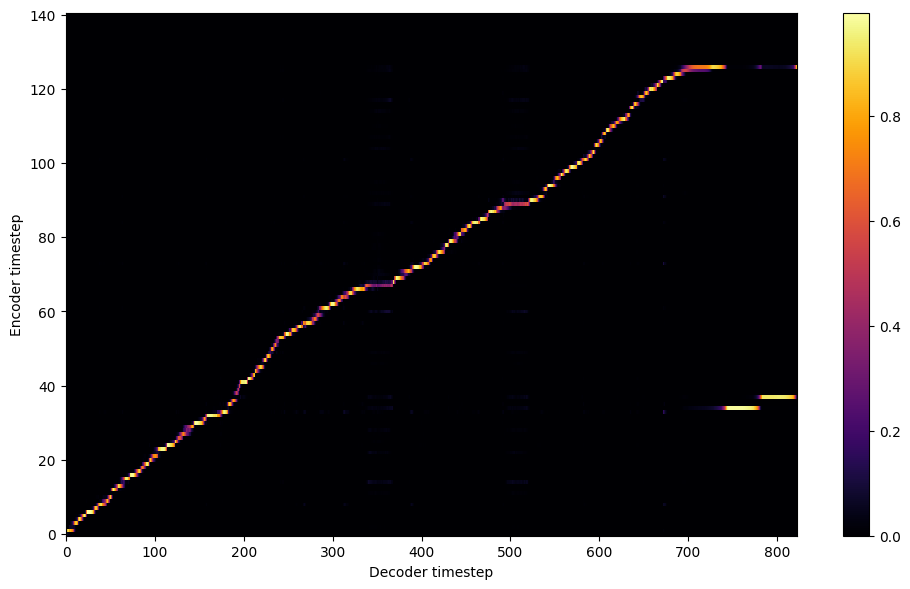


Starting Epoch: 41 Iteration: 123


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 41 Validation loss 126:  0.191317  Time: 0.3m LR: 0.000300


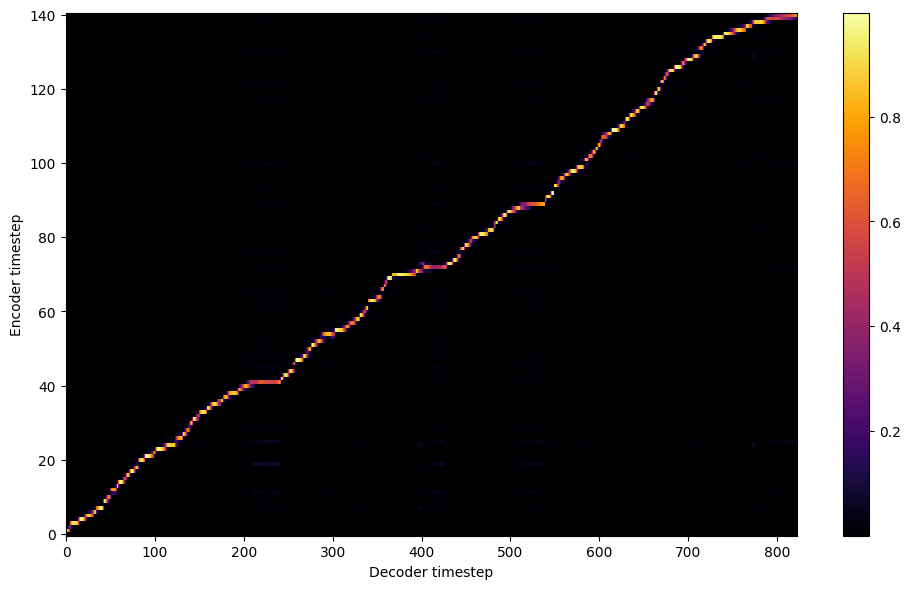


Starting Epoch: 42 Iteration: 126


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 42 Validation loss 129:  0.191414  Time: 0.2m LR: 0.000300


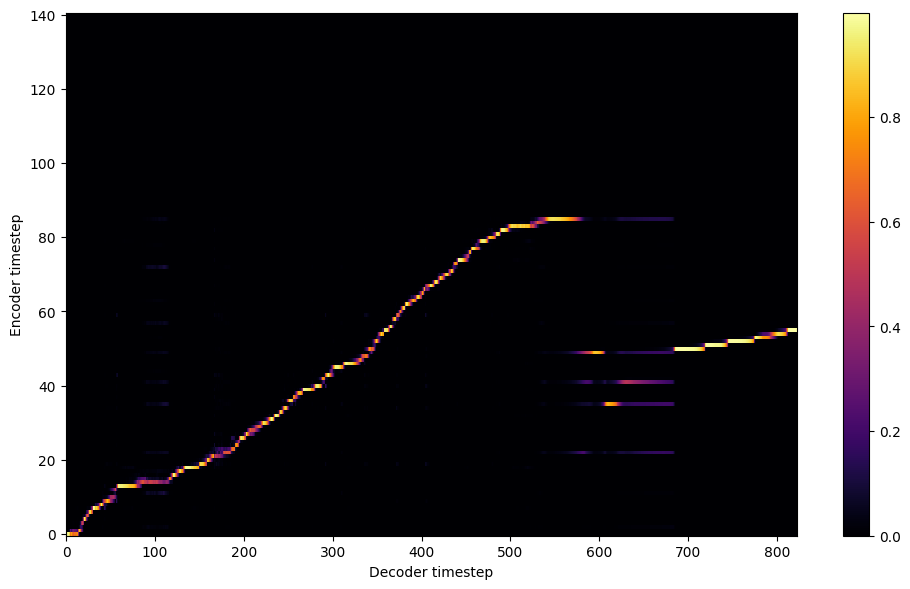


Starting Epoch: 43 Iteration: 129


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 43 Validation loss 132:  0.188637  Time: 0.3m LR: 0.000300


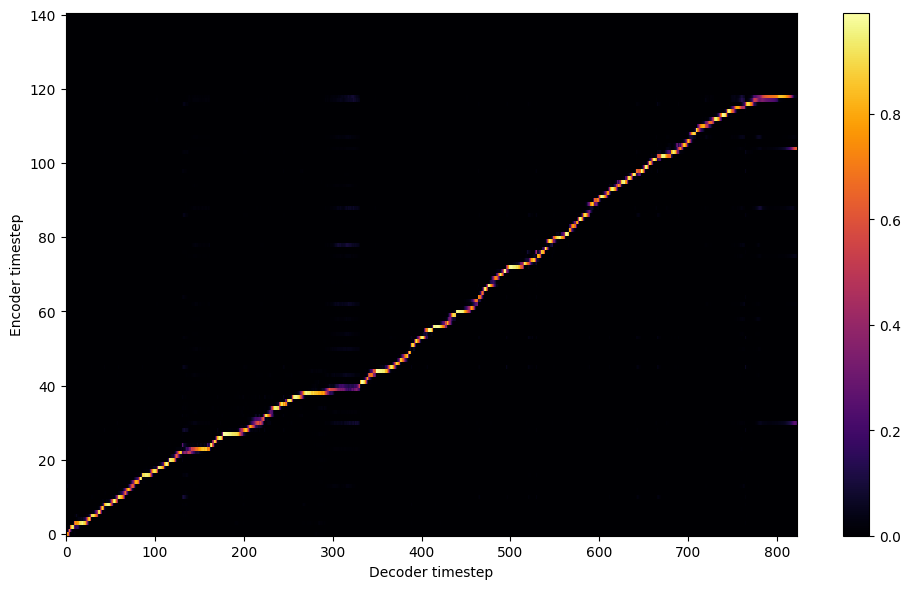


Starting Epoch: 44 Iteration: 132


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 44 Validation loss 135:  0.185859  Time: 0.3m LR: 0.000300


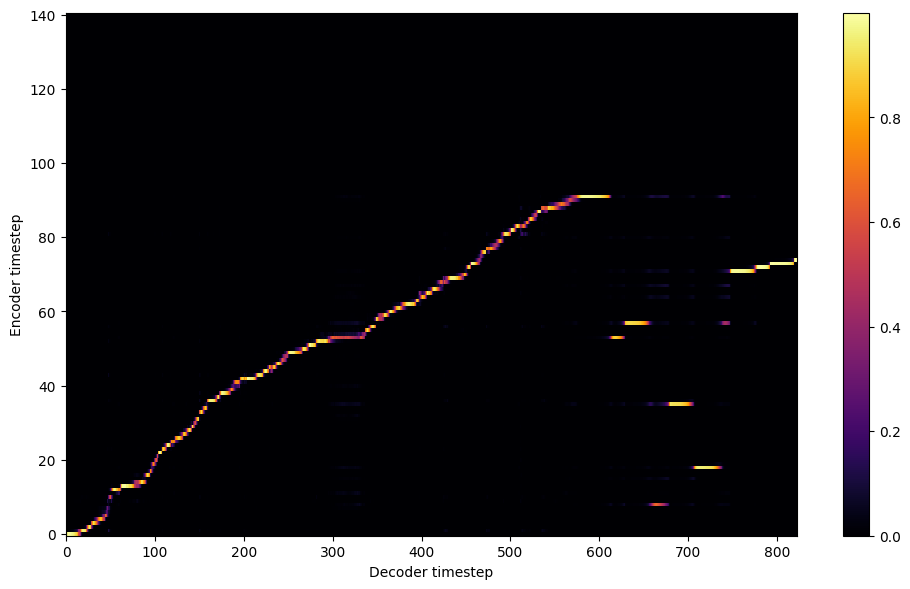


Starting Epoch: 45 Iteration: 135


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 45 Validation loss 138:  0.187280  Time: 0.3m LR: 0.000300


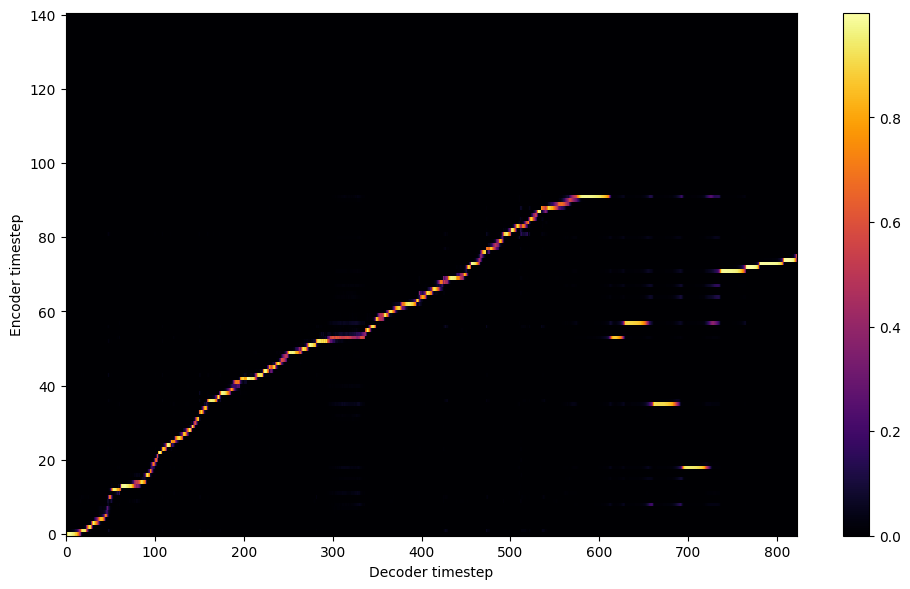


Starting Epoch: 46 Iteration: 138


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 46 Validation loss 141:  0.184907  Time: 0.3m LR: 0.000300


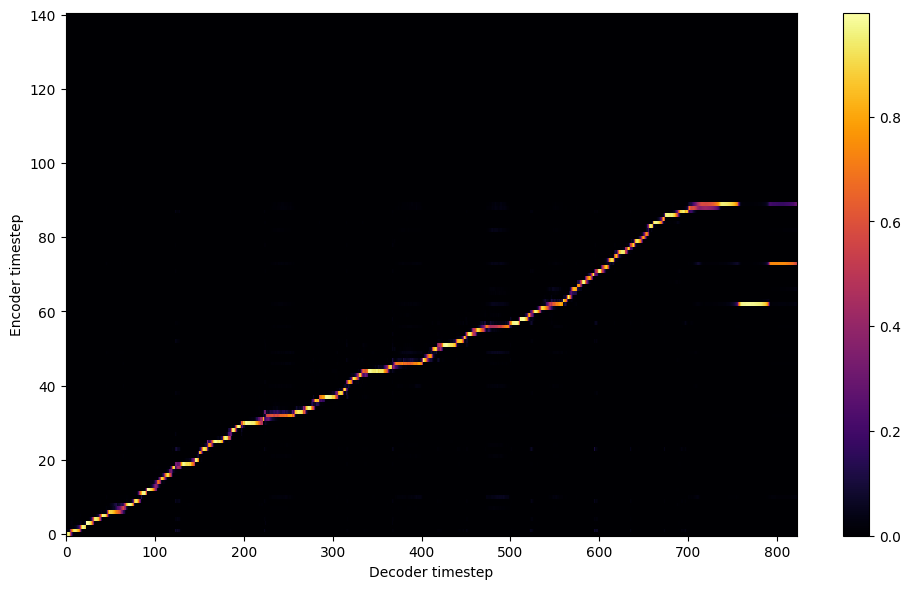


Starting Epoch: 47 Iteration: 141


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 47 Validation loss 144:  0.189378  Time: 0.3m LR: 0.000300


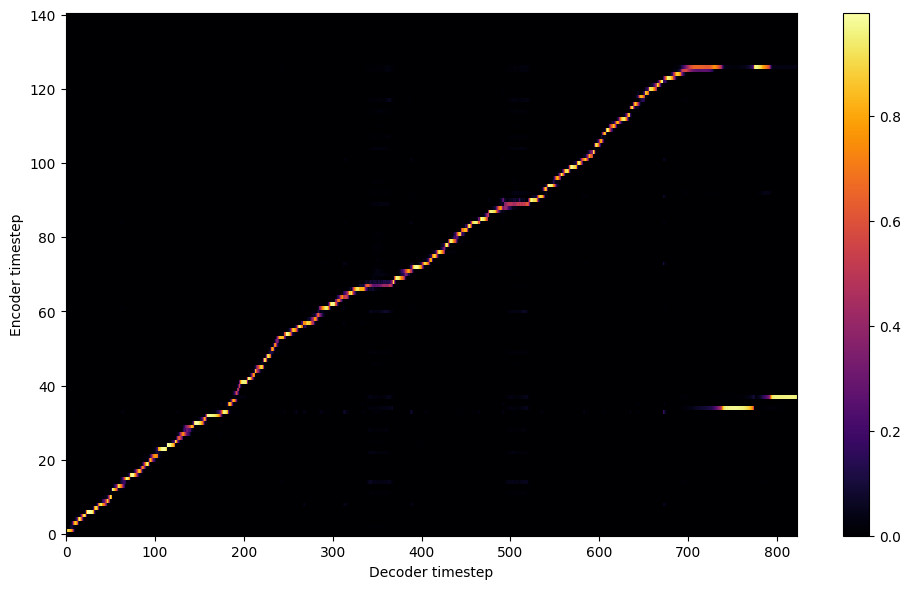


Starting Epoch: 48 Iteration: 144


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 48 Validation loss 147:  0.187356  Time: 0.3m LR: 0.000300


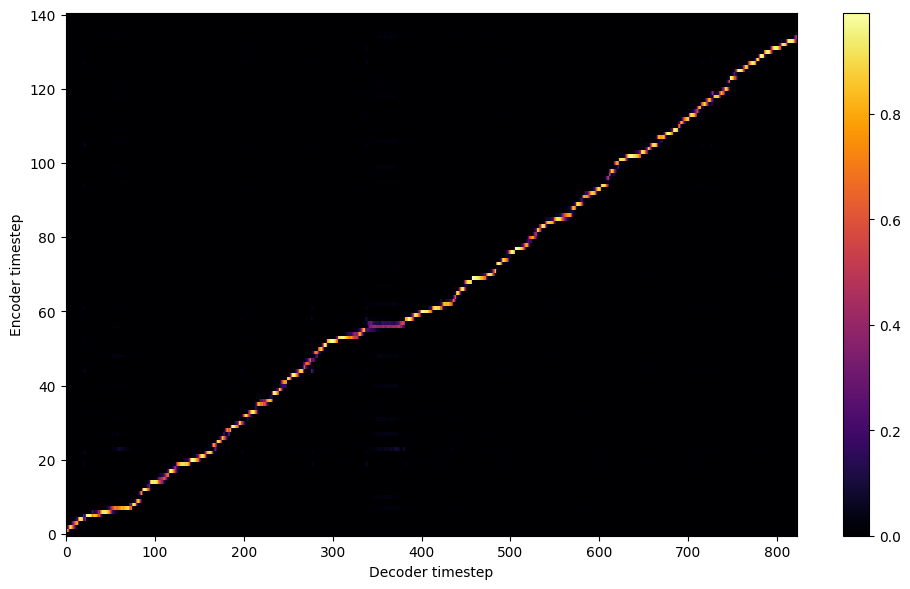


Starting Epoch: 49 Iteration: 147


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 49 Validation loss 150:  0.184132  Time: 0.2m LR: 0.000300


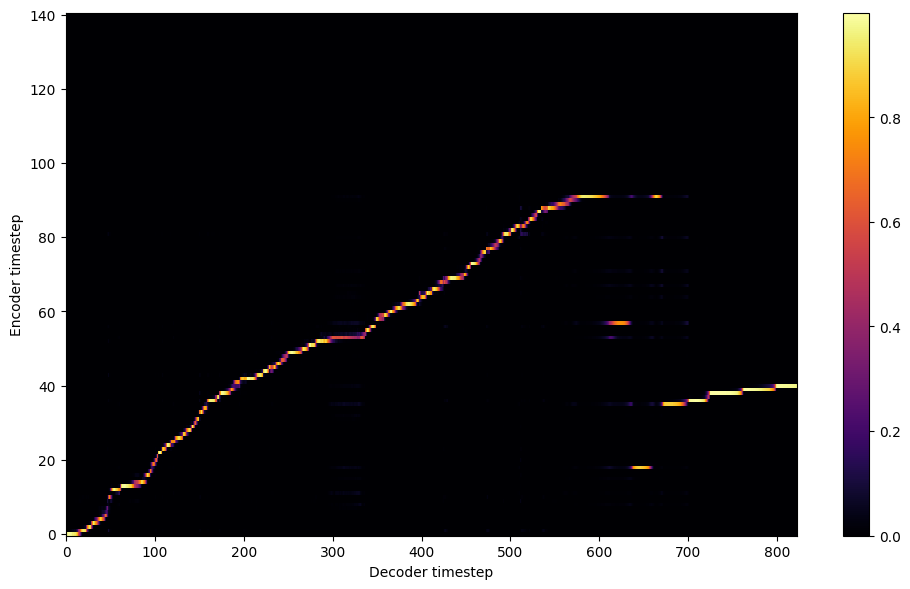

Saving model and optimizer state at iteration 150 to /content/drive/MyDrive/colab/outdir/TTS tacotron
Model Saved

Starting Epoch: 50 Iteration: 150


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 50 Validation loss 153:  0.184006  Time: 0.3m LR: 0.000300


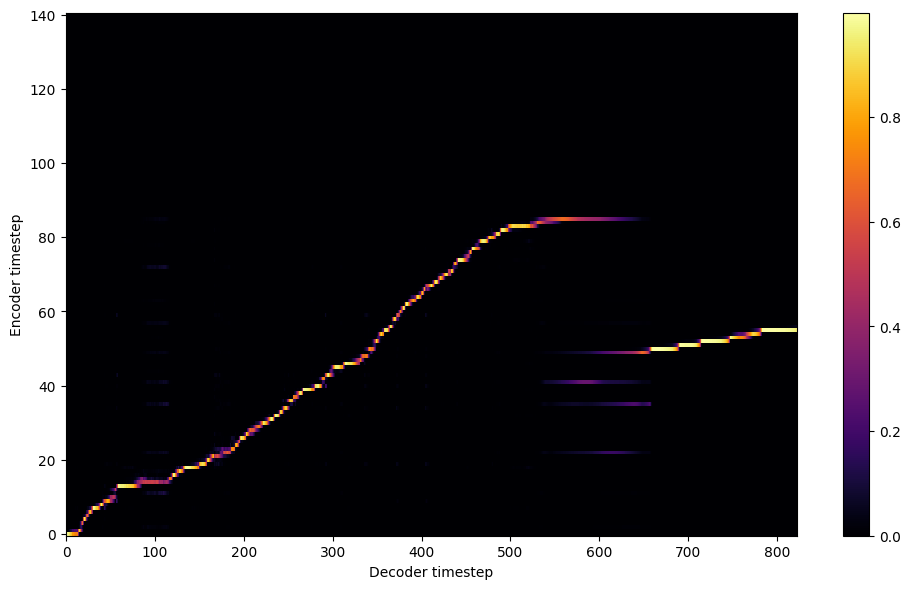


Starting Epoch: 51 Iteration: 153


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 51 Validation loss 156:  0.181758  Time: 0.2m LR: 0.000300


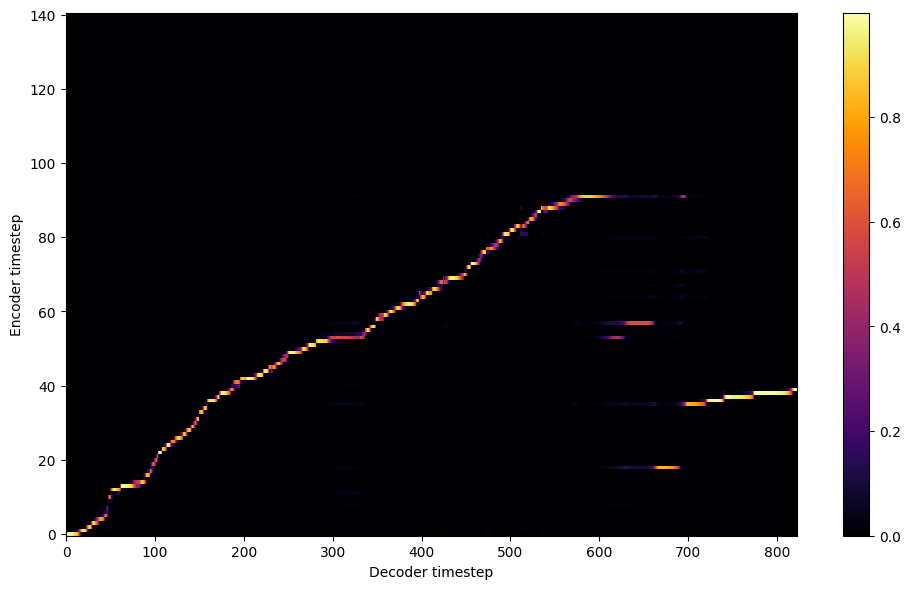


Starting Epoch: 52 Iteration: 156


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 52 Validation loss 159:  0.181765  Time: 0.3m LR: 0.000300


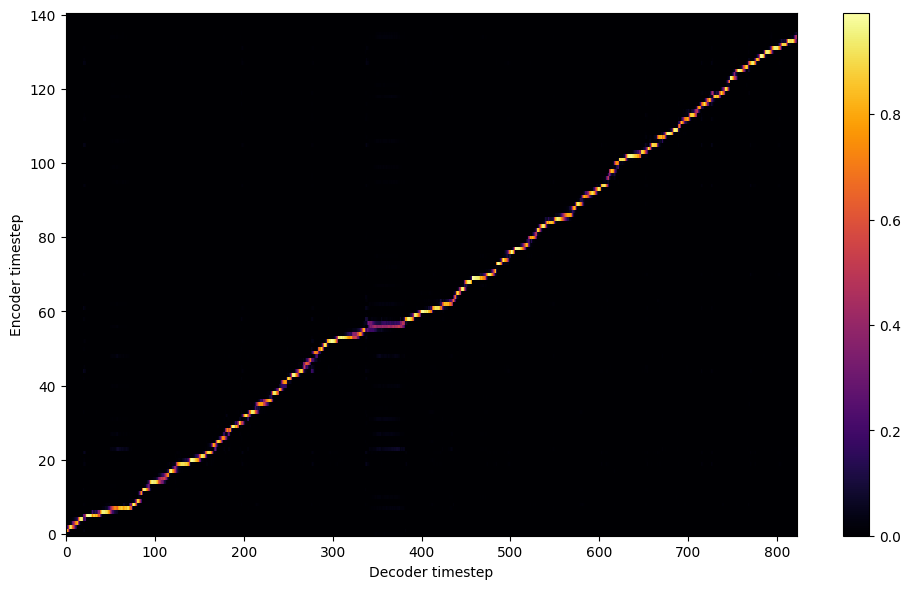


Starting Epoch: 53 Iteration: 159


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 53 Validation loss 162:  0.188648  Time: 0.2m LR: 0.000300


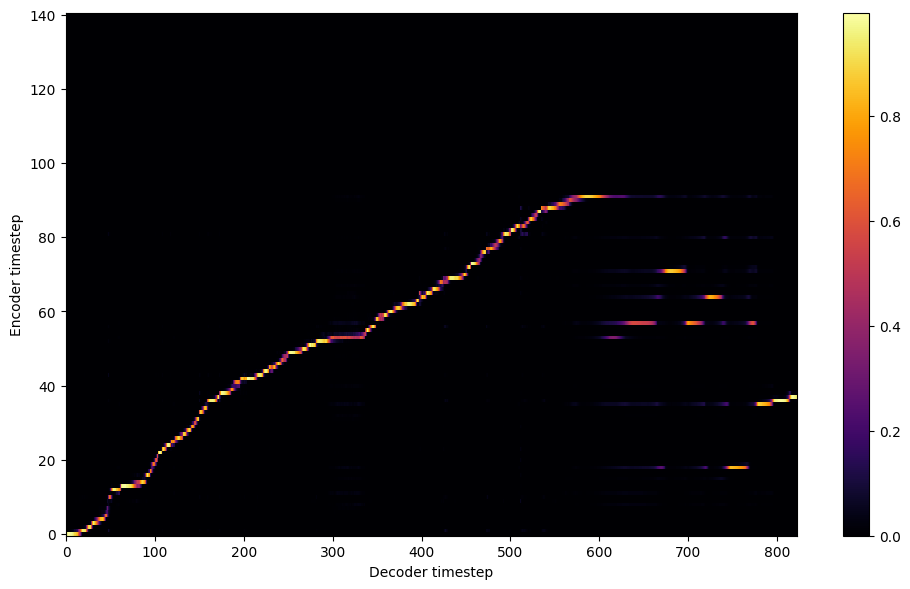


Starting Epoch: 54 Iteration: 162


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 54 Validation loss 165:  0.184873  Time: 0.2m LR: 0.000300


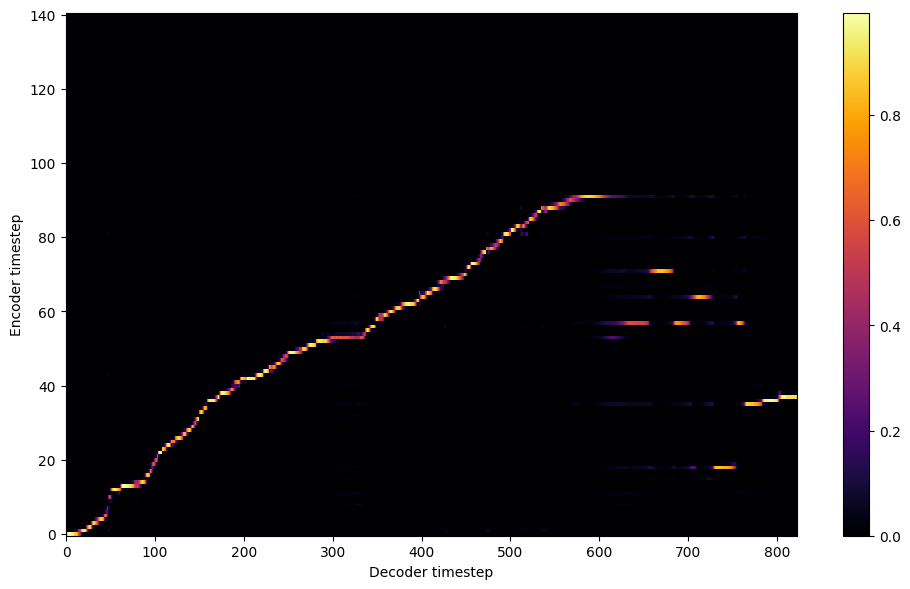


Starting Epoch: 55 Iteration: 165


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 55 Validation loss 168:  0.185464  Time: 0.3m LR: 0.000300


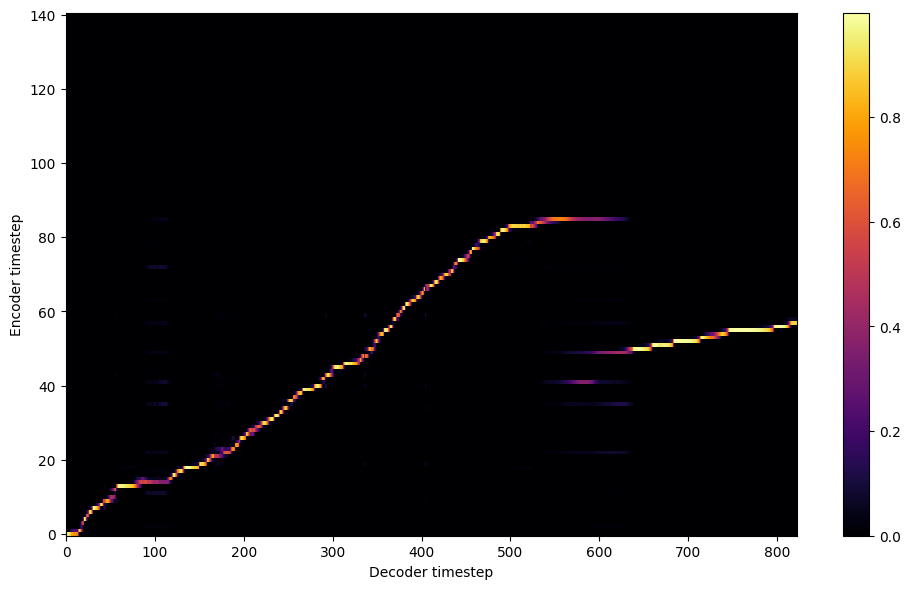


Starting Epoch: 56 Iteration: 168


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 56 Validation loss 171:  0.182016  Time: 0.3m LR: 0.000300


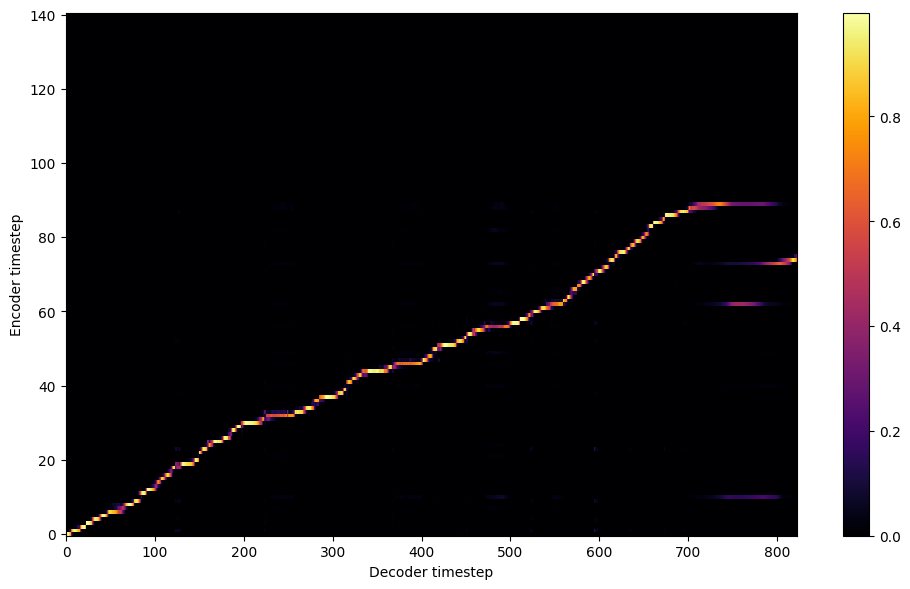


Starting Epoch: 57 Iteration: 171


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 57 Validation loss 174:  0.181607  Time: 0.3m LR: 0.000300


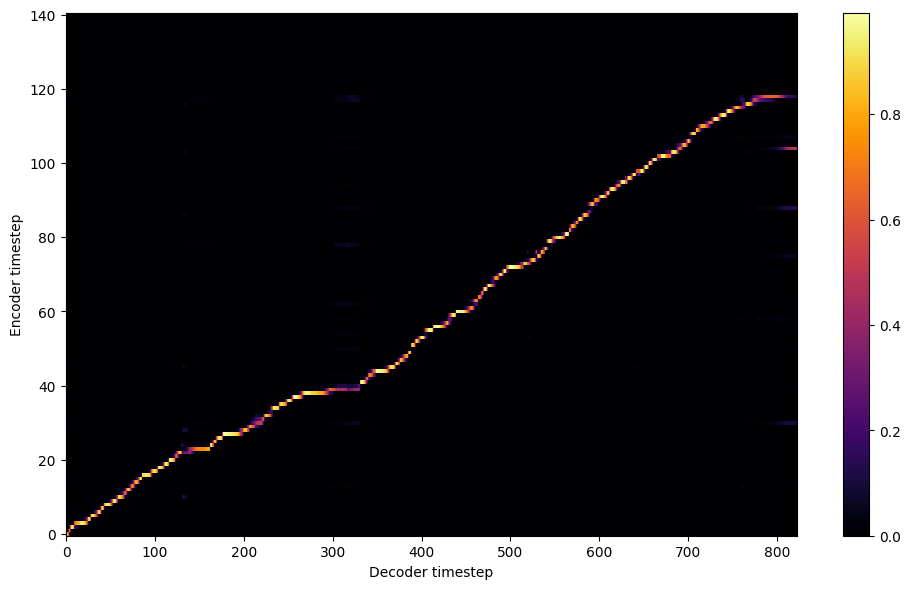


Starting Epoch: 58 Iteration: 174


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 58 Validation loss 177:  0.179166  Time: 0.3m LR: 0.000300


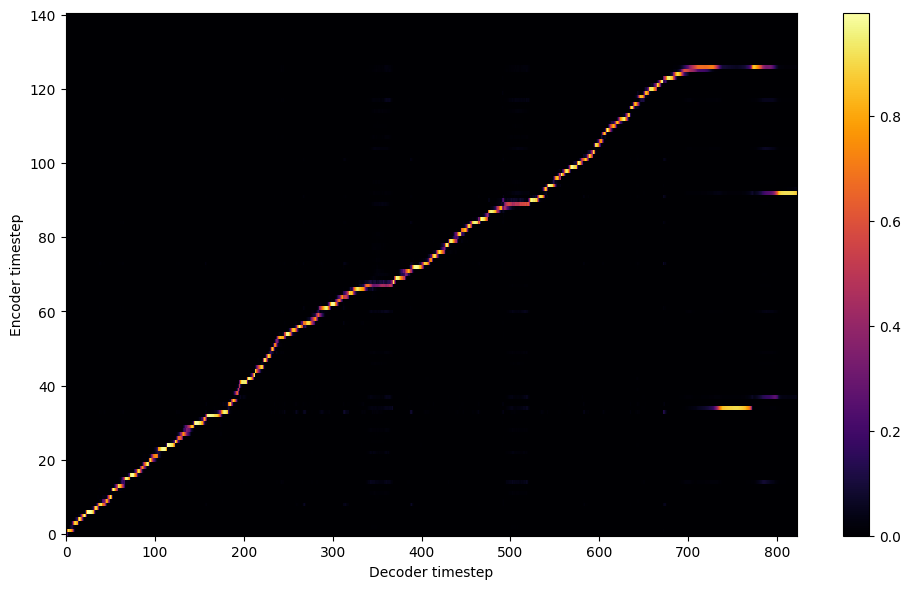


Starting Epoch: 59 Iteration: 177


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 59 Validation loss 180:  0.177360  Time: 0.2m LR: 0.000300


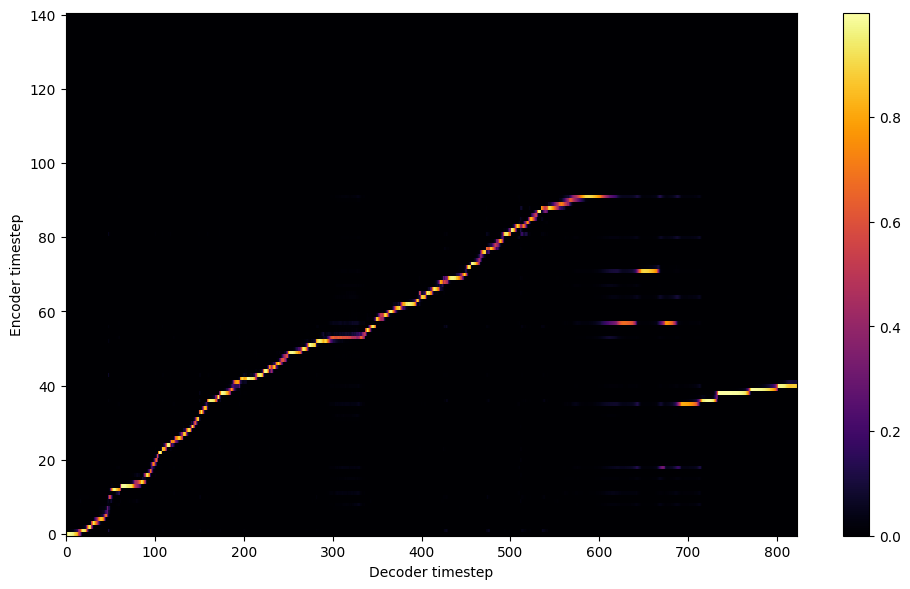

Saving model and optimizer state at iteration 180 to /content/drive/MyDrive/colab/outdir/TTS tacotron
Model Saved

Starting Epoch: 60 Iteration: 180


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 60 Validation loss 183:  0.179911  Time: 0.3m LR: 0.000300


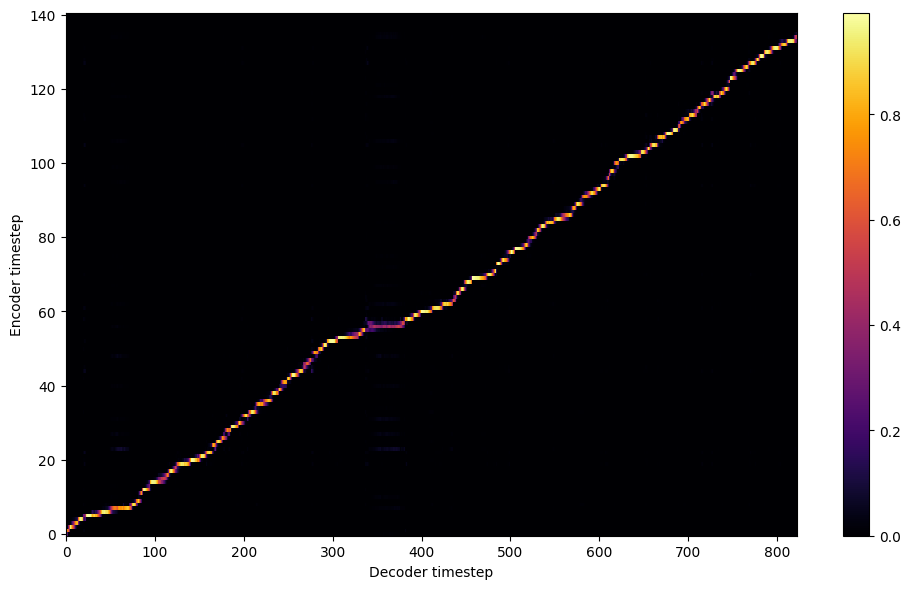


Starting Epoch: 61 Iteration: 183


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 61 Validation loss 186:  0.178348  Time: 0.3m LR: 0.000300


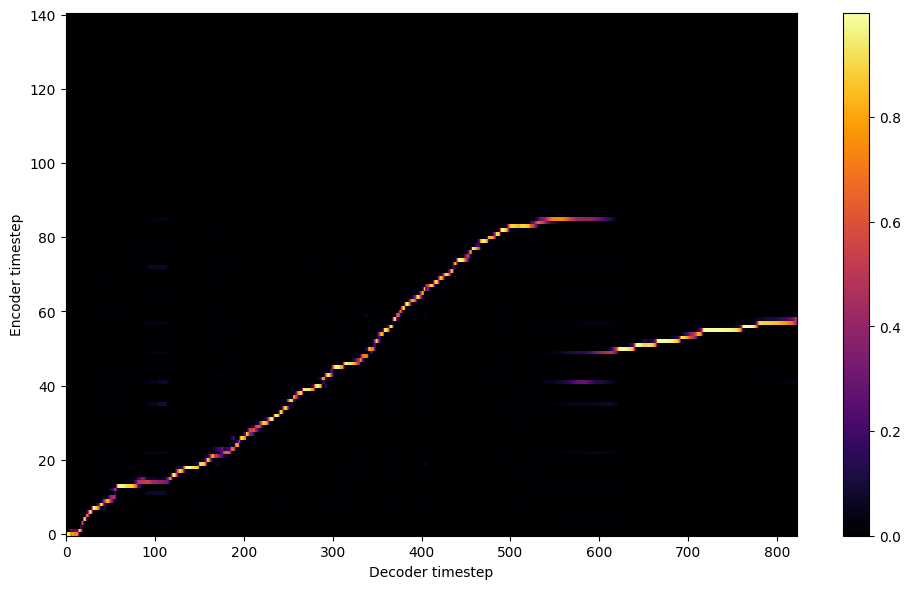


Starting Epoch: 62 Iteration: 186


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 62 Validation loss 189:  0.176865  Time: 0.3m LR: 0.000300


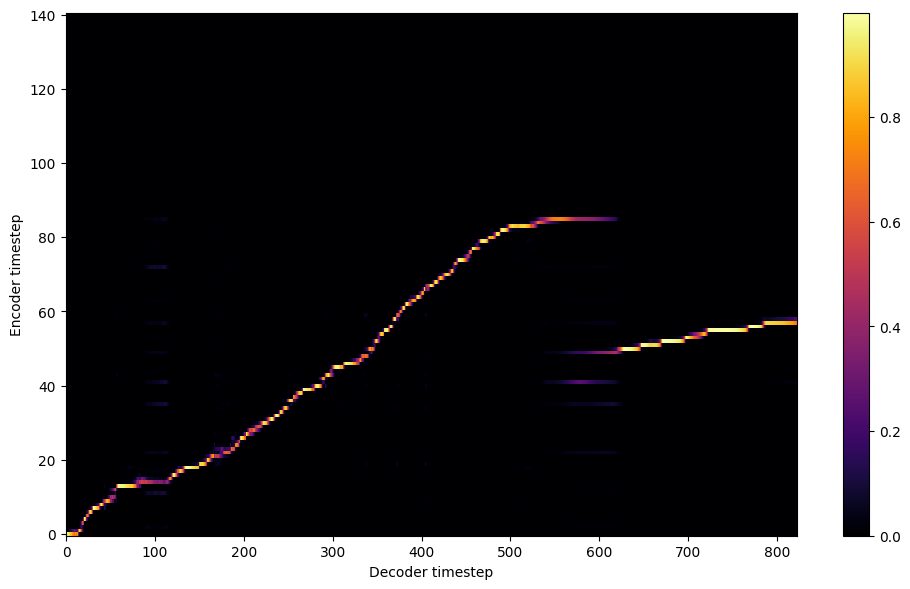


Starting Epoch: 63 Iteration: 189


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 63 Validation loss 192:  0.173766  Time: 0.2m LR: 0.000300


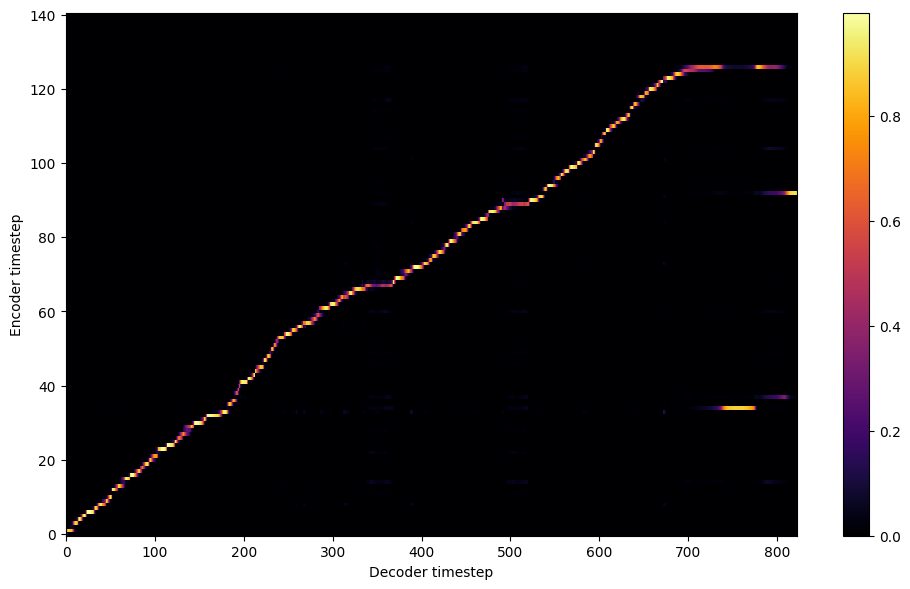


Starting Epoch: 64 Iteration: 192


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 64 Validation loss 195:  0.173233  Time: 0.3m LR: 0.000300


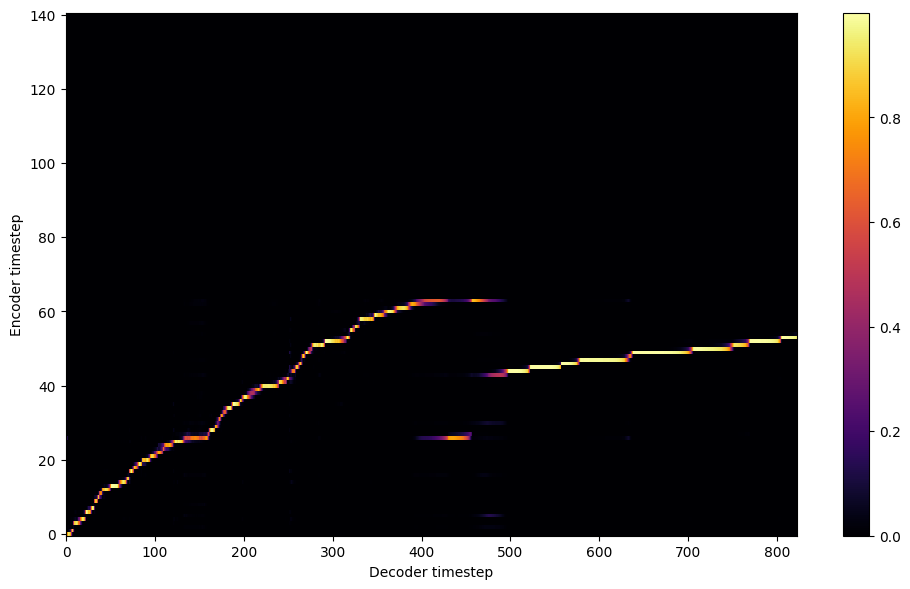


Starting Epoch: 65 Iteration: 195


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 65 Validation loss 198:  0.172417  Time: 0.2m LR: 0.000300


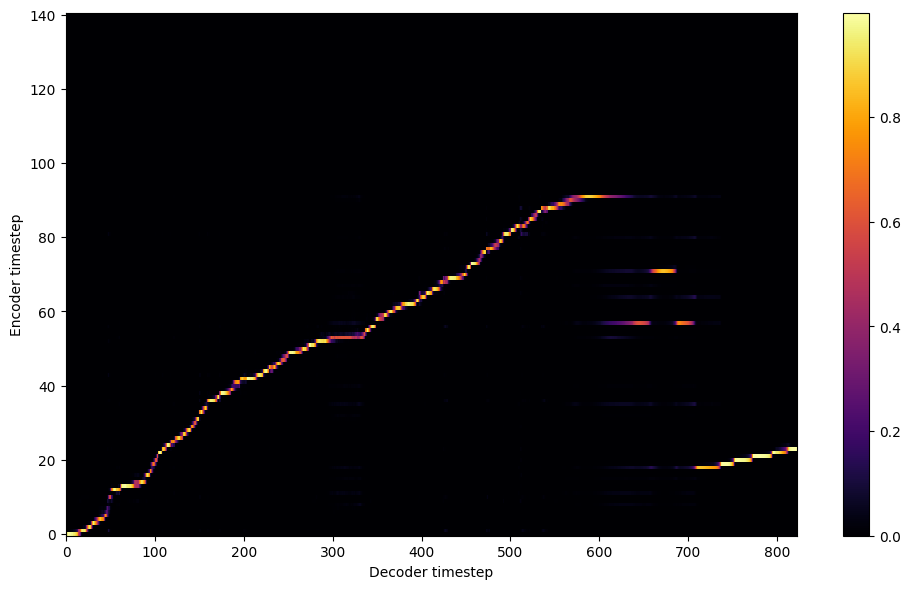


Starting Epoch: 66 Iteration: 198


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 66 Validation loss 201:  0.172272  Time: 0.3m LR: 0.000300


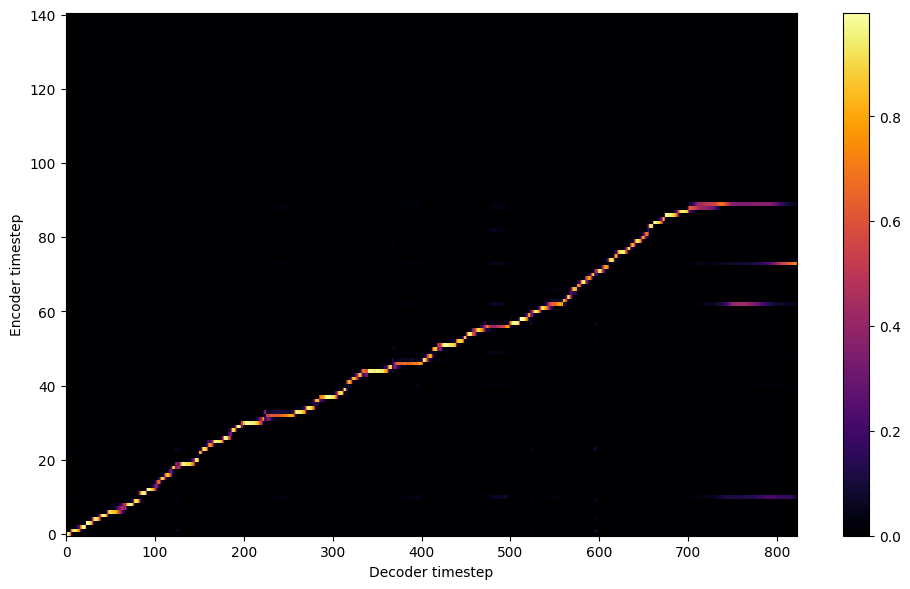


Starting Epoch: 67 Iteration: 201


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 67 Validation loss 204:  0.171353  Time: 0.3m LR: 0.000300


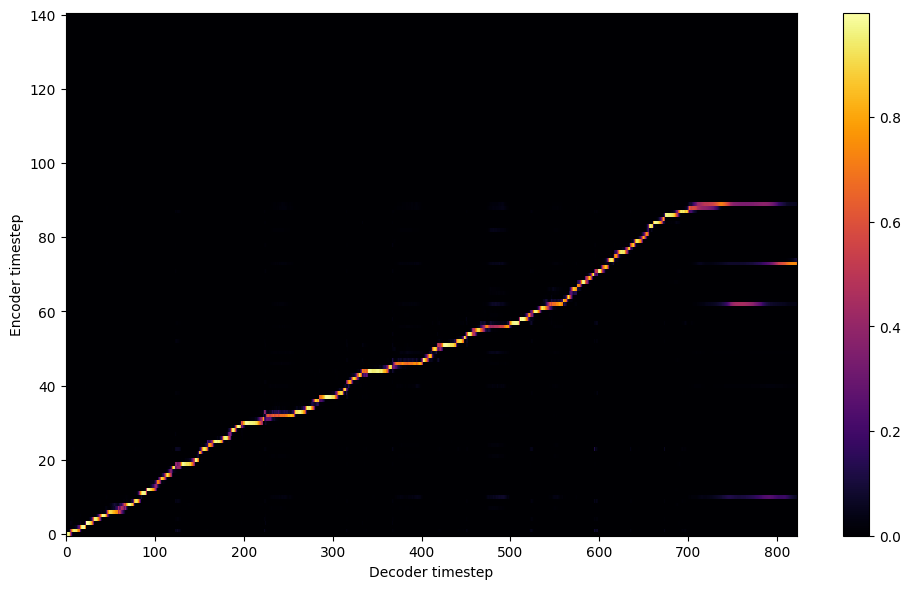


Starting Epoch: 68 Iteration: 204


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 68 Validation loss 207:  0.170747  Time: 0.3m LR: 0.000300


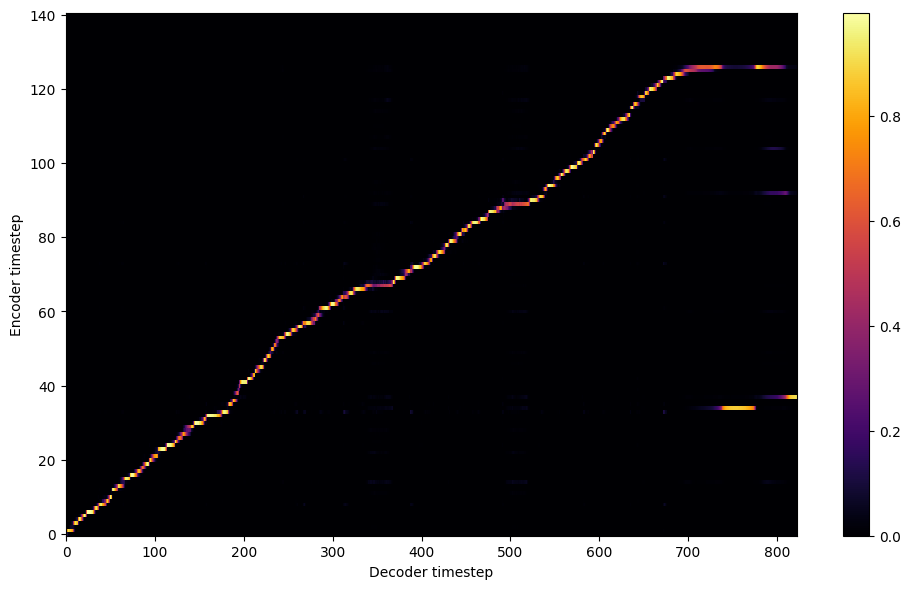


Starting Epoch: 69 Iteration: 207


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 69 Validation loss 210:  0.169556  Time: 0.3m LR: 0.000300


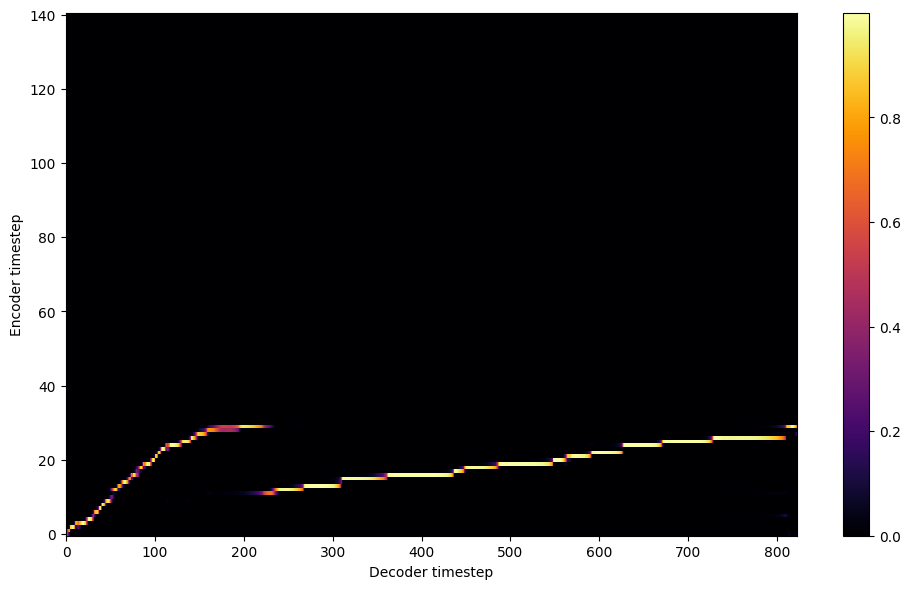

Saving model and optimizer state at iteration 210 to /content/drive/MyDrive/colab/outdir/TTS tacotron
Model Saved

Starting Epoch: 70 Iteration: 210


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 70 Validation loss 213:  0.168603  Time: 0.3m LR: 0.000300


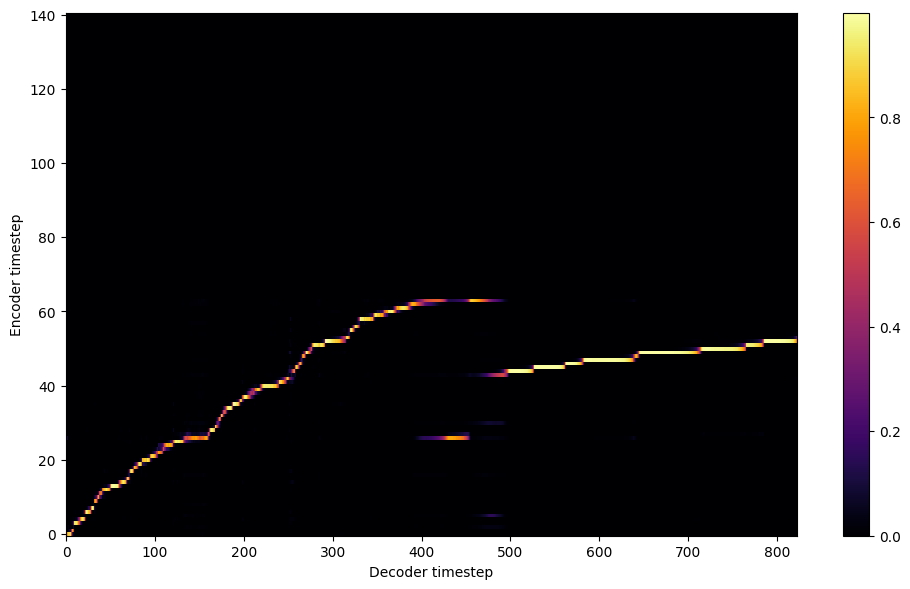


Starting Epoch: 71 Iteration: 213


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 71 Validation loss 216:  0.167716  Time: 0.3m LR: 0.000300


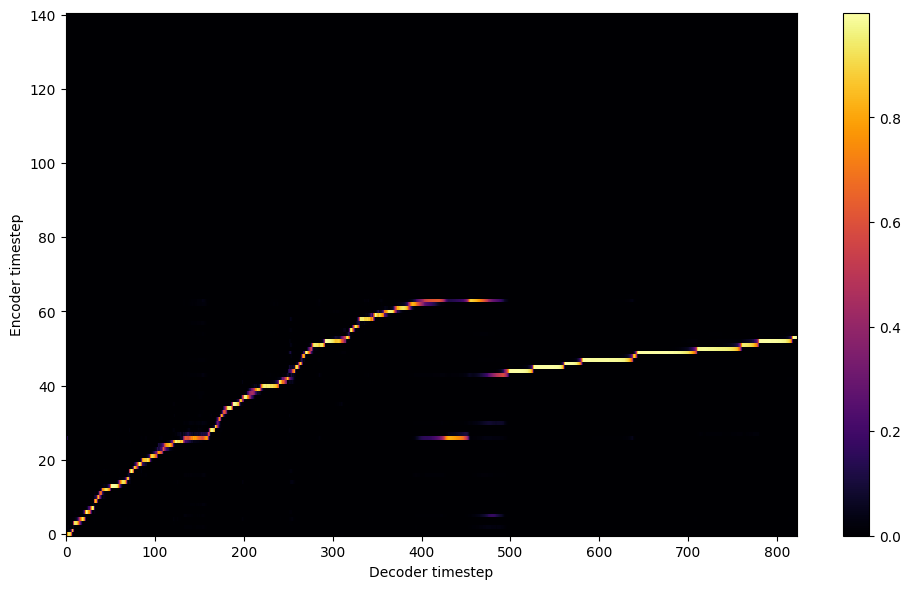


Starting Epoch: 72 Iteration: 216


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 72 Validation loss 219:  0.167633  Time: 0.3m LR: 0.000300


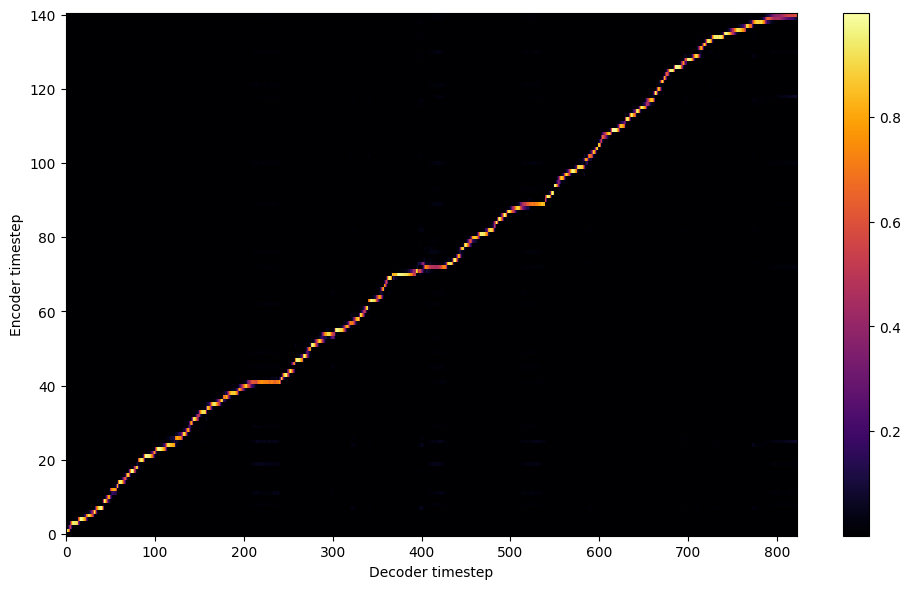


Starting Epoch: 73 Iteration: 219


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 73 Validation loss 222:  0.167951  Time: 0.3m LR: 0.000300


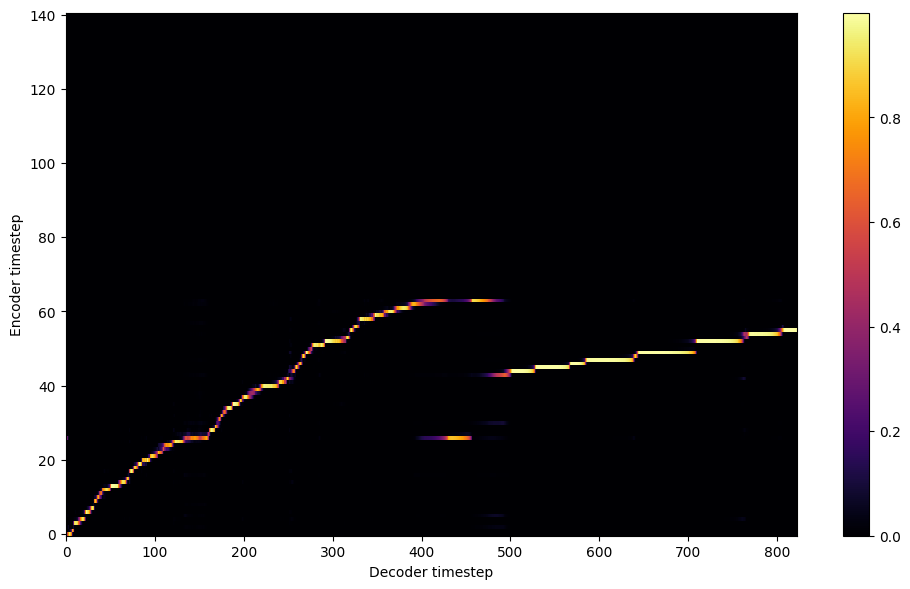


Starting Epoch: 74 Iteration: 222


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 74 Validation loss 225:  0.166305  Time: 0.2m LR: 0.000300


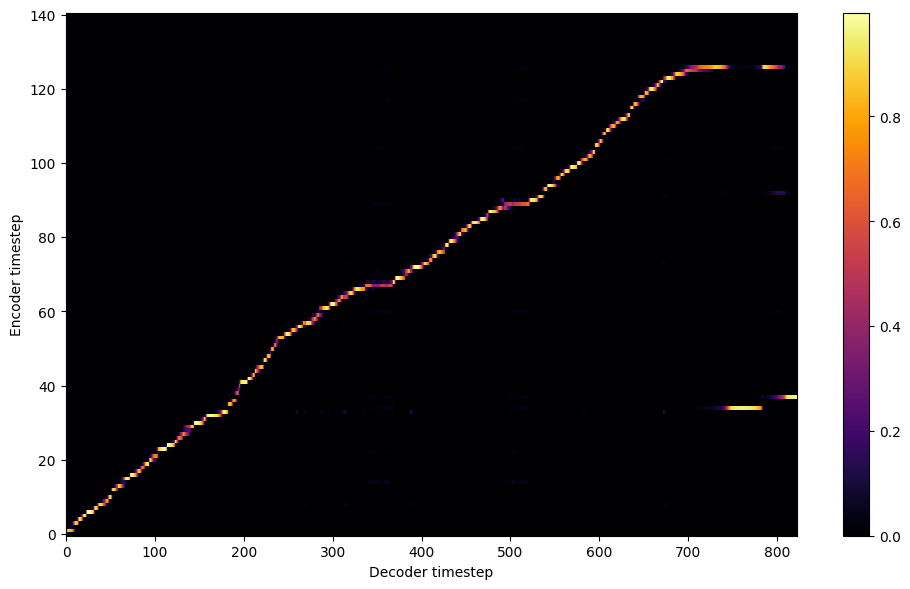


Starting Epoch: 75 Iteration: 225


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 75 Validation loss 228:  0.166528  Time: 0.3m LR: 0.000300


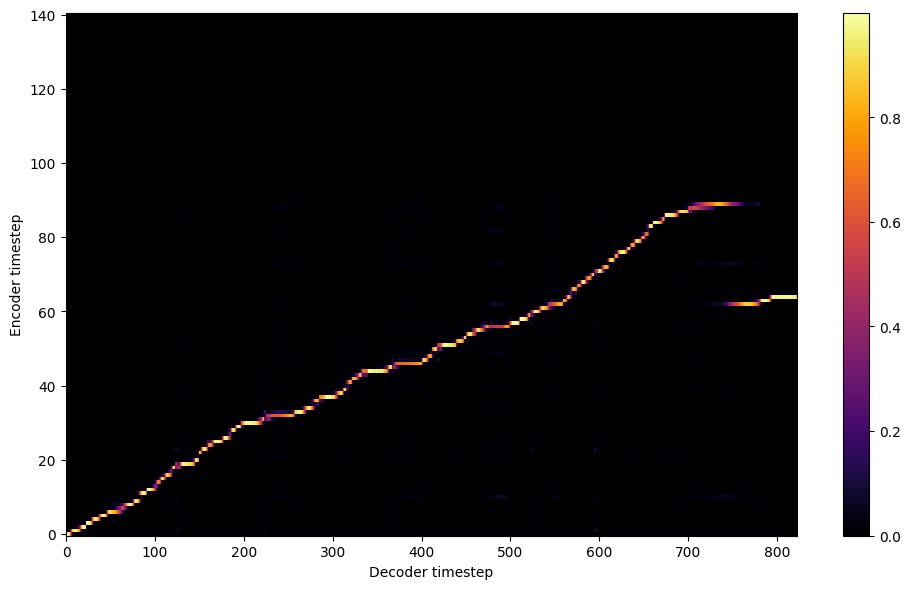


Starting Epoch: 76 Iteration: 228


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 76 Validation loss 231:  0.165611  Time: 0.2m LR: 0.000300


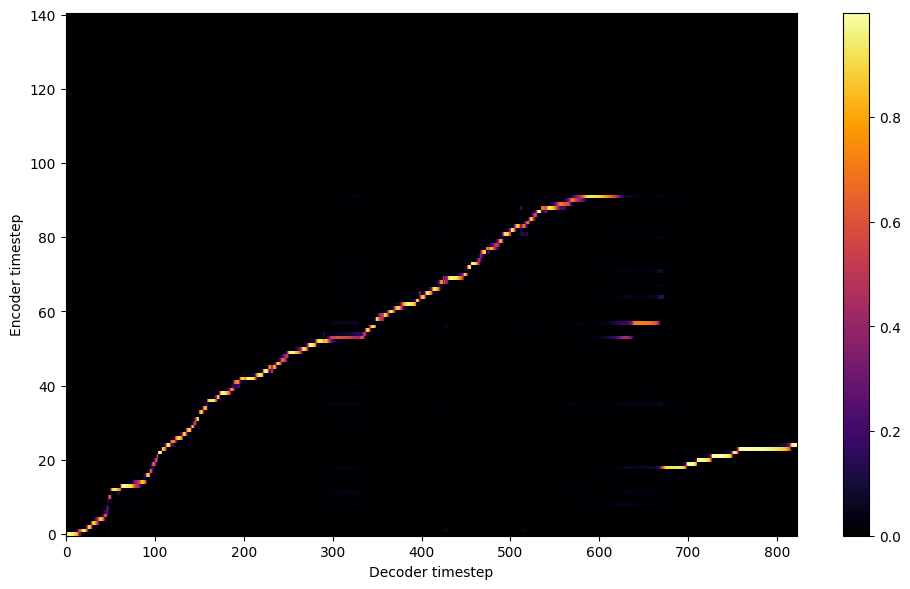


Starting Epoch: 77 Iteration: 231


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 77 Validation loss 234:  0.165699  Time: 0.3m LR: 0.000300


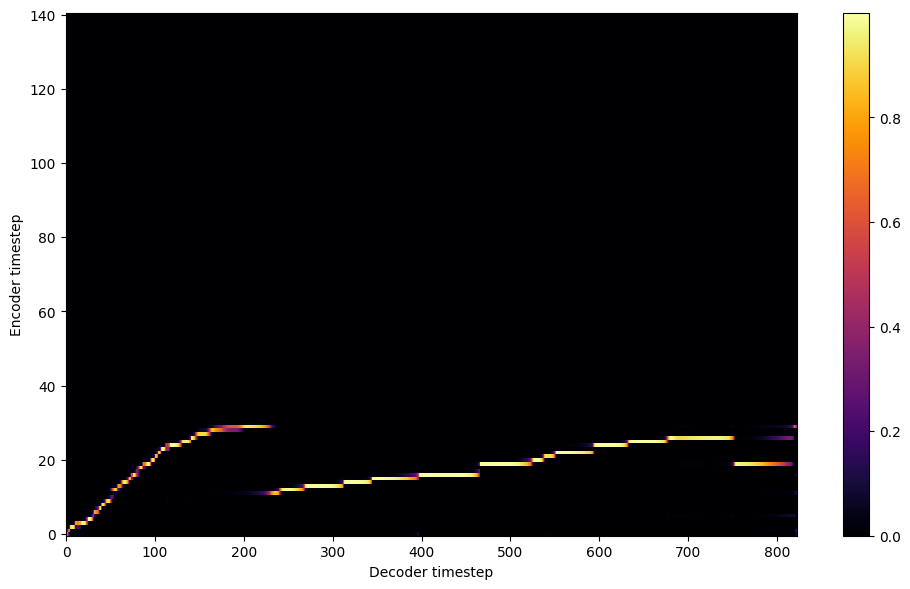


Starting Epoch: 78 Iteration: 234


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 78 Validation loss 237:  0.164182  Time: 0.3m LR: 0.000300


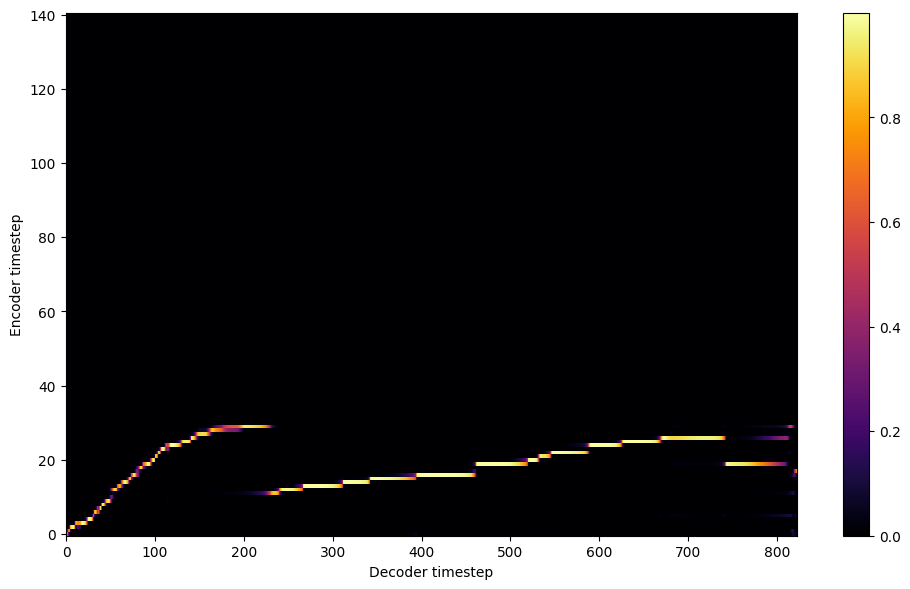


Starting Epoch: 79 Iteration: 237


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 79 Validation loss 240:  0.162570  Time: 0.2m LR: 0.000300


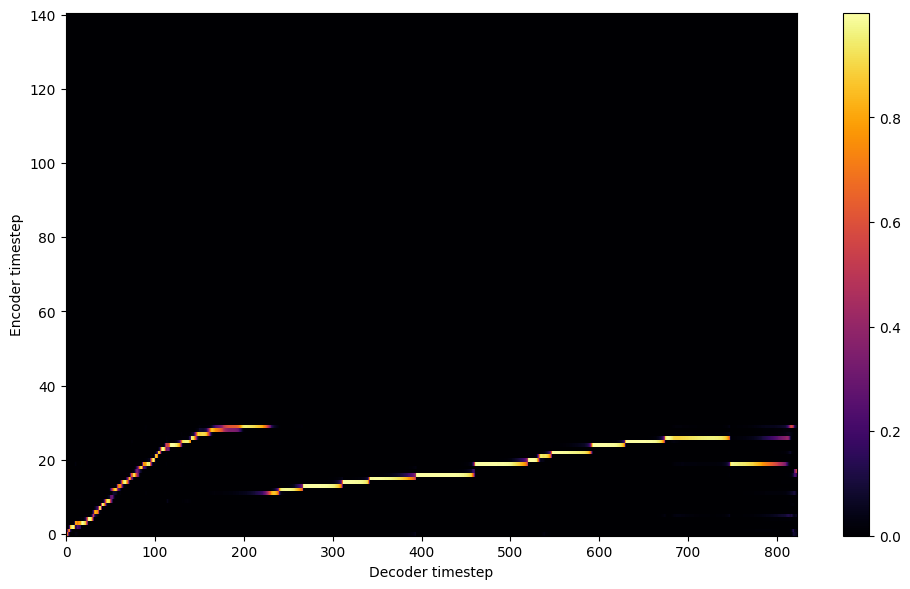

Saving model and optimizer state at iteration 240 to /content/drive/MyDrive/colab/outdir/TTS tacotron
Model Saved

Starting Epoch: 80 Iteration: 240


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 80 Validation loss 243:  0.162673  Time: 0.3m LR: 0.000300


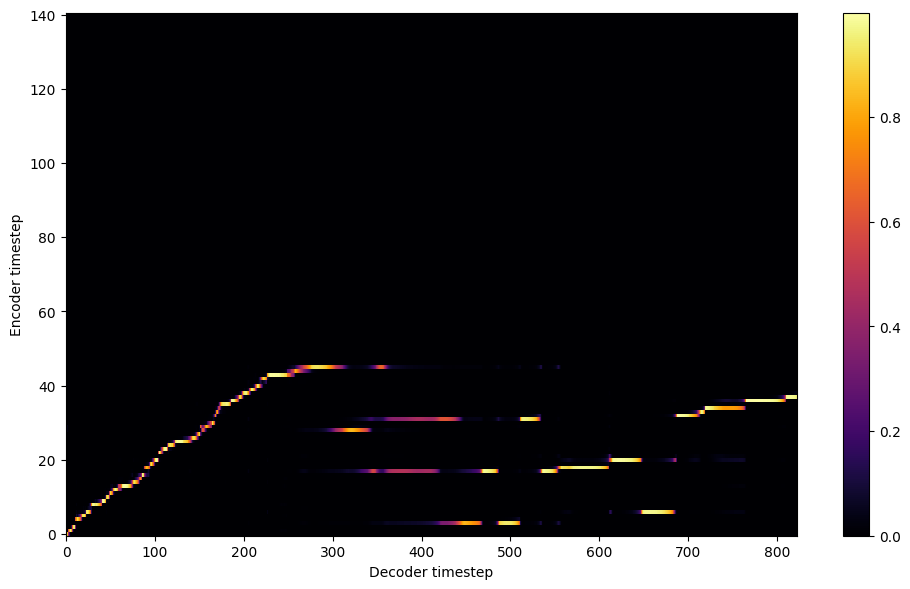


Starting Epoch: 81 Iteration: 243


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 81 Validation loss 246:  0.163002  Time: 0.3m LR: 0.000300


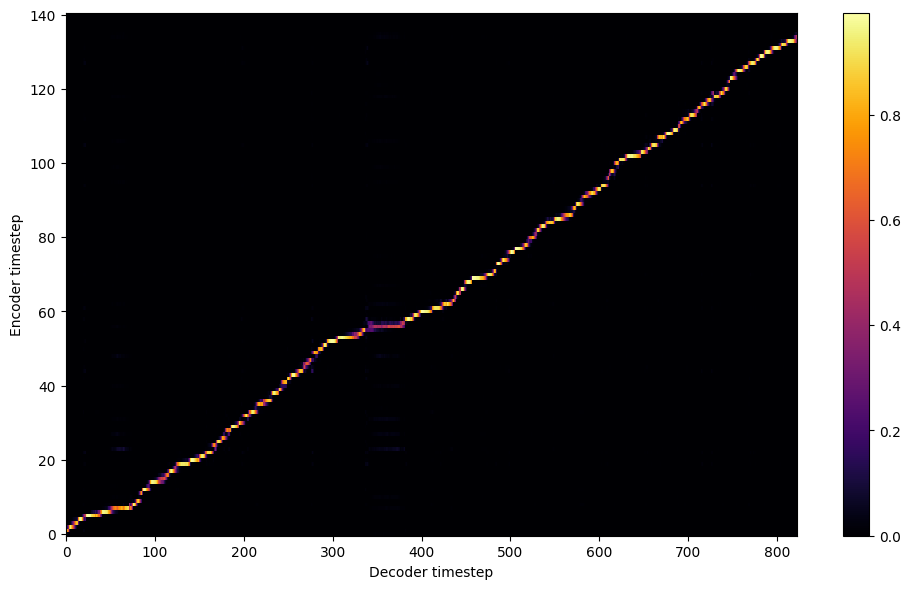


Starting Epoch: 82 Iteration: 246


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 82 Validation loss 249:  0.165388  Time: 0.3m LR: 0.000300


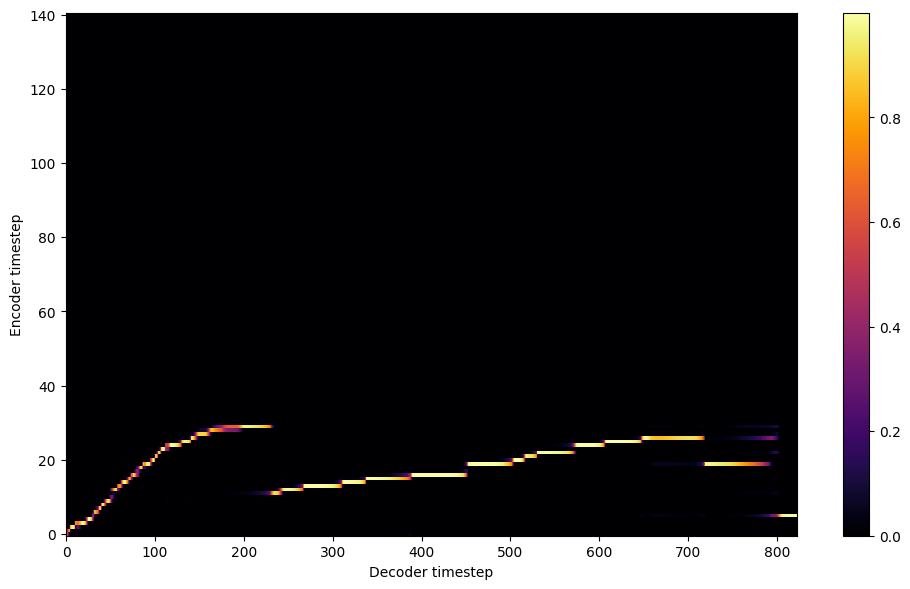


Starting Epoch: 83 Iteration: 249


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 83 Validation loss 252:  0.163214  Time: 0.3m LR: 0.000300


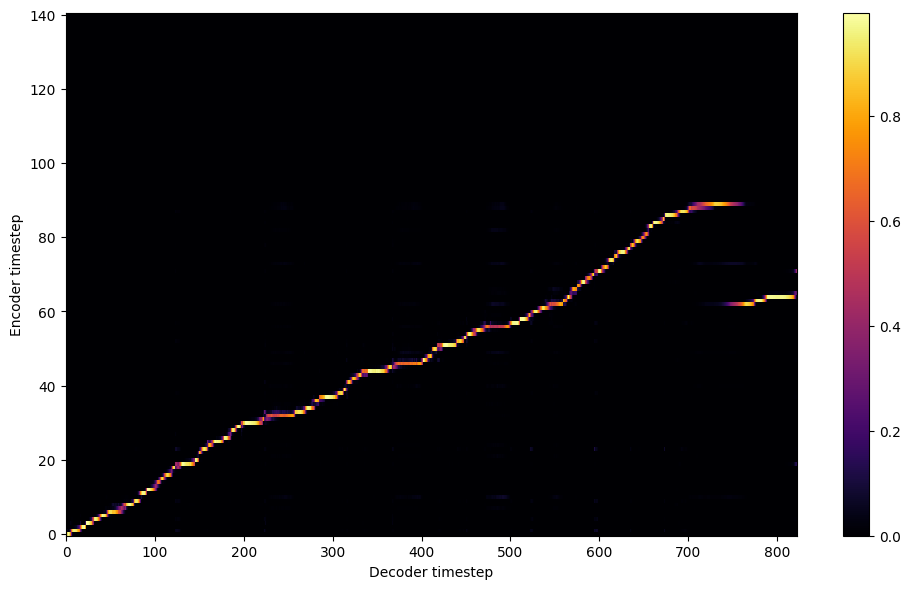


Starting Epoch: 84 Iteration: 252


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 84 Validation loss 255:  0.163334  Time: 0.3m LR: 0.000300


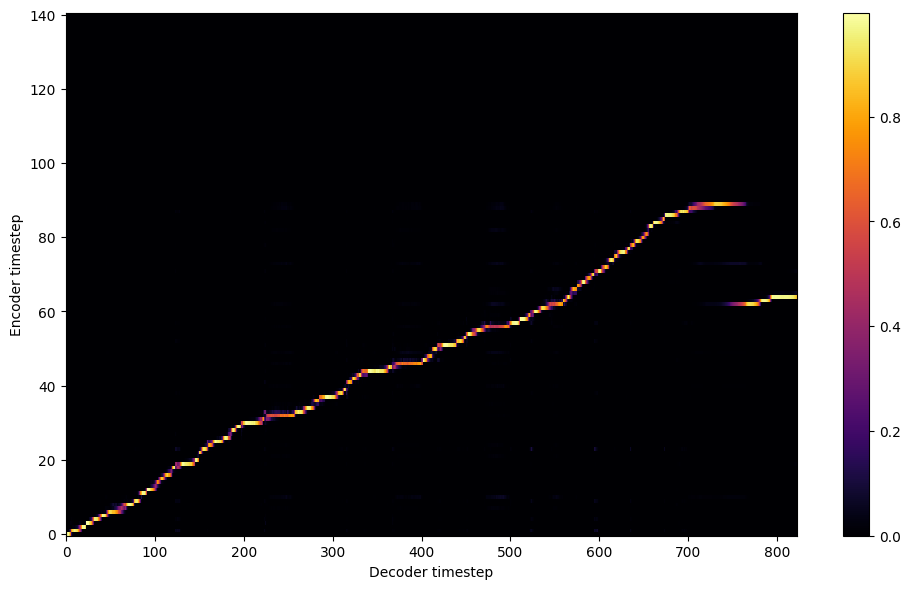


Starting Epoch: 85 Iteration: 255


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 85 Validation loss 258:  0.162469  Time: 0.3m LR: 0.000300


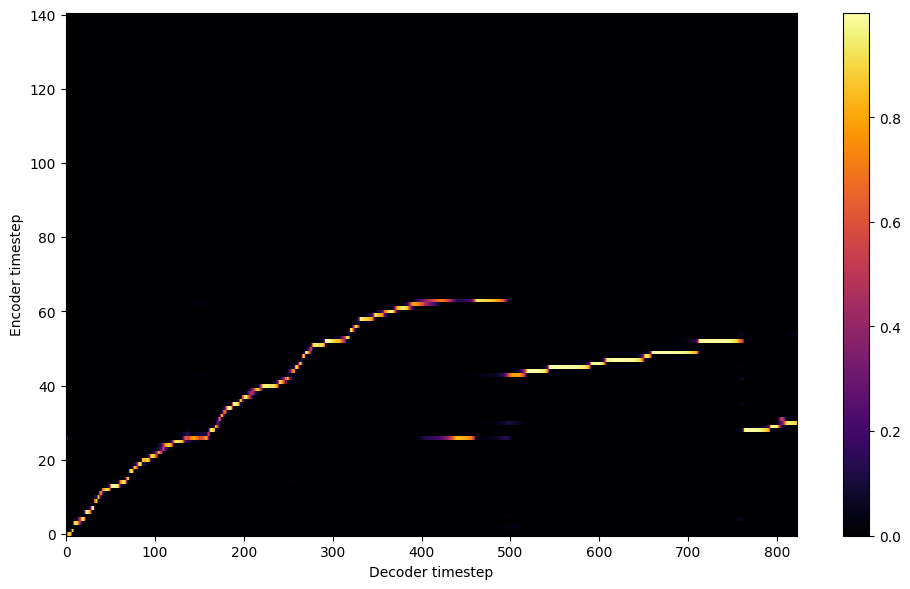


Starting Epoch: 86 Iteration: 258


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 86 Validation loss 261:  0.162353  Time: 0.3m LR: 0.000300


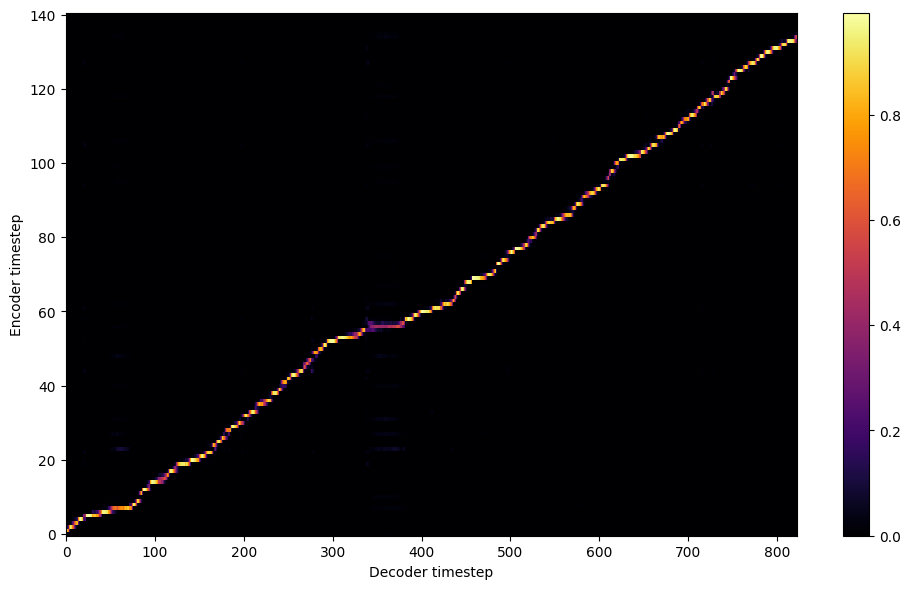


Starting Epoch: 87 Iteration: 261


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 87 Validation loss 264:  0.160757  Time: 0.2m LR: 0.000300


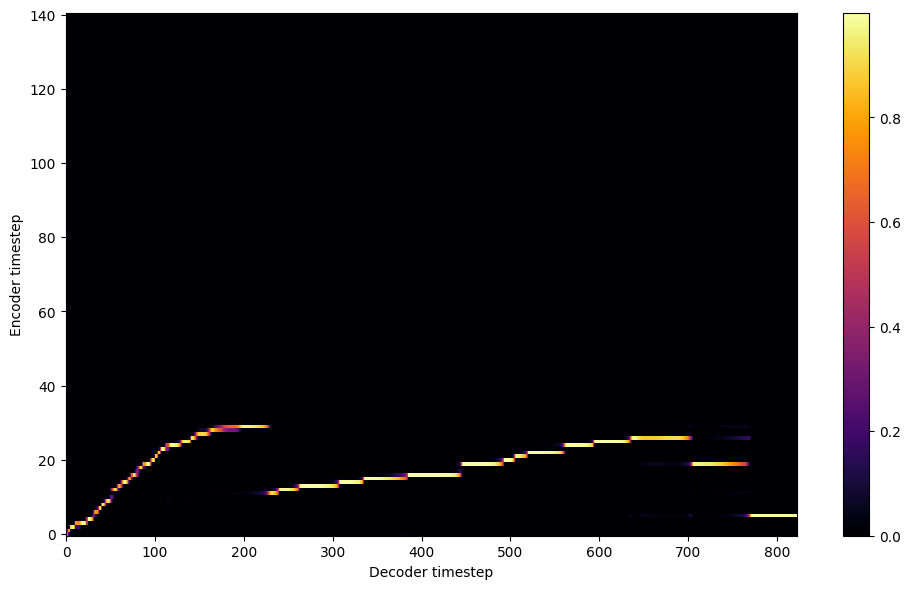


Starting Epoch: 88 Iteration: 264


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 88 Validation loss 267:  0.160739  Time: 0.2m LR: 0.000300


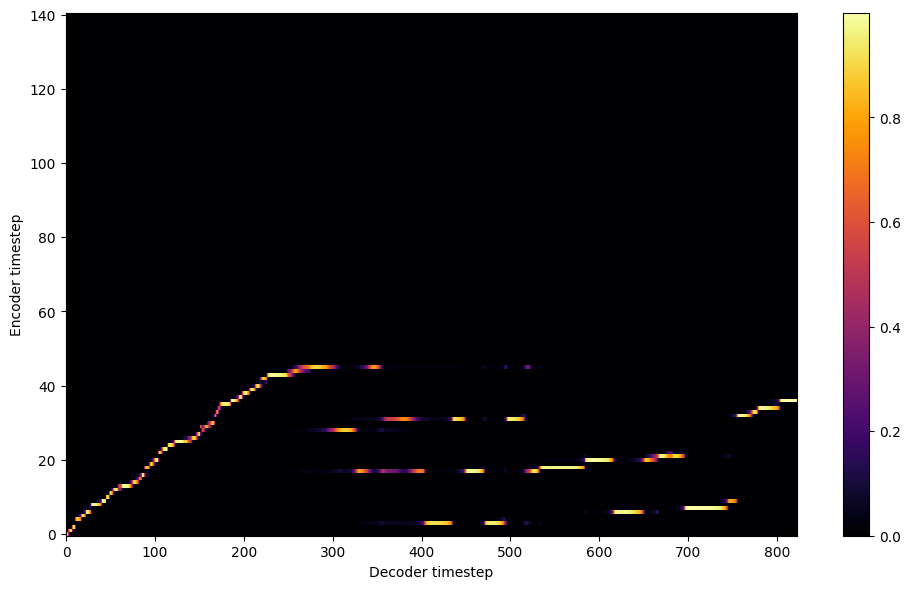


Starting Epoch: 89 Iteration: 267


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 89 Validation loss 270:  0.160451  Time: 0.3m LR: 0.000300


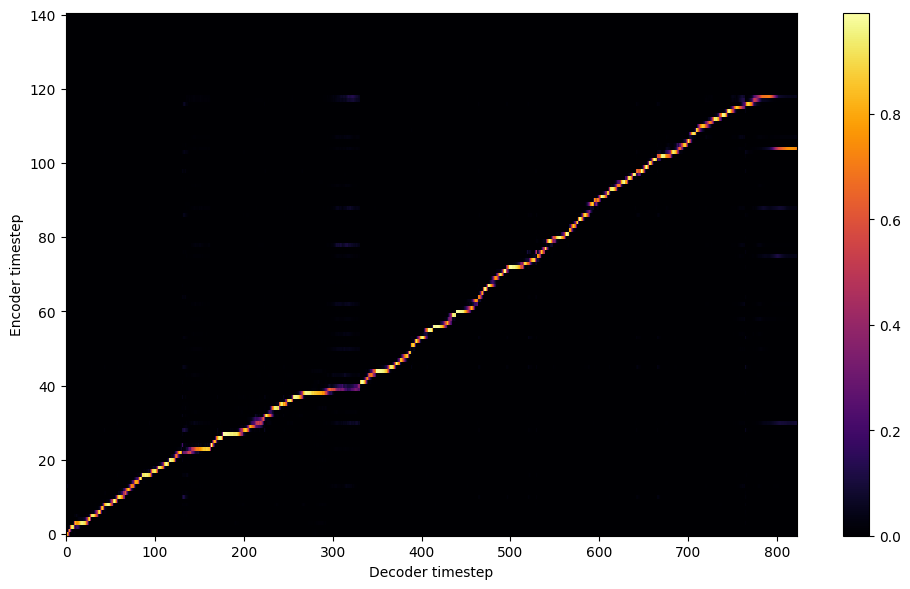

Saving model and optimizer state at iteration 270 to /content/drive/MyDrive/colab/outdir/TTS tacotron
Model Saved

Starting Epoch: 90 Iteration: 270


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 90 Validation loss 273:  0.157374  Time: 0.3m LR: 0.000300


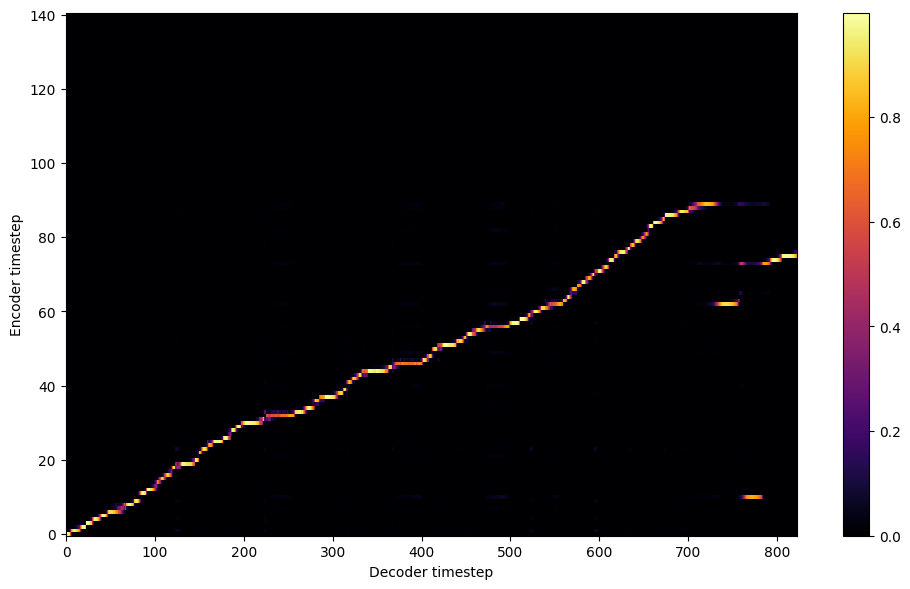


Starting Epoch: 91 Iteration: 273


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 91 Validation loss 276:  0.157543  Time: 0.2m LR: 0.000300


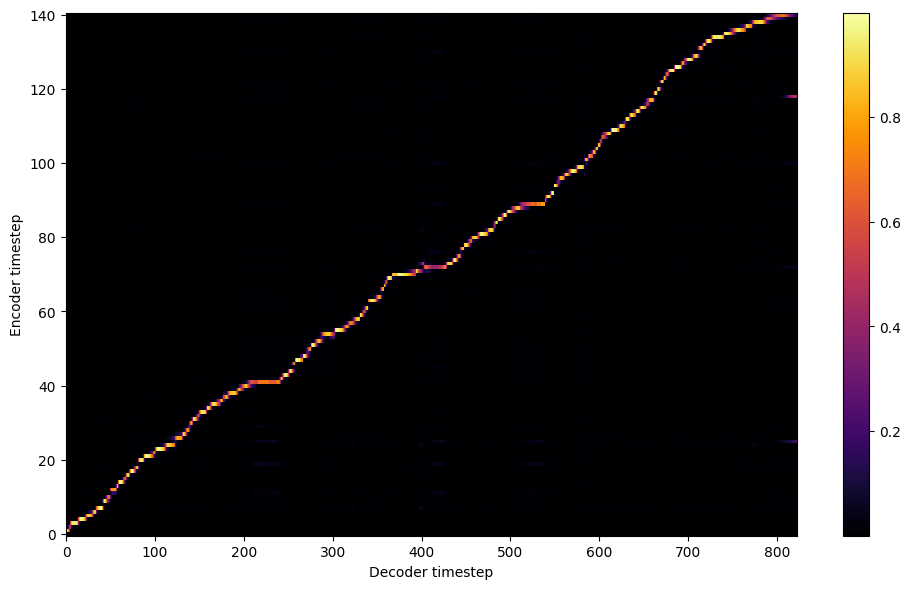


Starting Epoch: 92 Iteration: 276


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 92 Validation loss 279:  0.157169  Time: 0.2m LR: 0.000300


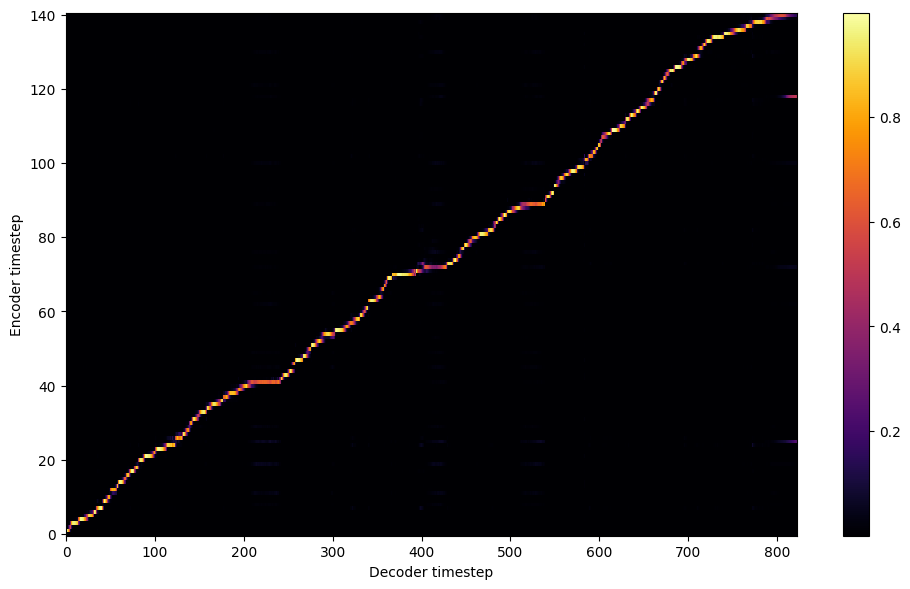


Starting Epoch: 93 Iteration: 279


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 93 Validation loss 282:  0.159666  Time: 0.3m LR: 0.000300


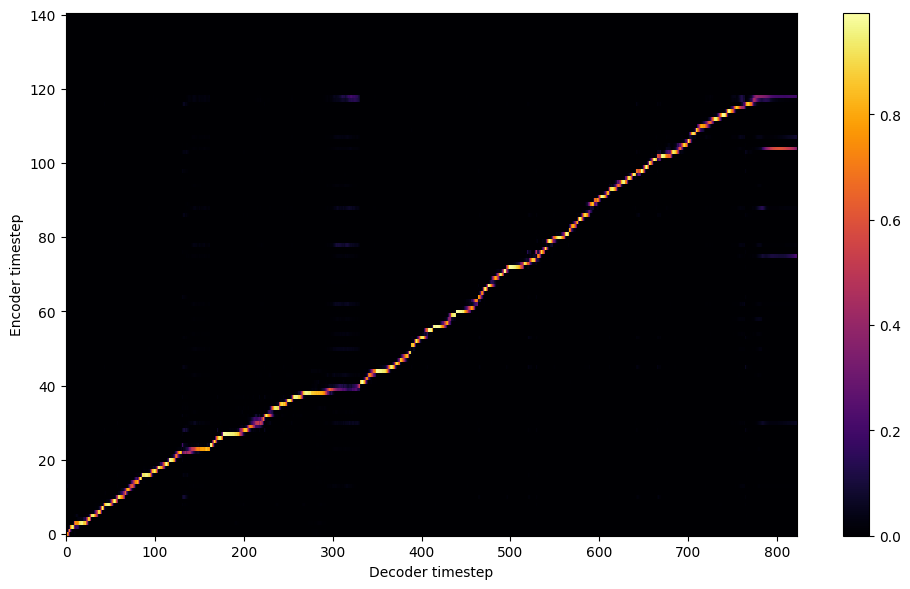


Starting Epoch: 94 Iteration: 282


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 94 Validation loss 285:  0.157352  Time: 0.3m LR: 0.000300


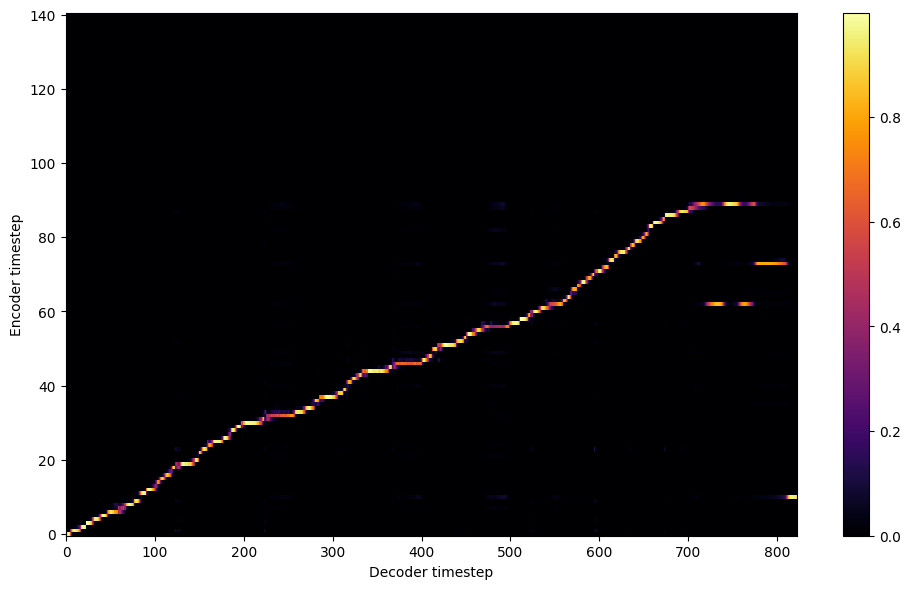


Starting Epoch: 95 Iteration: 285


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 95 Validation loss 288:  0.155898  Time: 0.3m LR: 0.000300


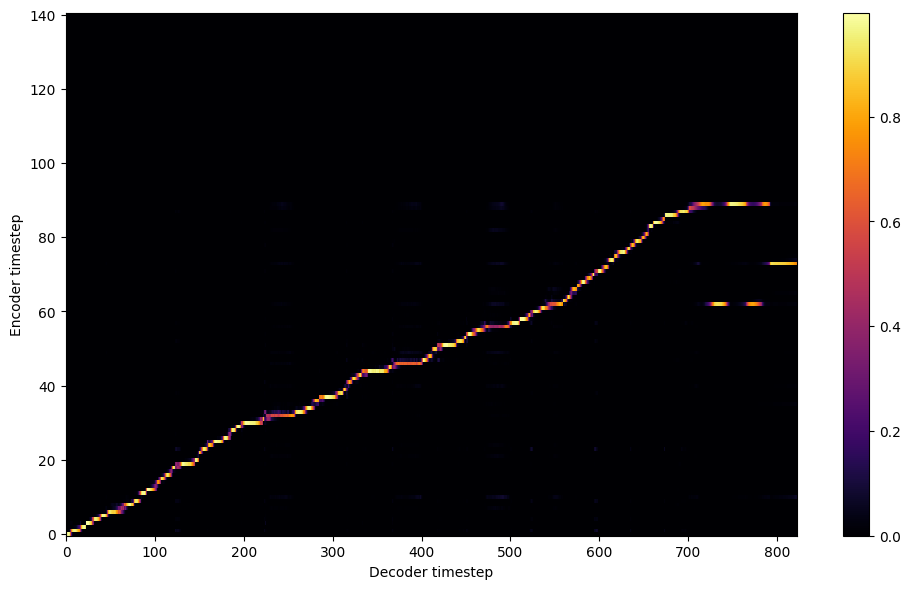


Starting Epoch: 96 Iteration: 288


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 96 Validation loss 291:  0.155839  Time: 0.3m LR: 0.000300


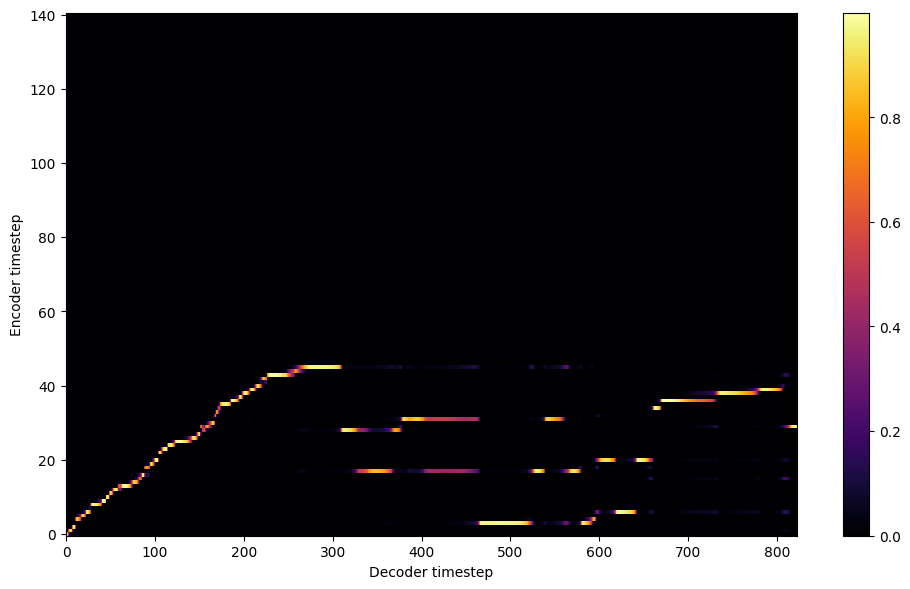


Starting Epoch: 97 Iteration: 291


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 97 Validation loss 294:  0.155004  Time: 0.3m LR: 0.000300


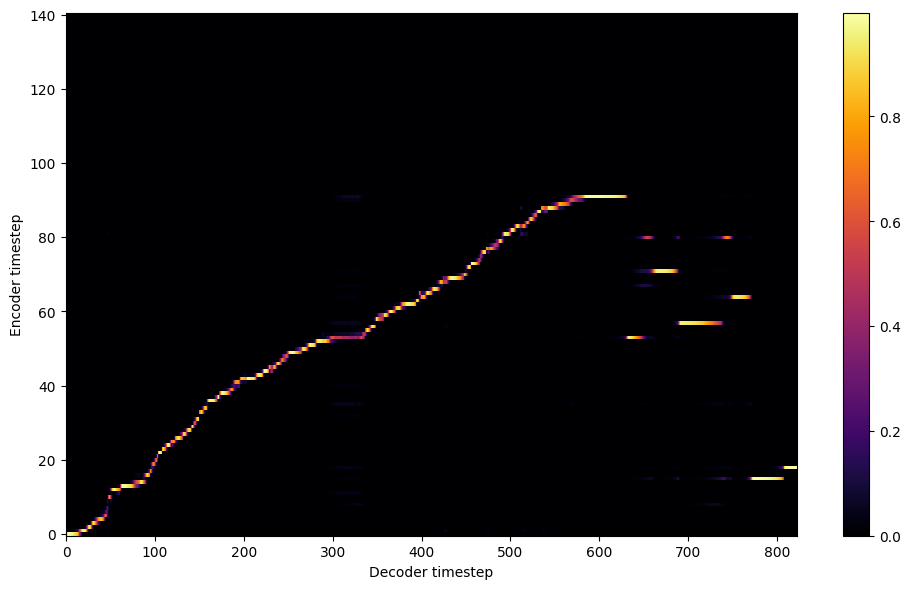


Starting Epoch: 98 Iteration: 294


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 98 Validation loss 297:  0.155127  Time: 0.2m LR: 0.000300


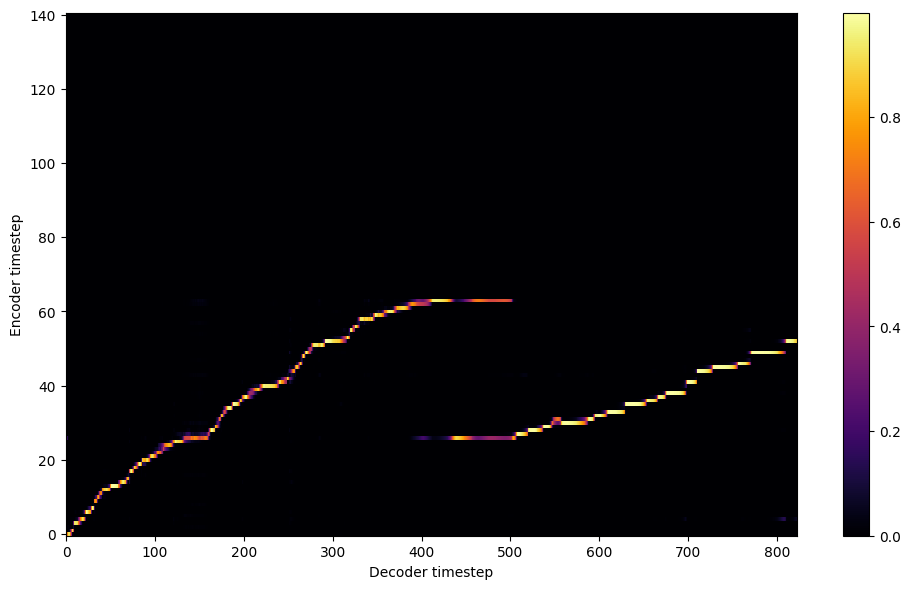


Starting Epoch: 99 Iteration: 297


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 99 Validation loss 300:  0.154346  Time: 0.2m LR: 0.000300


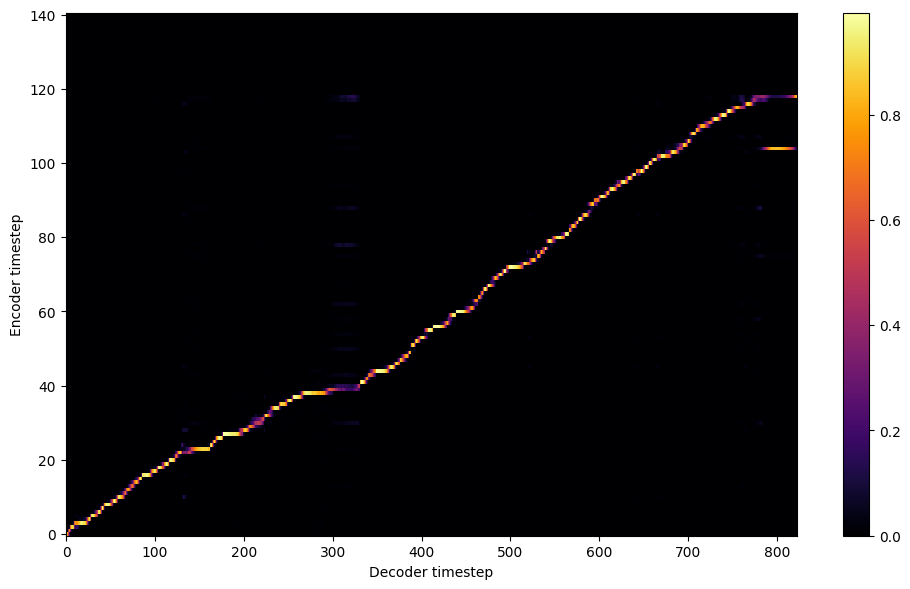

Saving model and optimizer state at iteration 300 to /content/drive/MyDrive/colab/outdir/TTS tacotron
Model Saved

Starting Epoch: 100 Iteration: 300


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 100 Validation loss 303:  0.153836  Time: 0.3m LR: 0.000300


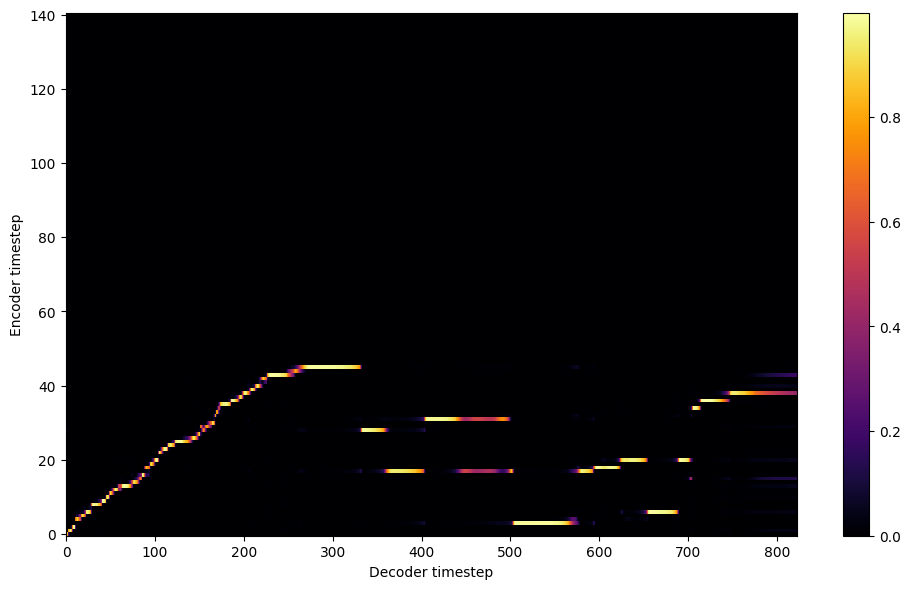


Starting Epoch: 101 Iteration: 303


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 101 Validation loss 306:  0.152679  Time: 0.2m LR: 0.000300


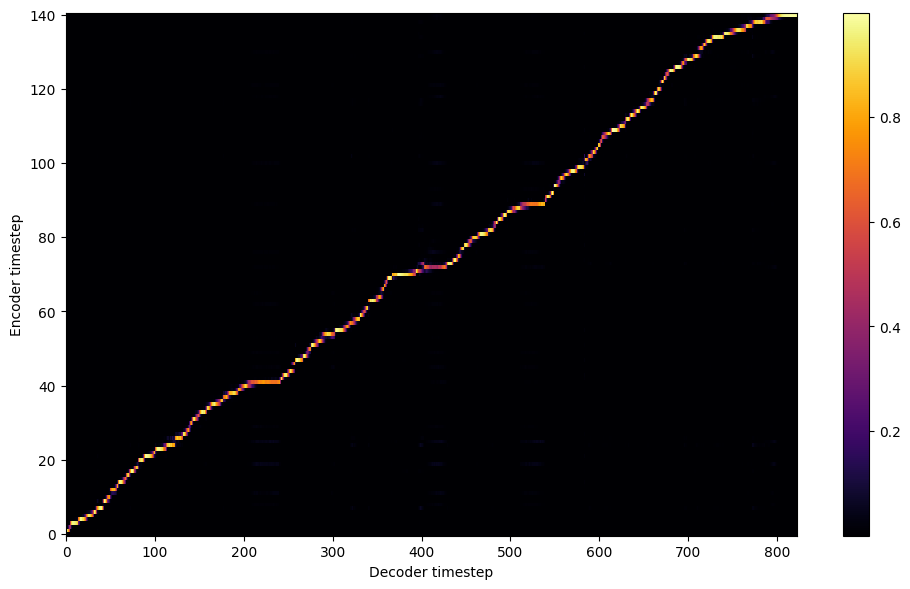


Starting Epoch: 102 Iteration: 306


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 102 Validation loss 309:  0.153607  Time: 0.3m LR: 0.000300


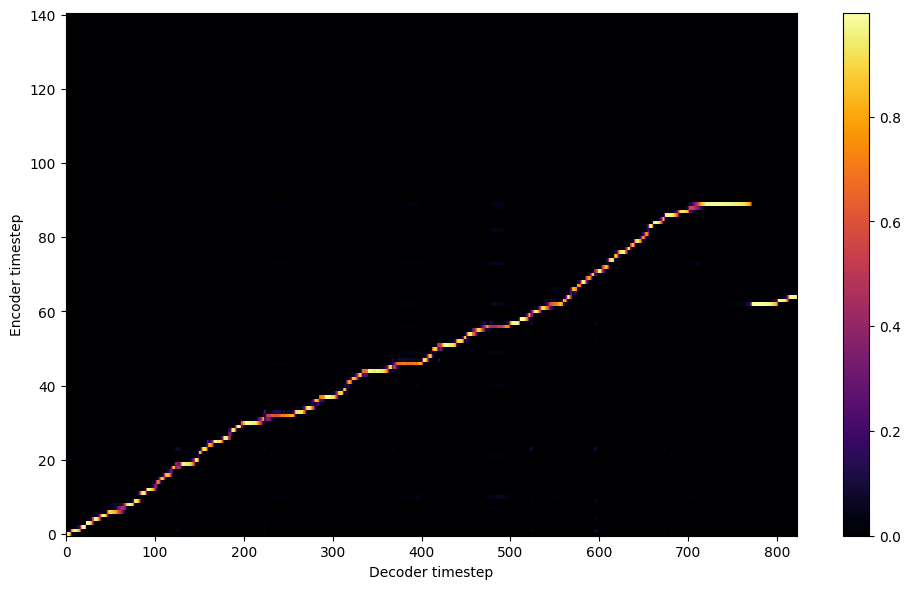


Starting Epoch: 103 Iteration: 309


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 103 Validation loss 312:  0.152141  Time: 0.3m LR: 0.000300


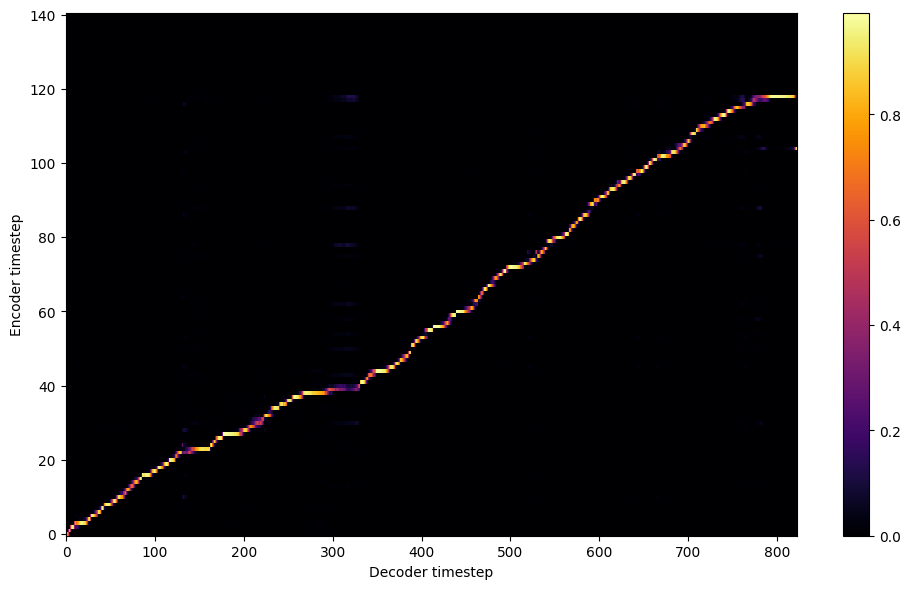


Starting Epoch: 104 Iteration: 312


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 104 Validation loss 315:  0.151585  Time: 0.3m LR: 0.000300


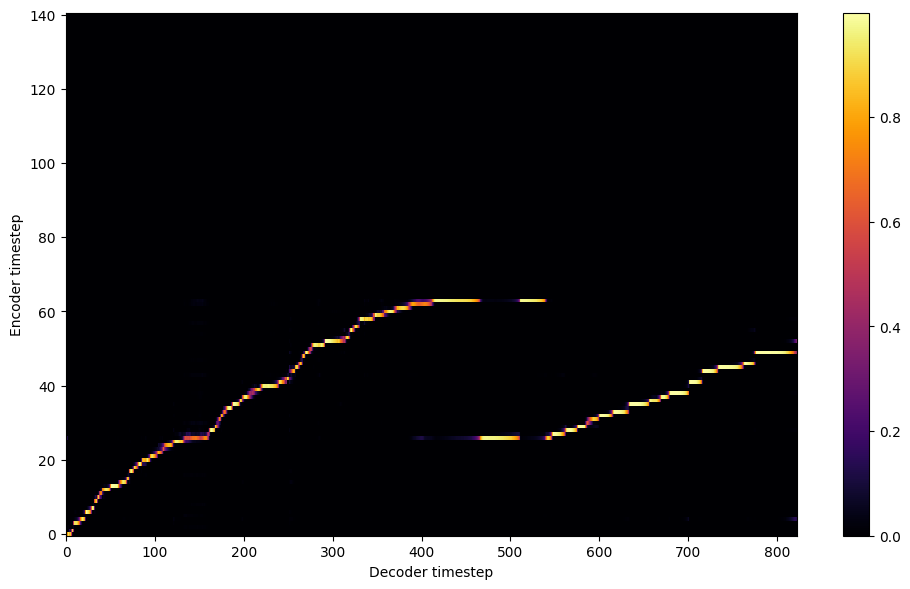


Starting Epoch: 105 Iteration: 315


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 105 Validation loss 318:  0.151398  Time: 0.3m LR: 0.000300


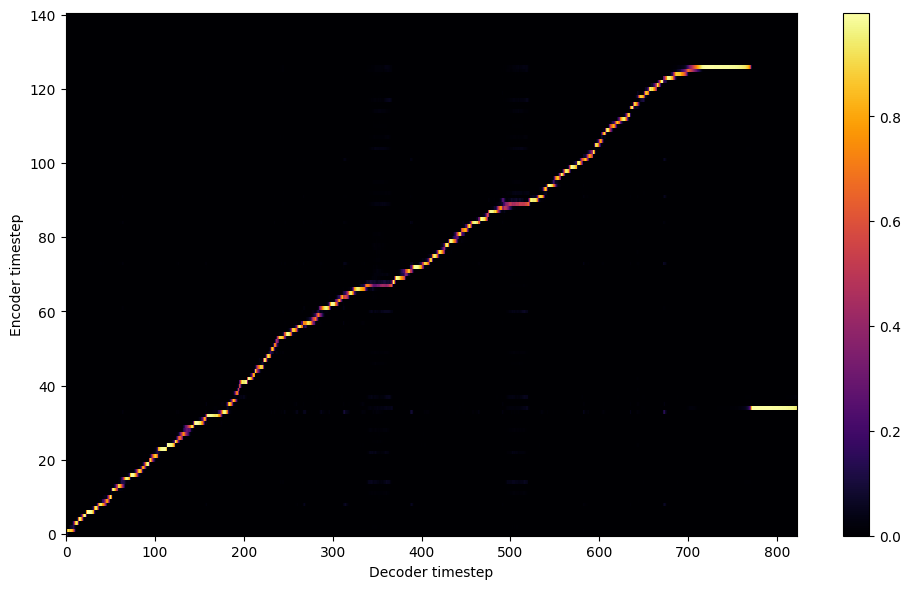


Starting Epoch: 106 Iteration: 318


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 106 Validation loss 321:  0.151018  Time: 0.2m LR: 0.000300


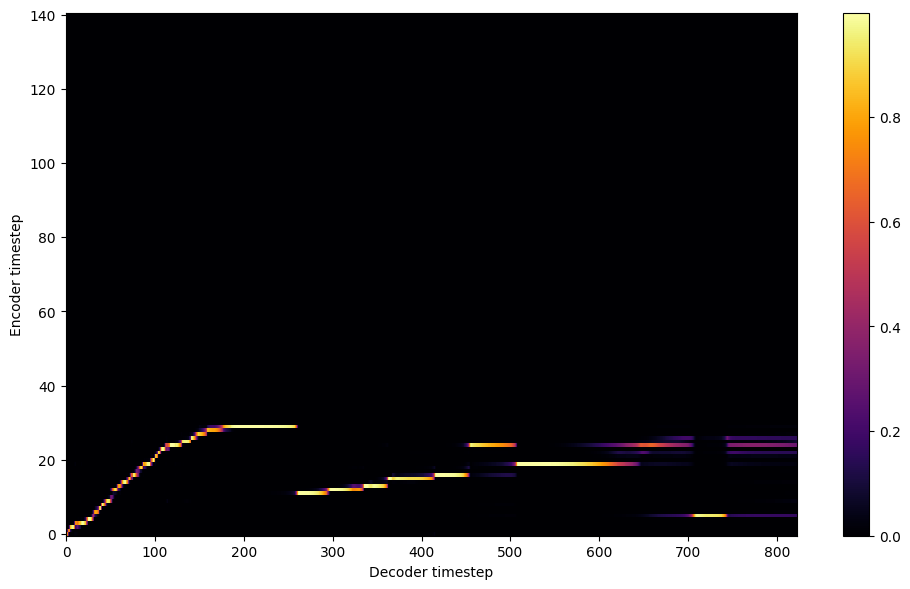


Starting Epoch: 107 Iteration: 321


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 107 Validation loss 324:  0.149827  Time: 0.2m LR: 0.000300


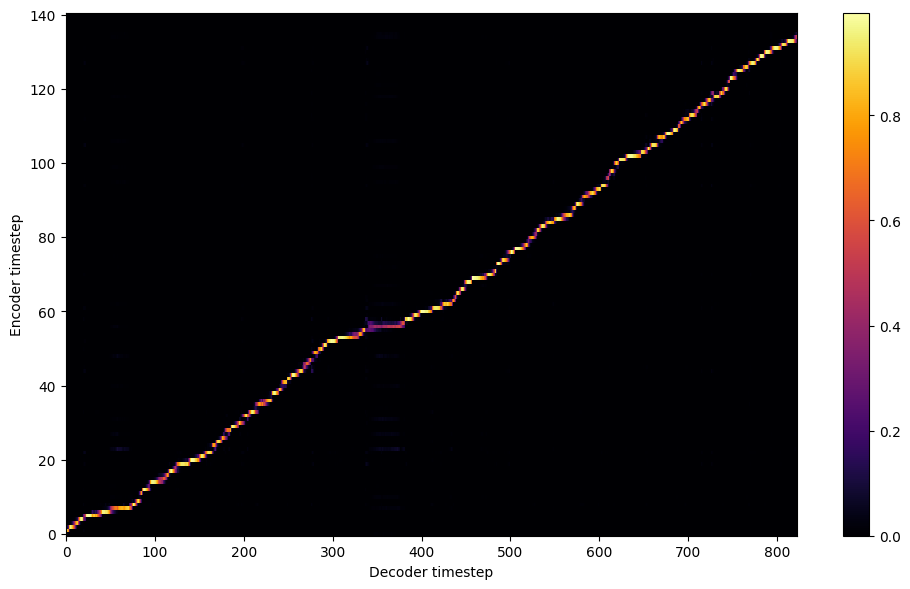


Starting Epoch: 108 Iteration: 324


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 108 Validation loss 327:  0.150011  Time: 0.2m LR: 0.000300


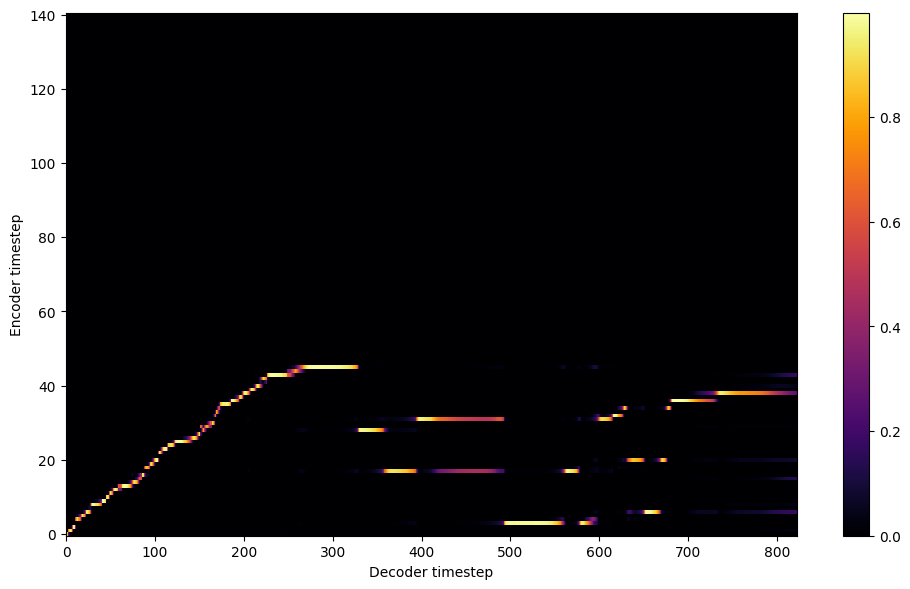


Starting Epoch: 109 Iteration: 327


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 109 Validation loss 330:  0.149646  Time: 0.3m LR: 0.000300


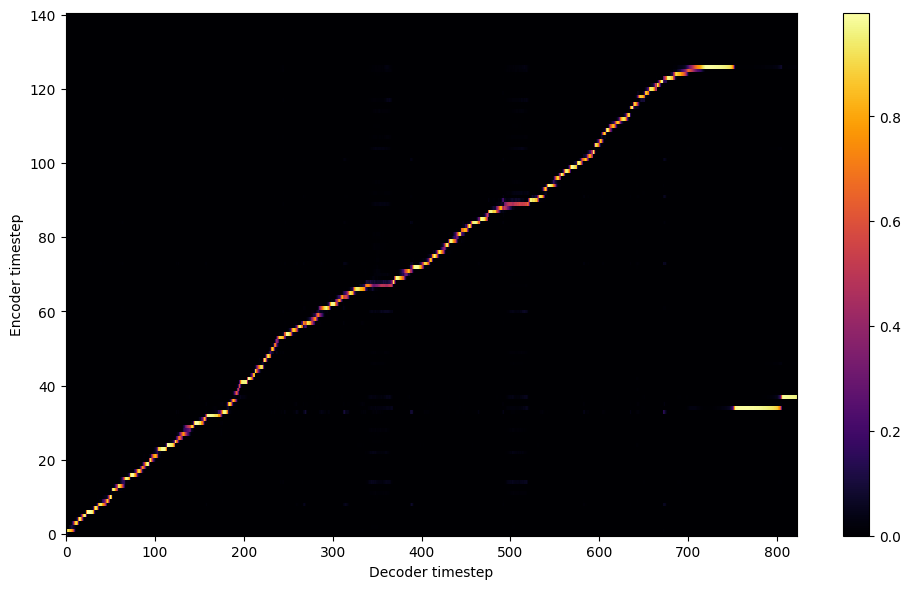

Saving model and optimizer state at iteration 330 to /content/drive/MyDrive/colab/outdir/TTS tacotron
Model Saved

Starting Epoch: 110 Iteration: 330


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 110 Validation loss 333:  0.148319  Time: 0.3m LR: 0.000300


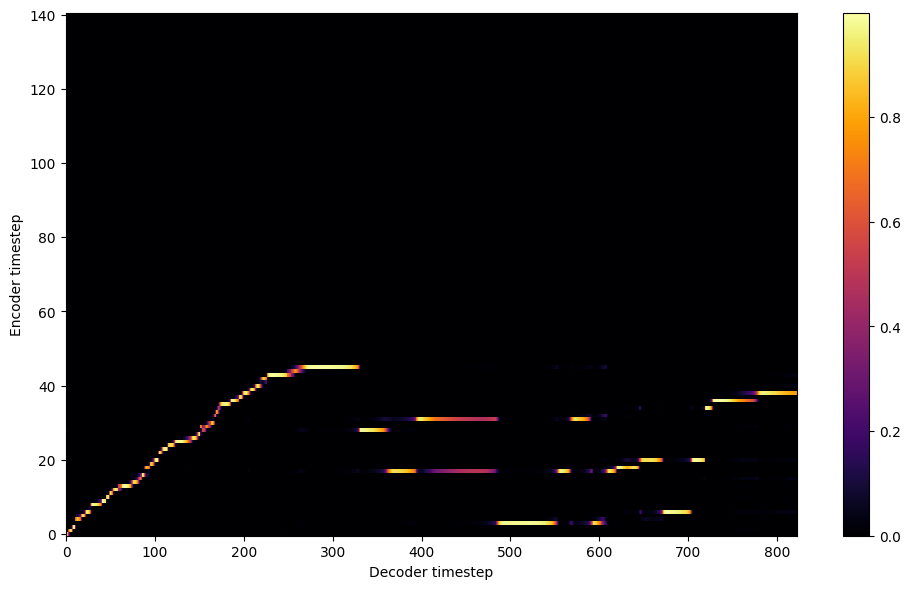


Starting Epoch: 111 Iteration: 333


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 111 Validation loss 336:  0.148449  Time: 0.3m LR: 0.000300


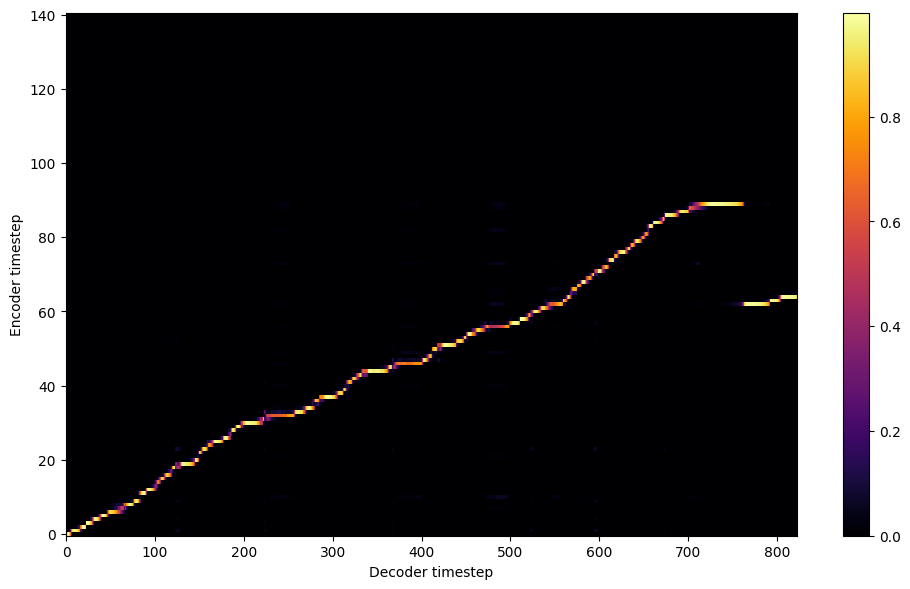


Starting Epoch: 112 Iteration: 336


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 112 Validation loss 339:  0.148590  Time: 0.3m LR: 0.000300


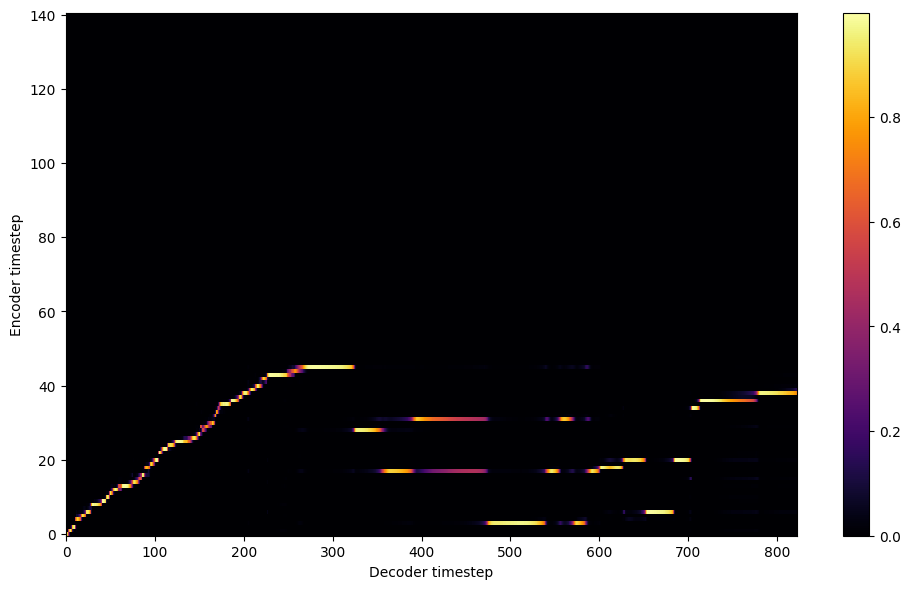


Starting Epoch: 113 Iteration: 339


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 113 Validation loss 342:  0.147982  Time: 0.3m LR: 0.000300


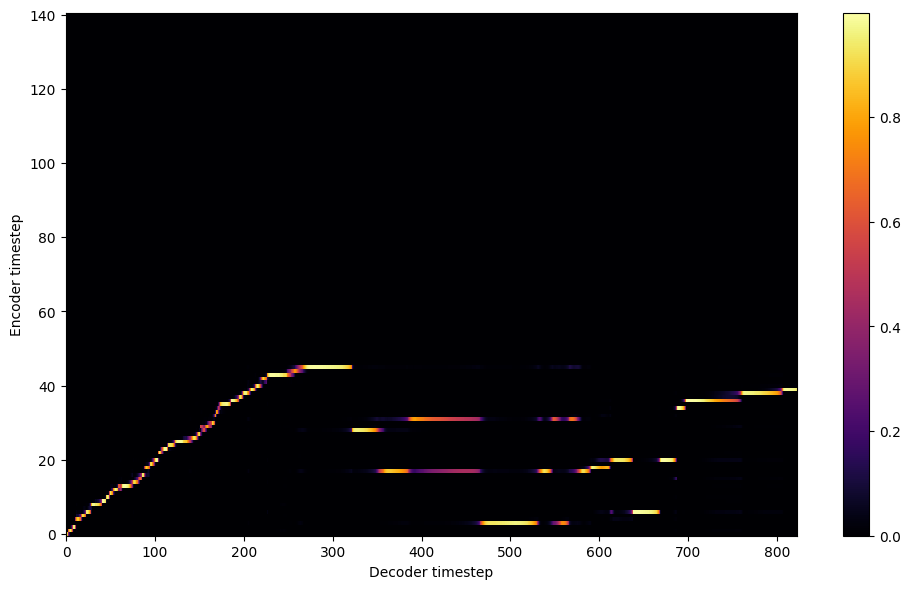


Starting Epoch: 114 Iteration: 342


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 114 Validation loss 345:  0.146799  Time: 0.2m LR: 0.000300


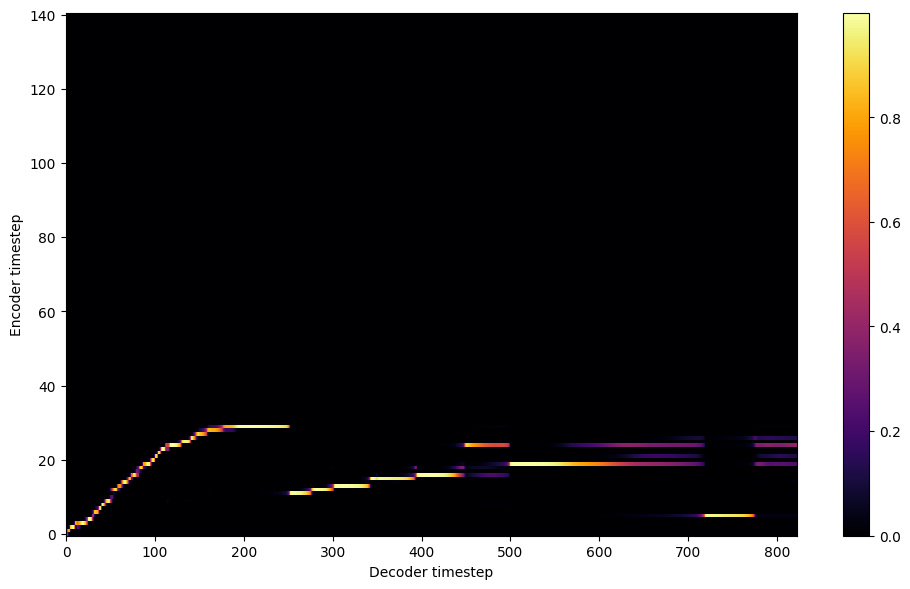


Starting Epoch: 115 Iteration: 345


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 115 Validation loss 348:  0.147780  Time: 0.3m LR: 0.000300


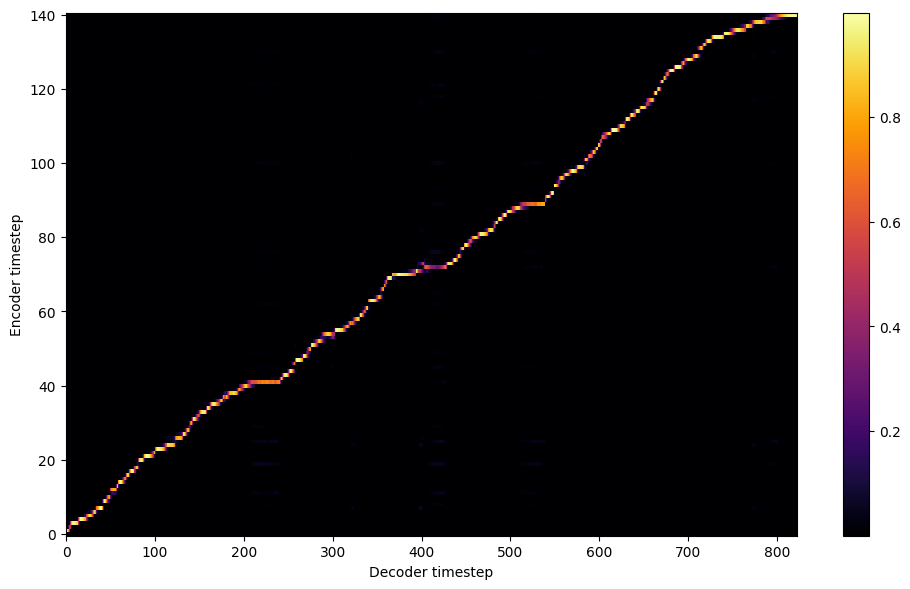


Starting Epoch: 116 Iteration: 348


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 116 Validation loss 351:  0.146924  Time: 0.3m LR: 0.000300


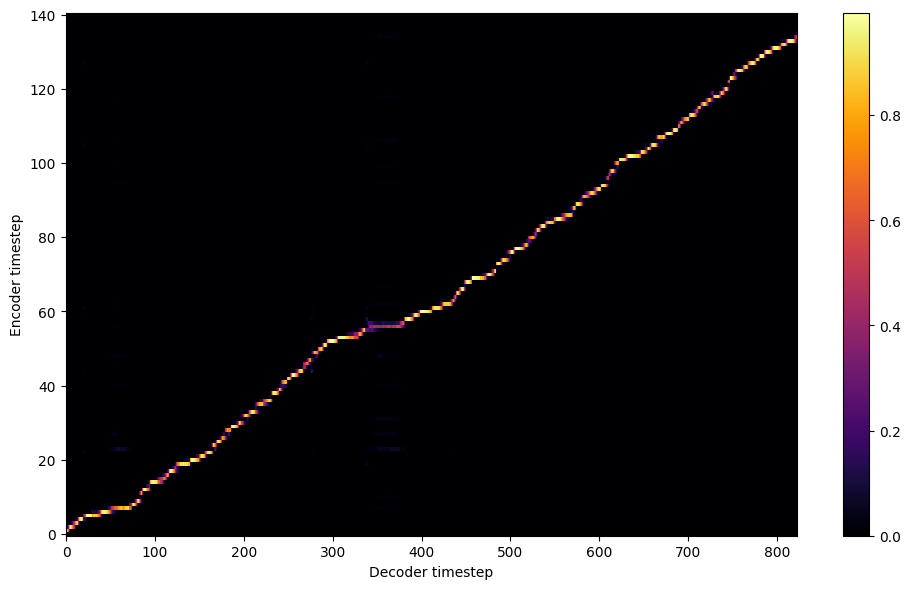


Starting Epoch: 117 Iteration: 351


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 117 Validation loss 354:  0.145855  Time: 0.3m LR: 0.000300


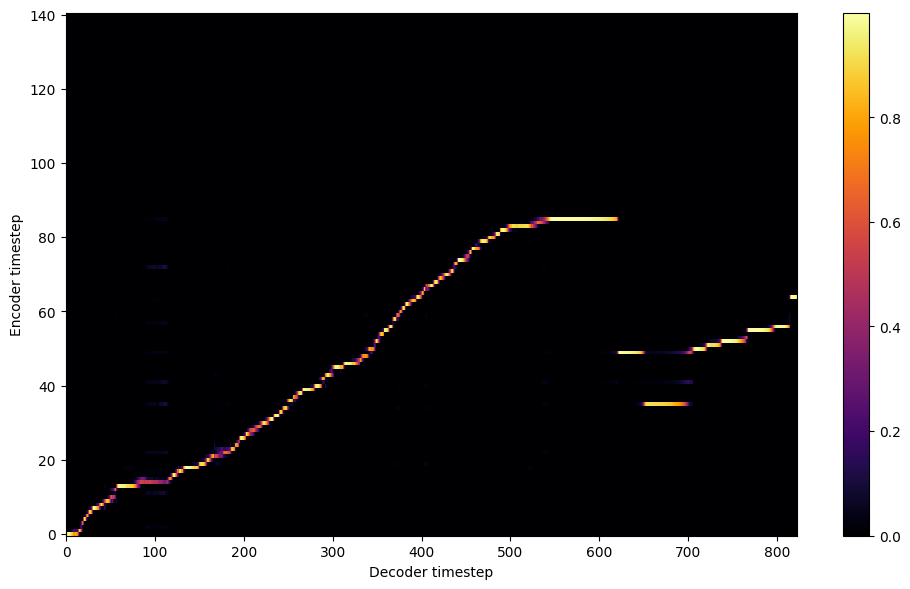


Starting Epoch: 118 Iteration: 354


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 118 Validation loss 357:  0.145247  Time: 0.3m LR: 0.000300


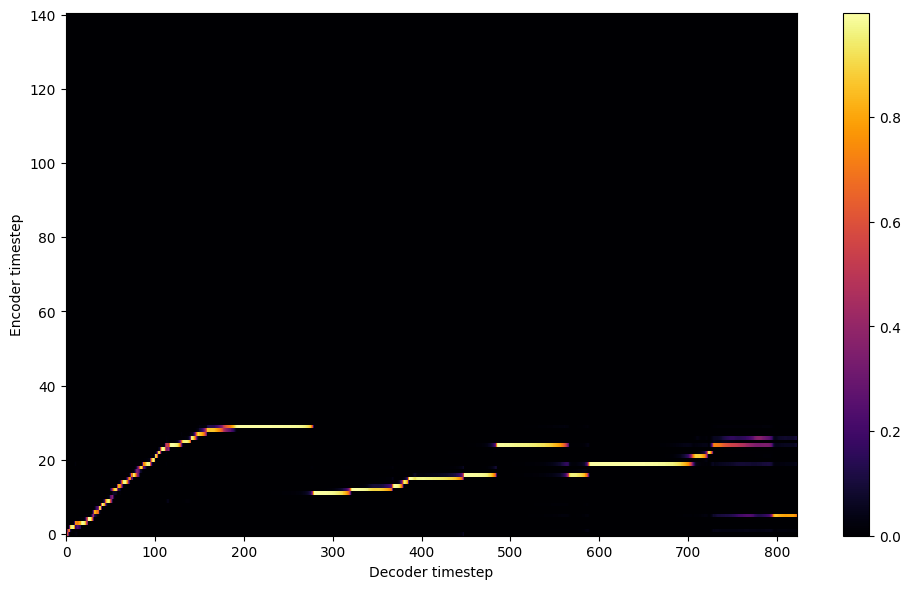


Starting Epoch: 119 Iteration: 357


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 119 Validation loss 360:  0.145286  Time: 0.3m LR: 0.000300


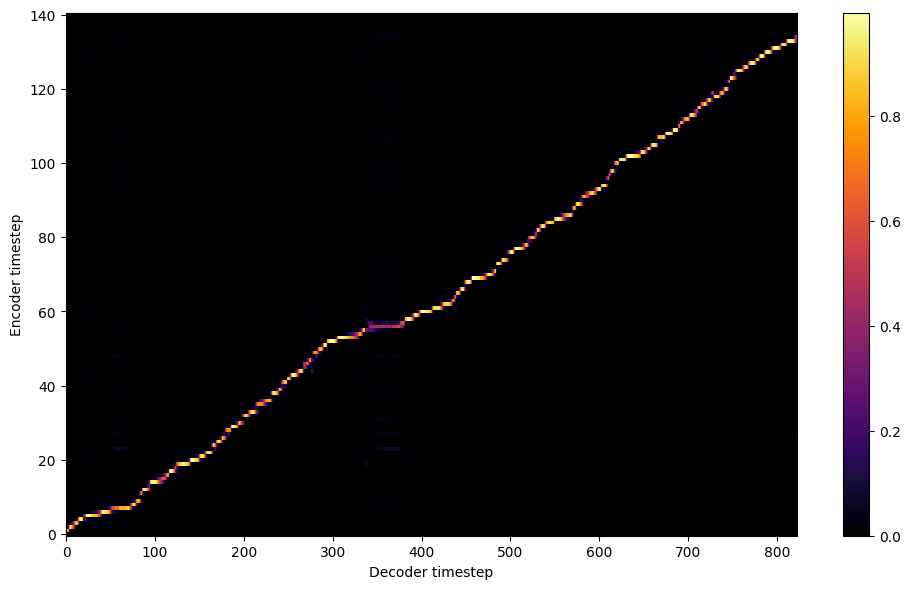

Saving model and optimizer state at iteration 360 to /content/drive/MyDrive/colab/outdir/TTS tacotron
Model Saved

Starting Epoch: 120 Iteration: 360


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 120 Validation loss 363:  0.145159  Time: 0.3m LR: 0.000300


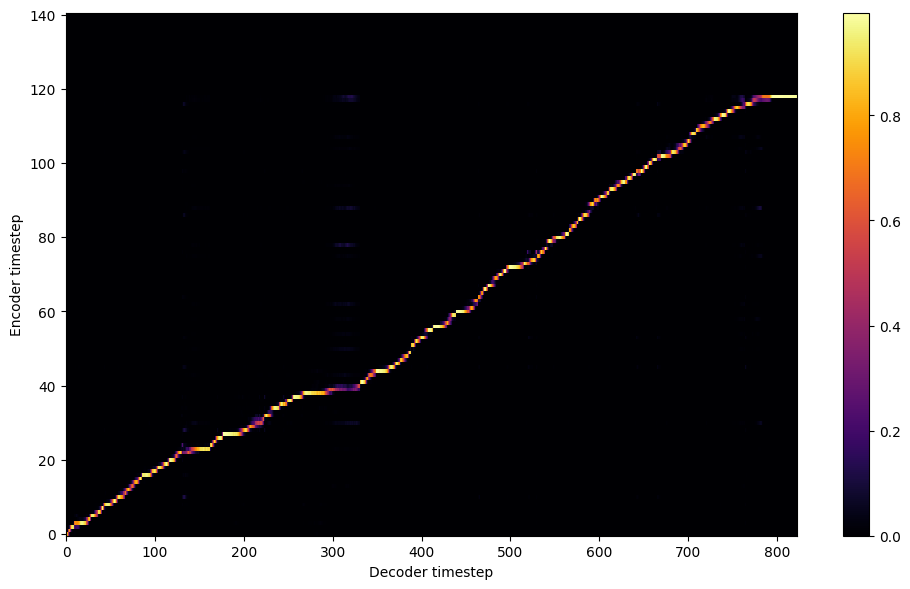


Starting Epoch: 121 Iteration: 363


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 121 Validation loss 366:  0.144167  Time: 0.3m LR: 0.000300


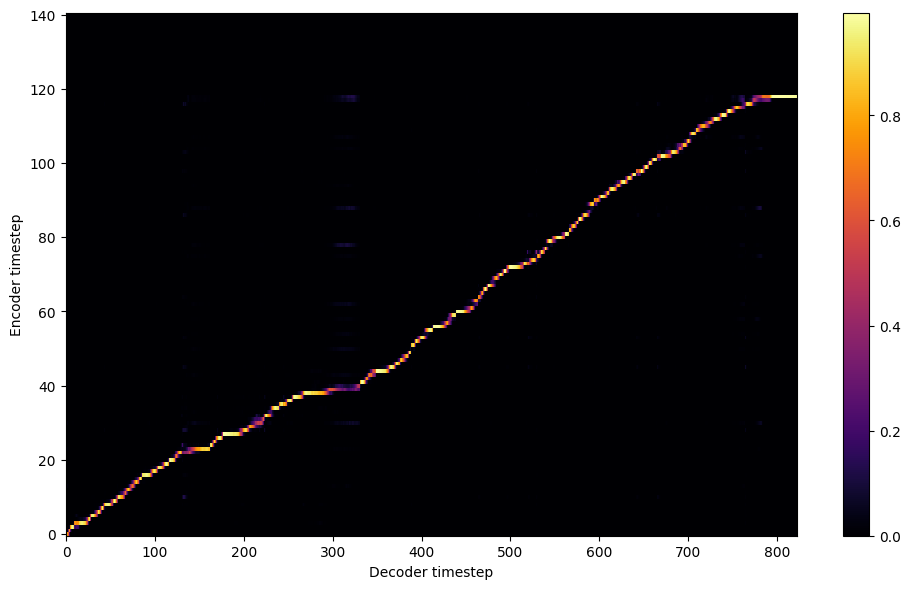


Starting Epoch: 122 Iteration: 366


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 122 Validation loss 369:  0.145785  Time: 0.3m LR: 0.000300


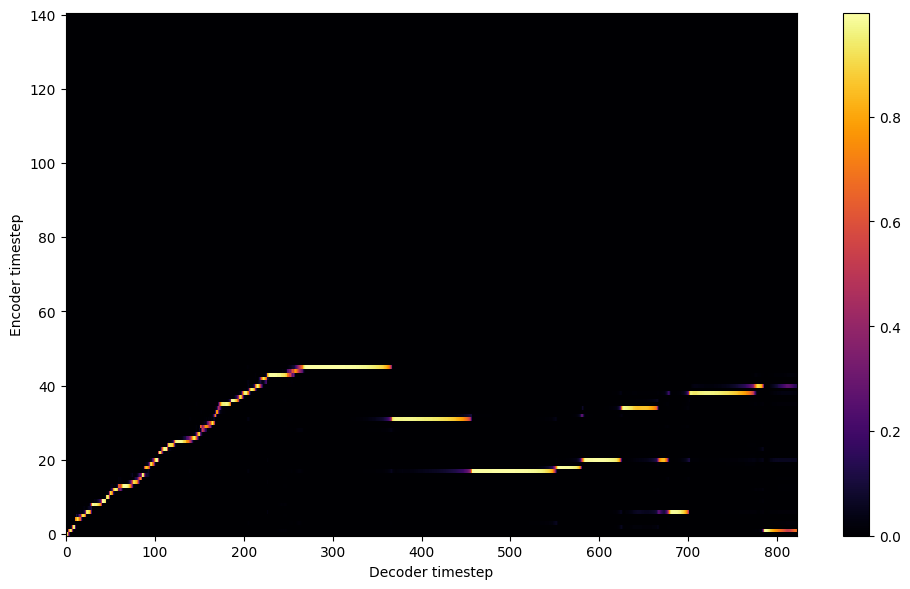


Starting Epoch: 123 Iteration: 369


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 123 Validation loss 372:  0.144105  Time: 0.2m LR: 0.000300


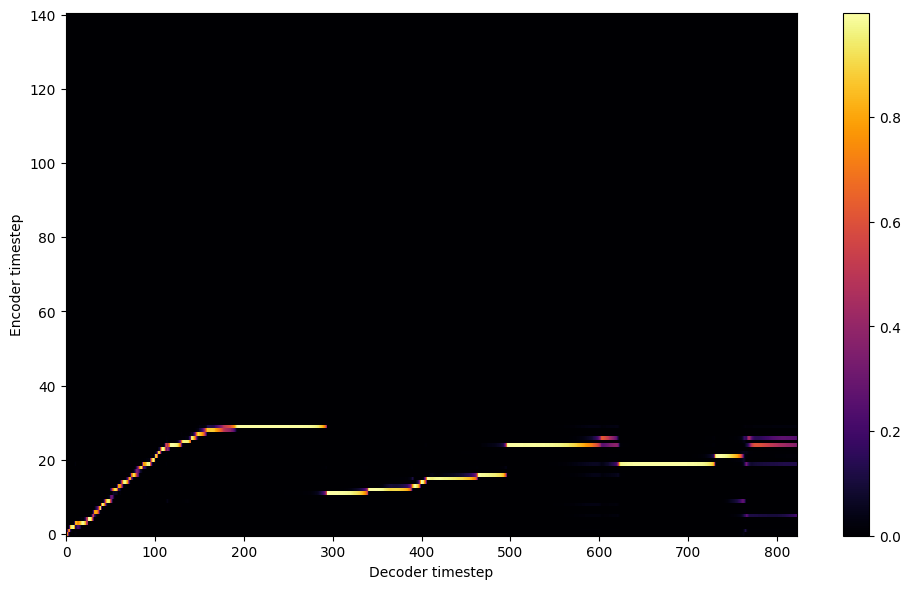


Starting Epoch: 124 Iteration: 372


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 124 Validation loss 375:  0.143685  Time: 0.3m LR: 0.000300


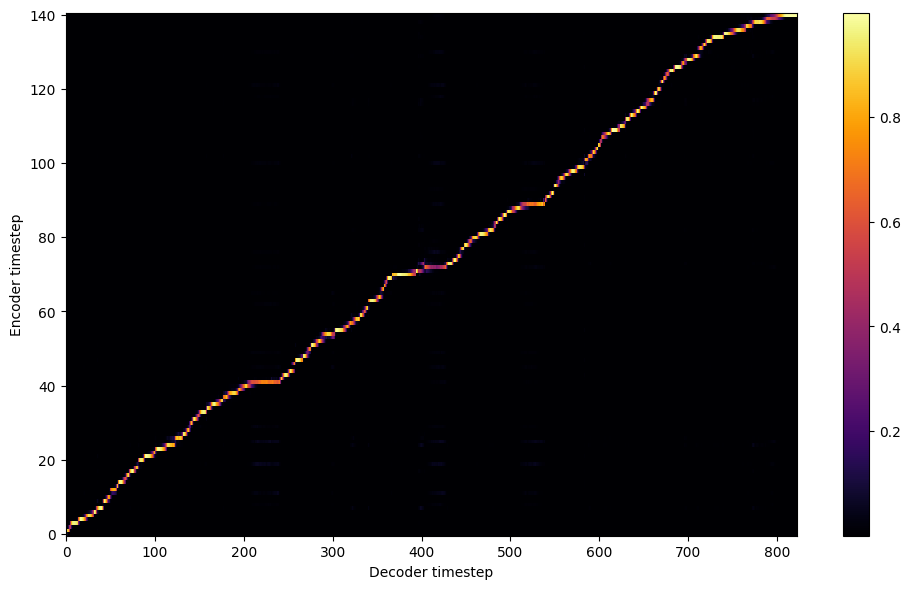


Starting Epoch: 125 Iteration: 375


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 125 Validation loss 378:  0.143468  Time: 0.3m LR: 0.000300


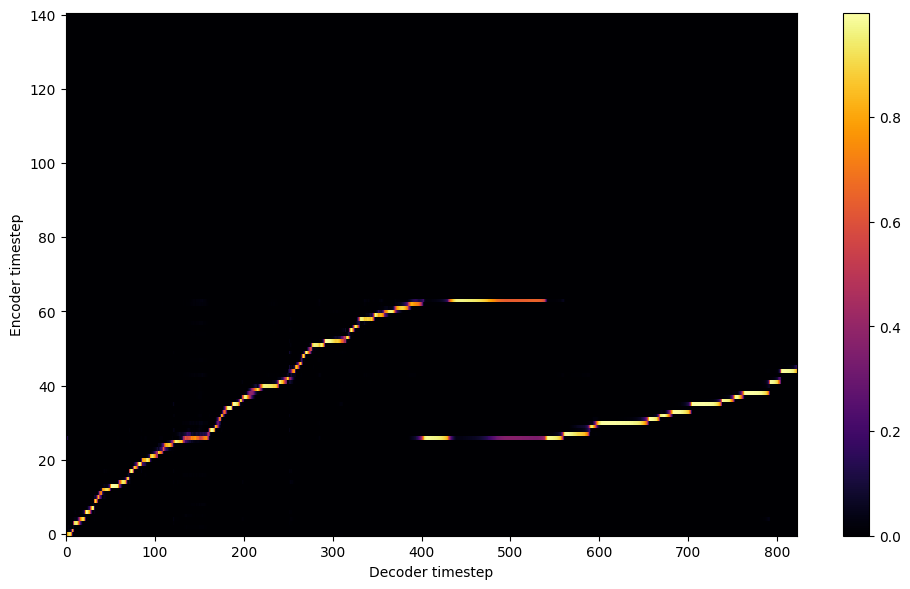


Starting Epoch: 126 Iteration: 378


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 126 Validation loss 381:  0.144681  Time: 0.3m LR: 0.000300


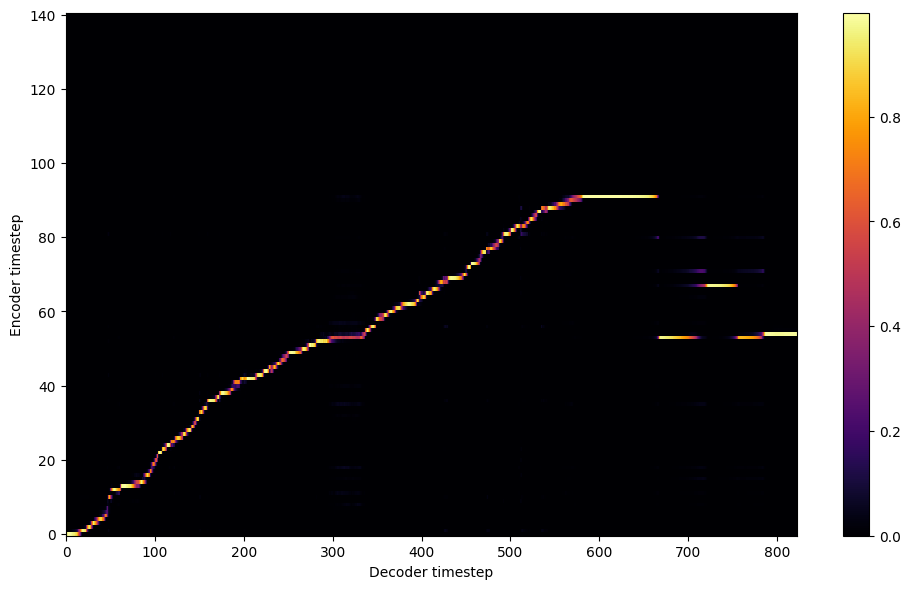


Starting Epoch: 127 Iteration: 381


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 127 Validation loss 384:  0.143058  Time: 0.3m LR: 0.000300


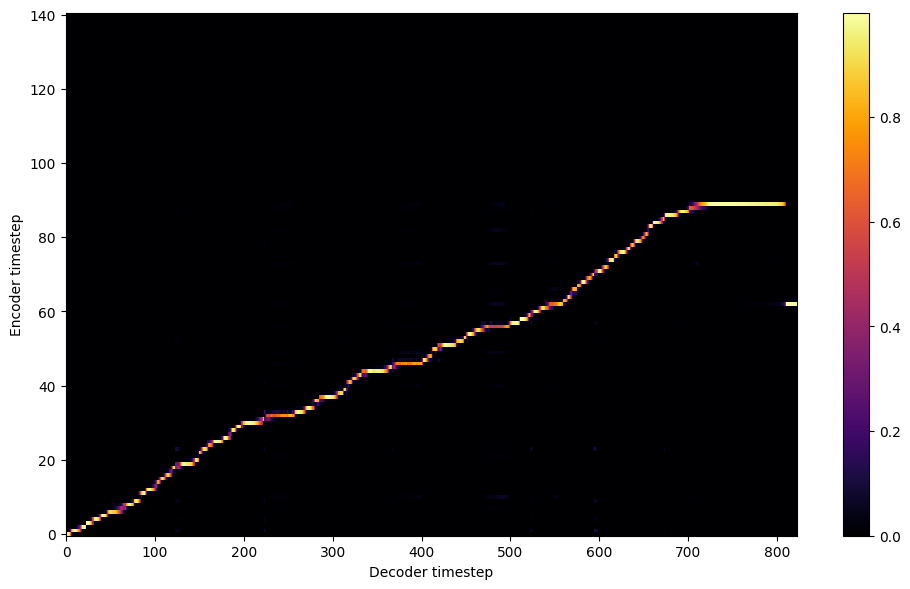


Starting Epoch: 128 Iteration: 384


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 128 Validation loss 387:  0.142227  Time: 0.2m LR: 0.000300


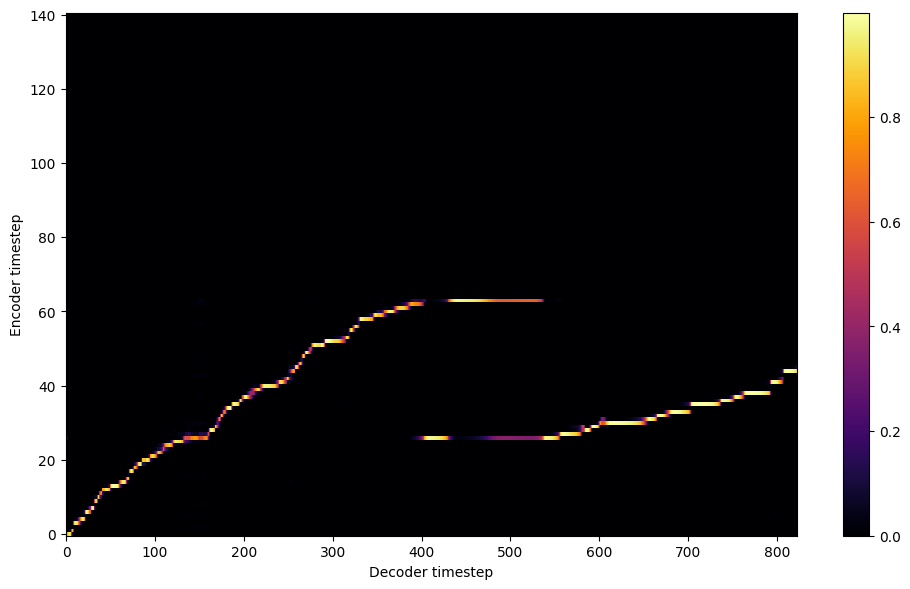


Starting Epoch: 129 Iteration: 387


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 129 Validation loss 390:  0.141813  Time: 0.3m LR: 0.000300


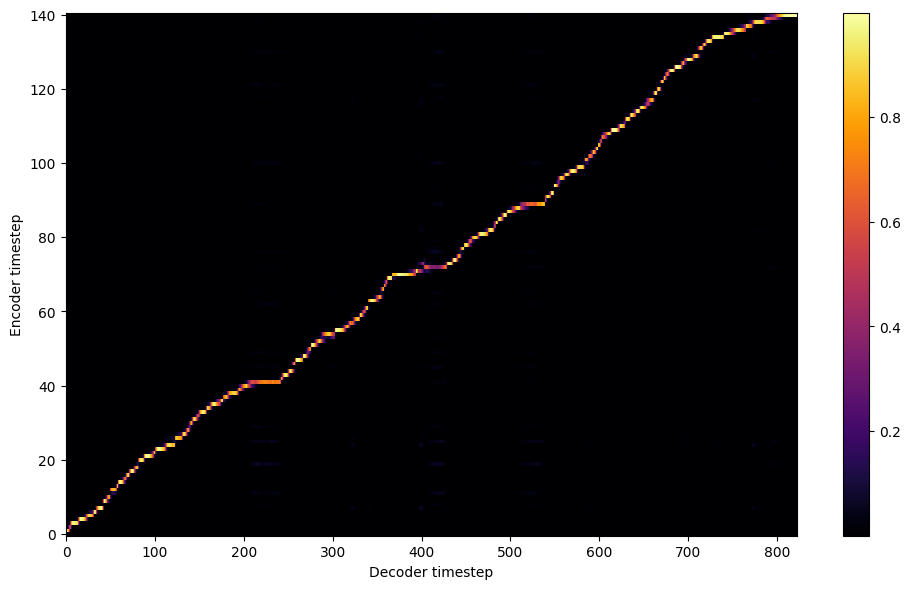

Saving model and optimizer state at iteration 390 to /content/drive/MyDrive/colab/outdir/TTS tacotron
Model Saved

Starting Epoch: 130 Iteration: 390


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 130 Validation loss 393:  0.142833  Time: 0.3m LR: 0.000300


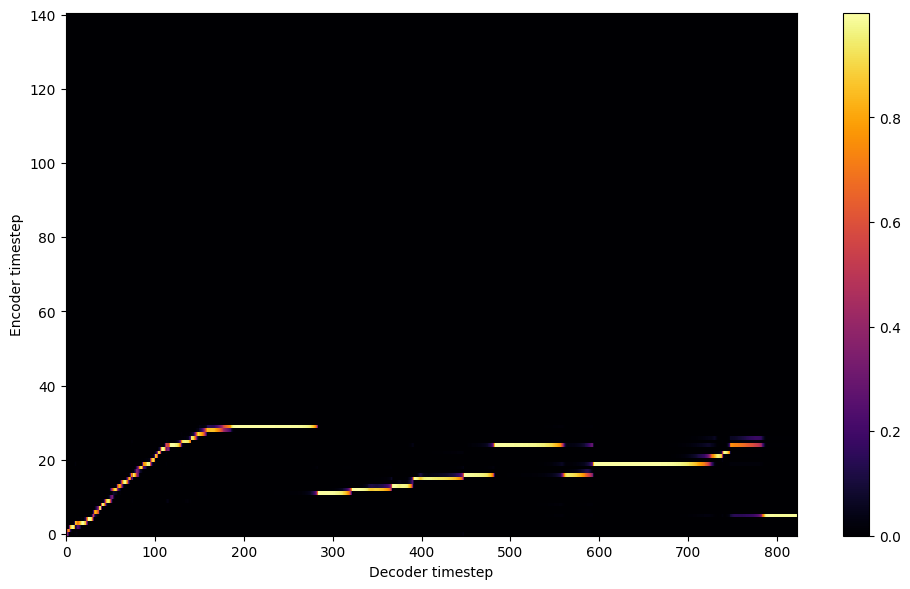


Starting Epoch: 131 Iteration: 393


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 131 Validation loss 396:  0.142141  Time: 0.3m LR: 0.000300


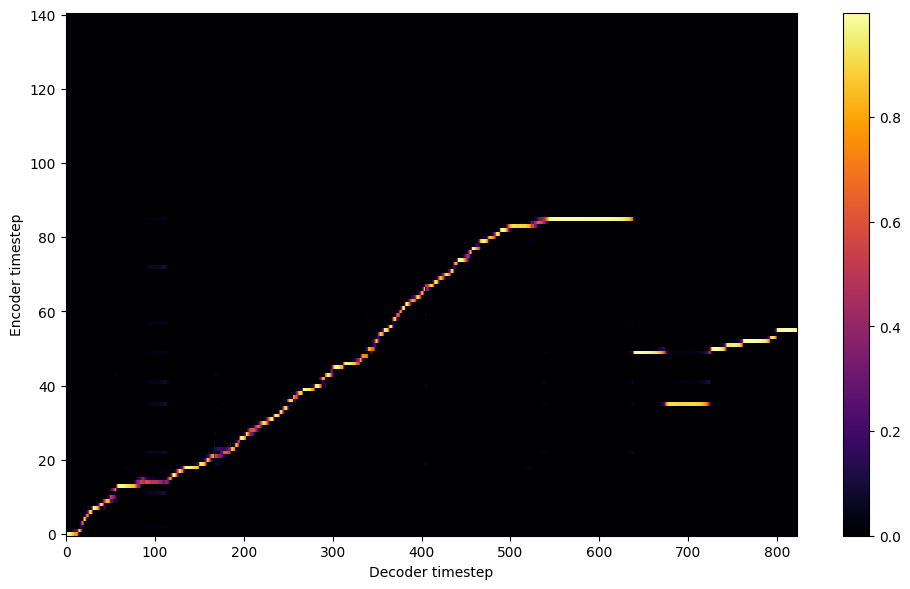


Starting Epoch: 132 Iteration: 396


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 132 Validation loss 399:  0.141863  Time: 0.3m LR: 0.000300


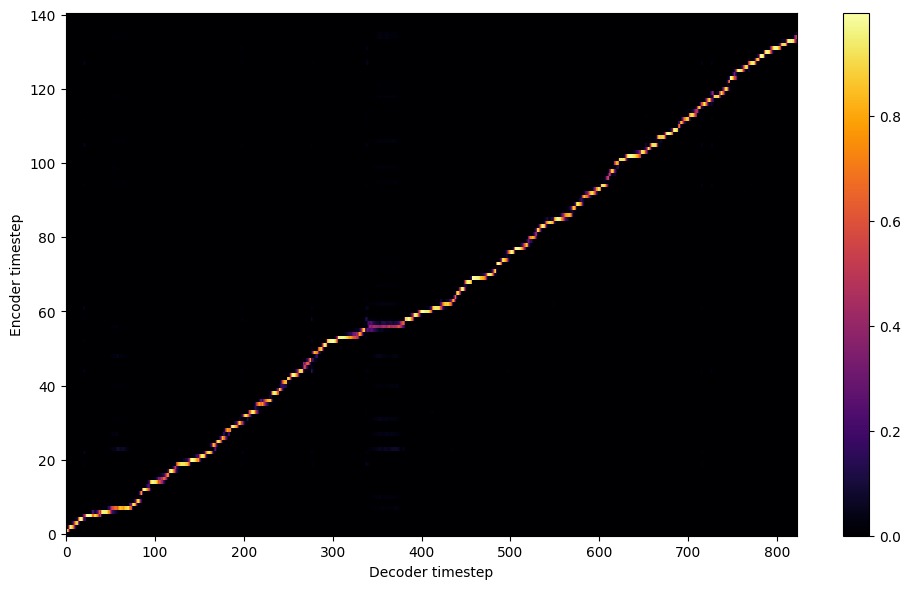


Starting Epoch: 133 Iteration: 399


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 133 Validation loss 402:  0.140389  Time: 0.3m LR: 0.000300


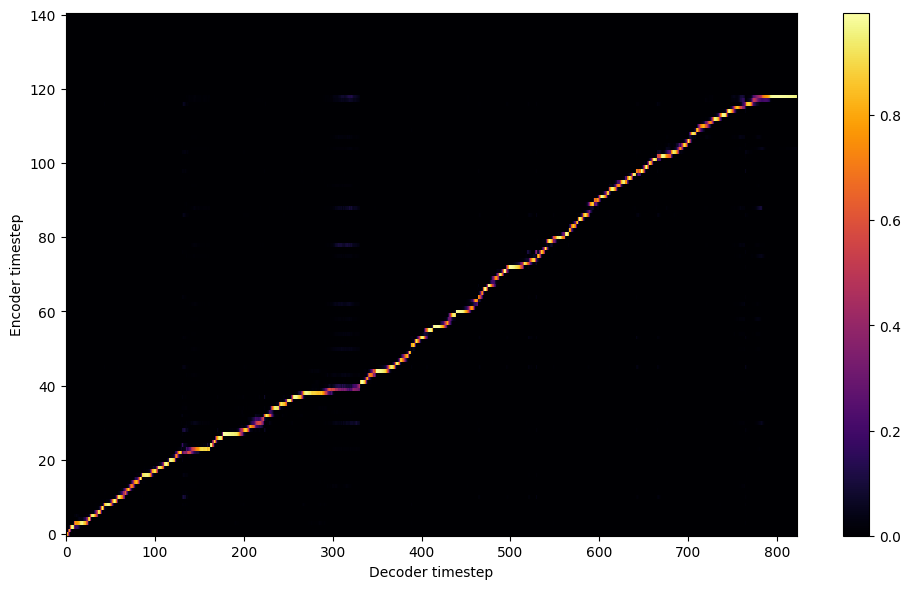


Starting Epoch: 134 Iteration: 402


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 134 Validation loss 405:  0.140185  Time: 0.3m LR: 0.000300


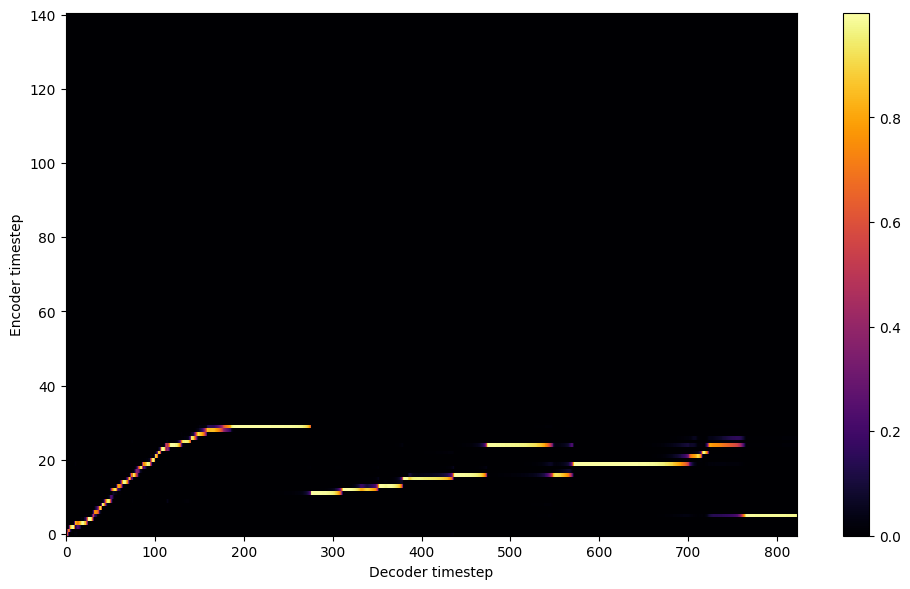


Starting Epoch: 135 Iteration: 405


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 135 Validation loss 408:  0.140185  Time: 0.3m LR: 0.000300


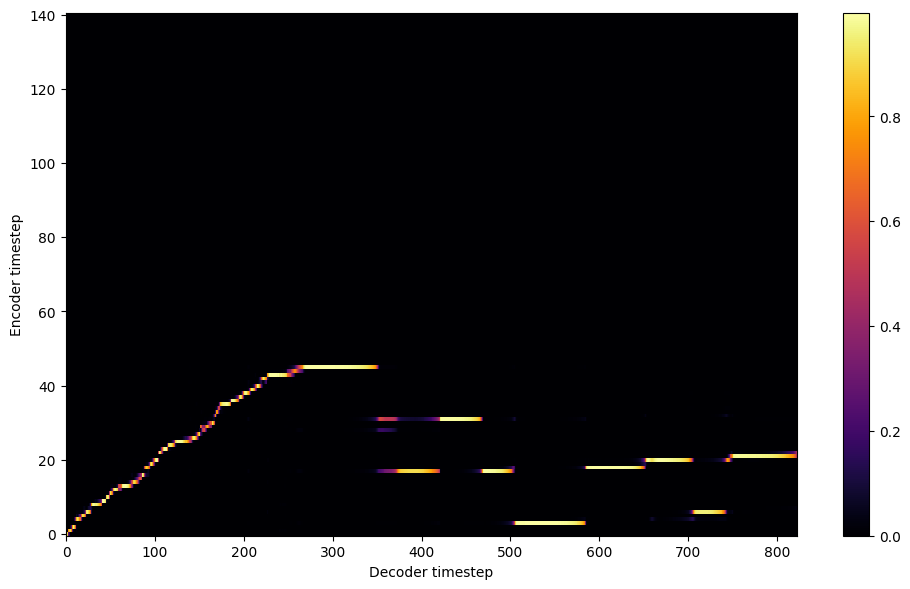


Starting Epoch: 136 Iteration: 408


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 136 Validation loss 411:  0.139743  Time: 0.2m LR: 0.000300


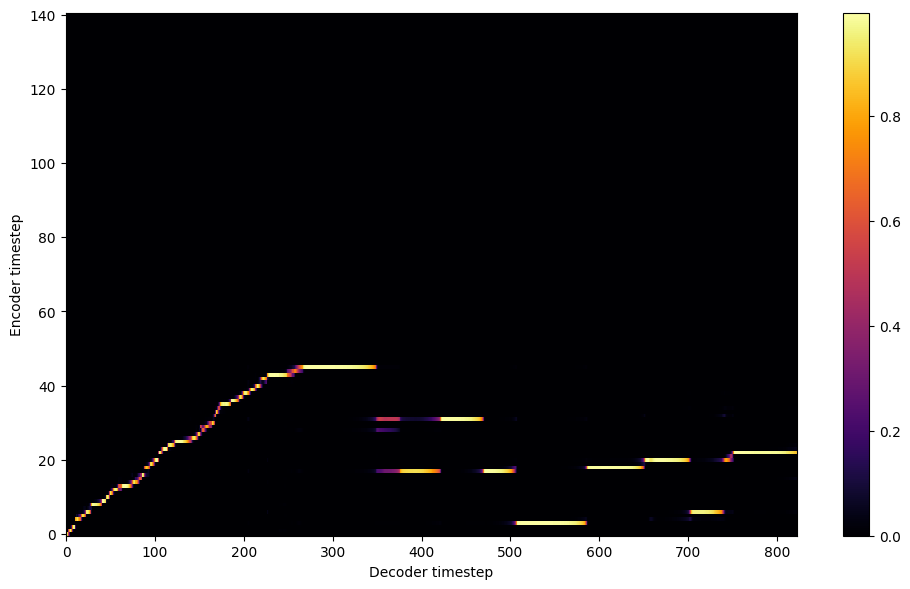


Starting Epoch: 137 Iteration: 411


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 137 Validation loss 414:  0.139572  Time: 0.3m LR: 0.000300


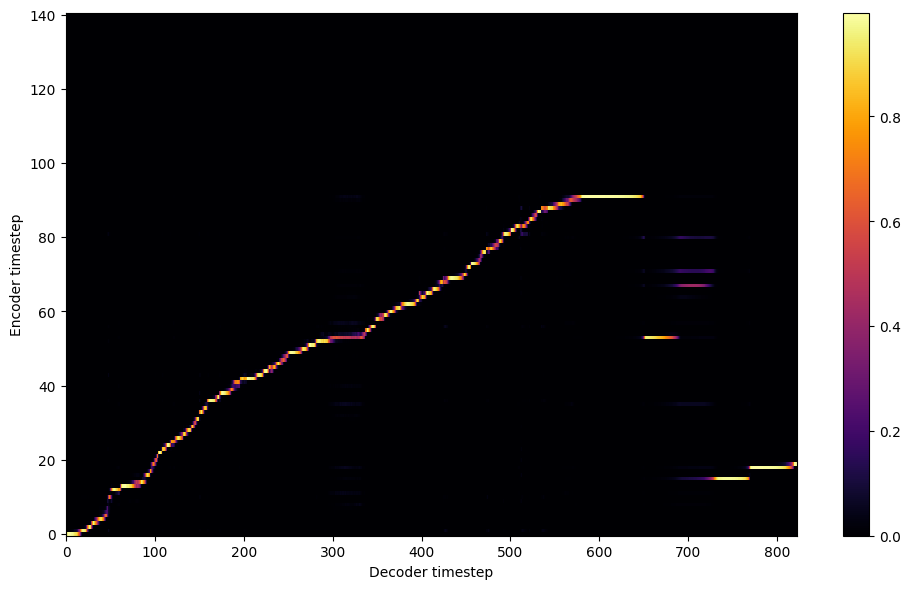


Starting Epoch: 138 Iteration: 414


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 138 Validation loss 417:  0.138768  Time: 0.3m LR: 0.000300


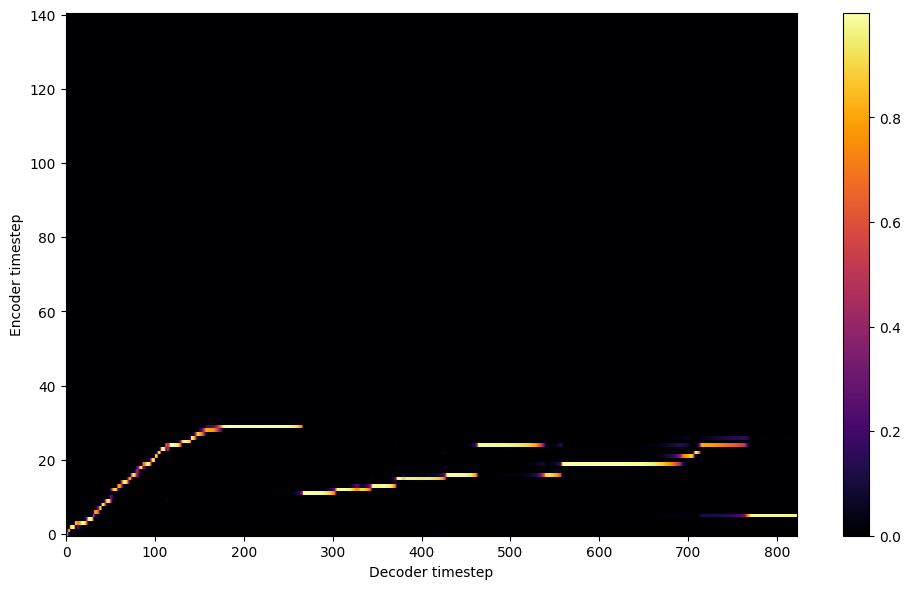


Starting Epoch: 139 Iteration: 417


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 139 Validation loss 420:  0.138689  Time: 0.3m LR: 0.000300


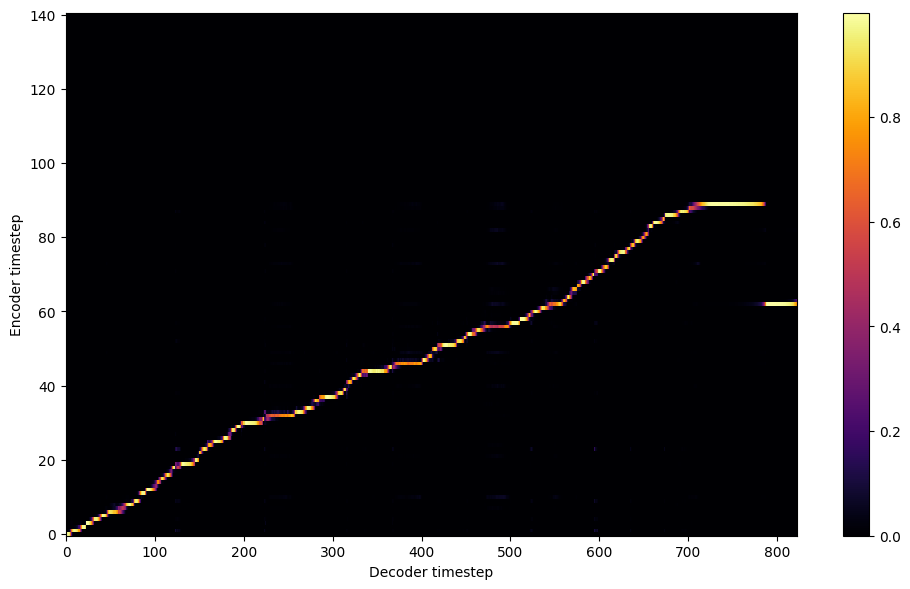

Saving model and optimizer state at iteration 420 to /content/drive/MyDrive/colab/outdir/TTS tacotron
Model Saved

Starting Epoch: 140 Iteration: 420


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 140 Validation loss 423:  0.138914  Time: 0.3m LR: 0.000300


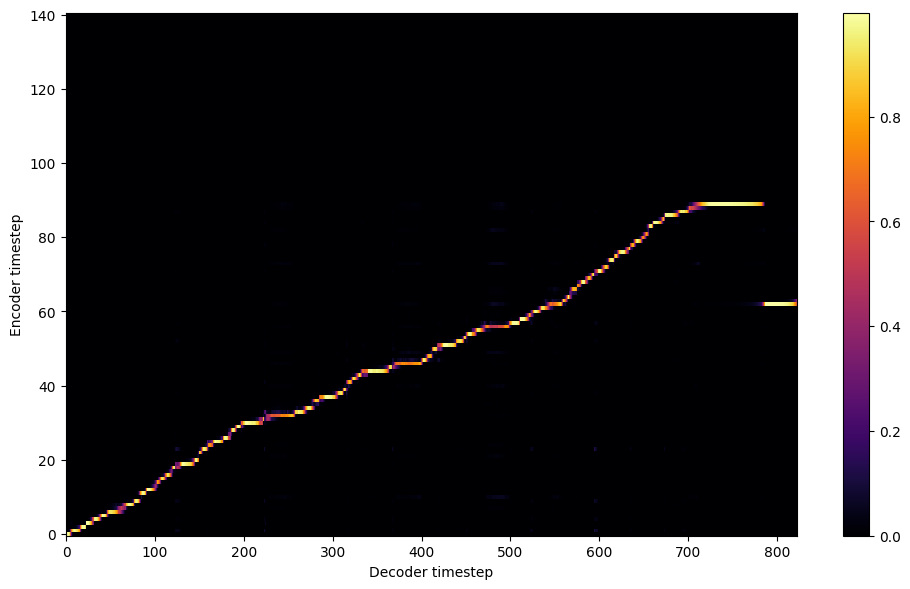


Starting Epoch: 141 Iteration: 423


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 141 Validation loss 426:  0.140057  Time: 0.3m LR: 0.000300


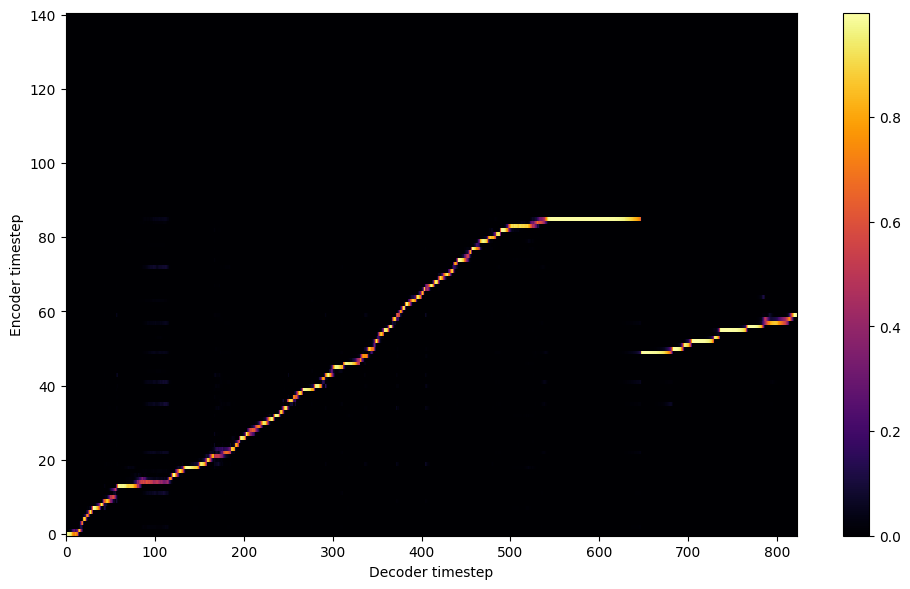


Starting Epoch: 142 Iteration: 426


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 142 Validation loss 429:  0.139552  Time: 0.3m LR: 0.000300


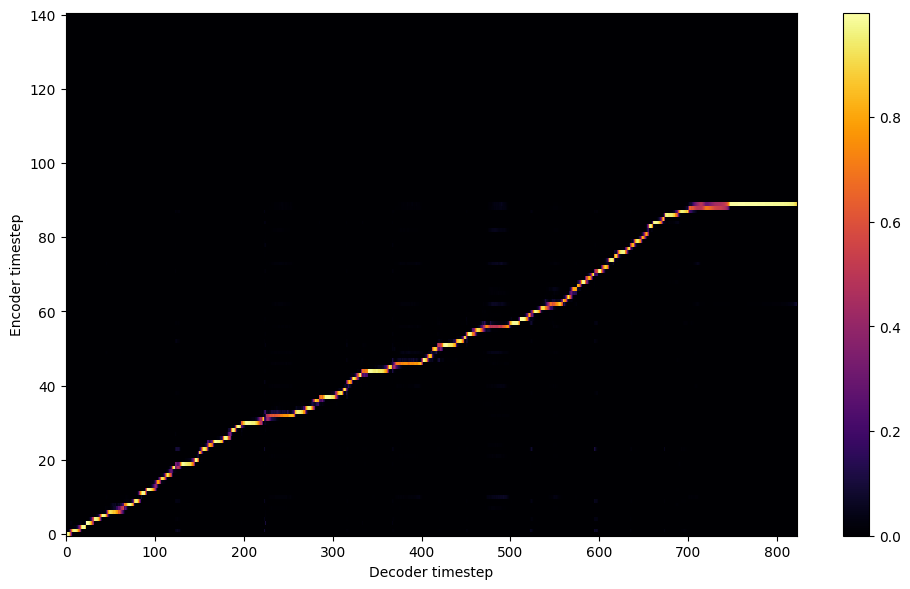


Starting Epoch: 143 Iteration: 429


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 143 Validation loss 432:  0.140342  Time: 0.3m LR: 0.000300


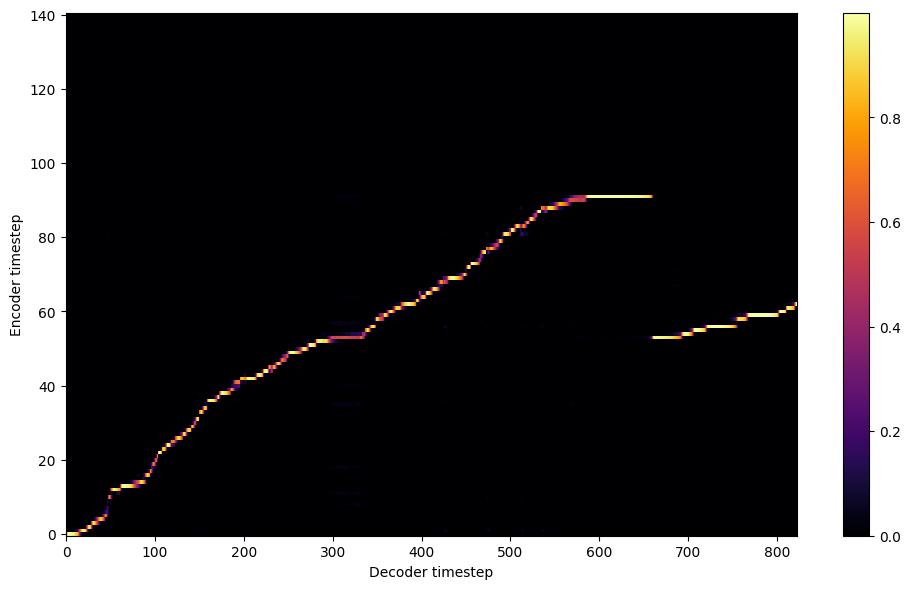


Starting Epoch: 144 Iteration: 432


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 144 Validation loss 435:  0.140123  Time: 0.3m LR: 0.000300


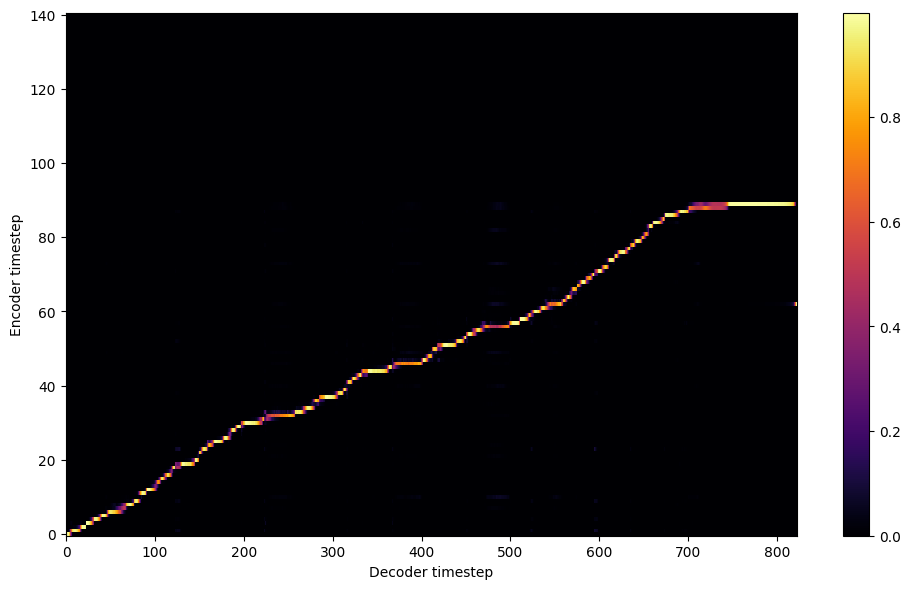


Starting Epoch: 145 Iteration: 435


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 145 Validation loss 438:  0.141690  Time: 0.3m LR: 0.000300


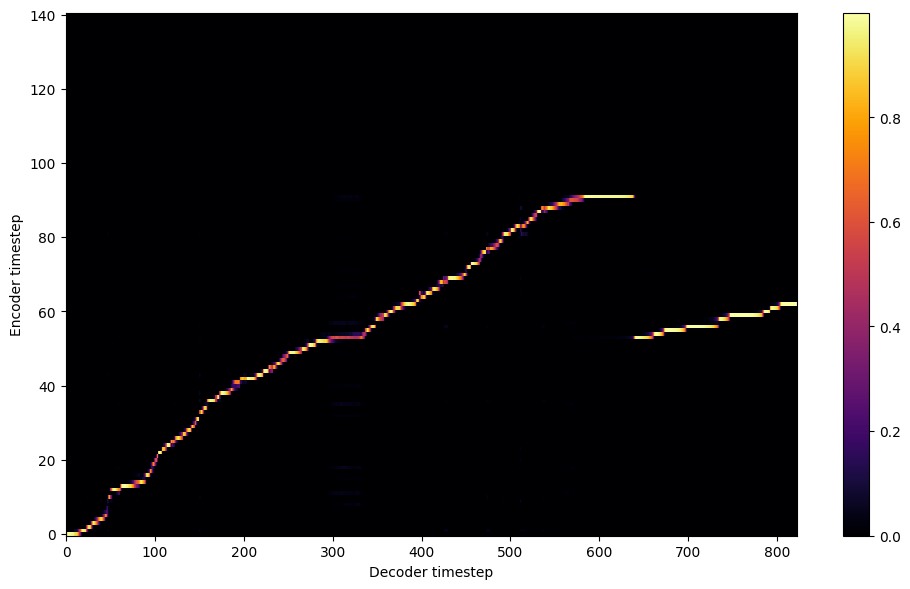


Starting Epoch: 146 Iteration: 438


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 146 Validation loss 441:  0.138410  Time: 0.3m LR: 0.000300


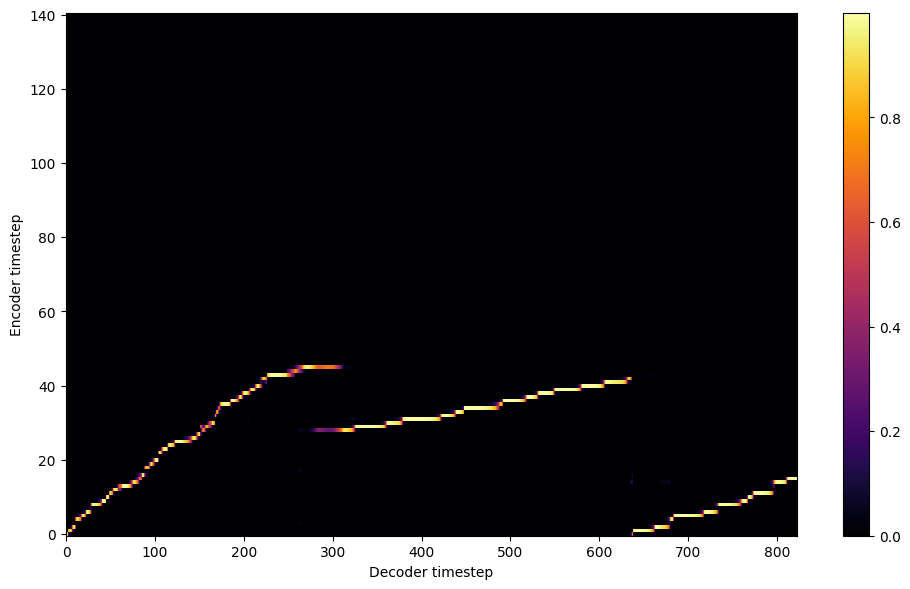


Starting Epoch: 147 Iteration: 441


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 147 Validation loss 444:  0.141268  Time: 0.3m LR: 0.000300


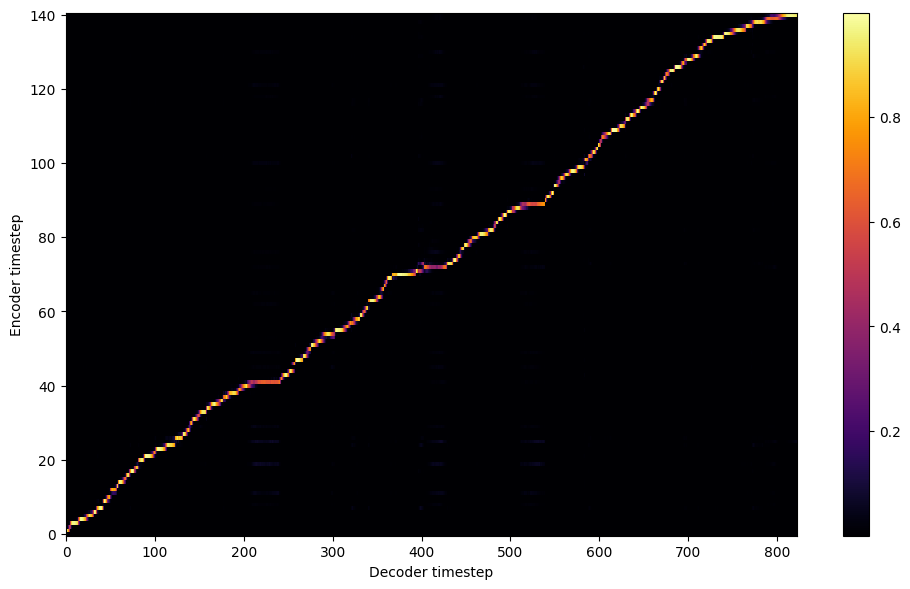


Starting Epoch: 148 Iteration: 444


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 148 Validation loss 447:  0.139806  Time: 0.3m LR: 0.000300


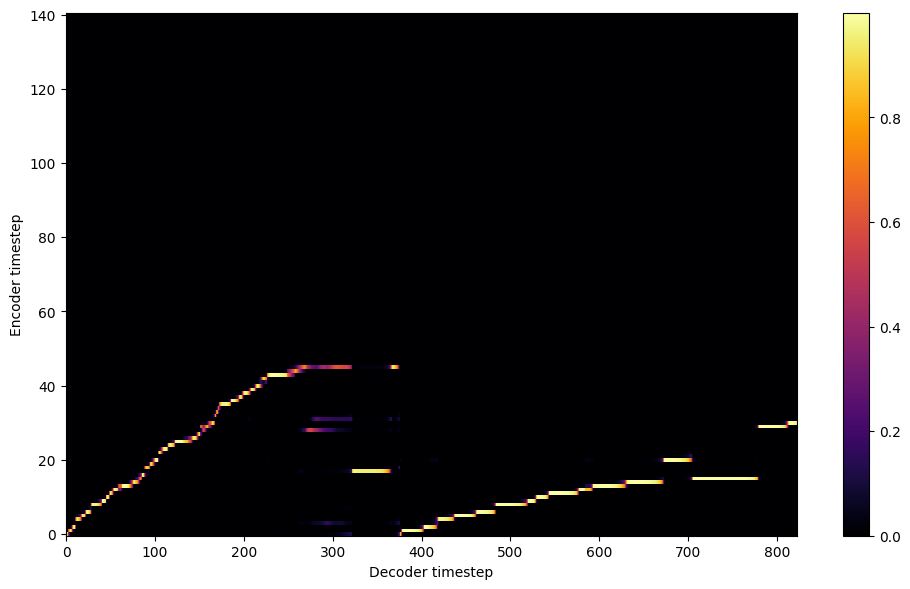


Starting Epoch: 149 Iteration: 447


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 149 Validation loss 450:  0.137484  Time: 0.3m LR: 0.000300


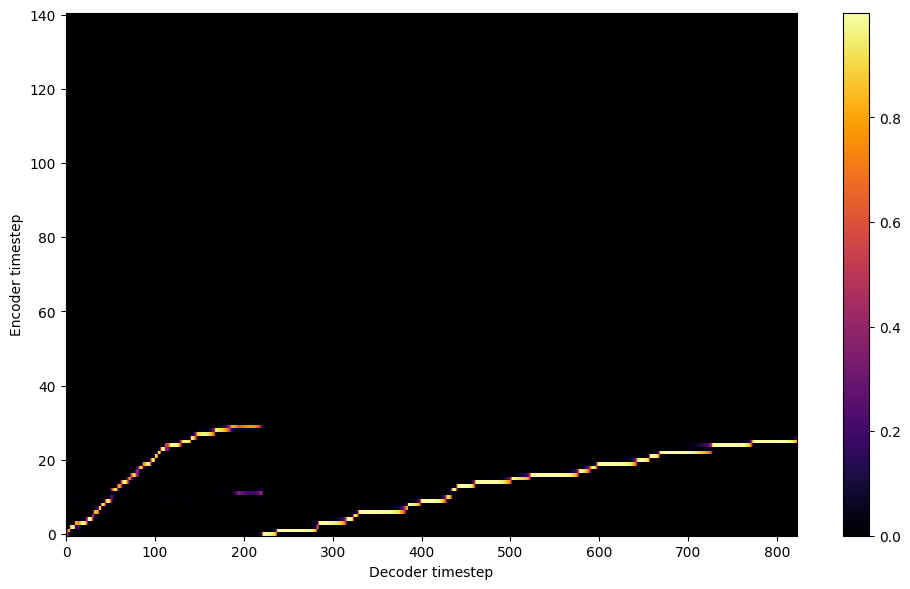

Saving model and optimizer state at iteration 450 to /content/drive/MyDrive/colab/outdir/TTS tacotron
Model Saved

Starting Epoch: 150 Iteration: 450


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 150 Validation loss 453:  0.138863  Time: 0.3m LR: 0.000300


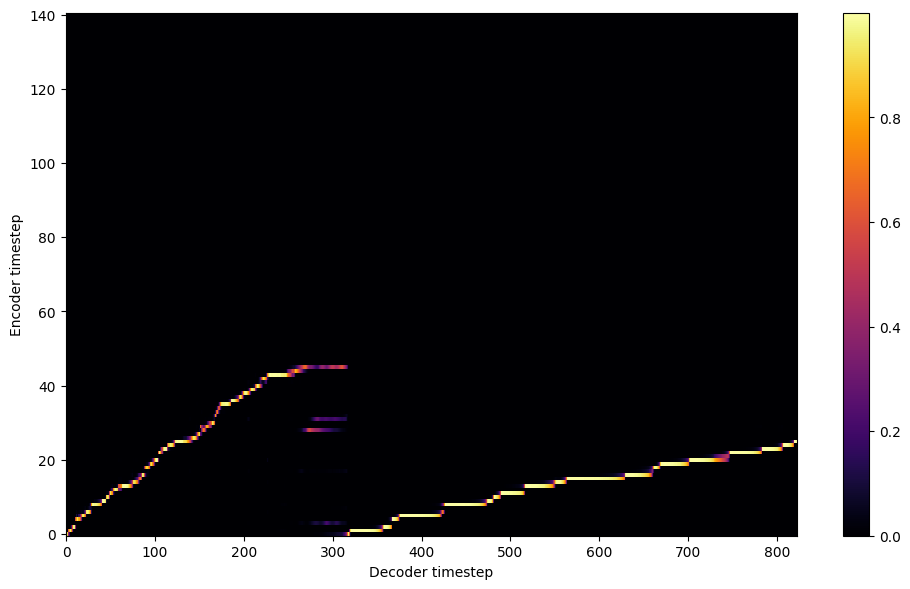


Starting Epoch: 151 Iteration: 453


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 151 Validation loss 456:  0.136845  Time: 0.3m LR: 0.000300


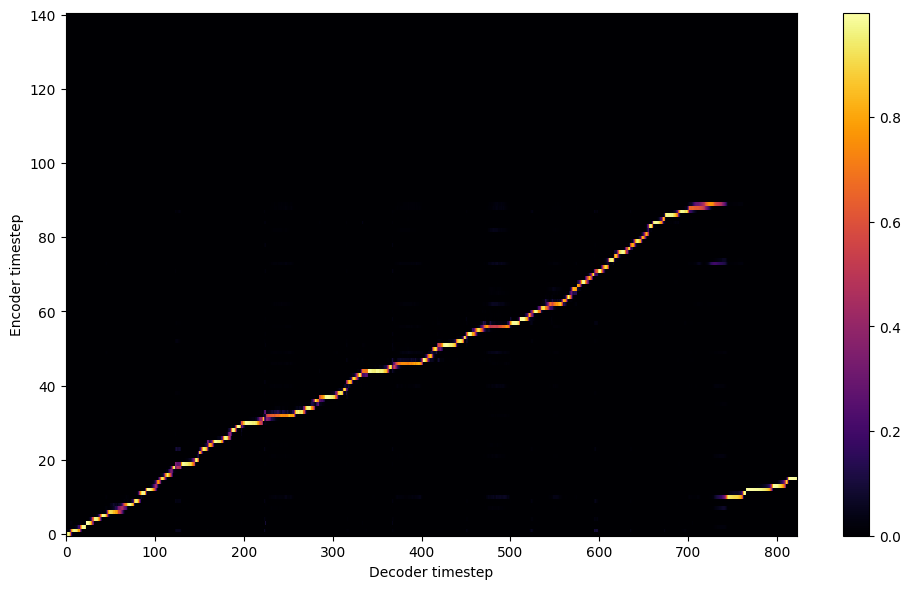


Starting Epoch: 152 Iteration: 456


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 152 Validation loss 459:  0.135631  Time: 0.3m LR: 0.000300


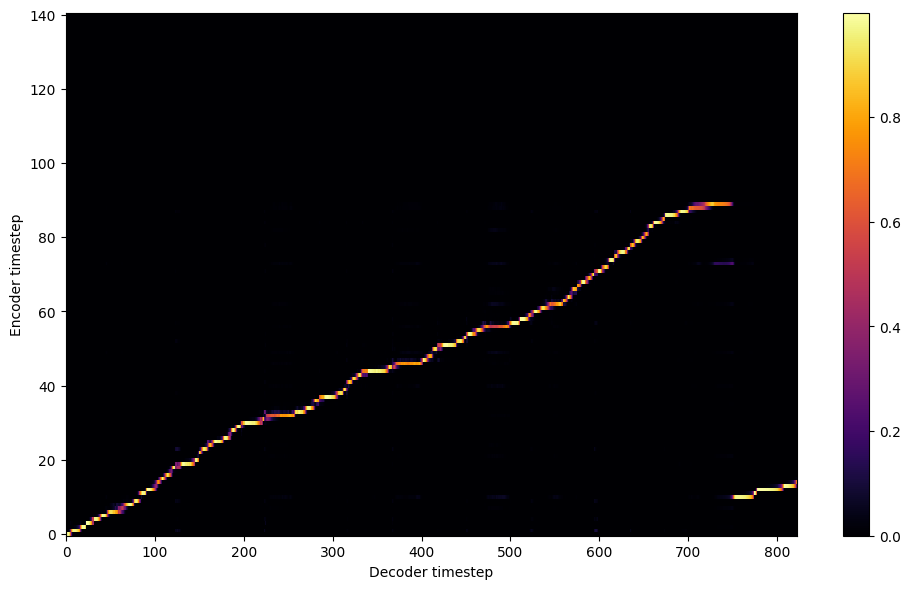


Starting Epoch: 153 Iteration: 459


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 153 Validation loss 462:  0.135347  Time: 0.3m LR: 0.000300


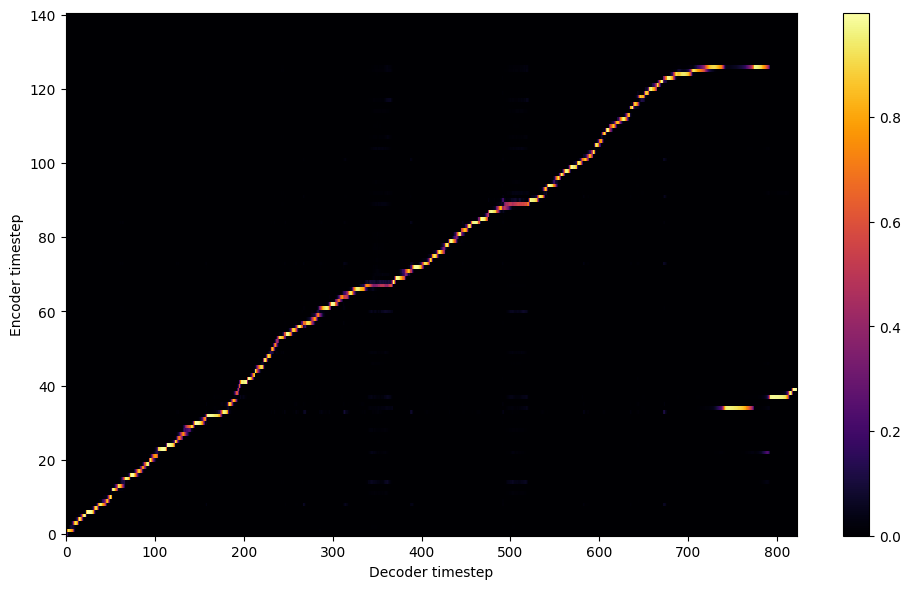


Starting Epoch: 154 Iteration: 462


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 154 Validation loss 465:  0.134883  Time: 0.3m LR: 0.000300


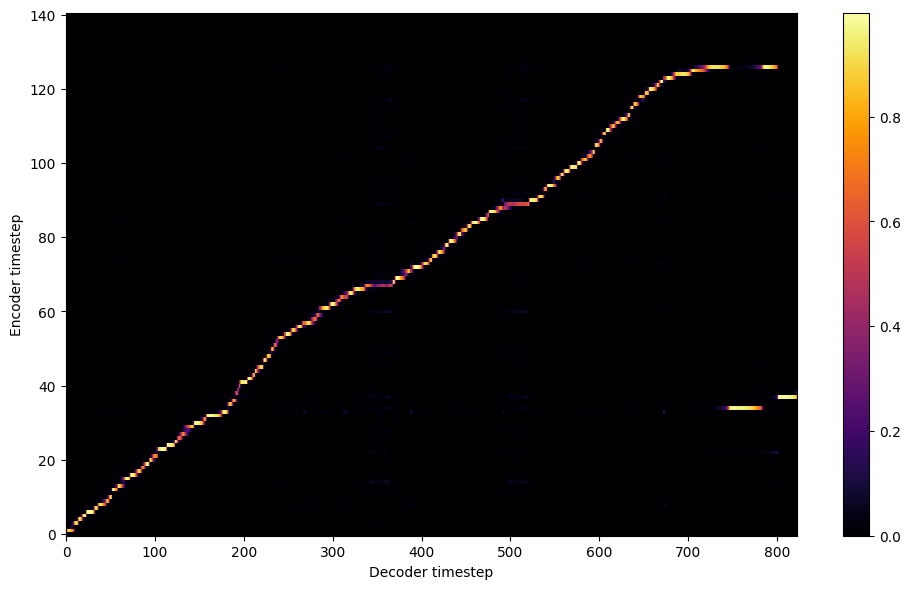


Starting Epoch: 155 Iteration: 465


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 155 Validation loss 468:  0.134019  Time: 0.3m LR: 0.000300


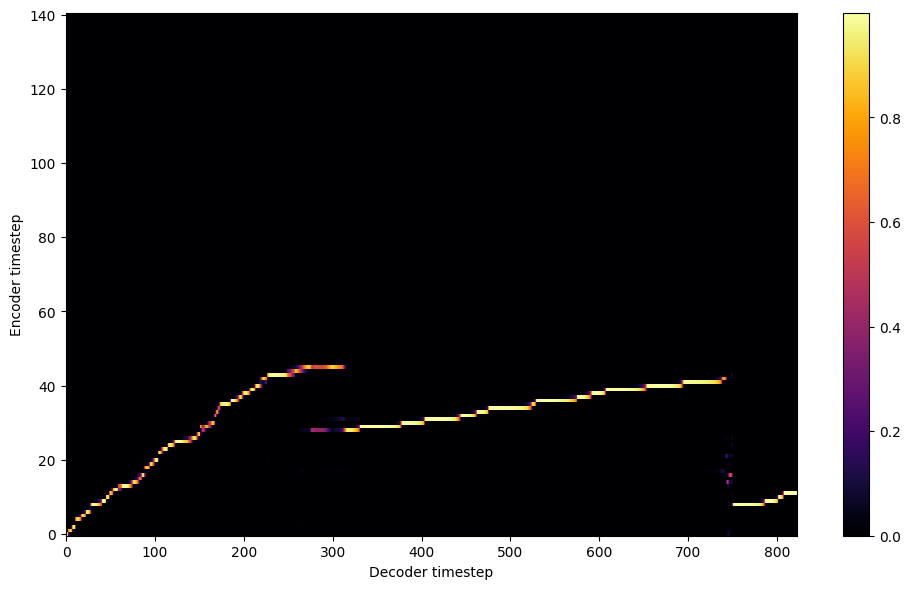


Starting Epoch: 156 Iteration: 468


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 156 Validation loss 471:  0.134168  Time: 0.3m LR: 0.000300


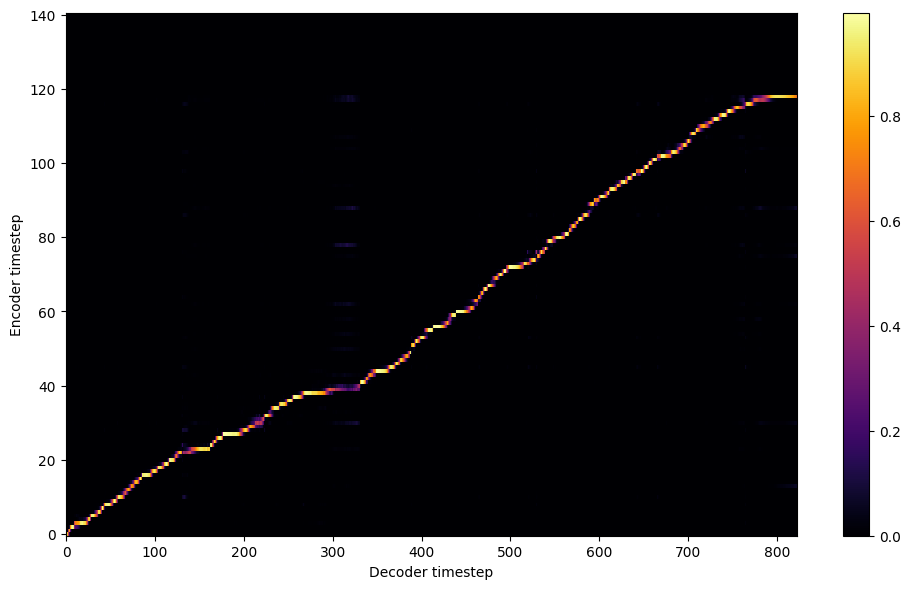


Starting Epoch: 157 Iteration: 471


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 157 Validation loss 474:  0.133920  Time: 0.3m LR: 0.000300


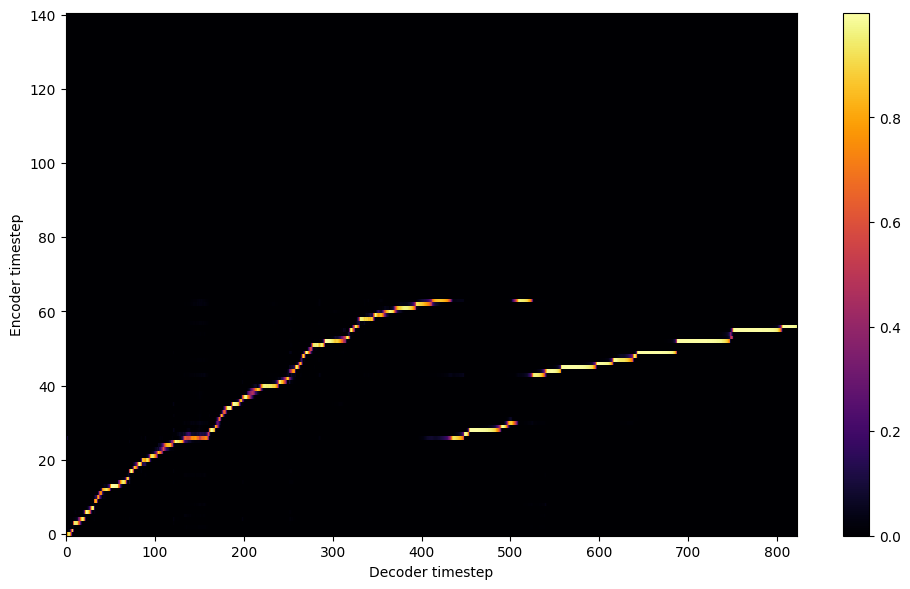


Starting Epoch: 158 Iteration: 474


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 158 Validation loss 477:  0.132848  Time: 0.3m LR: 0.000300


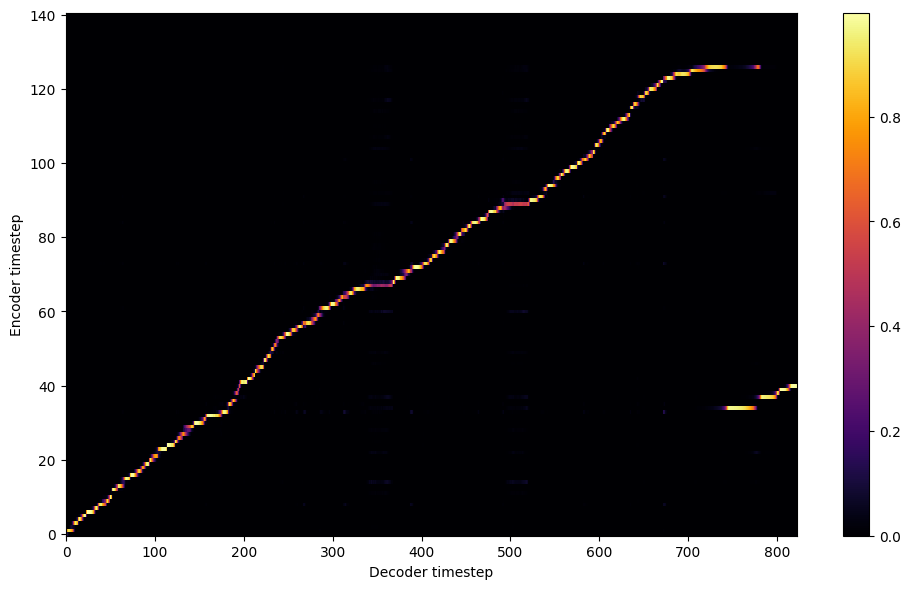


Starting Epoch: 159 Iteration: 477


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 159 Validation loss 480:  0.132917  Time: 0.3m LR: 0.000300


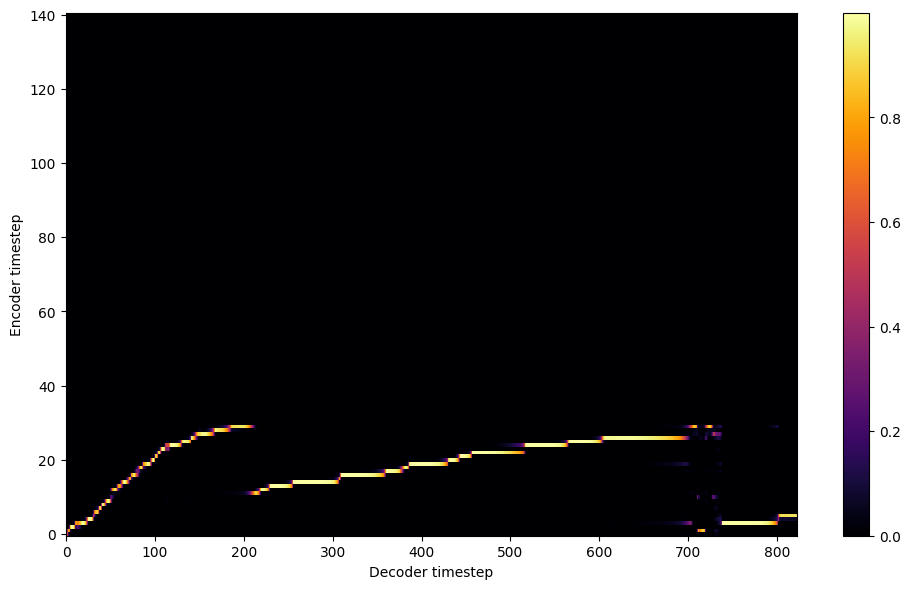

Saving model and optimizer state at iteration 480 to /content/drive/MyDrive/colab/outdir/TTS tacotron
Model Saved

Starting Epoch: 160 Iteration: 480


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 160 Validation loss 483:  0.132457  Time: 0.3m LR: 0.000300


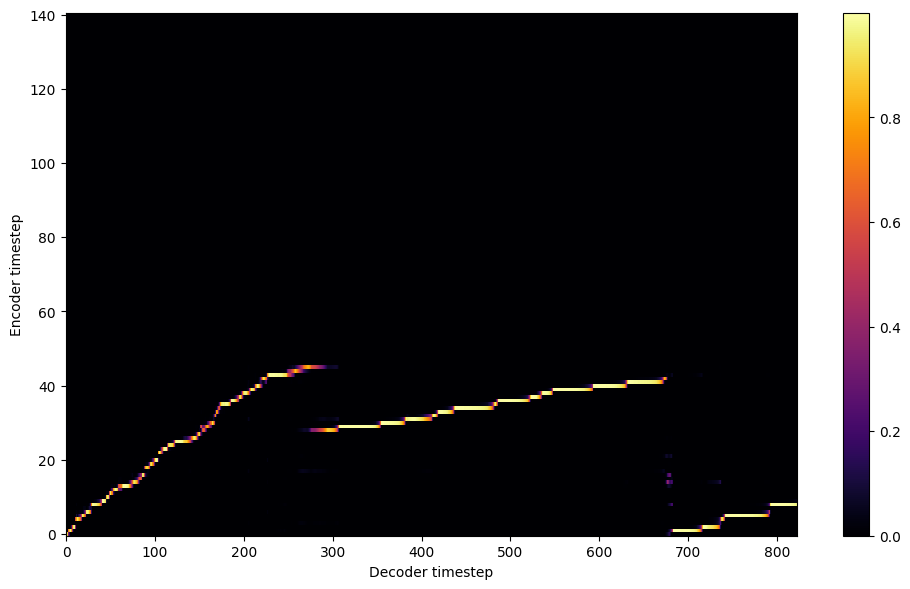


Starting Epoch: 161 Iteration: 483


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 161 Validation loss 486:  0.132285  Time: 0.3m LR: 0.000300


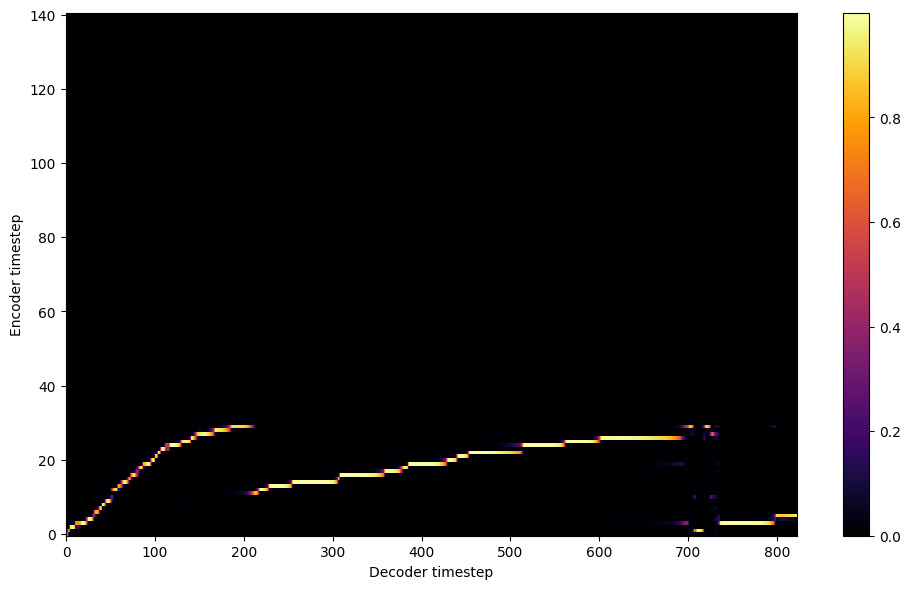


Starting Epoch: 162 Iteration: 486


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 162 Validation loss 489:  0.132405  Time: 0.3m LR: 0.000300


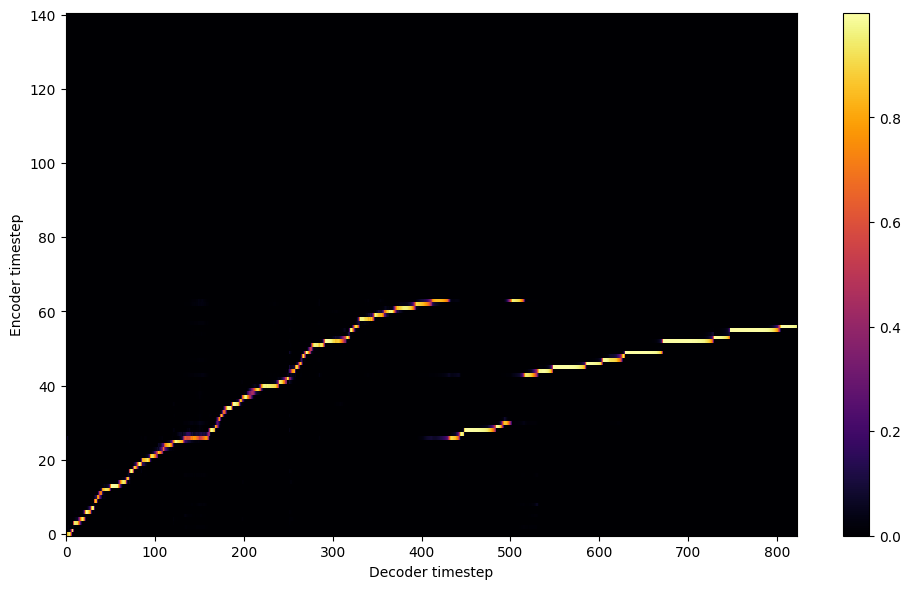


Starting Epoch: 163 Iteration: 489


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 163 Validation loss 492:  0.131934  Time: 0.3m LR: 0.000300


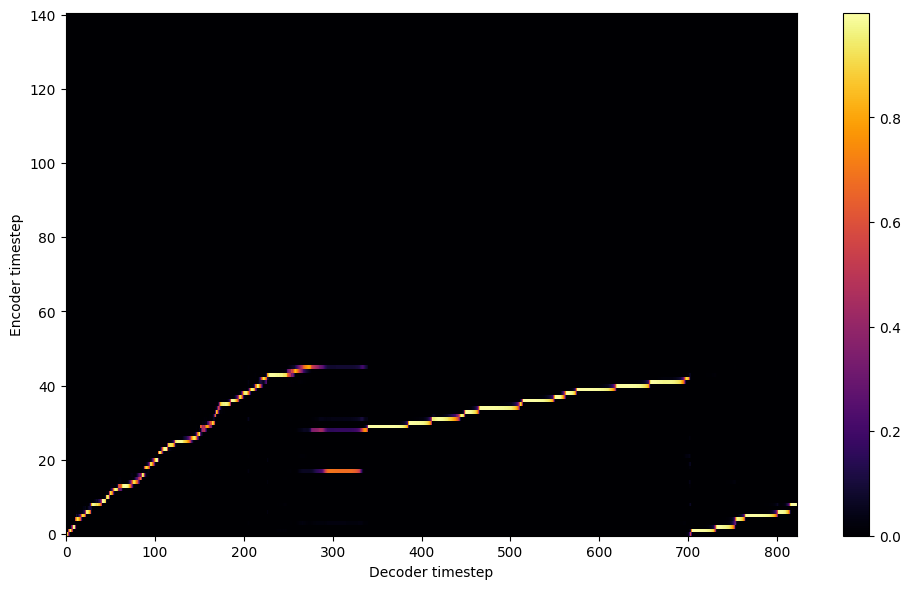


Starting Epoch: 164 Iteration: 492


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 164 Validation loss 495:  0.131742  Time: 0.3m LR: 0.000300


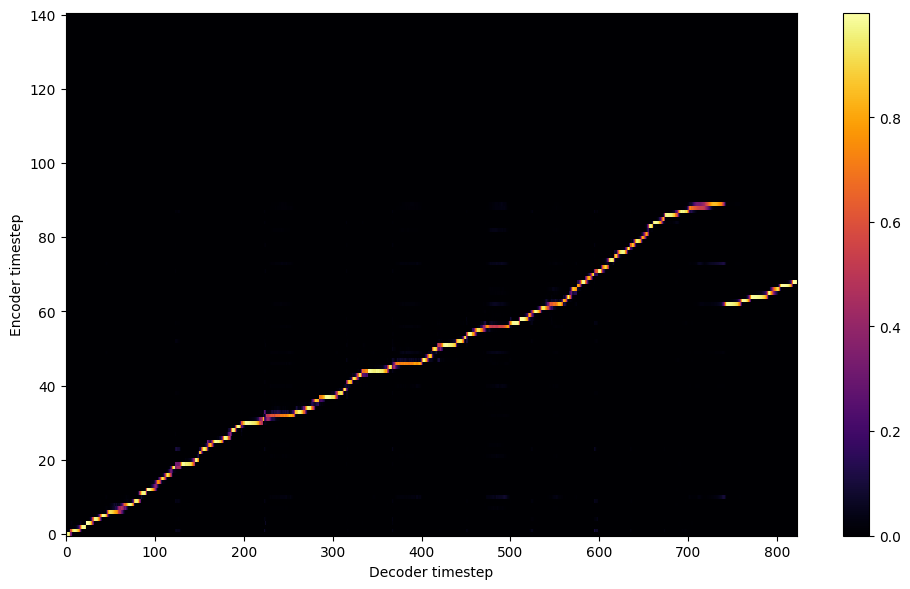


Starting Epoch: 165 Iteration: 495


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 165 Validation loss 498:  0.131261  Time: 0.3m LR: 0.000300


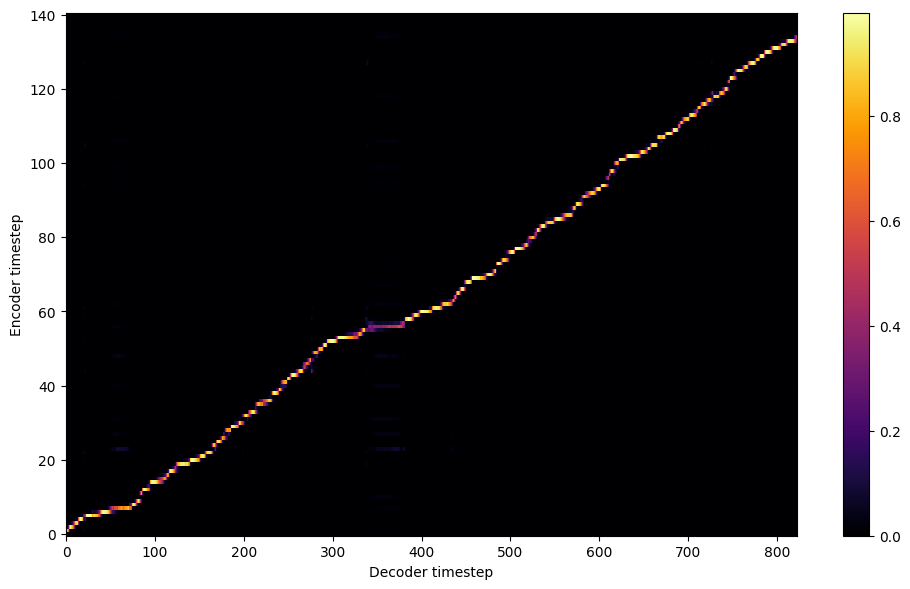


Starting Epoch: 166 Iteration: 498


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 166 Validation loss 501:  0.130784  Time: 0.3m LR: 0.000300


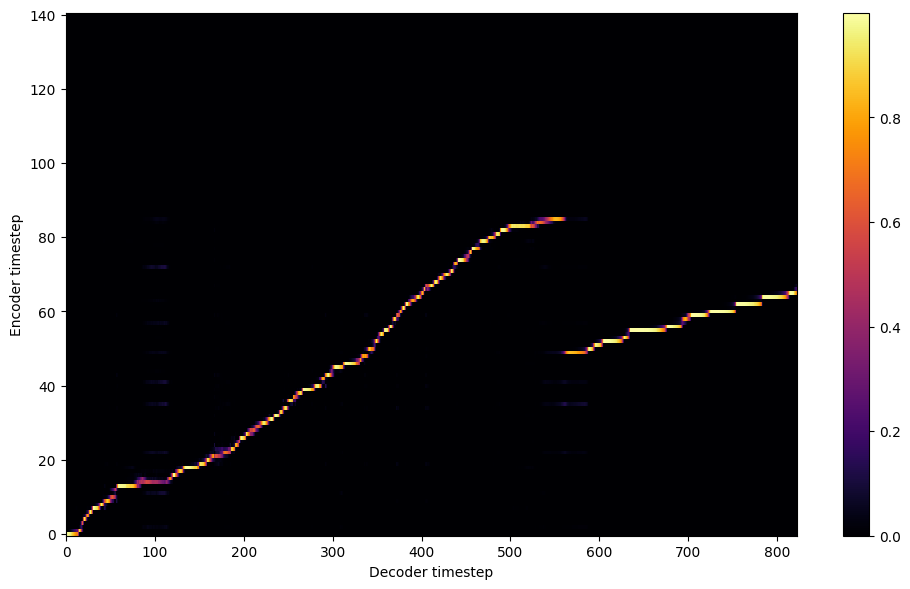


Starting Epoch: 167 Iteration: 501


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 167 Validation loss 504:  0.130078  Time: 0.3m LR: 0.000300


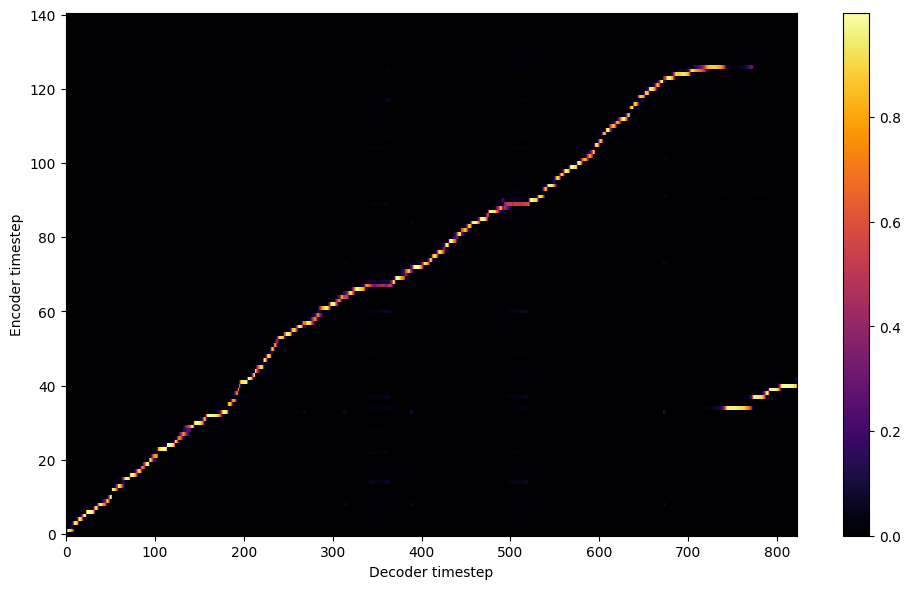


Starting Epoch: 168 Iteration: 504


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 168 Validation loss 507:  0.130201  Time: 0.3m LR: 0.000300


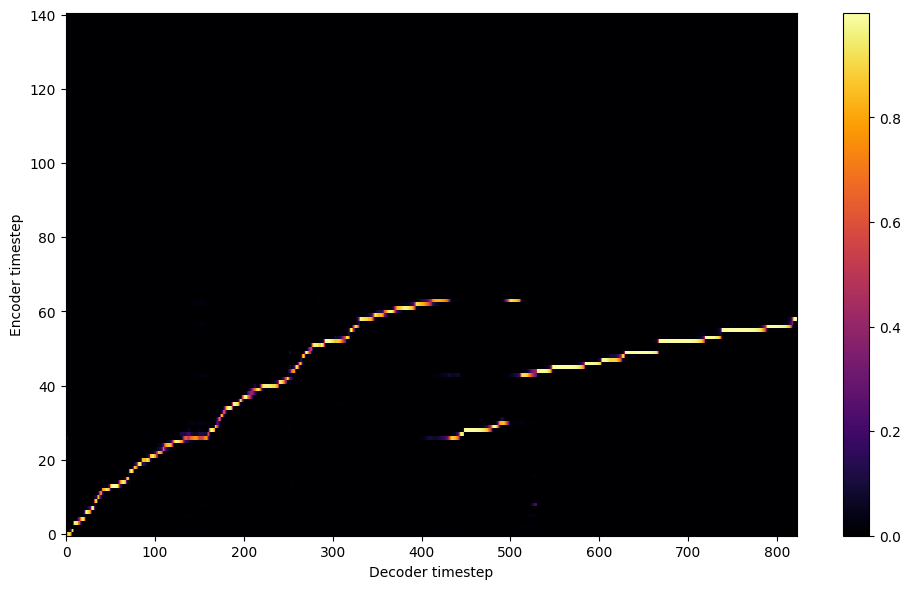


Starting Epoch: 169 Iteration: 507


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 169 Validation loss 510:  0.130005  Time: 0.3m LR: 0.000300


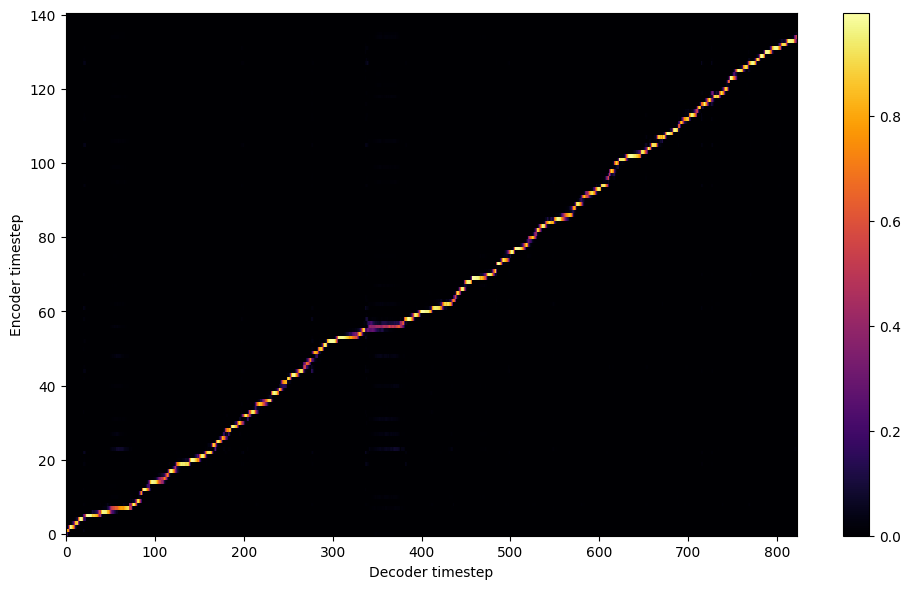

Saving model and optimizer state at iteration 510 to /content/drive/MyDrive/colab/outdir/TTS tacotron
Model Saved

Starting Epoch: 170 Iteration: 510


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 170 Validation loss 513:  0.129371  Time: 0.3m LR: 0.000300


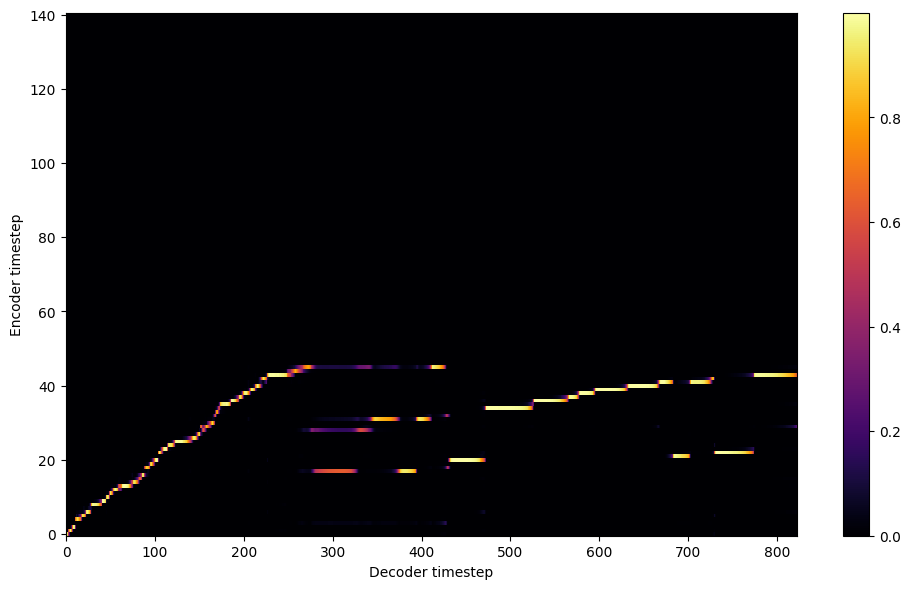


Starting Epoch: 171 Iteration: 513


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 171 Validation loss 516:  0.129437  Time: 0.3m LR: 0.000300


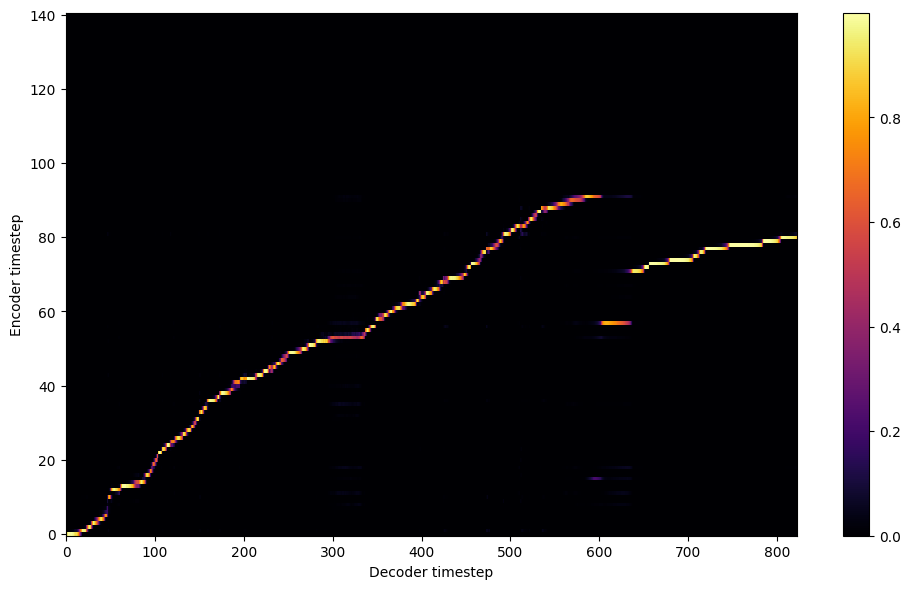


Starting Epoch: 172 Iteration: 516


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 172 Validation loss 519:  0.129277  Time: 0.3m LR: 0.000300


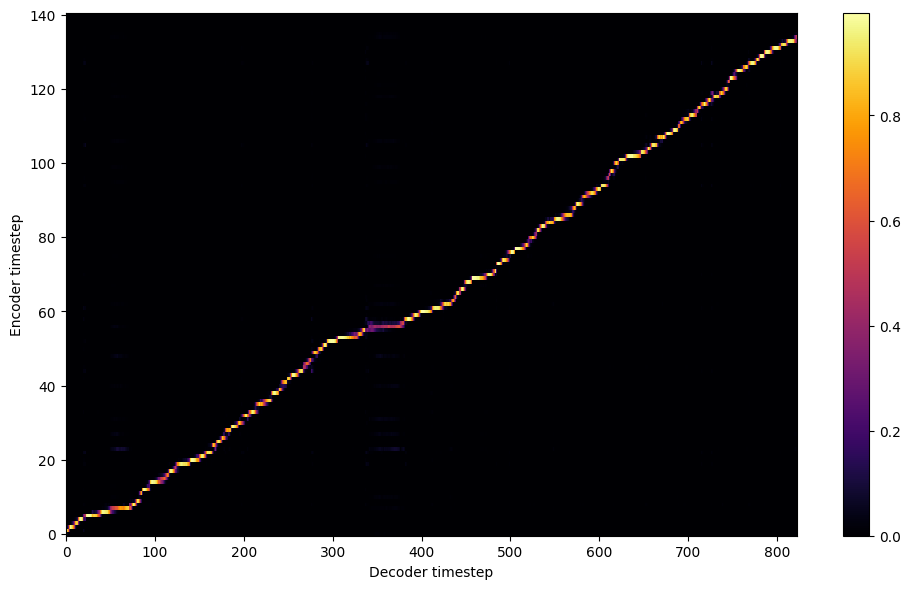


Starting Epoch: 173 Iteration: 519


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 173 Validation loss 522:  0.128591  Time: 0.3m LR: 0.000300


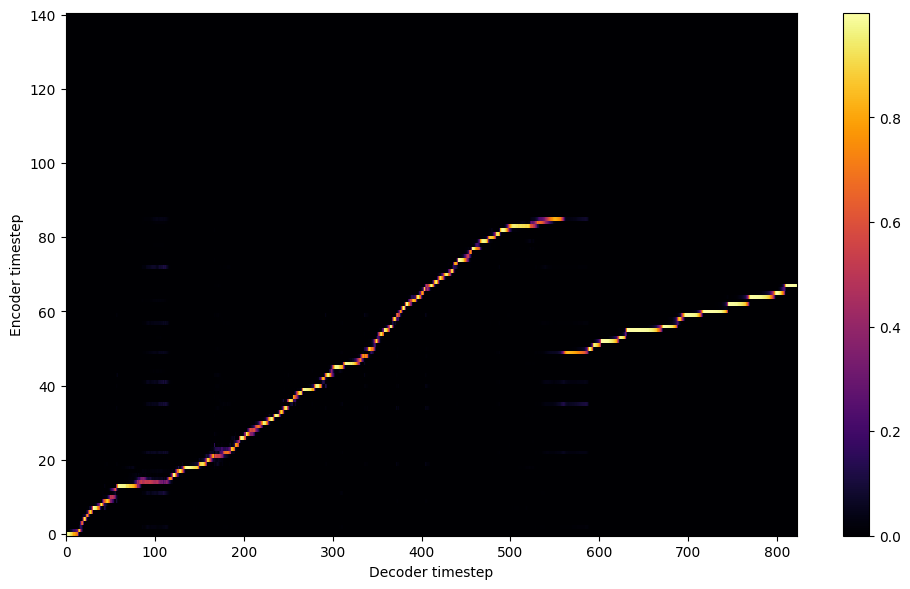


Starting Epoch: 174 Iteration: 522


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 174 Validation loss 525:  0.128327  Time: 0.3m LR: 0.000300


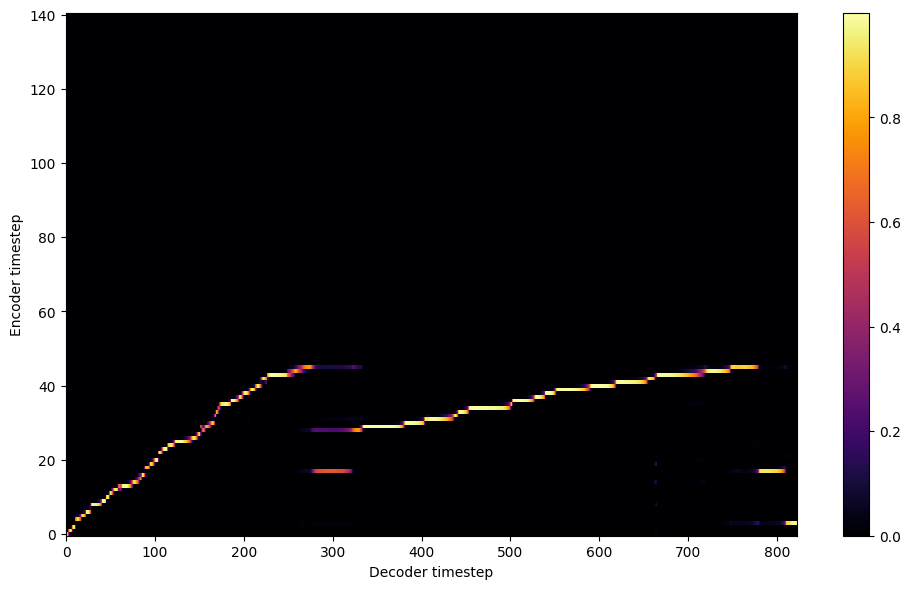


Starting Epoch: 175 Iteration: 525


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 175 Validation loss 528:  0.128499  Time: 0.3m LR: 0.000300


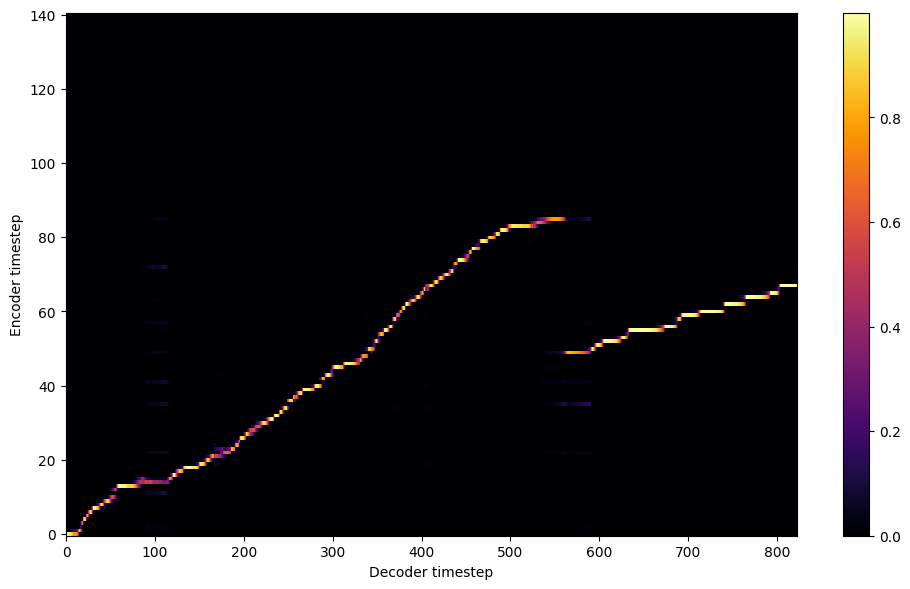


Starting Epoch: 176 Iteration: 528


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 176 Validation loss 531:  0.128260  Time: 0.3m LR: 0.000300


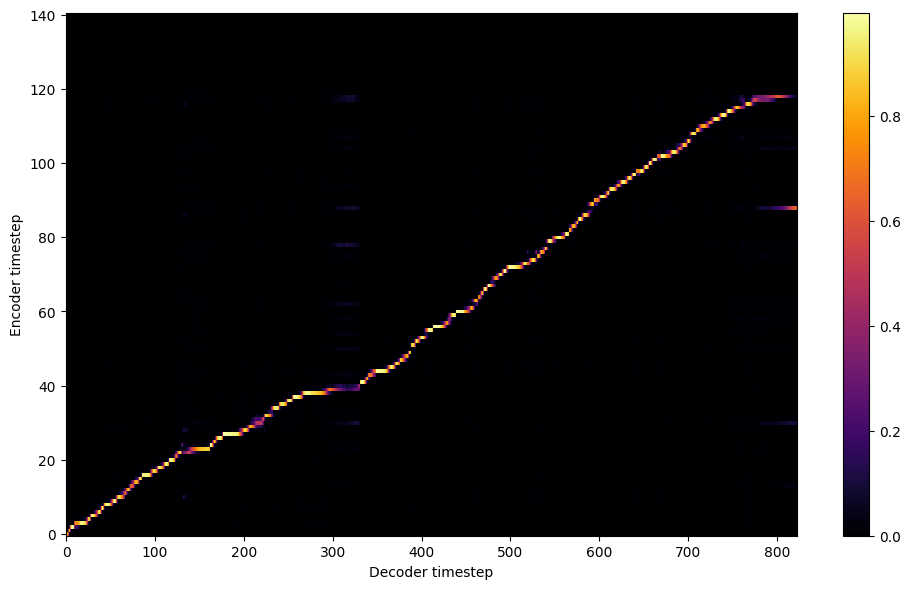


Starting Epoch: 177 Iteration: 531


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 177 Validation loss 534:  0.127459  Time: 0.3m LR: 0.000300


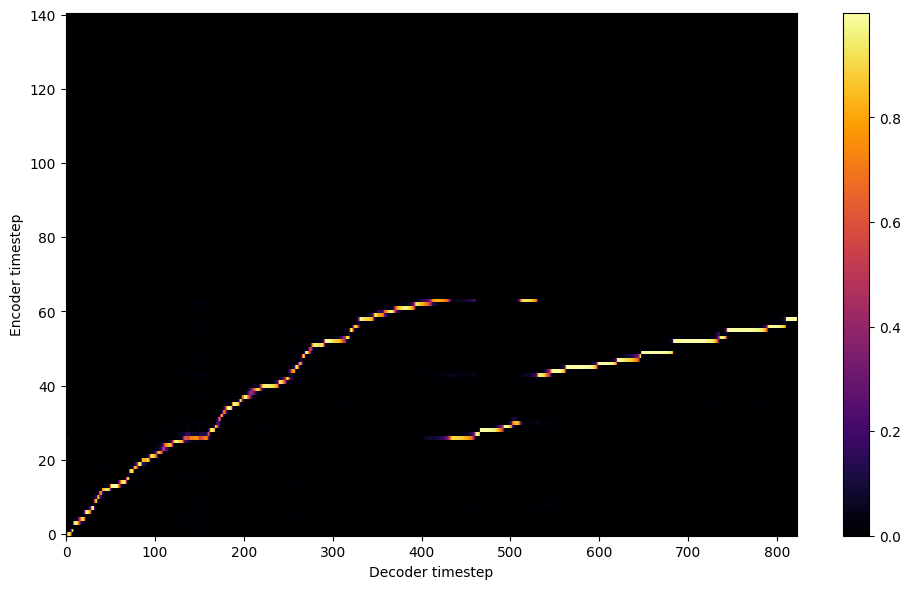


Starting Epoch: 178 Iteration: 534


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 178 Validation loss 537:  0.127146  Time: 0.3m LR: 0.000300


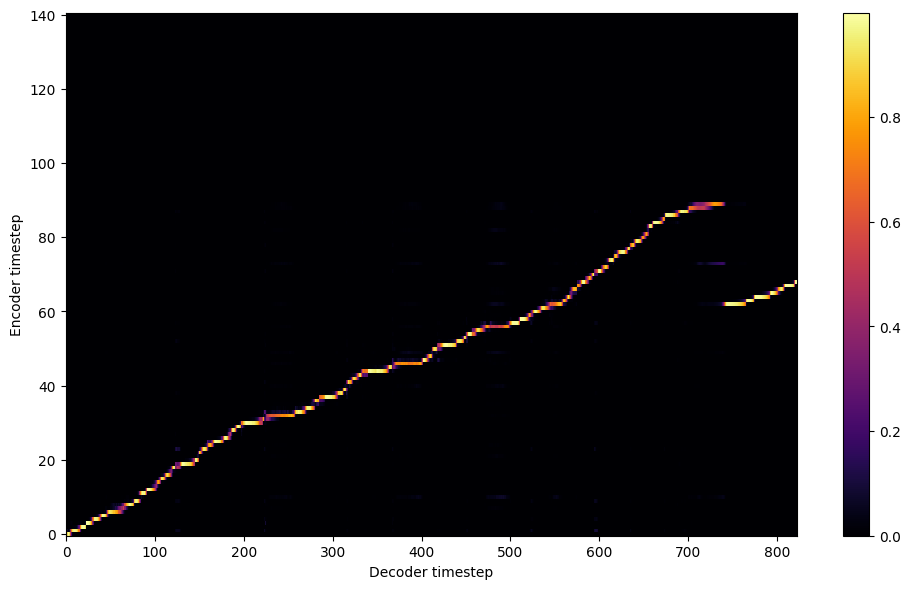


Starting Epoch: 179 Iteration: 537


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 179 Validation loss 540:  0.127858  Time: 0.3m LR: 0.000300


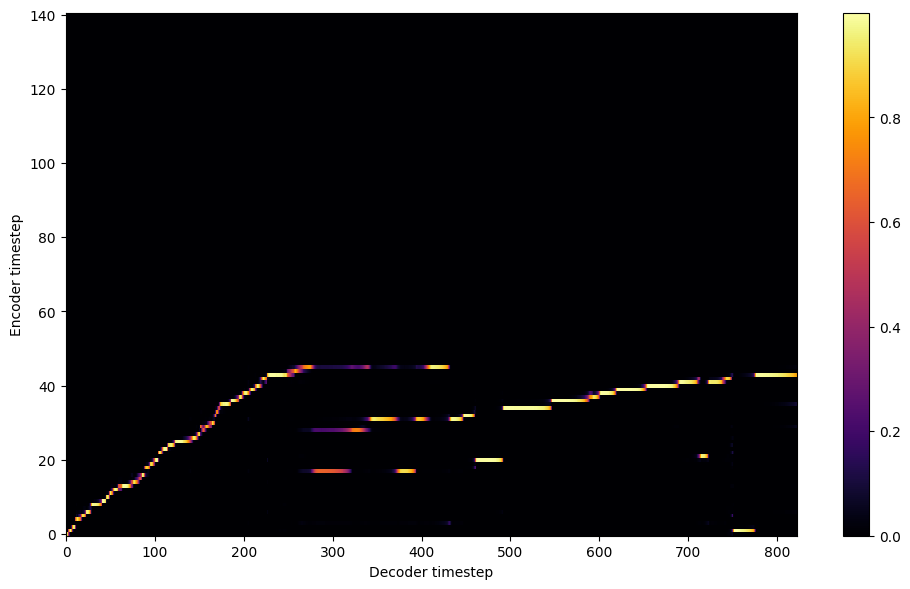

Saving model and optimizer state at iteration 540 to /content/drive/MyDrive/colab/outdir/TTS tacotron
Model Saved

Starting Epoch: 180 Iteration: 540


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 180 Validation loss 543:  0.127261  Time: 0.3m LR: 0.000300


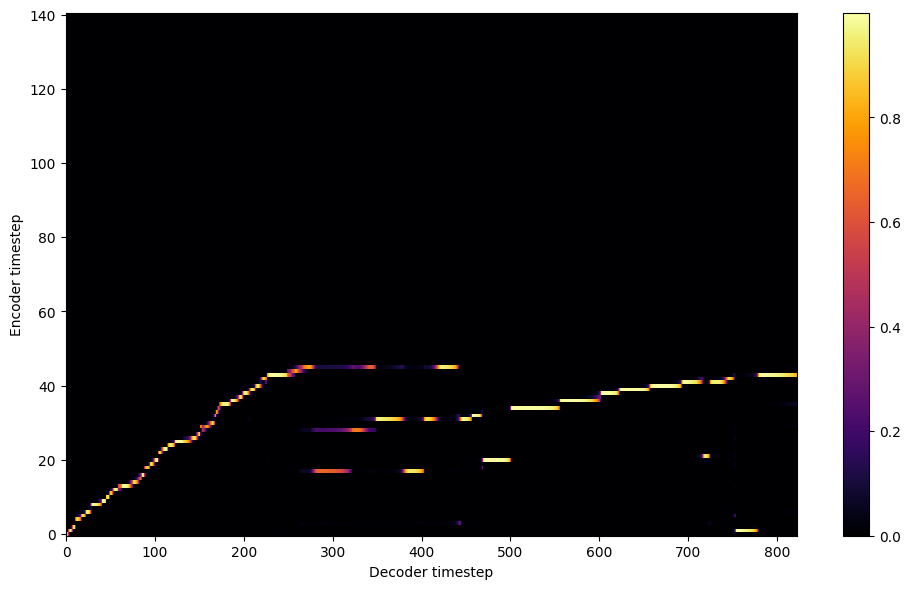


Starting Epoch: 181 Iteration: 543


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 181 Validation loss 546:  0.127133  Time: 0.3m LR: 0.000300


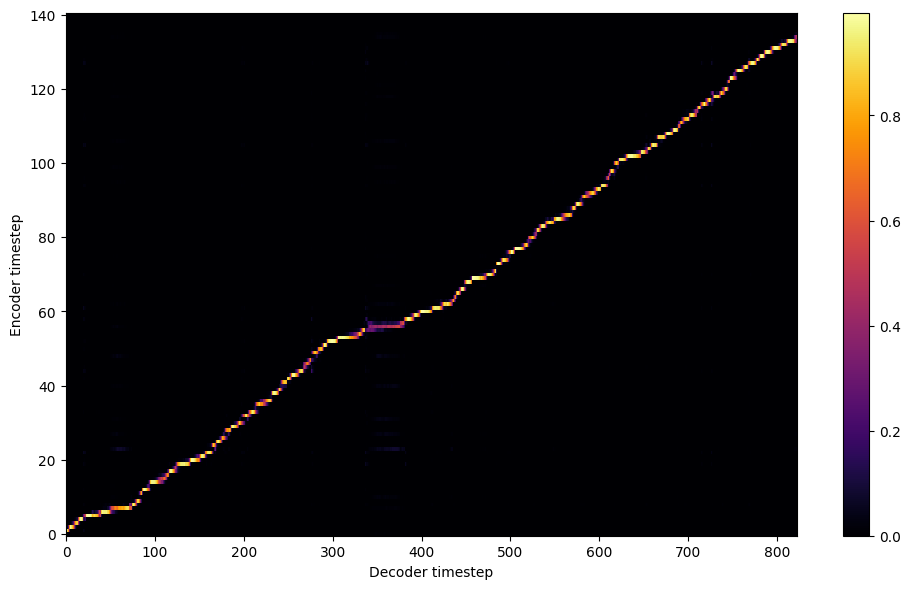


Starting Epoch: 182 Iteration: 546


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 182 Validation loss 549:  0.126632  Time: 0.3m LR: 0.000300


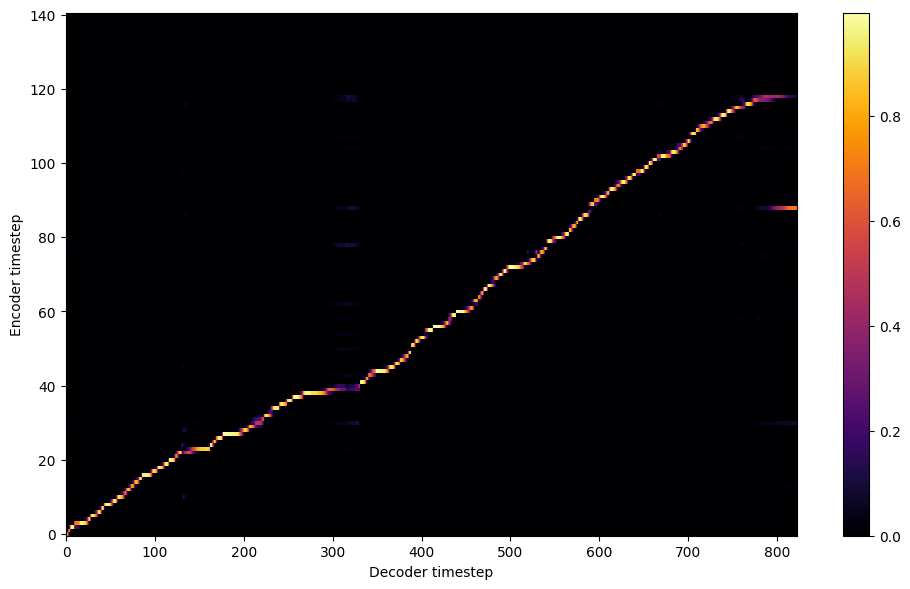


Starting Epoch: 183 Iteration: 549


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 183 Validation loss 552:  0.127028  Time: 0.3m LR: 0.000300


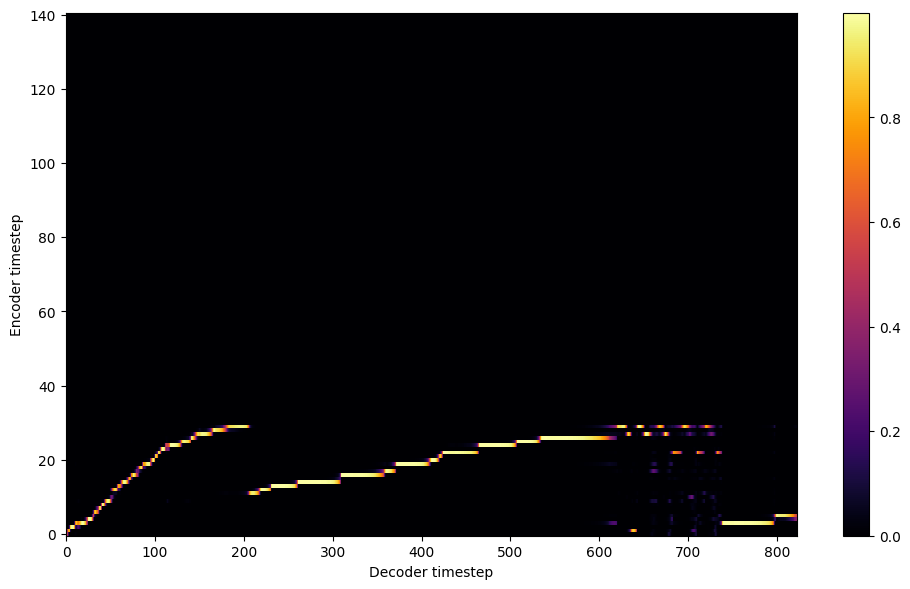


Starting Epoch: 184 Iteration: 552


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 184 Validation loss 555:  0.126110  Time: 0.3m LR: 0.000300


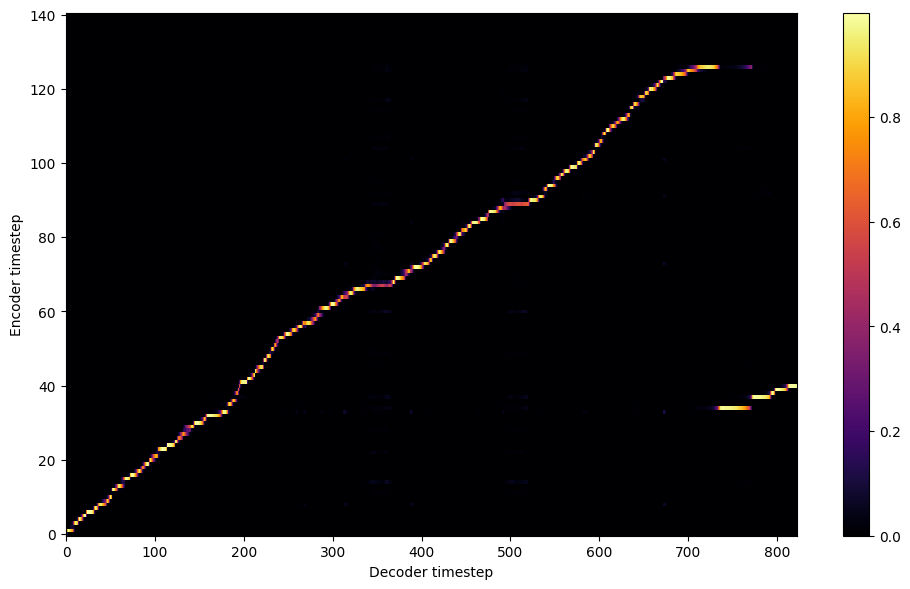


Starting Epoch: 185 Iteration: 555


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 185 Validation loss 558:  0.127094  Time: 0.3m LR: 0.000300


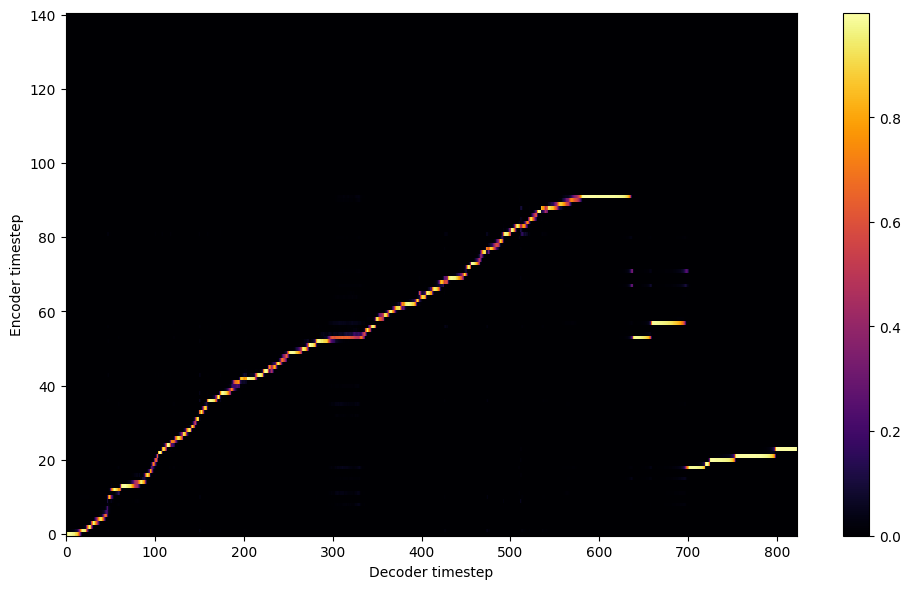


Starting Epoch: 186 Iteration: 558


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 186 Validation loss 561:  0.127158  Time: 0.3m LR: 0.000300


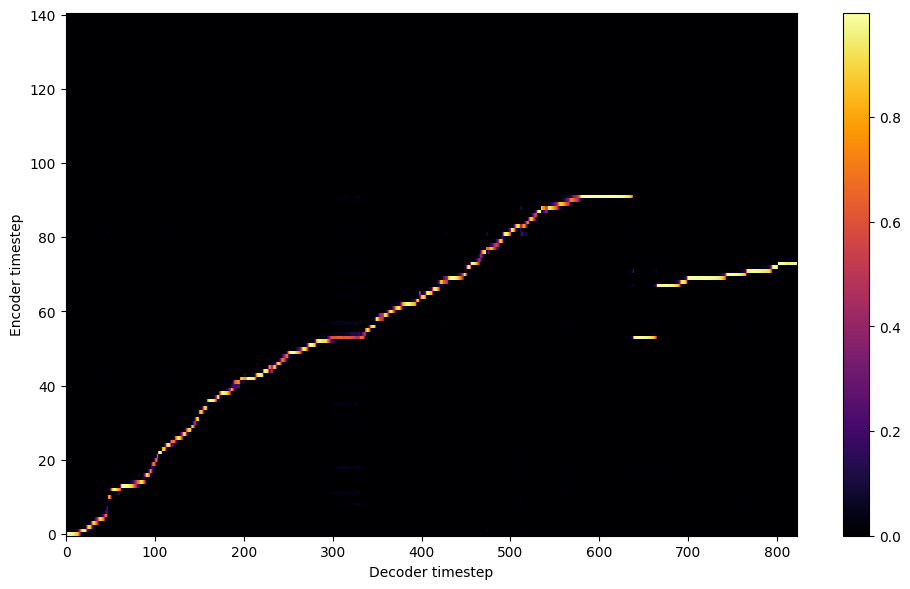


Starting Epoch: 187 Iteration: 561


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 187 Validation loss 564:  0.126633  Time: 0.3m LR: 0.000300


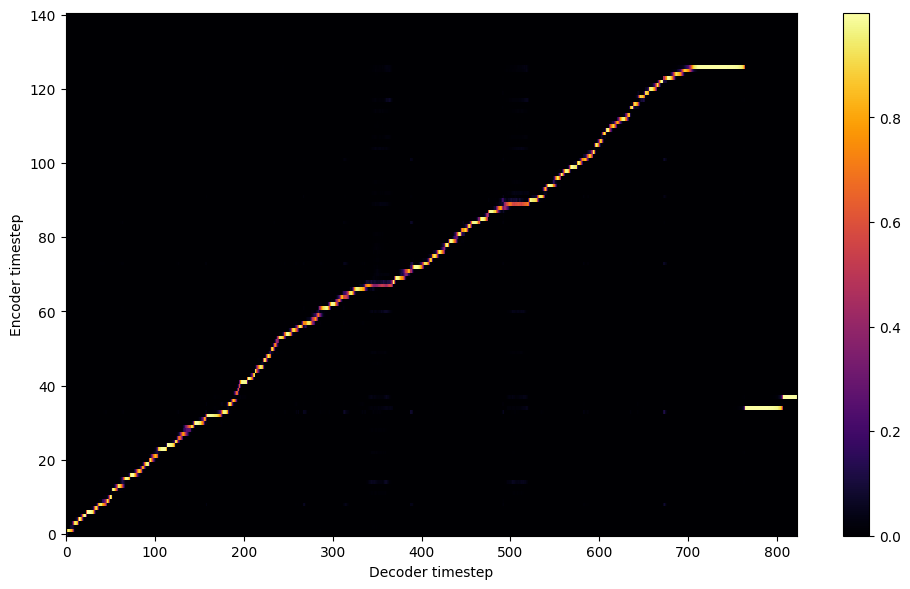


Starting Epoch: 188 Iteration: 564


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 188 Validation loss 567:  0.127084  Time: 0.3m LR: 0.000300


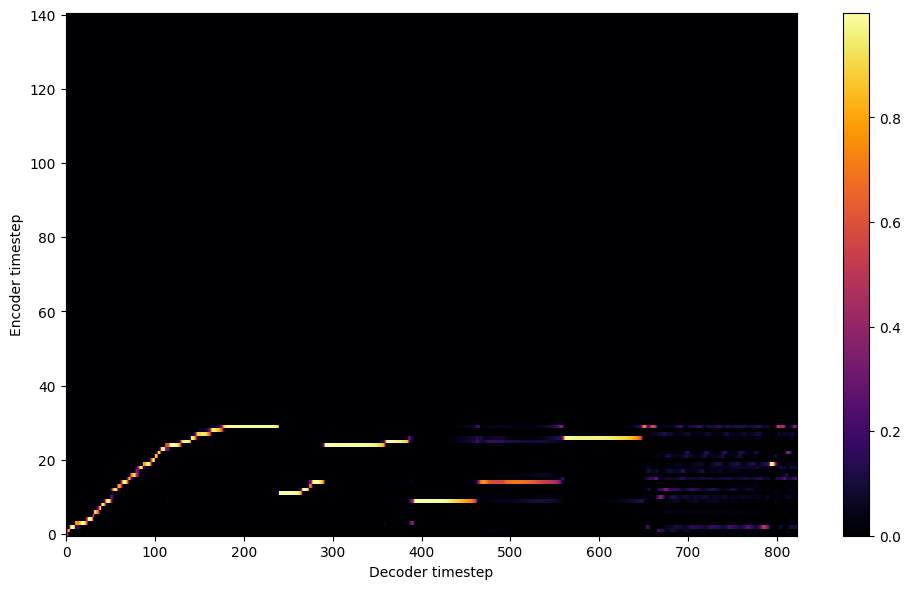


Starting Epoch: 189 Iteration: 567


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 189 Validation loss 570:  0.125899  Time: 0.3m LR: 0.000300


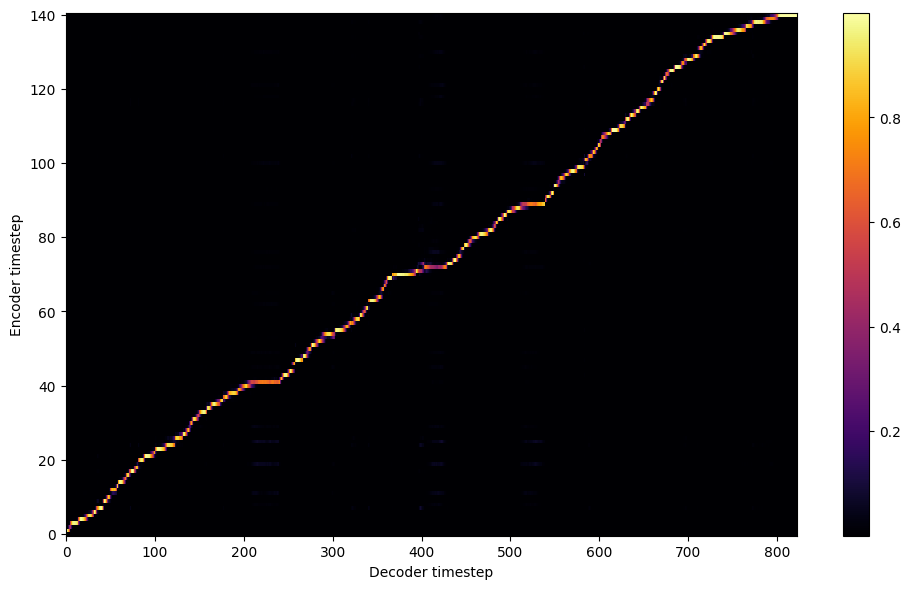

Saving model and optimizer state at iteration 570 to /content/drive/MyDrive/colab/outdir/TTS tacotron
Model Saved

Starting Epoch: 190 Iteration: 570


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 190 Validation loss 573:  0.125506  Time: 0.3m LR: 0.000300


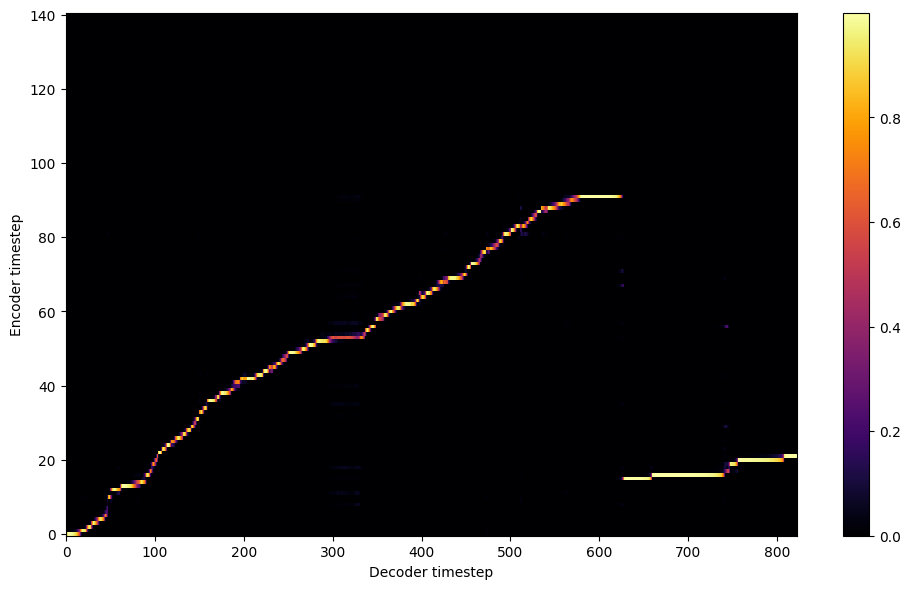


Starting Epoch: 191 Iteration: 573


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 191 Validation loss 576:  0.125084  Time: 0.3m LR: 0.000300


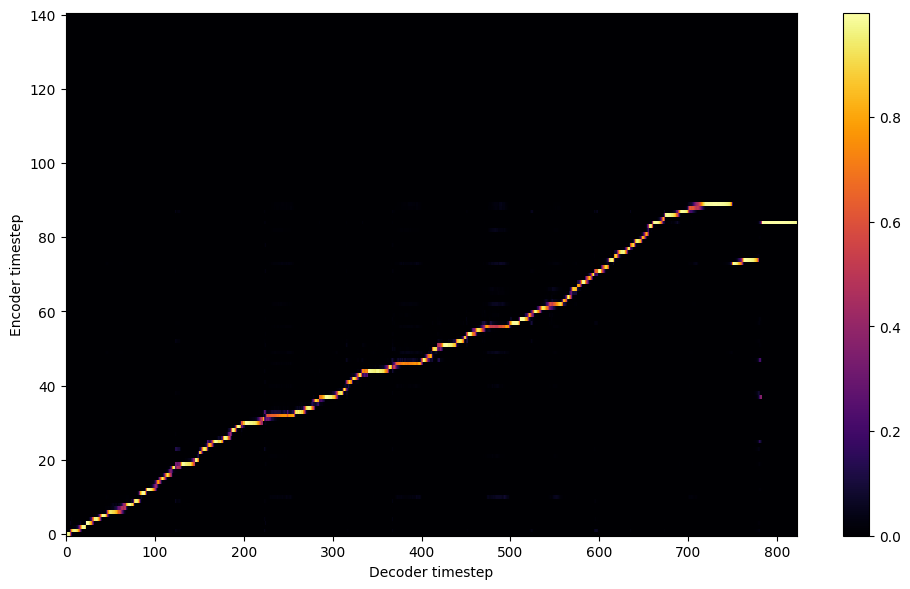


Starting Epoch: 192 Iteration: 576


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 192 Validation loss 579:  0.124748  Time: 0.3m LR: 0.000300


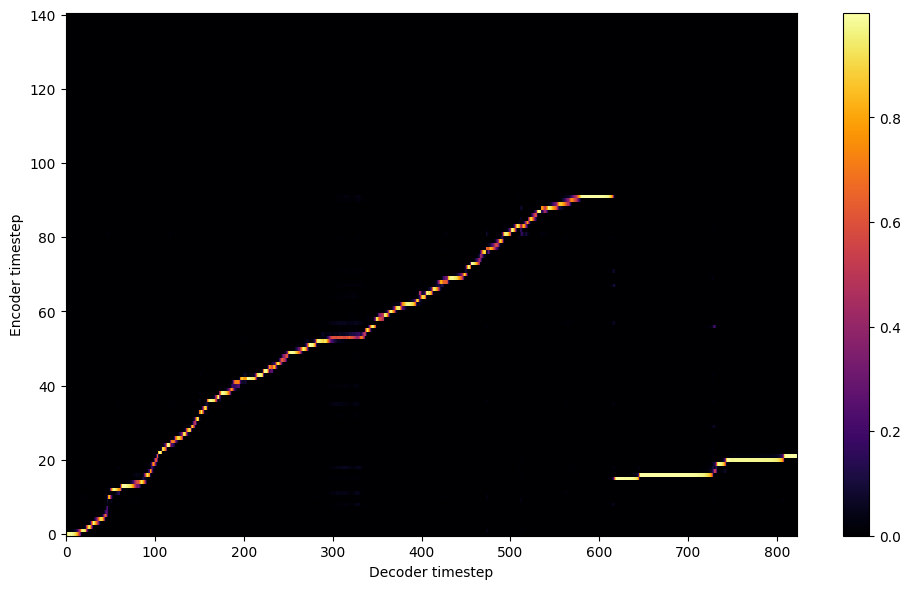


Starting Epoch: 193 Iteration: 579


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 193 Validation loss 582:  0.124530  Time: 0.3m LR: 0.000300


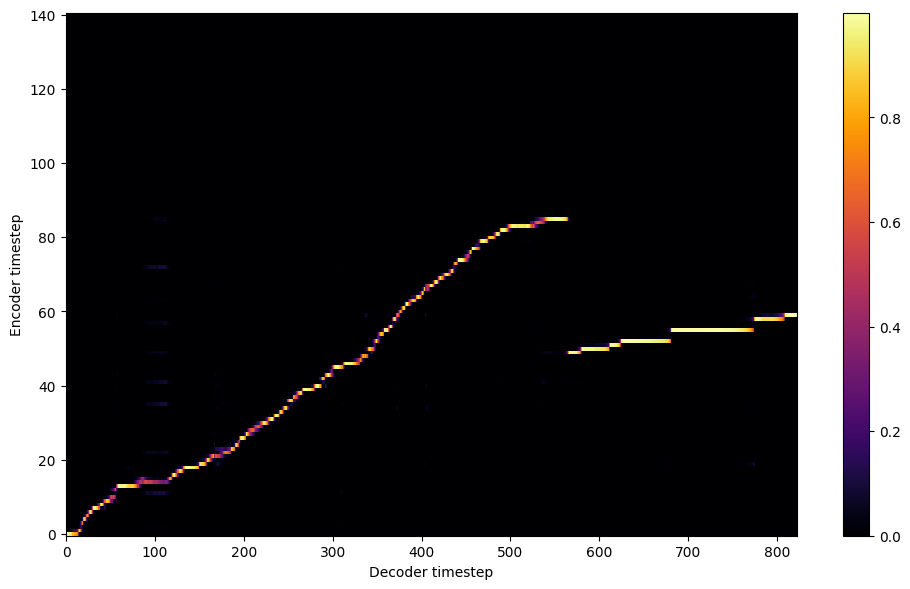


Starting Epoch: 194 Iteration: 582


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 194 Validation loss 585:  0.124698  Time: 0.3m LR: 0.000300


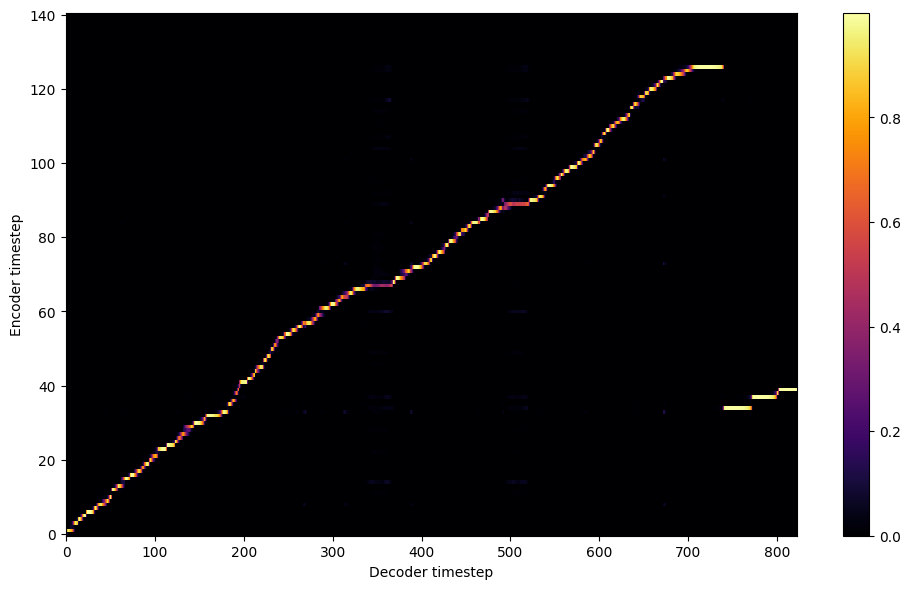


Starting Epoch: 195 Iteration: 585


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 195 Validation loss 588:  0.124201  Time: 0.3m LR: 0.000300


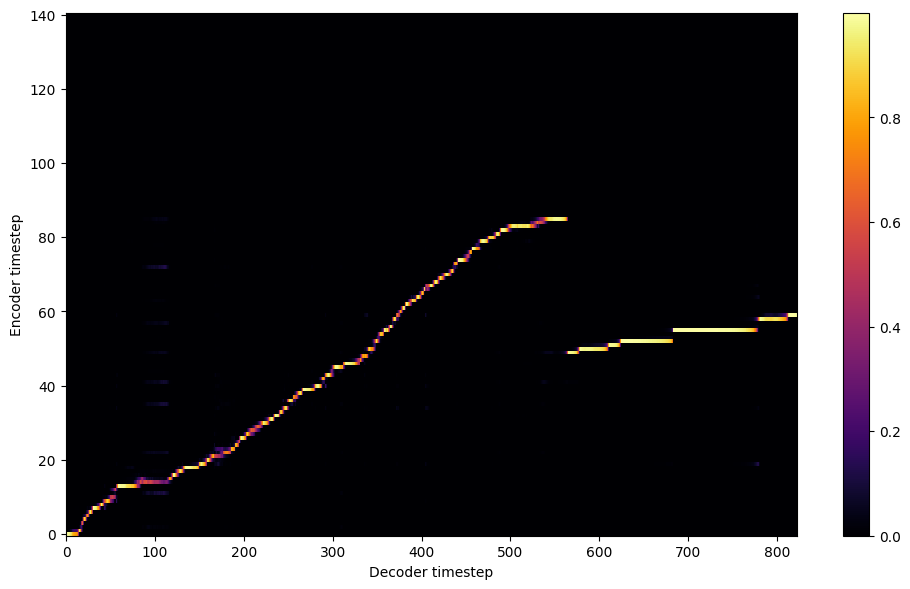


Starting Epoch: 196 Iteration: 588


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 196 Validation loss 591:  0.124083  Time: 0.3m LR: 0.000300


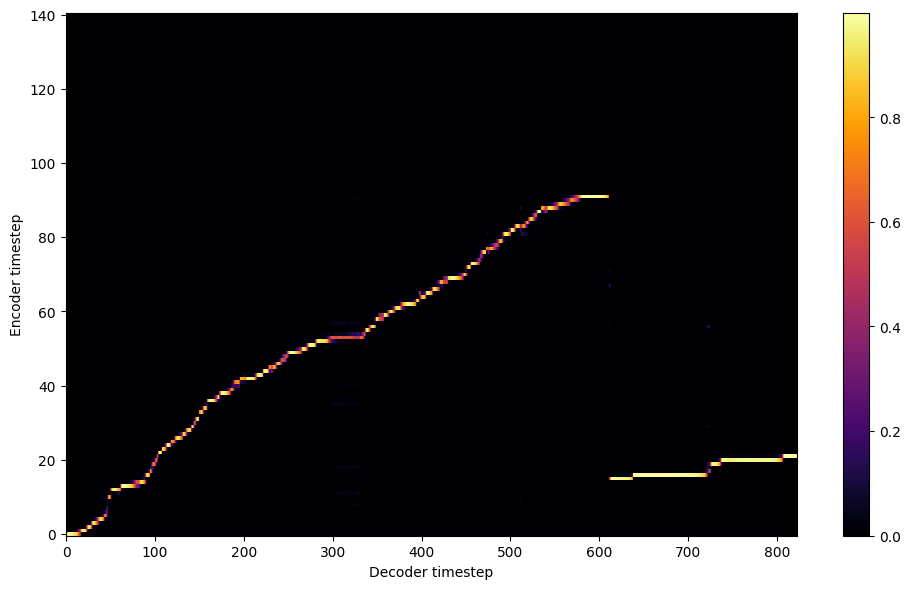


Starting Epoch: 197 Iteration: 591


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 197 Validation loss 594:  0.124010  Time: 0.3m LR: 0.000300


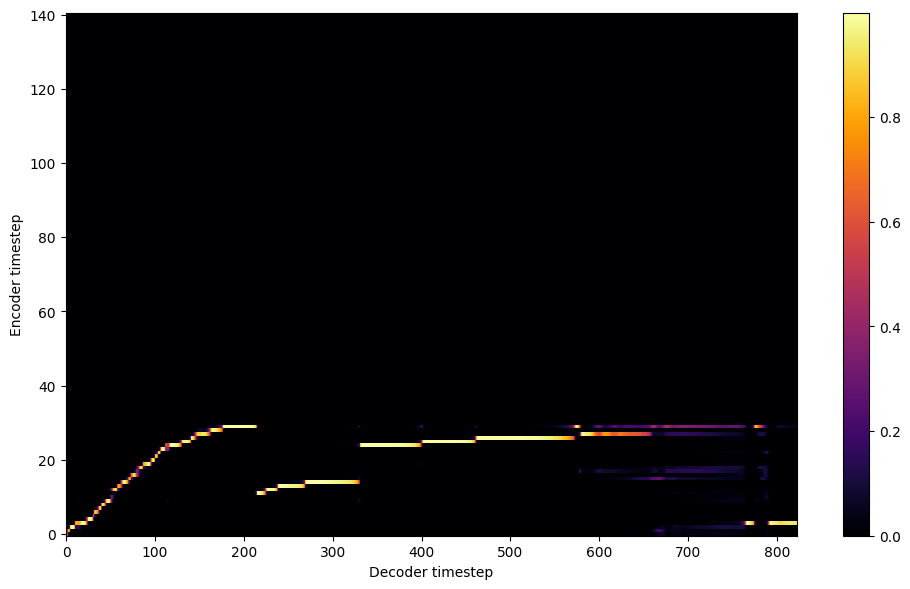


Starting Epoch: 198 Iteration: 594


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 198 Validation loss 597:  0.123084  Time: 0.3m LR: 0.000300


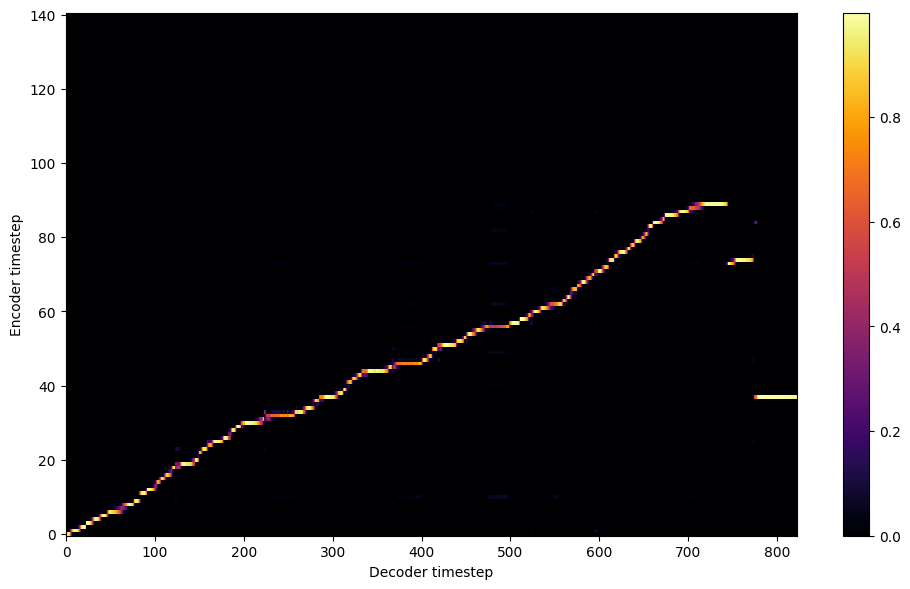


Starting Epoch: 199 Iteration: 597


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 199 Validation loss 600:  0.122845  Time: 0.3m LR: 0.000300


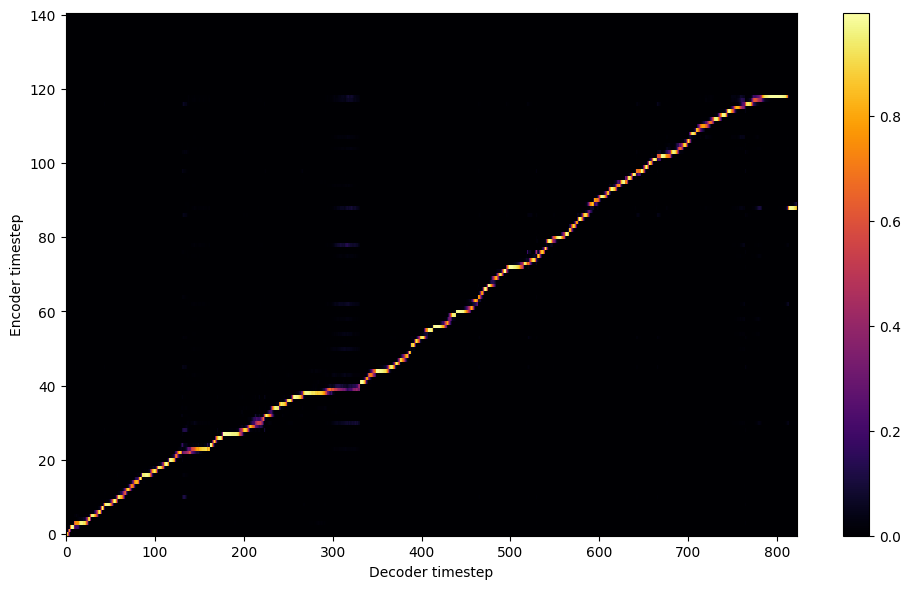

Saving model and optimizer state at iteration 600 to /content/drive/MyDrive/colab/outdir/TTS tacotron
Model Saved

Starting Epoch: 200 Iteration: 600


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 200 Validation loss 603:  0.122783  Time: 0.3m LR: 0.000300


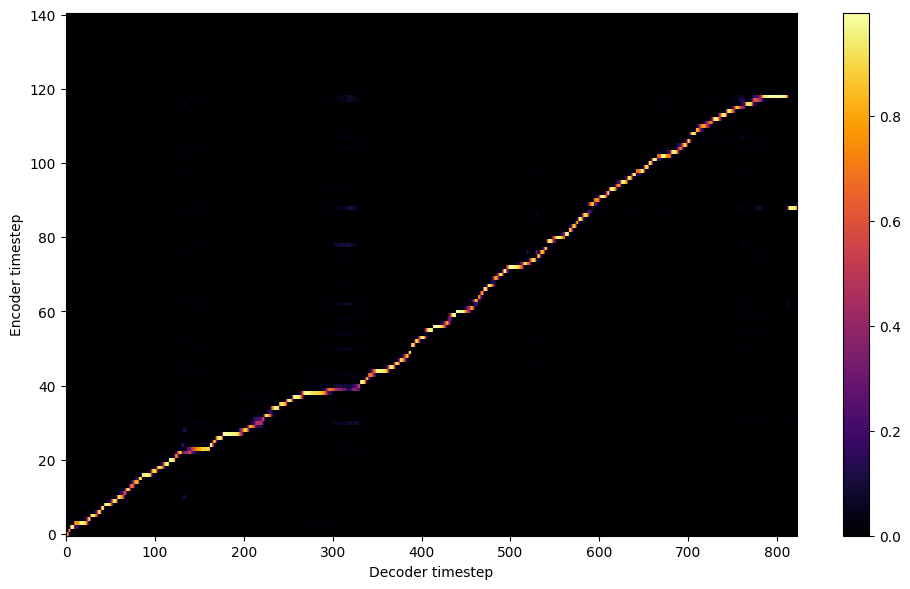


Starting Epoch: 201 Iteration: 603


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 201 Validation loss 606:  0.122585  Time: 0.3m LR: 0.000300


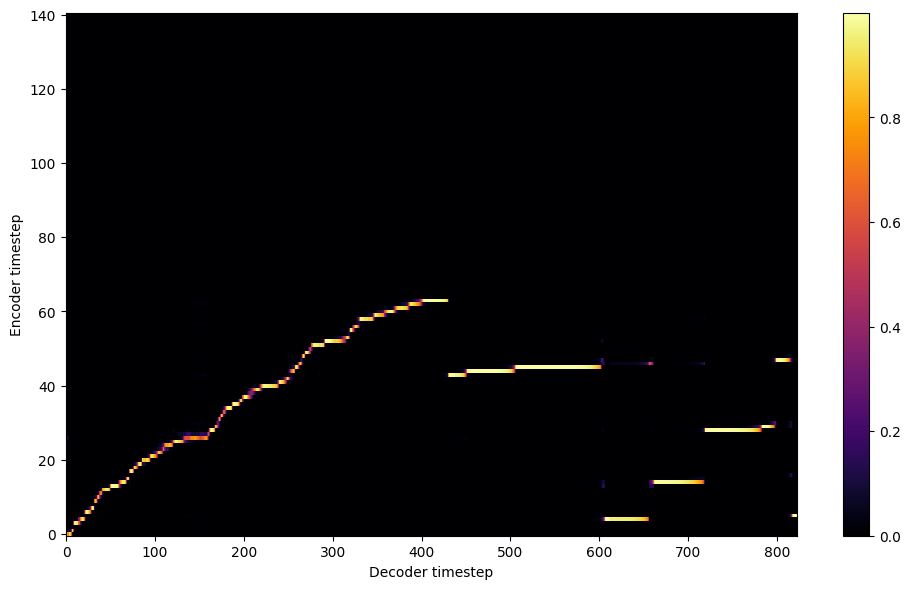


Starting Epoch: 202 Iteration: 606


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 202 Validation loss 609:  0.122462  Time: 0.3m LR: 0.000300


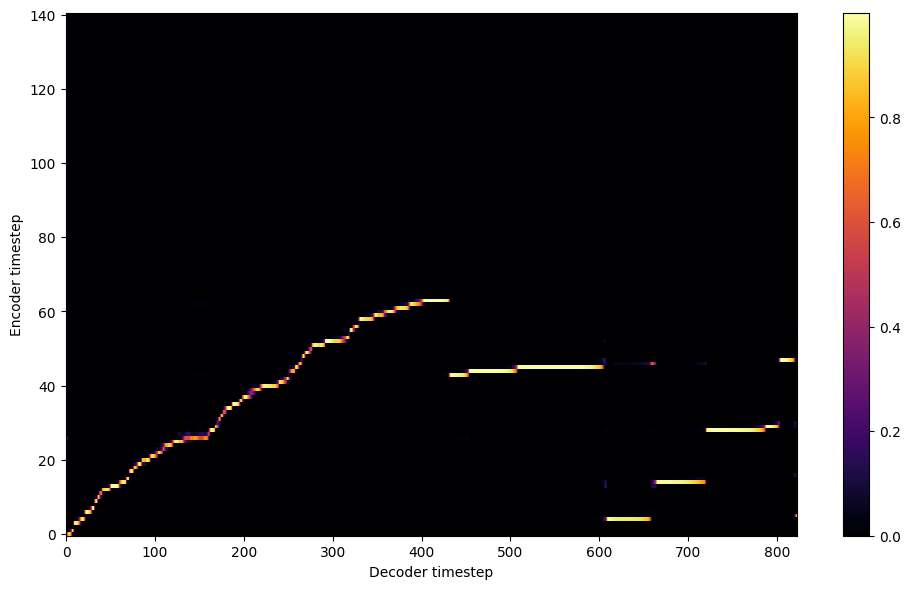


Starting Epoch: 203 Iteration: 609


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 203 Validation loss 612:  0.121929  Time: 0.3m LR: 0.000300


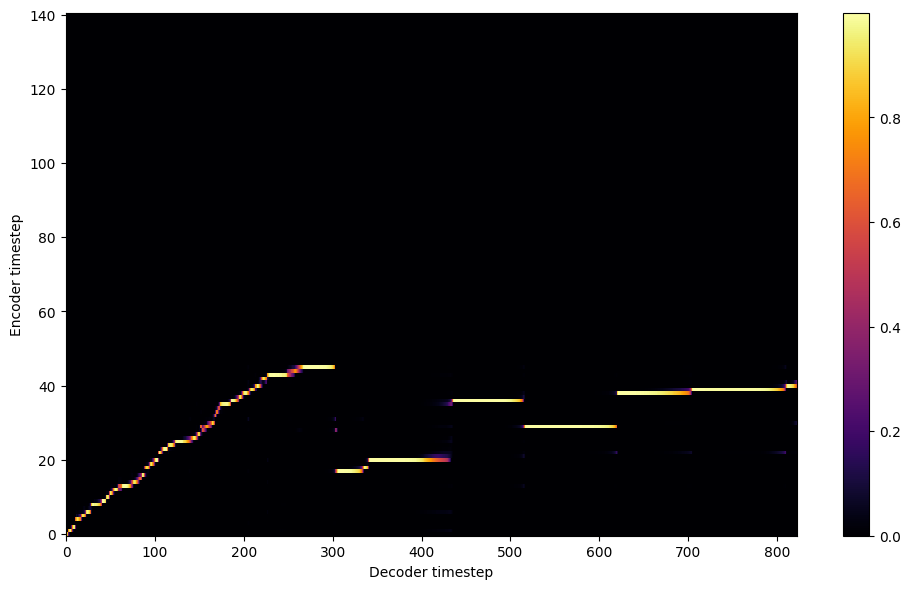


Starting Epoch: 204 Iteration: 612


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 204 Validation loss 615:  0.121761  Time: 0.3m LR: 0.000300


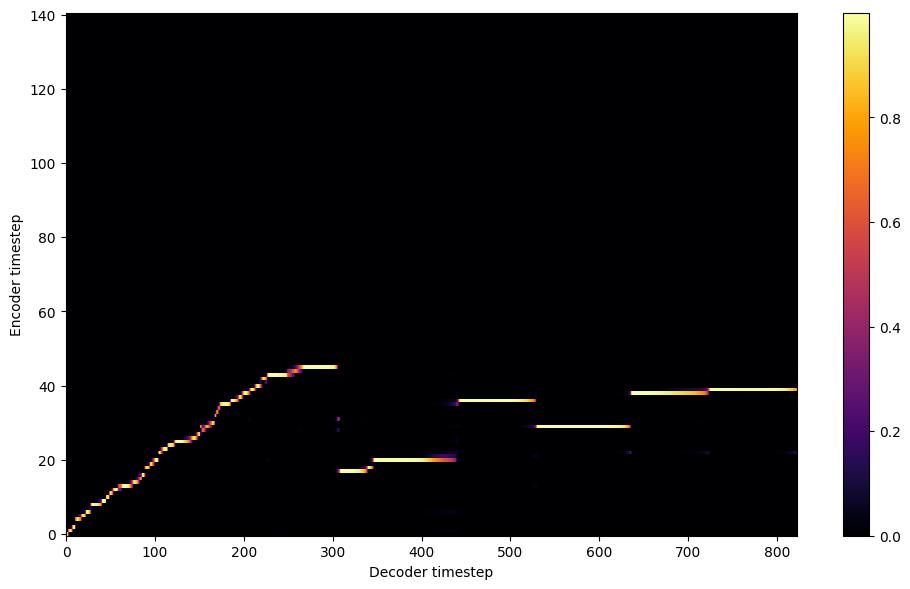


Starting Epoch: 205 Iteration: 615


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 205 Validation loss 618:  0.121843  Time: 0.3m LR: 0.000300


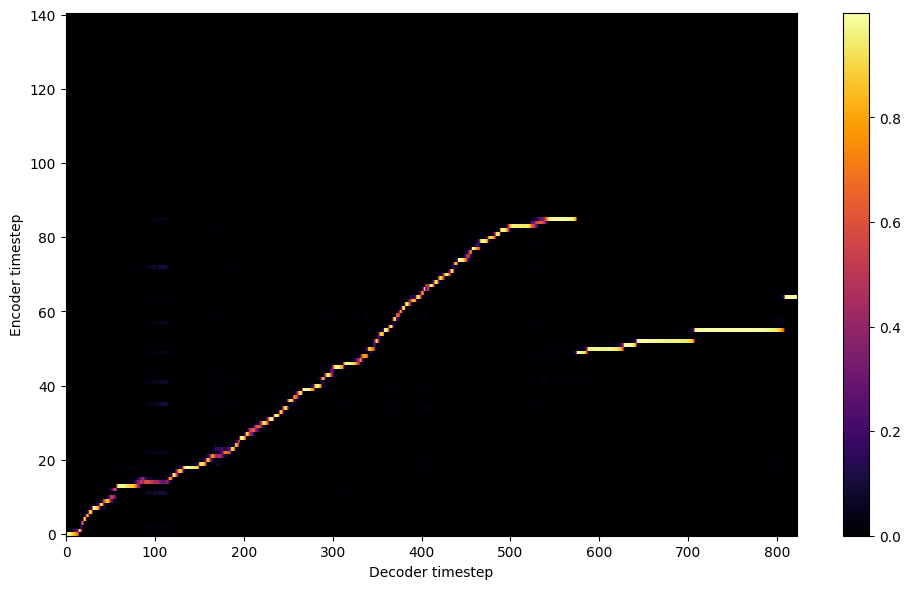


Starting Epoch: 206 Iteration: 618


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 206 Validation loss 621:  0.121277  Time: 0.3m LR: 0.000300


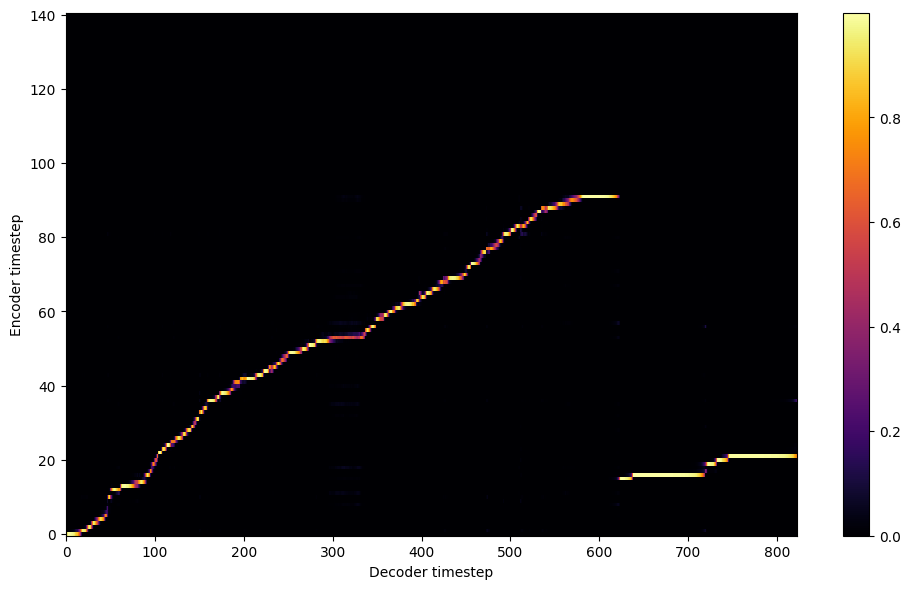


Starting Epoch: 207 Iteration: 621


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 207 Validation loss 624:  0.120981  Time: 0.3m LR: 0.000300


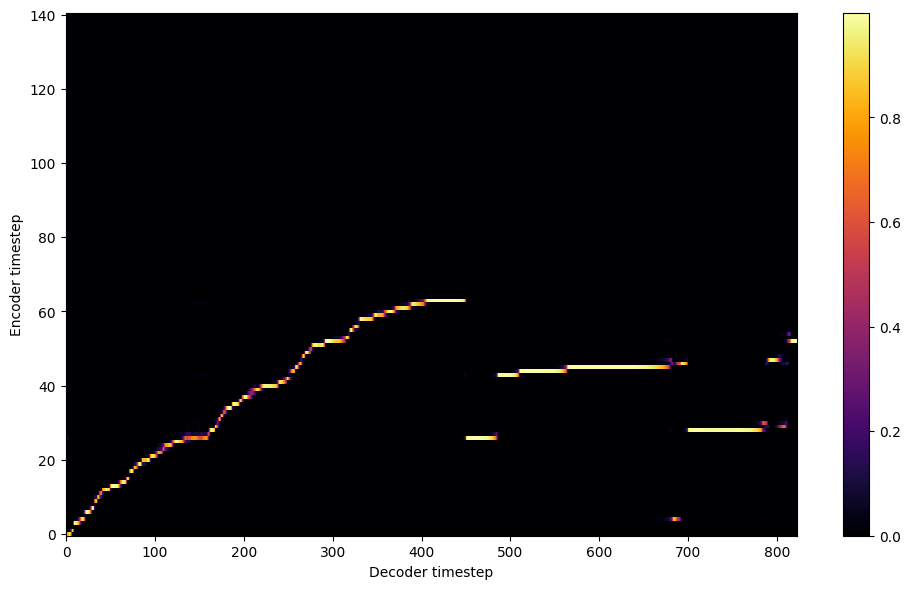


Starting Epoch: 208 Iteration: 624


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 208 Validation loss 627:  0.121029  Time: 0.3m LR: 0.000300


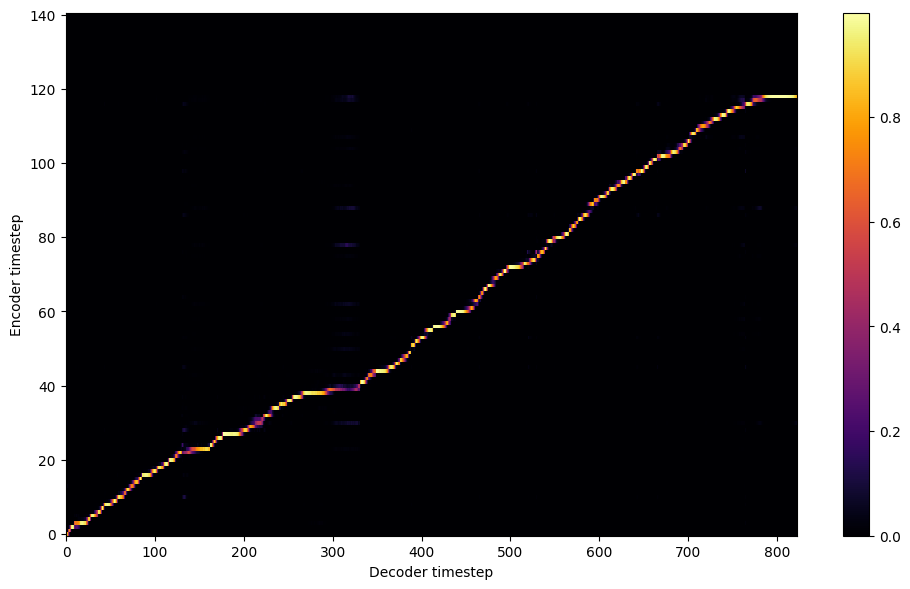


Starting Epoch: 209 Iteration: 627


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 209 Validation loss 630:  0.121199  Time: 0.3m LR: 0.000300


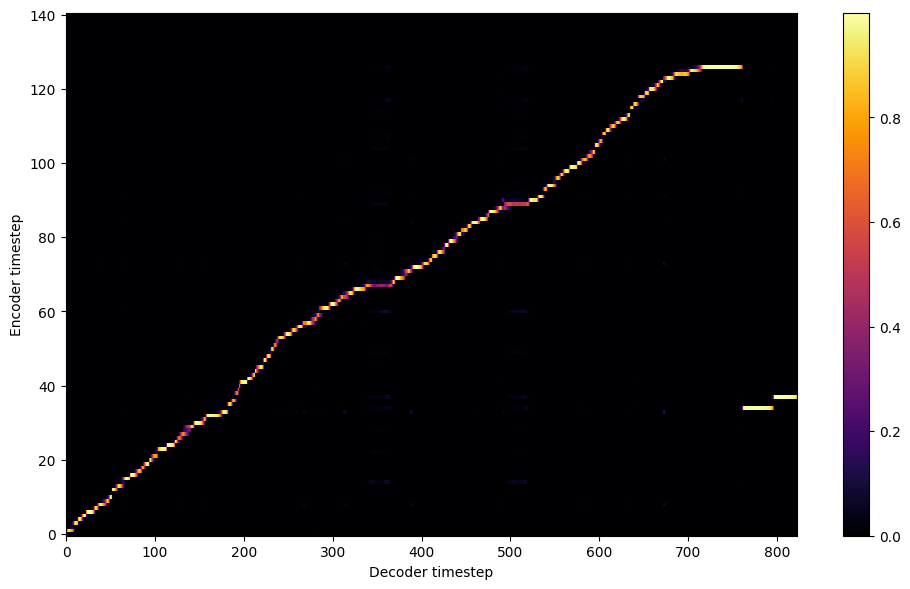

Saving model and optimizer state at iteration 630 to /content/drive/MyDrive/colab/outdir/TTS tacotron
Model Saved

Starting Epoch: 210 Iteration: 630


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 210 Validation loss 633:  0.120461  Time: 0.3m LR: 0.000300


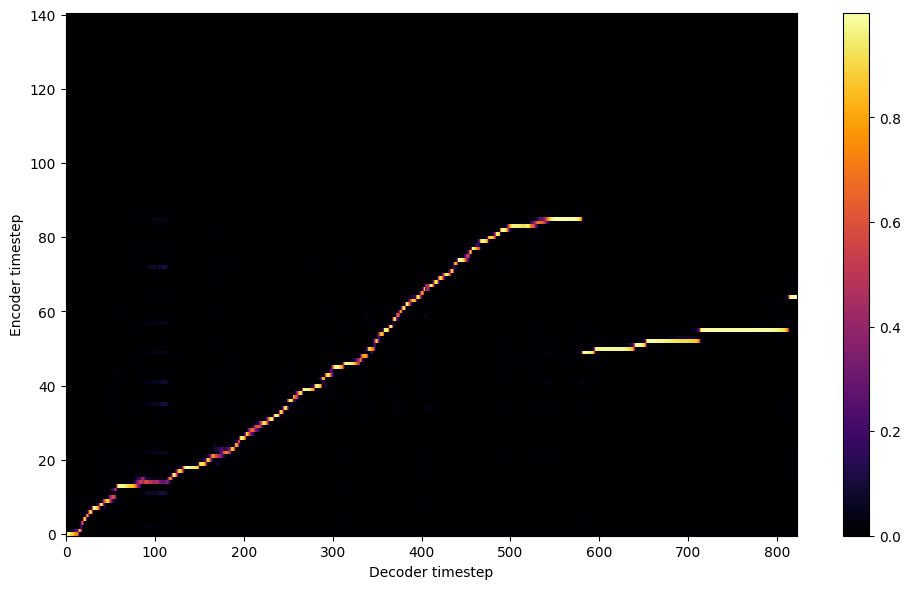


Starting Epoch: 211 Iteration: 633


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 211 Validation loss 636:  0.120237  Time: 0.3m LR: 0.000300


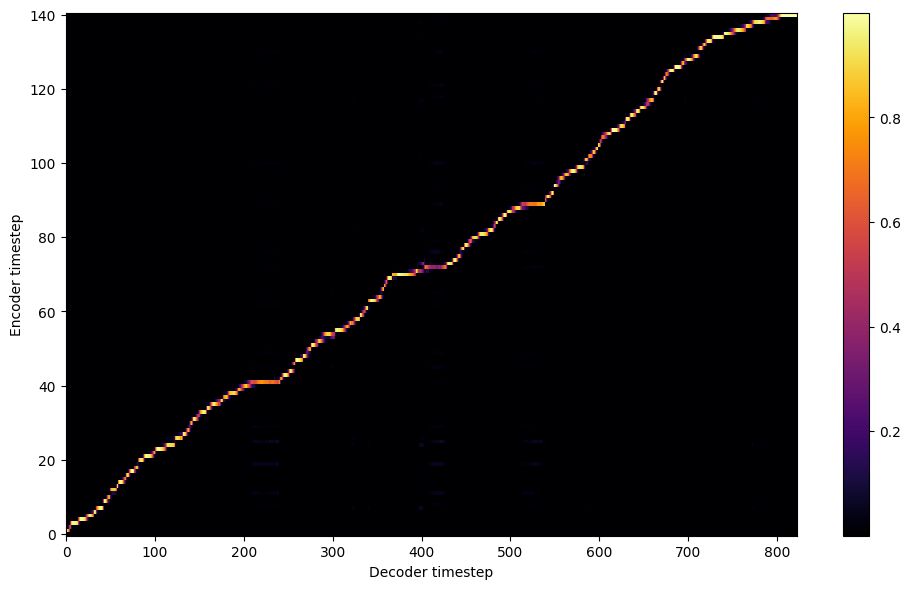


Starting Epoch: 212 Iteration: 636


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 212 Validation loss 639:  0.120354  Time: 0.3m LR: 0.000300


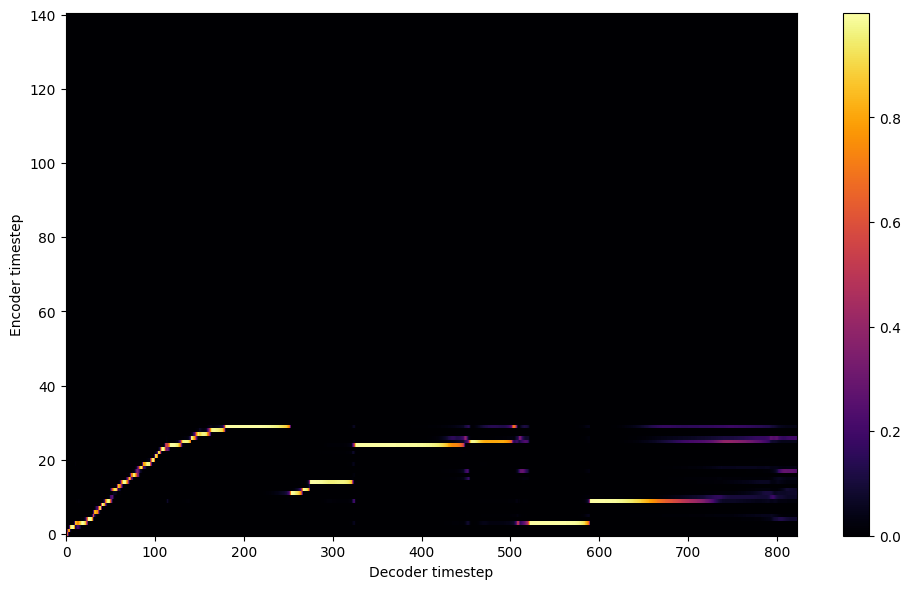


Starting Epoch: 213 Iteration: 639


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 213 Validation loss 642:  0.120038  Time: 0.3m LR: 0.000300


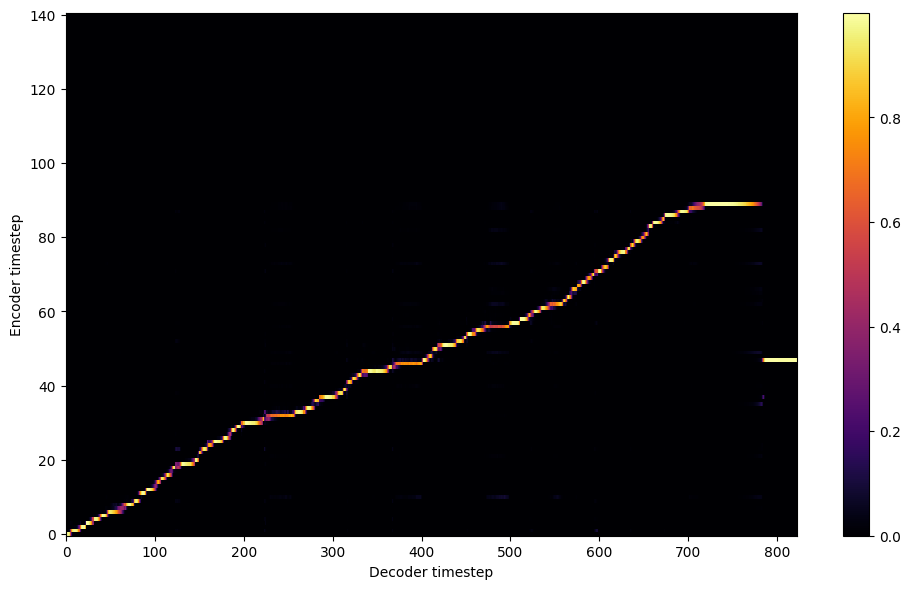


Starting Epoch: 214 Iteration: 642


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 214 Validation loss 645:  0.119743  Time: 0.3m LR: 0.000300


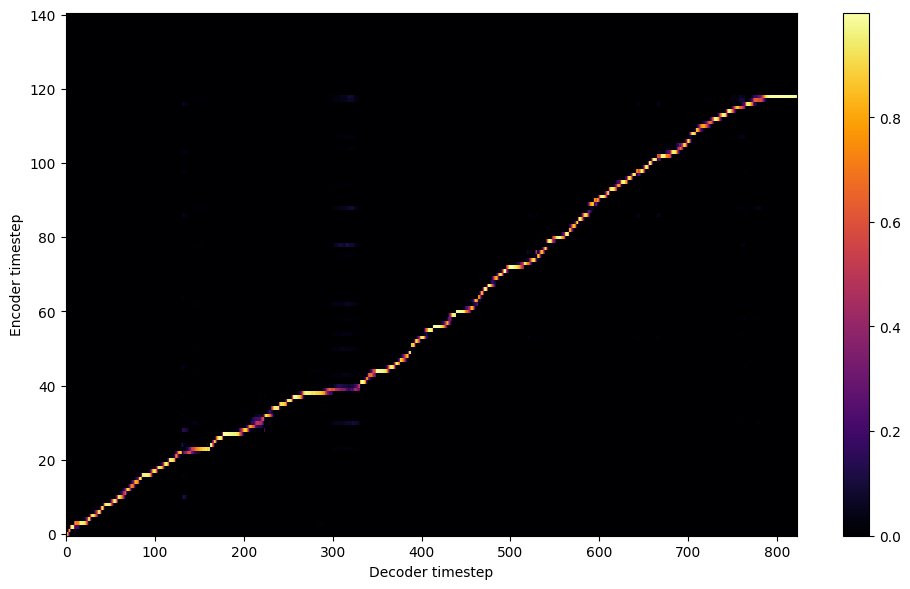


Starting Epoch: 215 Iteration: 645


  0%|          | 0/3 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

In [8]:

save_interval =  10

backup_interval =  -1

print('FP16 Run:', hparams.fp16_run)
print('Dynamic Loss Scaling:', hparams.dynamic_loss_scaling)
print('Distributed Run:', hparams.distributed_run)
print('cuDNN Enabled:', hparams.cudnn_enabled)
print('cuDNN Benchmark:', hparams.cudnn_benchmark)
train(output_directory, log_directory, checkpoint_path,
      warm_start, n_gpus, rank, group_name, hparams, log_directory2,
      save_interval, backup_interval)

Current Config:
pronounciation_dictionary: False
show_graphs: True
max_duration (in seconds): 20
stop_threshold: 0.5
superres_strength: 10


Enter/Paste your text.
--------------------------------------------------
hello world


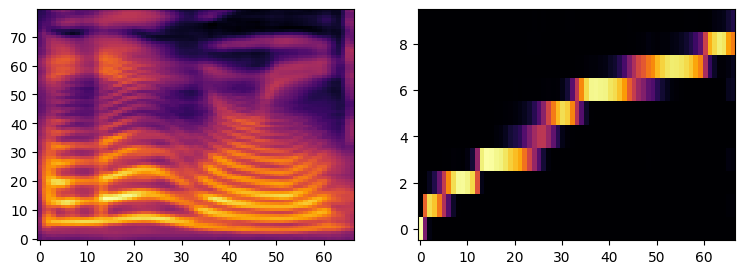

--------------------------------------------------
On June twenty-four Oswald applied in New Orleans for a passport stating that he planned to depart by ship.


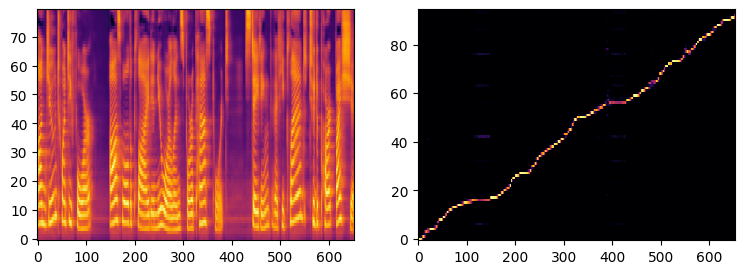

--------------------------------------------------
vighnesh punde maire


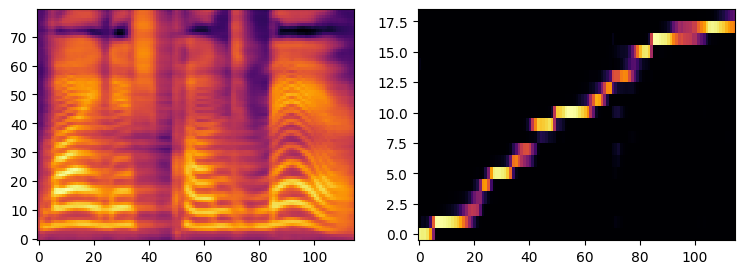

--------------------------------------------------
Hi im tony


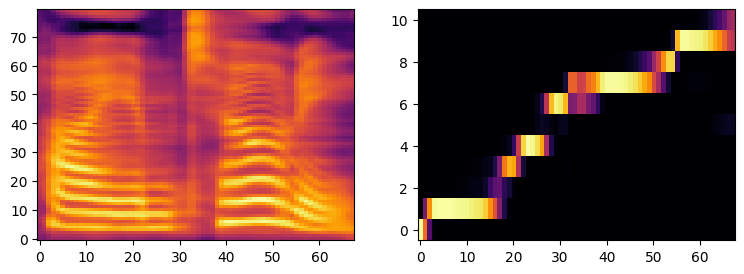

--------------------------------------------------
by anti-Castro Cubans while distributing leaflets on behalf of the Fair Play for Cuba Committee.


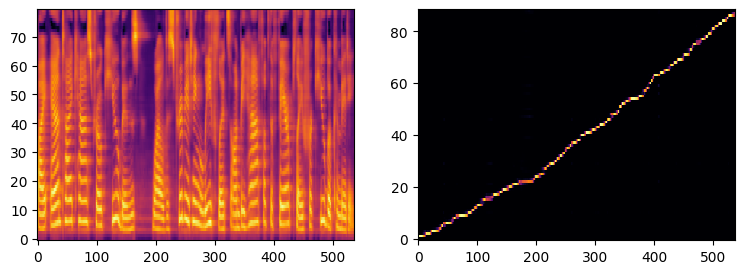

--------------------------------------------------
For although the Chinese took impressions from wood blocks engraved in relief for centuries before the woodcutters of the Netherlands.


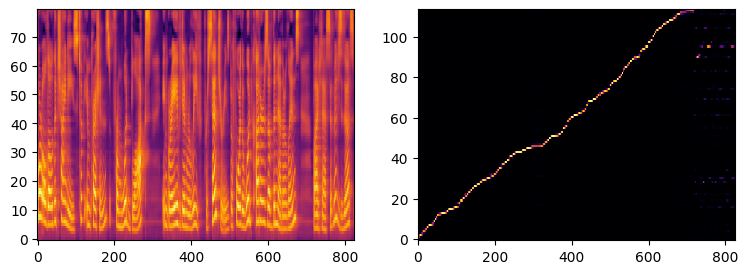

--------------------------------------------------
Printing then for our purpose may be considered as the art of making books by means of movable types.


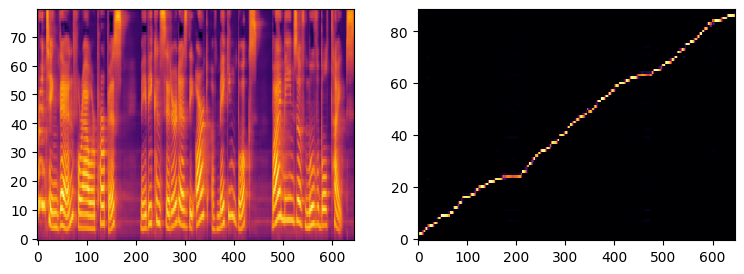

--------------------------------------------------


In [ ]:

import logging

logging.getLogger('matplotlib').setLevel(logging.WARNING)
logging.getLogger('numba').setLevel(logging.WARNING)
logging.getLogger('librosa').setLevel(logging.WARNING)


tacotron_id = "1--Q11mrawG7-K5WUzJtDdQOYPXlA6zPk"

hifigan_id = "universal"



if tacotron_id != "":
    TACOTRON2_ID = tacotron_id
else:
    raise Exception("No ID provided.")

if hifigan_id in {"", "universal"}:
    HIFIGAN_ID = "universal"
    print("Using universal Hifi-Gan model.")
else:
    HIFIGAN_ID = hifigan_id


try:
    initialized
except NameError:
    print("Setting up, please wait.\n")
    !pip install tqdm -q
    from tqdm.notebook import tqdm
    with tqdm(total=5, leave=False) as pbar:
        import os
        from os.path import exists, join, basename, splitext
        !pip install resampy
        !pip install git+https://github.com/wkentaro/gdown.git
        git_repo_url = 'https://github.com/justinjohn0306/TTS-TT2.git'
        project_name = splitext(basename(git_repo_url))[0]
        if not exists(project_name):
            # clone and install
            !git clone -q --recursive {git_repo_url}
            !git clone -q --recursive https://github.com/justinjohn0306/hifi-gan
            !pip install -q unidecode
        pbar.update(1) # downloaded TT2 and HiFi-GAN
        import sys
        sys.path.append('hifi-gan')
        sys.path.append(project_name)
        import time
        import matplotlib
        import matplotlib.pylab as plt
        import gdown
        d = 'https://drive.google.com/uc?id='

        %matplotlib inline
        import IPython.display as ipd
        import numpy as np
        import torch
        import json
        from hparams import create_hparams
        from model import Tacotron2
        from layers import TacotronSTFT
        from audio_processing import griffin_lim
        from text import text_to_sequence
        from env import AttrDict
        from meldataset import mel_spectrogram, MAX_WAV_VALUE
        from models import Generator
        from denoiser import Denoiser
        import resampy
        import scipy.signal

        pbar.update(1) # initialized Dependancies

        graph_width = 900
        graph_height = 360
        def plot_data(data, figsize=(int(graph_width/100), int(graph_height/100))):
            %matplotlib inline
            fig, axes = plt.subplots(1, len(data), figsize=figsize)
            for i in range(len(data)):
                axes[i].imshow(data[i], aspect='auto', origin='lower',
                            interpolation='none', cmap='inferno')
            fig.canvas.draw()
            plt.show()

        # Setup Pronounciation Dictionary
        !wget 'https://github.com/justinjohn0306/FakeYou-Tacotron2-Notebook/releases/download/CMU_dict/merged.dict.txt'
        thisdict = {}
        for line in reversed((open('merged.dict.txt', "r").read()).splitlines()):
            thisdict[(line.split(" ",1))[0]] = (line.split(" ",1))[1].strip()

        pbar.update(1) # Downloaded and Set up Pronounciation Dictionary

        def ARPA(text, punctuation=r"!?,.;", EOS_Token=True):
            out = ''
            for word_ in text.split(" "):
                word=word_; end_chars = ''
                while any(elem in word for elem in punctuation) and len(word) > 1:
                    if word[-1] in punctuation: end_chars = word[-1] + end_chars; word = word[:-1]
                    else: break
                try:
                    word_arpa = thisdict[word.upper()]
                    word = "{" + str(word_arpa) + "}"
                except KeyError: pass
                out = (out + " " + word + end_chars).strip()
            if EOS_Token and out[-1] != ";": out += ";"
            return out

        def get_hifigan(MODEL_ID, conf_name):
            # Download HiFi-GAN
            hifigan_pretrained_model = 'hifimodel_' + conf_name
            #gdown.download(d+MODEL_ID, hifigan_pretrained_model, quiet=False)

            if MODEL_ID == 1:
              !wget "https://github.com/justinjohn0306/tacotron2/releases/download/assets/Superres_Twilight_33000" -O $hifigan_pretrained_model
            elif MODEL_ID == "universal":
              !wget "https://github.com/justinjohn0306/tacotron2/releases/download/assets/g_02500000" -O $hifigan_pretrained_model
            else:
              gdown.download(d+MODEL_ID, hifigan_pretrained_model, quiet=False)

            # Load HiFi-GAN
            conf = os.path.join("hifi-gan", conf_name + ".json")
            with open(conf) as f:
                json_config = json.loads(f.read())
            h = AttrDict(json_config)
            torch.manual_seed(h.seed)
            hifigan = Generator(h).to(torch.device("cuda"))
            state_dict_g = torch.load(hifigan_pretrained_model, map_location=torch.device("cuda"))
            hifigan.load_state_dict(state_dict_g["generator"])
            hifigan.eval()
            hifigan.remove_weight_norm()
            denoiser = Denoiser(hifigan, mode="normal")
            return hifigan, h, denoiser

        # Download character HiFi-GAN
        hifigan, h, denoiser = get_hifigan(HIFIGAN_ID, "config_v1")
        # Download super-resolution HiFi-GAN
        hifigan_sr, h2, denoiser_sr = get_hifigan(1, "config_32k")
        pbar.update(1) # Downloaded and Set up HiFi-GAN

        def has_MMI(STATE_DICT):
            return any(True for x in STATE_DICT.keys() if "mi." in x)

        def get_Tactron2(MODEL_ID):
            # Download Tacotron2
            tacotron2_pretrained_model = 'MLPTTS'
            gdown.download(d+MODEL_ID, tacotron2_pretrained_model, quiet=False)
            if not exists(tacotron2_pretrained_model):
                raise Exception("Tacotron2 model failed to download!")
            # Load Tacotron2 and Config
            hparams = create_hparams()
            hparams.sampling_rate = 22050
            hparams.max_decoder_steps = 3000 # Max Duration
            hparams.gate_threshold = 0.25 # Model must be 25% sure the clip is over before ending generation
            model = Tacotron2(hparams)
            state_dict = torch.load(tacotron2_pretrained_model)['state_dict']
            if has_MMI(state_dict):
                raise Exception("ERROR: This notebook does not currently support MMI models.")
            model.load_state_dict(state_dict)
            _ = model.cuda().eval().half()
            return model, hparams

        model, hparams = get_Tactron2(TACOTRON2_ID)
        previous_tt2_id = TACOTRON2_ID

        pbar.update(1) # Downloaded and Set up Tacotron2

        # Extra Info
        def end_to_end_infer(text, pronounciation_dictionary, show_graphs):
            for i in [x for x in text.split("\n") if len(x)]:
                if not pronounciation_dictionary:
                    if i[-1] != ";": i=i+";"
                else: i = ARPA(i)
                with torch.no_grad(): # save VRAM by not including gradients
                    sequence = np.array(text_to_sequence(i, ['english_cleaners']))[None, :]
                    sequence = torch.autograd.Variable(torch.from_numpy(sequence)).cuda().long()
                    mel_outputs, mel_outputs_postnet, _, alignments = model.inference(sequence)
                    if show_graphs:
                        plot_data((mel_outputs_postnet.float().data.cpu().numpy()[0],
                                alignments.float().data.cpu().numpy()[0].T))
                    y_g_hat = hifigan(mel_outputs_postnet.float())
                    audio = y_g_hat.squeeze()
                    audio = audio * MAX_WAV_VALUE
                    audio_denoised = denoiser(audio.view(1, -1), strength=35)[:, 0]

                    # Resample to 32k
                    audio_denoised = audio_denoised.cpu().numpy().reshape(-1)

                    normalize = (MAX_WAV_VALUE / np.max(np.abs(audio_denoised))) ** 0.9
                    audio_denoised = audio_denoised * normalize
                    wave = resampy.resample(
                        audio_denoised,
                        h.sampling_rate,
                        h2.sampling_rate,
                        filter="sinc_window",
                        window=scipy.signal.windows.hann,
                        num_zeros=8,
                    )
                    wave_out = wave.astype(np.int16)

                    # HiFi-GAN super-resolution
                    wave = wave / MAX_WAV_VALUE
                    wave = torch.FloatTensor(wave).to(torch.device("cuda"))
                    new_mel = mel_spectrogram(
                        wave.unsqueeze(0),
                        h2.n_fft,
                        h2.num_mels,
                        h2.sampling_rate,
                        h2.hop_size,
                        h2.win_size,
                        h2.fmin,
                        h2.fmax,
                    )
                    y_g_hat2 = hifigan_sr(new_mel)
                    audio2 = y_g_hat2.squeeze()
                    audio2 = audio2 * MAX_WAV_VALUE
                    audio2_denoised = denoiser(audio2.view(1, -1), strength=35)[:, 0]

                    # High-pass filter, mixing and denormalizing
                    audio2_denoised = audio2_denoised.cpu().numpy().reshape(-1)
                    b = scipy.signal.firwin(
                        101, cutoff=10500, fs=h2.sampling_rate, pass_zero=False
                    )
                    y = scipy.signal.lfilter(b, [1.0], audio2_denoised)
                    y *= superres_strength
                    y_out = y.astype(np.int16)
                    y_padded = np.zeros(wave_out.shape)
                    y_padded[: y_out.shape[0]] = y_out
                    sr_mix = wave_out + y_padded
                    sr_mix = sr_mix / normalize

                    print("")
                    ipd.display(ipd.Audio(sr_mix.astype(np.int16), rate=h2.sampling_rate))
    from IPython.display import clear_output
    clear_output()
    initialized = "Ready"

if previous_tt2_id != TACOTRON2_ID:
    print("Updating Models")
    model, hparams = get_Tactron2(TACOTRON2_ID)
    hifigan, h, denoiser = get_hifigan(HIFIGAN_ID, "config_v1")
    previous_tt2_id = TACOTRON2_ID

pronounciation_dictionary = False
# disables automatic ARPAbet conversion, useful for inputting your own ARPAbet pronounciations or just for testing
show_graphs = True
max_duration = 20
model.decoder.max_decoder_steps = max_duration * 80
stop_threshold = 0.5
model.decoder.gate_threshold = stop_threshold
superres_strength = 10


print(f"Current Config:\npronounciation_dictionary: {pronounciation_dictionary}\nshow_graphs: {show_graphs}\nmax_duration (in seconds): {max_duration}\nstop_threshold: {stop_threshold}\nsuperres_strength: {superres_strength}\n\n")

time.sleep(1)
print("Enter/Paste your text.")
contents = []
while True:
    try:
        print("-"*50)
        line = input()
        if line == "":
            continue
        end_to_end_infer(line, not pronounciation_dictionary, show_graphs)
    except EOFError:
        break
    except KeyboardInterrupt:
        print("Stopping...")
        break